In [2]:
import numpy as np
from glob import glob
import matplotlib.pyplot as plt 

# Stave 11

## Side L

In [3]:
L11temps = []
L11flow = []
for filename in sorted(glob("../Stave13_RaisedCore_Lowflow_v2_LS_CERN_L_*.npz")):
    
    f = np.load(filename)
    L11flowtime = f["flow_times"][-1]
    L11flowdata = np.median(f["flow_data"][-5:])
    L11flow.append([L11flowtime, L11flowdata])
    L11thermtime = f["thermo_times"][-1]
    L11thermdata = list(f["thermo_data"][-1])
    L11temps.append([L11thermtime]+L11thermdata)
    #print(filename)

L11temps = np.array(L11temps)
L11flow = np.array(L11flow)
print(L11temps.shape)
print(L11flow.shape)

(32, 7)
(32, 2)


<Figure size 640x480 with 0 Axes>

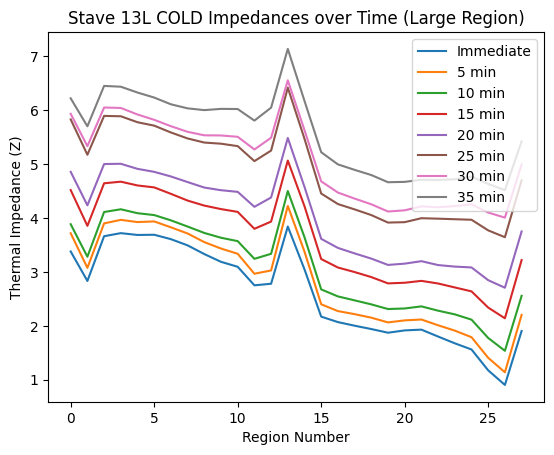

<Figure size 640x480 with 0 Axes>

In [4]:
L13_hot1_goavg = [] #large region top
L13_hot1 = [] #large region top
L13_cold1_goavg = []
L13_cold1 = [] #large region top
L13_hot2_goavg = [] #large region top
L13_hot2 = [] #large region top
L13_cold2_goavg = []
L13_cold2 = []

for filename in sorted(glob("output/Stave13_RaisedCore_Lowflow_v2_LS_CERN_L_*_IMPEDANCES.csv")):
    index = int(filename.split("_")[-2])
####SWITCH BACK WHEN DOING ANYTHING BUT AVERAGEs
    #if index >= 8 and index <16:
     #   L13_hot1.append(np.loadtxt(filename, delimiter=',', 
    #    usecols=[1,2], max_rows=28, skiprows=1))
    if index >= -1 and index< 8:
        L13_cold1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))
    #if index >= 24 and index <32:
     #   L13_hot2.append(np.loadtxt(filename, delimiter=',', 
      #  usecols=[1,2], max_rows=28, skiprows=1))
    #if index >= 16 and index< 24:
        #L13_cold2.append(np.loadtxt(filename, delimiter=',', 
        #usecols=[1,2], max_rows=28, skiprows=1))

    #if index >= 8 and index <16:
     #   L13_hot1_goavg.append(np.loadtxt(filename, delimiter=',', 
      #  usecols=[0,1], max_rows=28, skiprows=1))
    if index >=-1 and index < 8:
        L13_cold1_goavg.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))
    #if index >= 24 and index <32:
     #   L13_hot2_goavg.append(np.loadtxt(filename, delimiter=',', 
      #  usecols=[0,1], max_rows=28, skiprows=1))
    #if index >=16 and index < 24:
     #   L13_cold2_goavg.append(np.loadtxt(filename, delimiter=',', 
      #  usecols=[0,1], max_rows=28, skiprows=1))


#L11_hot = np.stack(L11_hot, axis=0)
#L11_hot_swap = np.swapaxes(L11_hot, 0, 1)
L13_cold1 = np.stack(L13_cold1, axis=0)
L13_cold1_swap = np.swapaxes(L13_cold1, 0, 1)



#L11_hot_goavg = np.stack(L11_hot_goavg, axis=0)
#L11_hot_goavg_swap = np.swapaxes(L11_hot_goavg, 0, 1)
L13_cold1_goavg = np.stack(L13_cold1_goavg, axis=0)
L13_cold1_goavg_swap = np.swapaxes(L13_cold1_goavg, 0, 1)



#print(L11_hot_swap)


#arr_L11_hot_goavg_swap = np.array(L11_hot_goavg_swap)
#arr_L11_cold_goavg_swap = np.array(L11_cold_goavg_swap)

#L11_hot_avg = (arr_L11_hot_goavg_swap)/1



#L11_cold_avg = (arr_L11_cold_goavg_swap)/1


#arr_L11_hot_goavg = np.array(L11_hot_goavg)
arr_L13_cold1_goavg = np.array(L13_cold1_goavg)

#L11_hot_avg = (arr_L11_hot_goavg)/1



L13_cold1_avg = (arr_L13_cold1_goavg)/1


plt.plot(L13_cold1_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L COLD Impedances over Time (Large Region)")
plt.figure()
#plt.plot(L11_hot_swap[:,:,0])
#plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
#plt.xlabel("Region Number")
#plt.ylabel("Thermal Impedance (Z)")
#plt.title("Stave 11L HOT Impedances over Time (Large Region)")

Text(0.5, 1.0, 'Stave 11L COLD Inlet/Outlet Temp over Time')

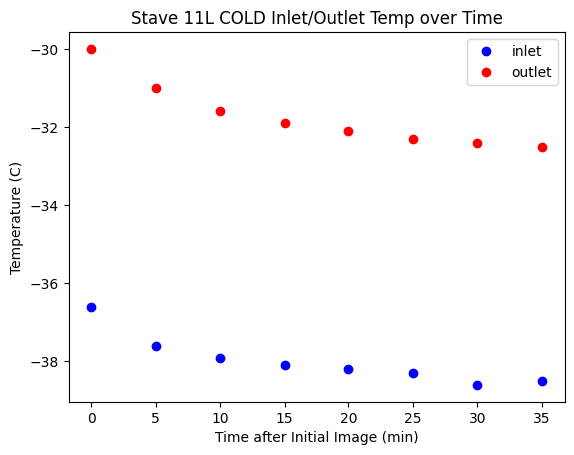

In [5]:
#plt.plot(L11temps[:8,0],L11temps[:8,4],'o')
#plt.plot(L11temps[:8,0],L11temps[:8,3],'o')


plt.plot(
    L11temps[:8,0],L11temps[:8,3], 'bo',
    L11temps[:8,0],L11temps[:8,4],'ro',
)
plt.legend(['inlet', 'outlet'])

xticks = ['0','5','10','15','20','25','30', '35']
plt.xticks(L11temps[:8,0],xticks)

plt.xlabel("Time after Initial Image (min)")
plt.ylabel("Temperature (C)")

plt.title("Stave 11L COLD Inlet/Outlet Temp over Time")


Text(0.5, 1.0, 'Stave 11L COLD Inlet/Outlet Temp Difference over Time')

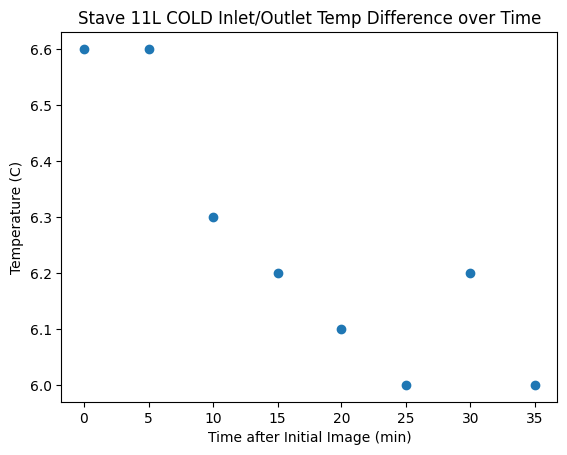

In [6]:
plt.plot(L11temps[:8,0],L11temps[:8,4]-L11temps[:8,3],'o')
xticks = ['0','5','10','15','20','25','30', '35']
plt.xticks(L11temps[:8,0],xticks)
plt.xlabel("Time after Initial Image (min)")
plt.ylabel("Temperature (C)")
plt.title("Stave 11L COLD Inlet/Outlet Temp Difference over Time")

ValueError: The number of FixedLocator locations (24), usually from a call to set_ticks, does not match the number of labels (8).

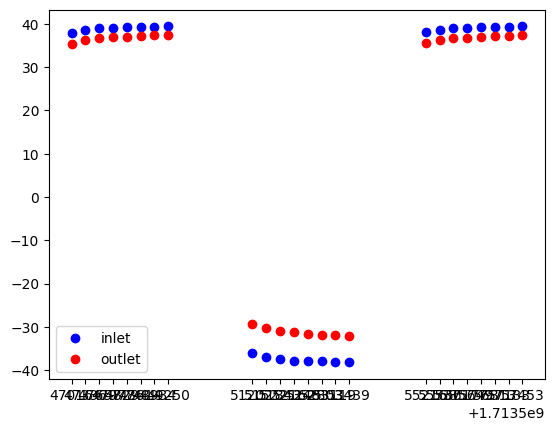

In [7]:
#plt.plot(L11temps[8:,0],L11temps[8:,4],'o')
#plt.plot(L11temps[8:,0],L11temps[8:,3],'o')
#plt.title("Stave 11L HOT Inlet/Outlet Temp over Time")



plt.plot(
    L11temps[8:,0],L11temps[8:,3], 'bo',
    L11temps[8:,0],L11temps[8:,4],'ro',
)
plt.legend(['inlet', 'outlet'])
xticks = ['0','5','10','15','20','25','30', '35']
plt.xticks(L11temps[8:,0],xticks)

plt.xlabel("Time after Initial Image (min)")
plt.ylabel("Temperature (C)")

plt.title("Stave 11L HOT Inlet/Outlet Temp over Time")

Text(0.5, 1.0, 'Stave 11L HOT Inlet/Outlet Temp Difference over Time')

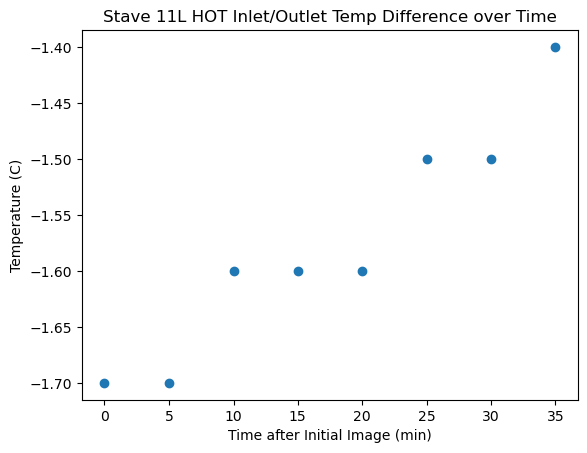

In [ ]:
plt.plot(L11temps[8:,0],L11temps[8:,4]-L11temps[8:,3],'o')
xticks = ['0','5','10','15','20','25','30', '35']
plt.xticks(L11temps[8:,0],xticks)

plt.xlabel("Time after Initial Image (min)")
plt.ylabel("Temperature (C)")
plt.title("Stave 11L HOT Inlet/Outlet Temp Difference over Time")

ValueError: The number of FixedLocator locations (24), usually from a call to set_ticks, does not match the number of labels (8).

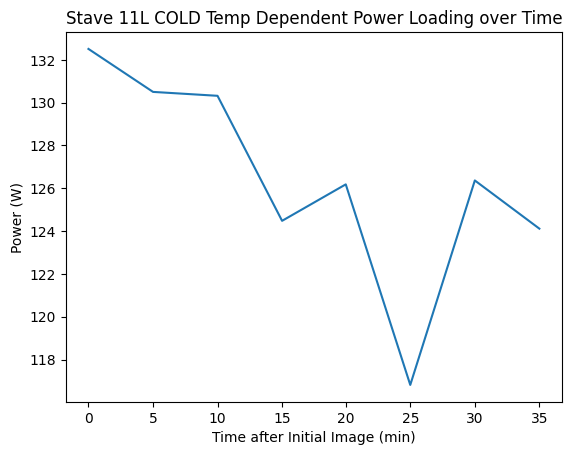

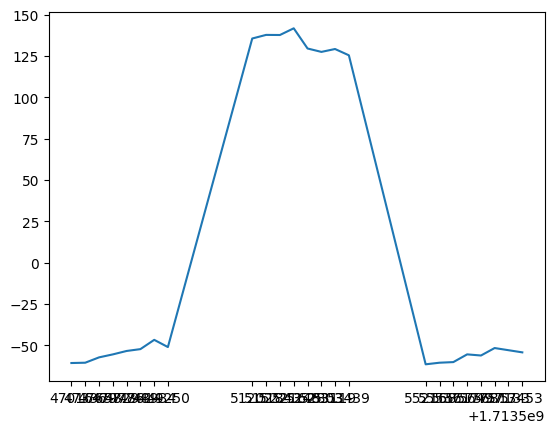

In [8]:
#L11tempdiff = L11temps[8:,4]-L11temps[8:,3]

L11power_cold = ((1614/60)*1063*L11flow[:8,1]*(L11temps[:8,4]-L11temps[:8,3]))/1000
#L11power_cold = ((1614/60)*1063*L11flow[:8,1]*L11tempdiff)/1000
#L11power_hot = ((1448/60)*1213*flow[8:,1]*L11tempdiff)/1000
L11power_hot = ((1448/60)*1213*L11flow[8:,1]*(L11temps[8:,4]-L11temps[8:,3]))/1000

plt.plot(L11temps[:8,0], L11power_cold)
xticks = ['0','5','10','15','20','25','30', '35']
plt.xticks(L11temps[:8,0],xticks)
plt.xlabel("Time after Initial Image (min)")
plt.title("Stave 11L COLD Temp Dependent Power Loading over Time")
plt.ylabel("Power (W)")
plt.figure()

plt.plot(L11temps[8:,0], L11power_hot)
xticks = ['0','5','10','15','20','25','30', '35']
plt.xticks(L11temps[8:,0],xticks)
plt.xlabel("Time after Initial Image (min)")
plt.ylabel("Power (W)")
plt.title("Stave 11L HOT Temp Dependent Power Loading over Time")

In [9]:
plt.plot(L11_cold_swap[14,:,0], L11power_cold/L11power_cold.max())
plt.plot(L11_hot_swap[14,:,0], abs(L11power_hot/L11power_hot.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 11L Power Load vs Impedance")

NameError: name 'L11_cold_swap' is not defined

In [10]:
plt.plot(L11temps[:8,0]-L11temps[:8,0].min(), L11_cold_swap[14,:,0])
plt.plot(L11temps[8:,0]-L11temps[8:,0].min(), L11_hot_swap[14,:,0])
plt.legend(['cold', 'hot'])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 11L Impedance vs Time")

NameError: name 'L11_cold_swap' is not defined

## Side J

In [11]:
J11temps = []
J11flow = []
for filename in sorted(glob("../Stave11_NewCamera_LS_CERN_J_*_fixed.npz")):
    
    f = np.load(filename)
    J11flowtime = f["flow_times"][-1]
    J11flowdata = np.median(f["flow_data"][-5:])
    J11flow.append([J11flowtime, J11flowdata])
    J11thermtime = f["thermo_times"][-1]
    J11thermdata = list(f["thermo_data"][-1])
    J11temps.append([J11thermtime]+J11thermdata)


J11temps = np.array(J11temps)
J11flow = np.array(J11flow)
#print(J11temps)
#print(J11flow.shape)
#0: time. 1: set point. 2: res temp. 3: inlet temp. 4: outlet temp. 5: box temp. 6: room temp

[[[ 0.          3.9894515 ]
  [ 1.          3.87546303]
  [ 2.          4.7592589 ]
  [ 3.          4.76768951]
  [ 4.          4.83333991]
  [ 5.          4.82945434]
  [ 6.          4.76588828]
  [ 7.          4.74003585]
  [ 8.          4.75236923]
  [ 9.          4.81898792]
  [10.          4.79170845]
  [11.          4.78007951]
  [12.          4.90054326]
  [13.          5.27672411]
  [14.          4.66681889]
  [15.          3.86124612]
  [16.          3.50254754]
  [17.          3.43044169]
  [18.          3.33618445]
  [19.          3.29569761]
  [20.          3.35858718]
  [21.          3.41236349]
  [22.          3.45025298]
  [23.          3.43657432]
  [24.          3.53077663]
  [25.          3.60605342]
  [26.          3.62664543]
  [27.          4.20133556]]

 [[ 0.          3.85825897]
  [ 1.          3.741788  ]
  [ 2.          4.61870345]
  [ 3.          4.65587523]
  [ 4.          4.70522277]
  [ 5.          4.73946699]
  [ 6.          4.660066  ]
  [ 7.          4.

Text(0.5, 1.0, 'Stave 11J HOT Impedances over Time (Large Region) All Cycles')

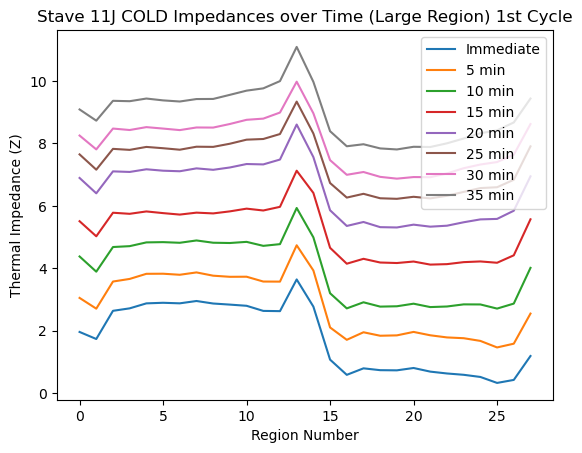

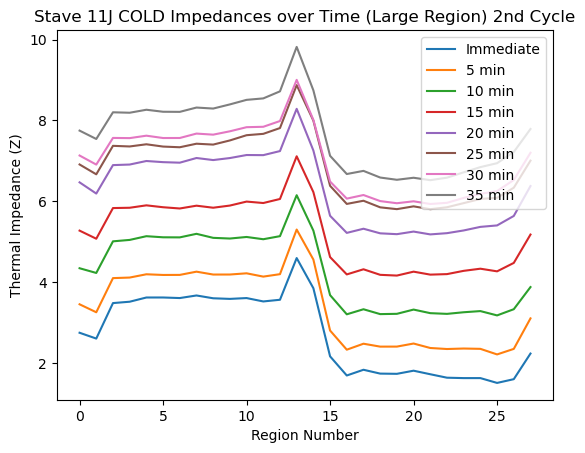

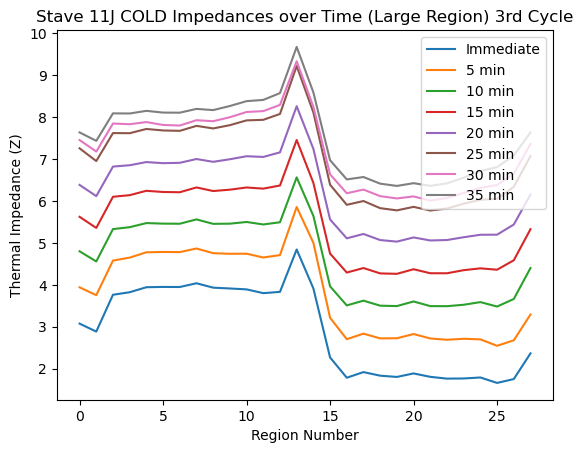

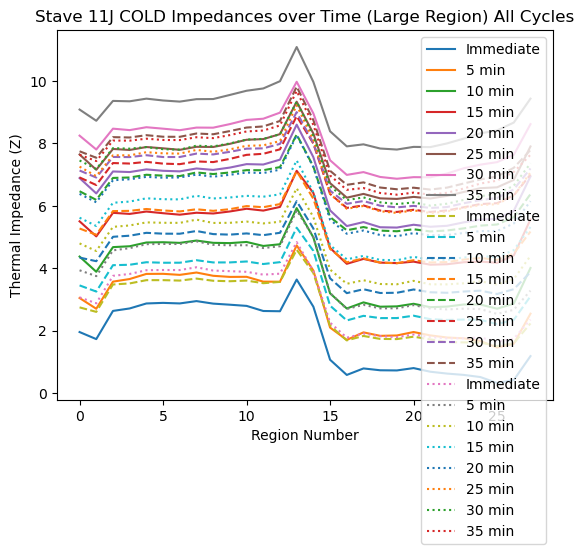

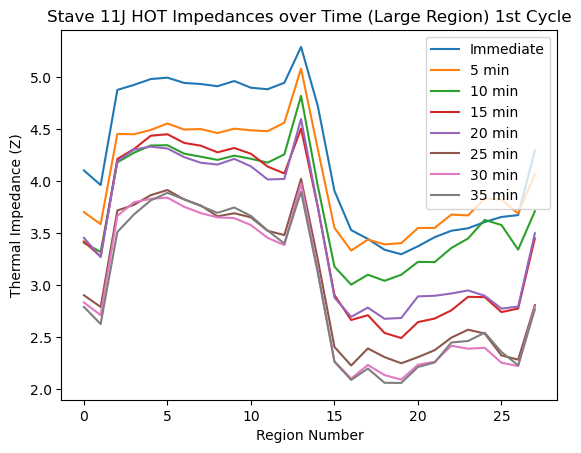

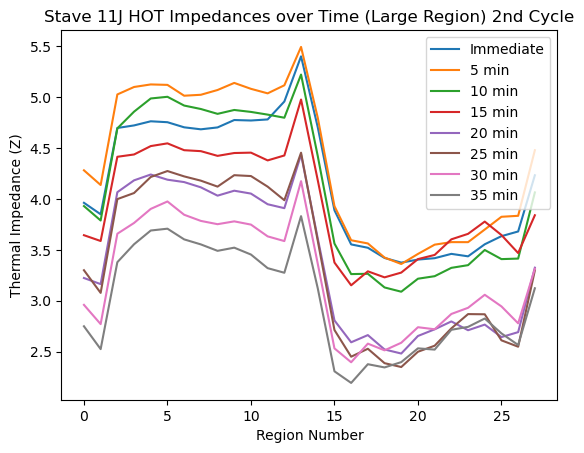

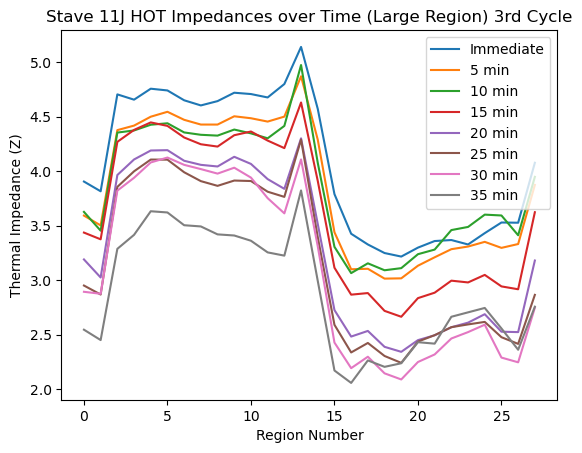

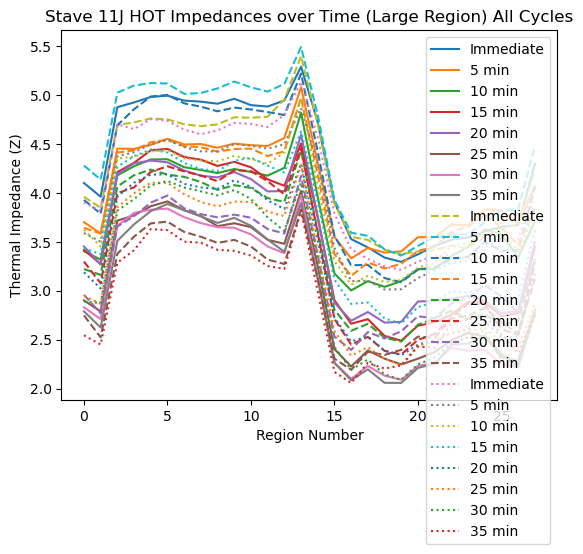

In [12]:
J11_hot_1 = [] #large region top
J11_cold_1 = [] #large region top
J11_hot_2 = [] #large region top
J11_cold_2 = [] #large region top
J11_hot_3 = [] #large region top
J11_cold_3 = [] #large region top
J11_cold_all_swap = []
J11_cold_all = []
J11_hot_all_swap = []
J11_hot_all = []

J11_hot_goavg_1 = [] #large region top
J11_cold_goavg_1 = [] #large region top
J11_hot_goavg_2 = [] #large region top
J11_cold_goavg_2 = [] #large region top
J11_hot_goavg_3 = [] #large region top
J11_cold_goavg_3 = []


for filename in sorted(glob("output/Stave11J/Stave11_NewCamera_LS_CERN_J_*_fixed_IMPEDANCES.csv")):
    index = int(filename.split("_")[-3])
#USE BELOW FOR EVERYTHING EXCEPT AVERAGES

    if (index >=8 and index <16):
        J11_hot_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
        J11_hot_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=40 and index <48):
        J11_hot_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))
    
    if (index <8):
        J11_cold_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
        J11_cold_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=32 and index <40):  
        J11_cold_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))



    if (index >=8 and index <16):
        J11_hot_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
        J11_hot_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=40 and index <48):
    #if (index >=8 and index <16) or (index >=24 and index <32) or (index >=40 and index <48):
        J11_hot_goavg_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))
    
    if (index <8):
    #if (index >=16 and index <24):
    #if (index >=32 and index <40):  
    #if (index <8) or (index >=16 and index <24) or (index >=32 and index <40):
        J11_cold_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
        J11_cold_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=32 and index <40):  
    #if (index <8) or (index >=16 and index <24) or (index >=32 and index <40):
        J11_cold_goavg_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

J11_hot_1 = np.stack(J11_hot_1, axis=0)
J11_hot_swap_1 = np.swapaxes(J11_hot_1, 0, 1)
J11_cold_1 = np.stack(J11_cold_1, axis=0)
J11_cold_swap_1 = np.swapaxes(J11_cold_1, 0, 1)

J11_hot_2 = np.stack(J11_hot_2, axis=0)
J11_hot_swap_2 = np.swapaxes(J11_hot_2, 0, 1)
J11_cold_2 = np.stack(J11_cold_2, axis=0)
J11_cold_swap_2 = np.swapaxes(J11_cold_2, 0, 1)

J11_hot_3 = np.stack(J11_hot_3, axis=0)
J11_hot_swap_3 = np.swapaxes(J11_hot_3, 0, 1)
J11_cold_3 = np.stack(J11_cold_3, axis=0)
J11_cold_swap_3 = np.swapaxes(J11_cold_3, 0, 1)

J11_cold_all = np.concatenate((J11_cold_1,J11_cold_2,J11_cold_3), axis = 0)
J11_hot_all =J11_hot_all_swap = np.concatenate((J11_hot_1,J11_hot_2,J11_hot_3), axis = 0)
J11_cold_all_swap = np.concatenate((J11_cold_swap_1,J11_cold_swap_2,J11_cold_swap_3), axis = 0)
J11_hot_all_swap = np.concatenate((J11_hot_swap_1,J11_hot_swap_2,J11_hot_swap_3), axis = 0)


J11_hot_goavg_1 = np.stack(J11_hot_goavg_1, axis=0)
J11_hot_goavg_swap_1 = np.swapaxes(J11_hot_goavg_1, 0, 1)
J11_cold_goavg_1 = np.stack(J11_cold_goavg_1, axis=0)
J11_cold_goavg_swap_1 = np.swapaxes(J11_cold_goavg_1, 0, 1)

J11_hot_goavg_2 = np.stack(J11_hot_goavg_2, axis=0)
J11_hot_goavg_swap_2 = np.swapaxes(J11_hot_goavg_2, 0, 1)
J11_cold_goavg_2 = np.stack(J11_cold_goavg_2, axis=0)
J11_cold_goavg_swap_2 = np.swapaxes(J11_cold_goavg_2, 0, 1)

J11_hot_goavg_3 = np.stack(J11_hot_goavg_3, axis=0)
J11_hot_goavg_swap_3 = np.swapaxes(J11_hot_goavg_3, 0, 1)
J11_cold_goavg_3 = np.stack(J11_cold_goavg_3, axis=0)
J11_cold_goavg_swap_3 = np.swapaxes(J11_cold_goavg_3, 0, 1)



arr_J11_hot_goavg_1 = np.array(J11_hot_goavg_1)
arr_J11_hot_goavg_2 = np.array(J11_hot_goavg_2)
arr_J11_hot_goavg_3 = np.array(J11_hot_goavg_3)
arr_J11_cold_goavg_1 = np.array(J11_cold_goavg_1)
arr_J11_cold_goavg_2 = np.array(J11_cold_goavg_2)
arr_J11_cold_goavg_3 = np.array(J11_cold_goavg_3)


J11_hot_avg = (arr_J11_hot_goavg_1+arr_J11_hot_goavg_2+arr_J11_hot_goavg_3)/3
print(J11_hot_avg)

J11_cold_avg = (arr_J11_cold_goavg_1+arr_J11_cold_goavg_2+arr_J11_cold_goavg_3)/3



plt.plot(J11_cold_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 11J COLD Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(J11_cold_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 11J COLD Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(J11_cold_swap_3[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 11J COLD Impedances over Time (Large Region) 3rd Cycle")
plt.figure()

plt.plot(J11_cold_swap_1[:,:,0])
plt.plot(J11_cold_swap_2[:,:,0], linestyle='dashed')
plt.plot(J11_cold_swap_3[:,:,0], linestyle='dotted')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 11J COLD Impedances over Time (Large Region) All Cycles")
plt.figure()

plt.plot(J11_hot_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 11J HOT Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(J11_hot_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 11J HOT Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(J11_hot_swap_3[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 11J HOT Impedances over Time (Large Region) 3rd Cycle")
plt.figure()

plt.plot(J11_hot_swap_1[:,:,0])
plt.plot(J11_hot_swap_2[:,:,0], linestyle='dashed')
plt.plot(J11_hot_swap_3[:,:,0], linestyle='dotted')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 11J HOT Impedances over Time (Large Region) All Cycles")

Text(0.5, 1.0, 'Stave 11J COLD Inlet/Outlet Temp over Time All Cycles')

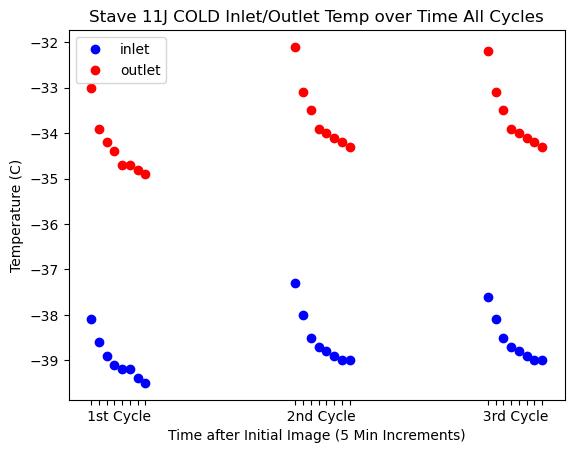

In [13]:
#plt.plot(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4], 'o')
#plt.plot(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3], 'o')

plt.plot(
    
    J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3],'bo',

    J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4], 'ro',
)
plt.legend(['inlet', 'outlet'])

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', ' ', ' ', ' ','  ',' ',' ','  2nd Cycle ',' ',' ',' ', ' ', '',' ',' ','  3rd Cycle','',' ',' ',' ']
plt.xticks(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 11J COLD Inlet/Outlet Temp over Time All Cycles")

Text(0.5, 1.0, 'Stave 11J COLD Inlet/Outlet Temp Difference over Time All Cycles')

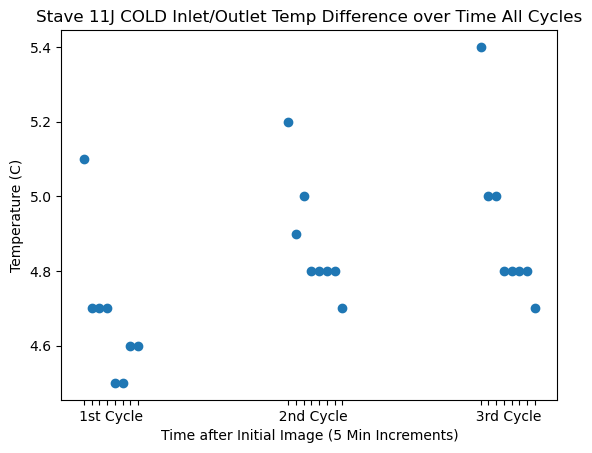

In [14]:
plt.plot(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3], 'o')

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', ' ', ' ', ' ','  ',' ',' ','  2nd Cycle ',' ',' ',' ', ' ', '',' ',' ','  3rd Cycle','',' ',' ',' ']
plt.xticks(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 11J COLD Inlet/Outlet Temp Difference over Time All Cycles")

Text(0.5, 1.0, 'Stave 11J HOT Inlet/Outlet Temp over Time All Cycles')

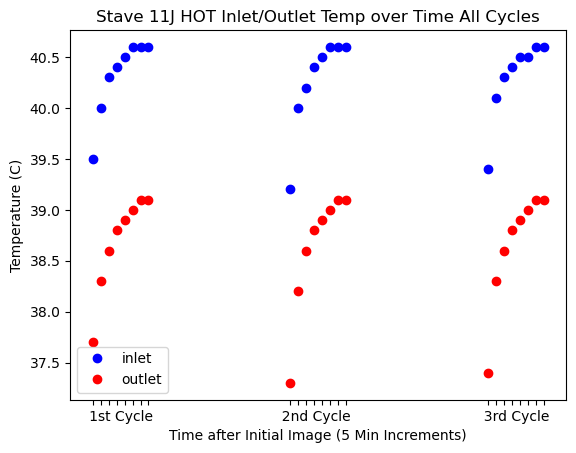

In [15]:
#plt.plot(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4], 'o')
#plt.plot(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3], 'o')


plt.plot(
    
    J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3],'bo',

    J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4], 'ro',
)
plt.legend(['inlet', 'outlet'])

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', ' ', ' ', ' ','  ',' ',' ','  2nd Cycle ',' ',' ',' ', ' ', '',' ',' ','  3rd Cycle','',' ',' ',' ']
plt.xticks(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 11J HOT Inlet/Outlet Temp over Time All Cycles")

Text(0.5, 1.0, 'Stave 11J HOT Inlet/Outlet Temp Difference over Time All Cycles')

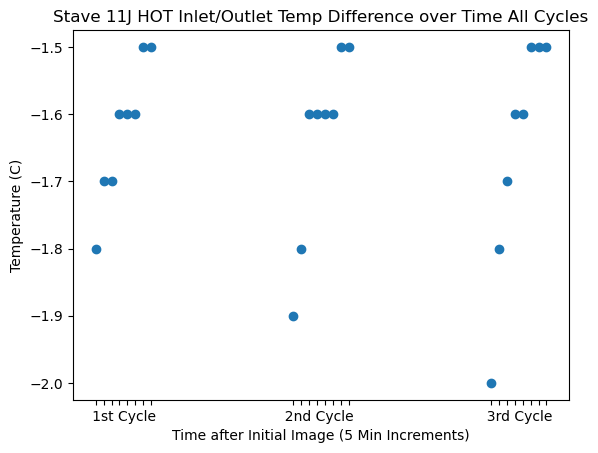

In [16]:
plt.plot(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4]-J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3], 'o')

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', ' ', ' ', ' ','  ',' ',' ','  2nd Cycle ',' ',' ',' ', ' ', '',' ',' ','  3rd Cycle','',' ',' ',' ']
plt.xticks(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 11J HOT Inlet/Outlet Temp Difference over Time All Cycles")

Text(0.5, 1.0, 'Stave 11J HOT Temp Dependent Power Loading over Time All Cycles')

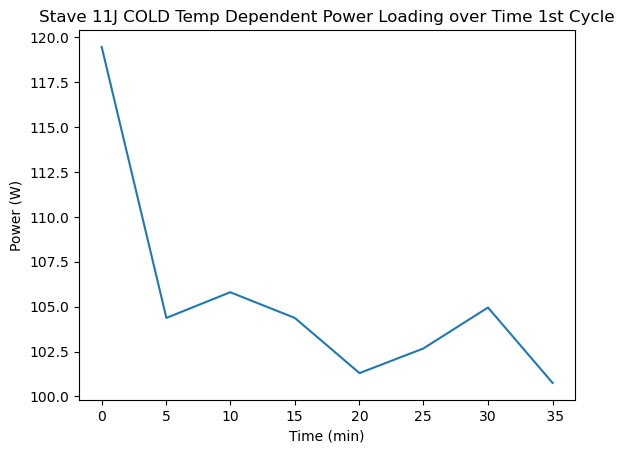

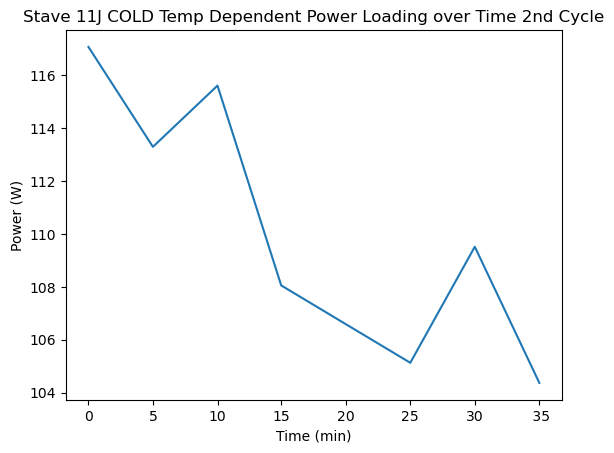

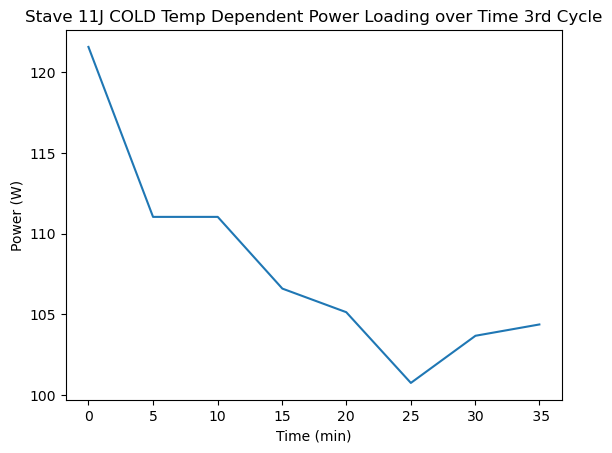

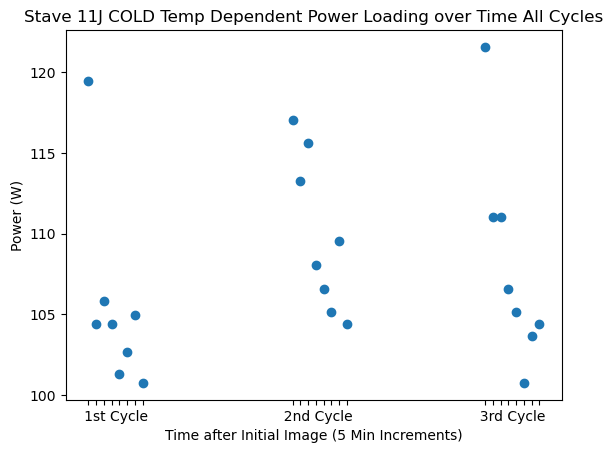

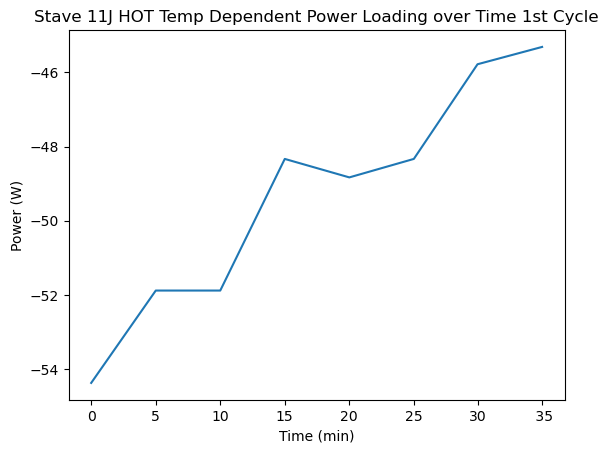

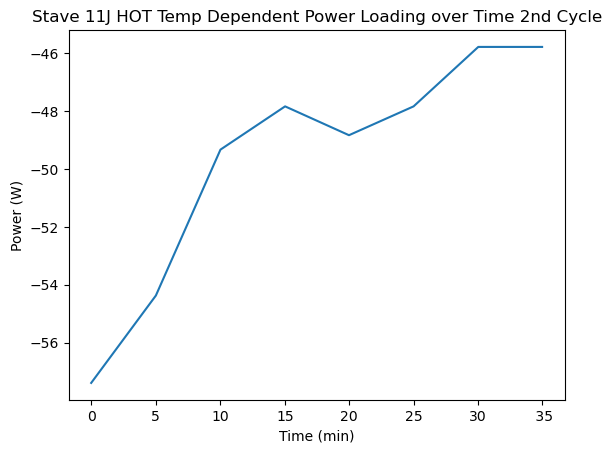

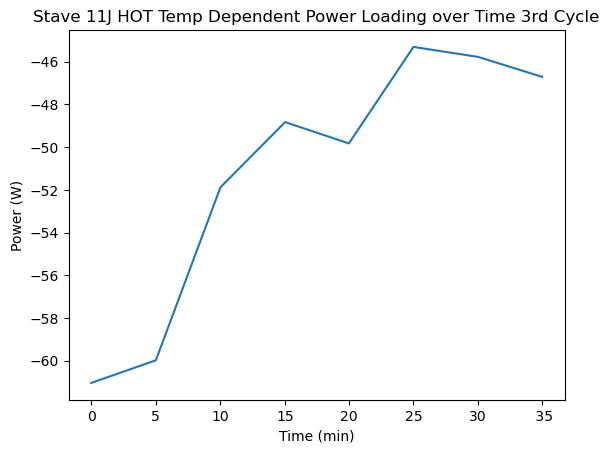

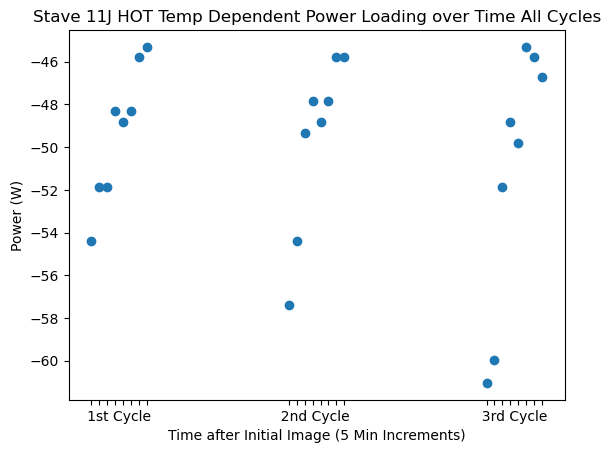

In [17]:
J11power_cold_all = ((1614/60)*1063*J11flow[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],1]*(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3]))/1000
J11power_cold1 = ((1614/60)*1063*J11flow[[0,1,2,3,4,5,6,7,],1]*(J11temps[[0,1,2,3,4,5,6,7],4]-J11temps[[0,1,2,3,4,5,6,7],3]))/1000
J11power_cold2 = ((1614/60)*1063*J11flow[[16,17,18,19,20,21,22,23],1]*(J11temps[[16,17,18,19,20,21,22,23],4]-J11temps[[16,17,18,19,20,21,22,23],3]))/1000
J11power_cold3 = ((1614/60)*1063*J11flow[[32,33,34,35,36,37,38,39],1]*(J11temps[[32,33,34,35,36,37,38,39],4]-J11temps[[32,33,34,35,36,37,38,39],3]))/1000

J11power_hot_all = ((1448/60)*1213*J11flow[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],1]*(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4]-J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3]))/1000
J11power_hot1 = ((1448/60)*1213*J11flow[[8,9,10,11,12,13,14,15],1]*(J11temps[[8,9,10,11,12,13,14,15],4]-J11temps[[8,9,10,11,12,13,14,15],3]))/1000
J11power_hot2 = ((1448/60)*1213*J11flow[[24,25,26,27,28,29,30,31],1]*(J11temps[[24,25,26,27,28,29,30,31],4]-J11temps[[24,25,26,27,28,29,30,31],3]))/1000
J11power_hot3 = ((1448/60)*1213*J11flow[[40,41,42,43,44,45,46,47],1]*(J11temps[[40,41,42,43,44,45,46,47],4]-J11temps[[40,41,42,43,44,45,46,47],3]))/1000


plt.plot(J11temps[[0,1,2,3,4,5,6,7],0], J11power_cold1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(J11temps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 11J COLD Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(J11temps[[16,17,18,19,20,21,22,23],0], J11power_cold2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(J11temps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 11J COLD Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(J11temps[[32,33,34,35,36,37,38,39],0], J11power_cold3)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(J11temps[[32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 11J COLD Temp Dependent Power Loading over Time 3rd Cycle")
plt.figure()

plt.plot(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], J11power_cold_all, 'o')
xticks = ['', ' ', ' ', '   1st Cycle ', ' ', ' ', ' ', ' ','  ',' ',' ','  2nd Cycle ',' ',' ',' ', ' ', '',' ',' ','  3rd Cycle','',' ',' ',' ']
plt.xticks(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 11J COLD Temp Dependent Power Loading over Time All Cycles")
plt.figure()


plt.plot(J11temps[[8,9,10,11,12,13,14,15],0], J11power_hot1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(J11temps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 11J HOT Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(J11temps[[24,25,26,27,28,29,30,31],0], J11power_hot2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(J11temps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 11J HOT Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(J11temps[[40,41,42,43,44,45,46,47],0], J11power_hot3)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(J11temps[[40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 11J HOT Temp Dependent Power Loading over Time 3rd Cycle")
plt.figure()

plt.plot(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], J11power_hot_all, 'o')
xticks = ['', ' ', ' ', '   1st Cycle ', ' ', ' ', ' ', ' ','  ',' ',' ','  2nd Cycle ',' ',' ',' ', ' ', '',' ',' ','  3rd Cycle','',' ',' ',' ']
plt.xticks(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 11J HOT Temp Dependent Power Loading over Time All Cycles")

Text(0.5, 1.0, 'Stave 11J Power Load vs Impedance 3rd Cycle')

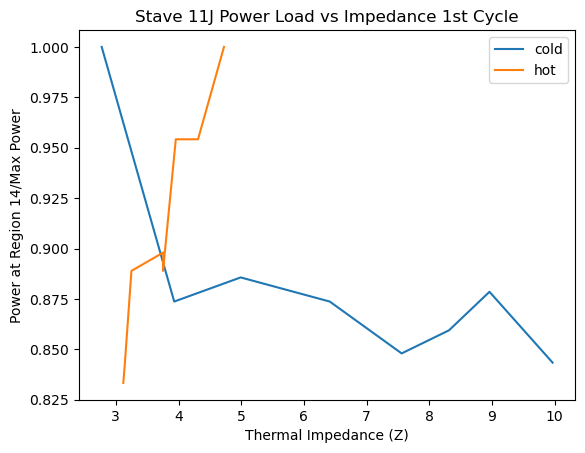

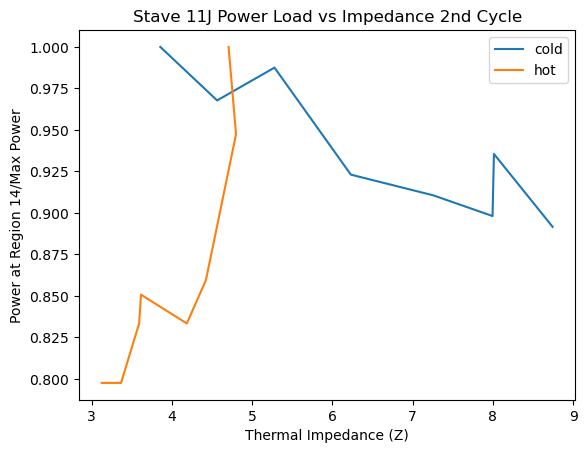

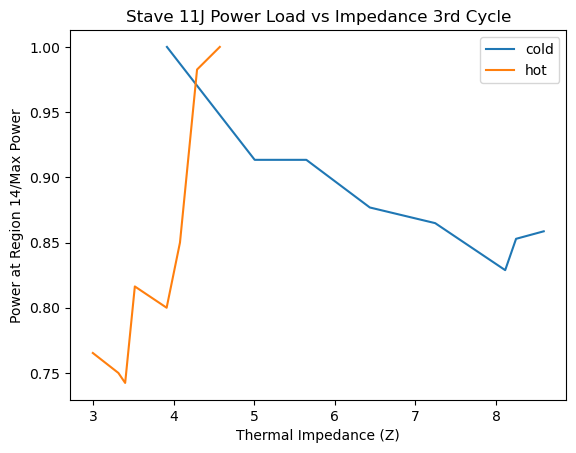

In [18]:
plt.plot(J11_cold_swap_1[14,:,0], J11power_cold1/J11power_cold1.max())
plt.plot(J11_hot_swap_1[14,:,0], abs(J11power_hot1/J11power_hot1.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 11J Power Load vs Impedance 1st Cycle")
plt.figure()

plt.plot(J11_cold_swap_2[14,:,0], J11power_cold2/J11power_cold2.max())
plt.plot(J11_hot_swap_2[14,:,0], abs(J11power_hot2/J11power_hot2.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 11J Power Load vs Impedance 2nd Cycle")
plt.figure()

plt.plot(J11_cold_swap_3[14,:,0], J11power_cold3/J11power_cold3.max())
plt.plot(J11_hot_swap_3[14,:,0], abs(J11power_hot3/J11power_hot3.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 11J Power Load vs Impedance 3rd Cycle")

#plt.plot(J11_cold_all[14,:,0], J11power_cold_all/J11power_cold_all.max())
#plt.plot(J11_hot_all[14,:,0], abs(J11power_hot_all/J11power_hot_all.min()))
#plt.legend(['cold', 'hot'])
#plt.xlabel("Thermal Impedance (Z)")
#plt.ylabel("Power at Region 14/Max Power")
#plt.title("Stave 11J Power Load vs Impedance All Cycles")

<Figure size 640x480 with 0 Axes>

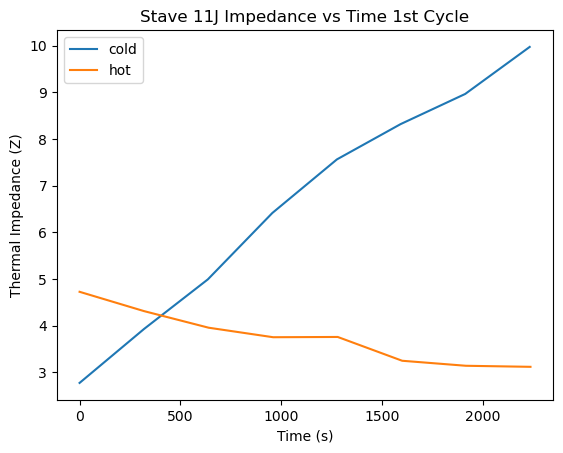

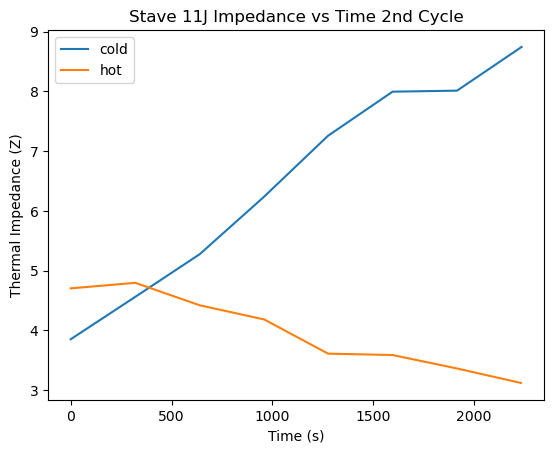

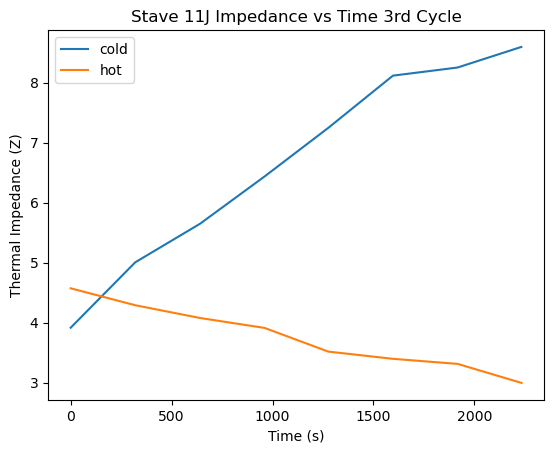

<Figure size 640x480 with 0 Axes>

In [19]:
#plt.plot(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0]-J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0].min(), J11_cold_swap[14,:,0])
#plt.plot(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0]-J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0].min(), J11_hot_swap[14,:,0])


plt.plot(J11temps[[0,1,2,3,4,5,6,7],0]-J11temps[[0,1,2,3,4,5,6,7],0].min(), J11_cold_swap_1[14,:,0])
plt.plot(J11temps[[8,9,10,11,12,13,14,15],0]-J11temps[[8,9,10,11,12,13,14,15],0].min(), J11_hot_swap_1[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.title("Stave 11J Impedance vs Time 1st Cycle")
plt.figure()


plt.plot(J11temps[[16,17,18,19,20,21,22,23],0]-J11temps[[16,17,18,19,20,21,22,23],0].min(), J11_cold_swap_2[14,:,0])
plt.plot(J11temps[[24,25,26,27,28,29,30,31],0]-J11temps[[24,25,26,27,28,29,30,31],0].min(), J11_hot_swap_2[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.title("Stave 11J Impedance vs Time 2nd Cycle")
plt.figure()

plt.plot(J11temps[[32,33,34,35,36,37,38,39],0]-J11temps[[32,33,34,35,36,37,38,39],0].min(), J11_cold_swap_3[14,:,0])
plt.plot(J11temps[[40,41,42,43,44,45,46,47],0]-J11temps[[40,41,42,43,44,45,46,47],0].min(), J11_hot_swap_3[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.title("Stave 11J Impedance vs Time 3rd Cycle")
plt.figure()

#plt.plot(J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0]-J11temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0].min(), J11_cold_all_swap[14,:,0])
#plt.plot(J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0]-J11temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0].min(), J11_hot_all_swap[14,:,0])
#plt.xlabel("Time (s)")
#plt.ylabel("Thermal Impedance (Z)")
#plt.legend(['cold', 'hot'])
#plt.title("Stave 11J Impedance vs Time All Cycles")

# Stave 9

## Side L

In [20]:
L9temps = []
L9flow = []
for filename in sorted(glob("../Stave9_NewCamera_LS_CERN_L_*.npz")):
    f = np.load(filename)
    L9flowtime = f["flow_times"][-1]
    L9flowdata = np.median(f["flow_data"][-5:])
    L9flow.append([L9flowtime, L9flowdata])
    L9thermtime = f["thermo_times"][-1]
    L9thermdata = list(f["thermo_data"][-1])
    L9temps.append([L9thermtime]+L9thermdata)

L9temps = np.array(L9temps)
L9flow = np.array(L9flow)
#print(L9temps.shape)
#print(L9flow.shape) 
#print(L9temps)

Text(0.5, 1.0, 'Stave 9L HOT Impedances over Time (Large Region) Both Cycles')

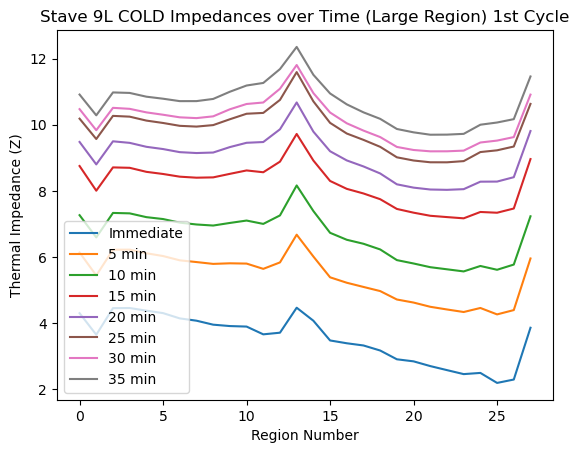

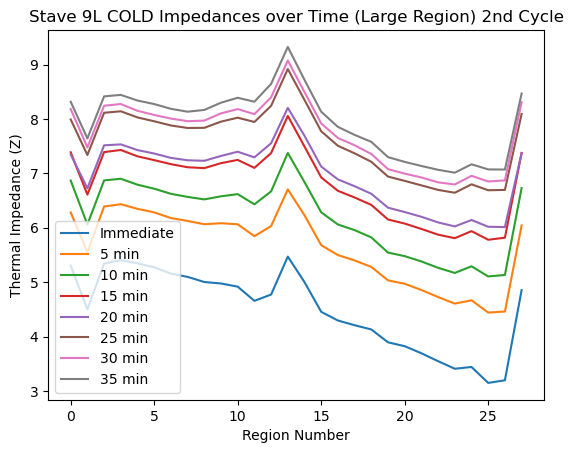

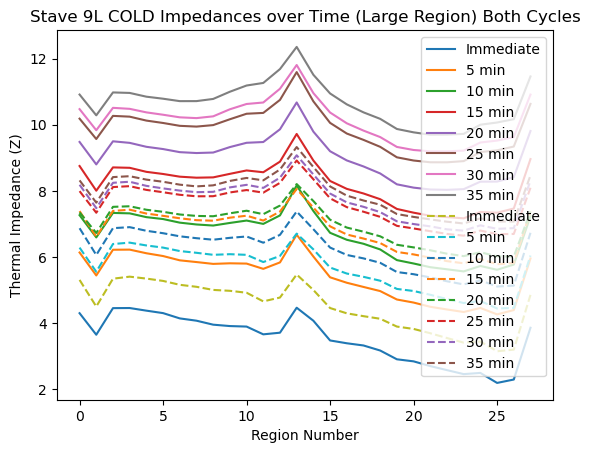

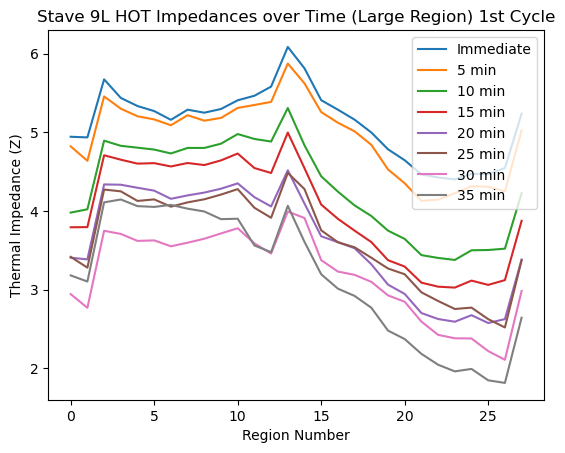

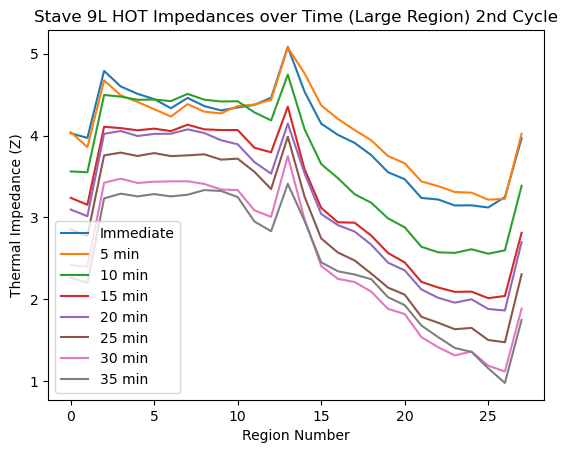

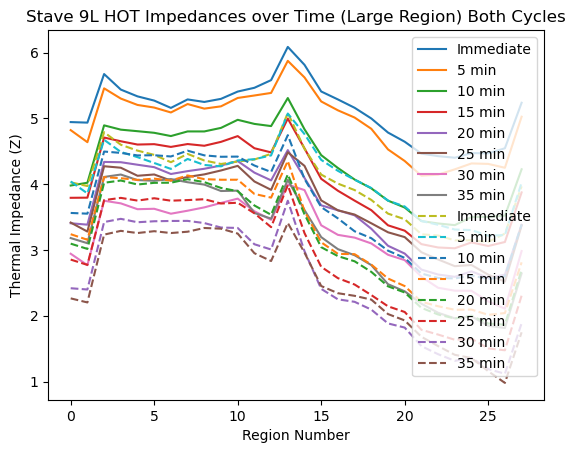

In [21]:
L9_hot_1 = [] #large region top
L9_cold_1 = [] #large region top
L9_hot_2 = [] #large region top
L9_cold_2 = [] #large region top

L9_hot_goavg_1 = [] #large region top
L9_cold_goavg_1 = [] #large region top
L9_hot_goavg_2 = [] #large region top
L9_cold_goavg_2 = [] #large region top


for filename in sorted(glob("output/Stave9L/Stave9_NewCamera_LS_CERN_L_*_IMPEDANCES.csv")):
    index = int(filename.split("_")[-2])

    if (index >=8 and index <16):
        L9_hot_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
    #if (index >=8 and index <16) or (index >=24 and index <32):
        L9_hot_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=-1 and index <8):
        L9_cold_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
    #if (index >=-1 and index <8) or (index >=16 and index <24):
        L9_cold_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))



    if (index >=8 and index <16):
        L9_hot_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
    #if (index >=8 and index <16) or (index >=24 and index <32):
        L9_hot_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=-1 and index <8):
        L9_cold_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
    #if (index >=-1 and index <8) or (index >=16 and index <24):
        L9_cold_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))


L9_hot_1 = np.stack(L9_hot_1, axis=0)
L9_hot_swap_1 = np.swapaxes(L9_hot_1, 0, 1)
L9_cold_1 = np.stack(L9_cold_1, axis=0)
L9_cold_swap_1 = np.swapaxes(L9_cold_1, 0, 1)
L9_hot_2 = np.stack(L9_hot_2, axis=0)
L9_hot_swap_2 = np.swapaxes(L9_hot_2, 0, 1)
L9_cold_2 = np.stack(L9_cold_2, axis=0)
L9_cold_swap_2 = np.swapaxes(L9_cold_2, 0, 1)
L9_hot_all = np.concatenate((L9_hot_1, L9_hot_2),axis=0)
L9_hot_all_swap = np.concatenate((L9_hot_swap_1, L9_hot_swap_2),axis=0)
L9_cold_all = np.concatenate((L9_cold_1, L9_cold_2),axis=0)
L9_cold_all_swap = np.concatenate((L9_cold_swap_1, L9_cold_swap_2),axis=0)


L9_hot_goavg_1 = np.stack(L9_hot_goavg_1, axis=0)
L9_hot_goavg_swap_1 = np.swapaxes(L9_hot_goavg_1, 0, 1)
L9_cold_goavg_1 = np.stack(L9_cold_goavg_1, axis=0)
L9_cold_goavg_swap_1 = np.swapaxes(L9_cold_goavg_1, 0, 1)
L9_hot_goavg_2 = np.stack(L9_hot_goavg_2, axis=0)
L9_hot_goavg_swap_2 = np.swapaxes(L9_hot_goavg_2, 0, 1)
L9_cold_goavg_2 = np.stack(L9_cold_goavg_2, axis=0)
L9_cold_goavg_swap_2 = np.swapaxes(L9_cold_goavg_2, 0, 1)


arr_L9_hot_goavg_1 = np.array(L9_hot_goavg_1)
arr_L9_hot_goavg_2 = np.array(L9_hot_goavg_2)
arr_L9_cold_goavg_1 = np.array(L9_cold_goavg_1)
arr_L9_cold_goavg_2 = np.array(L9_cold_goavg_2)

L9_hot_avg = (arr_L9_hot_goavg_1+arr_L9_hot_goavg_2)/2

L9_cold_avg = (arr_L9_cold_goavg_1+arr_L9_cold_goavg_2)/2

plt.plot(L9_cold_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9L COLD Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(L9_cold_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9L COLD Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(L9_cold_swap_1[:,:,0])
plt.plot(L9_cold_swap_2[:,:,0], linestyle='dashed')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9L COLD Impedances over Time (Large Region) Both Cycles")
plt.figure()

plt.plot(L9_hot_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9L HOT Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(L9_hot_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9L HOT Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(L9_hot_swap_1[:,:,0])
plt.plot(L9_hot_swap_2[:,:,0], linestyle='dashed')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9L HOT Impedances over Time (Large Region) Both Cycles")

Text(0.5, 1.0, 'Stave 9L COLD Inlet/Outlet Temp over Time Both Cycles')

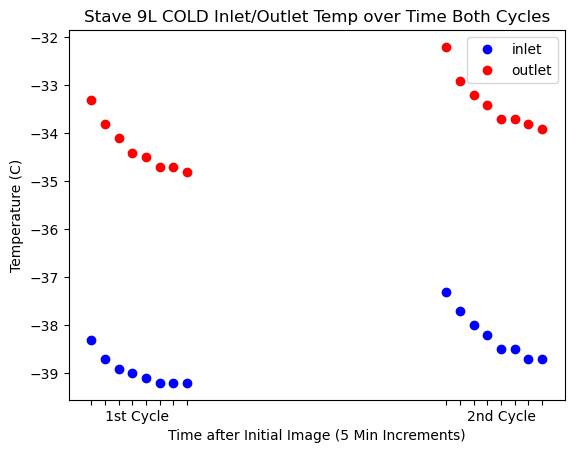

In [22]:
#plt.plot(L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4], 'o')
#plt.plot(L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3], 'o')

plt.plot(
    
    L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3],'bo',

    L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4], 'ro',
)

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ']
plt.xticks(L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.legend(['inlet', 'outlet'])
plt.title("Stave 9L COLD Inlet/Outlet Temp over Time Both Cycles")

Text(0.5, 1.0, 'Stave 9L COLD Inlet/Outlet Temp Difference over Time Both Cycles')

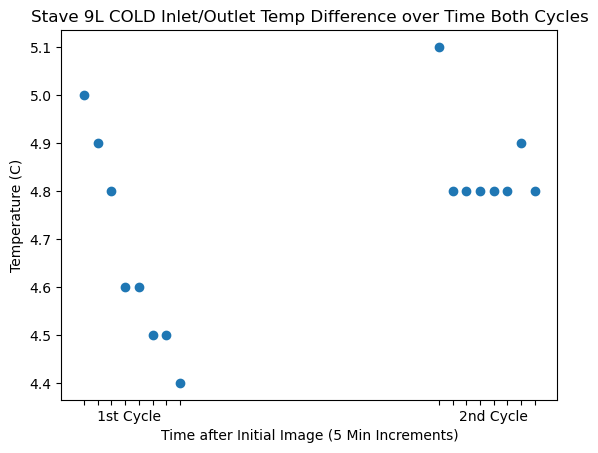

In [23]:
plt.plot(L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4]-L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3],'o')
xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ']
plt.xticks(L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 9L COLD Inlet/Outlet Temp Difference over Time Both Cycles")

Text(0.5, 1.0, 'Stave 9L HOT Inlet/Outlet Temp over Time Both Cycles')

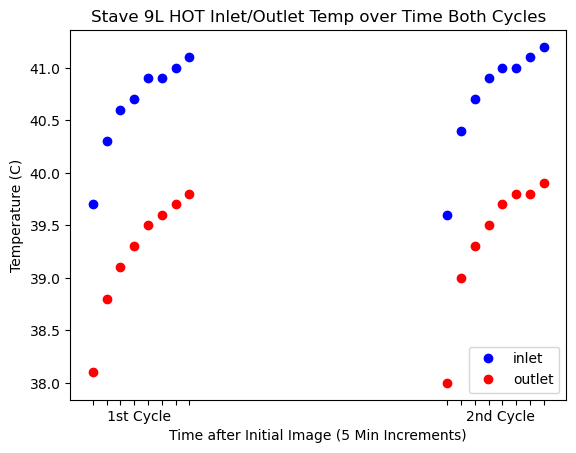

In [24]:
#plt.plot(L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4],'o')
#plt.plot(L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'o')


plt.plot(
    
    L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'bo',

    L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4], 'ro',
)
plt.legend(['inlet', 'outlet'])

xticks = ['    ', ' ', ' ', '   1st Cycle ', ' ','  ',' ',' ','   ',' ',' ',' ', '2nd Cycle ', '',' ',' ']
plt.xticks(L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")

plt.title("Stave 9L HOT Inlet/Outlet Temp over Time Both Cycles")

Text(0.5, 1.0, 'Stave 9L HOT Inlet/Outlet Temp Difference over Time Both Cycles')

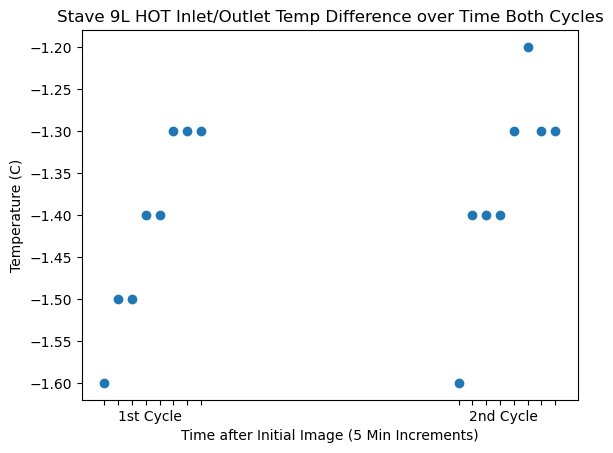

In [25]:
plt.plot(L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 9L HOT Inlet/Outlet Temp Difference over Time Both Cycles")

Text(0.5, 1.0, 'Stave 9L HOT Temp Dependent Power Loading over Time Both Cycles')

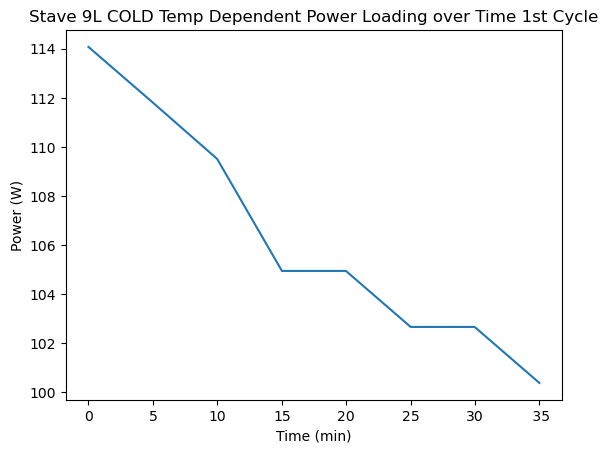

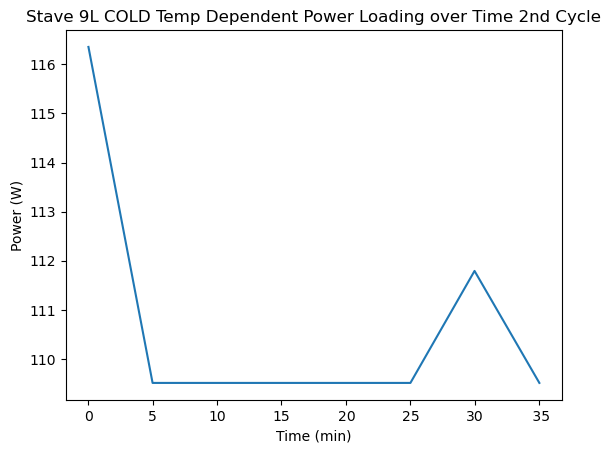

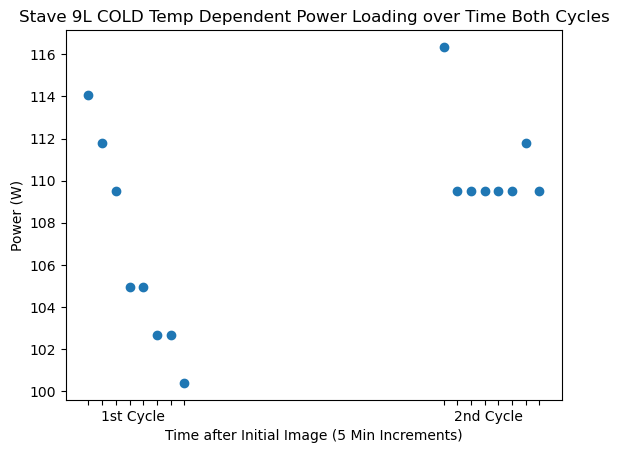

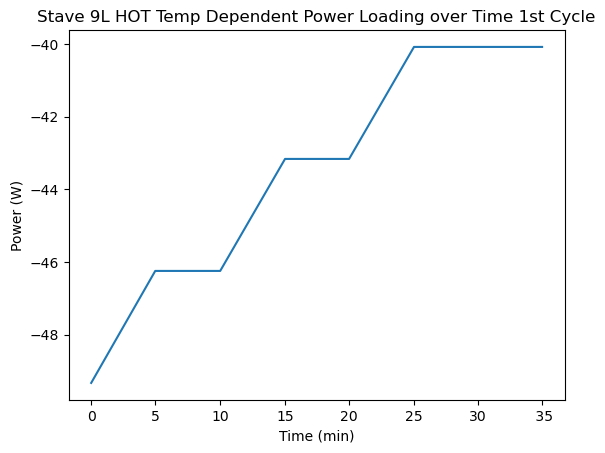

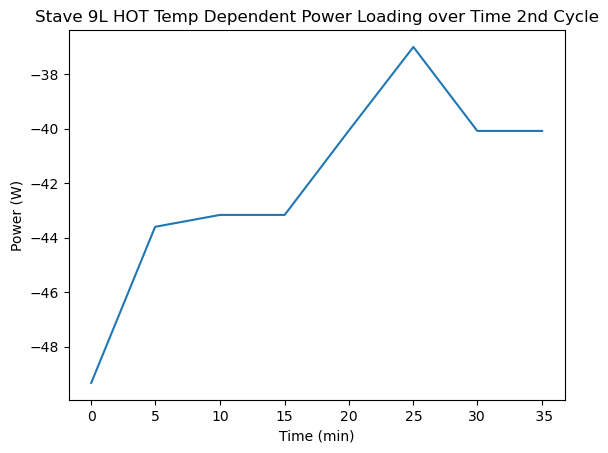

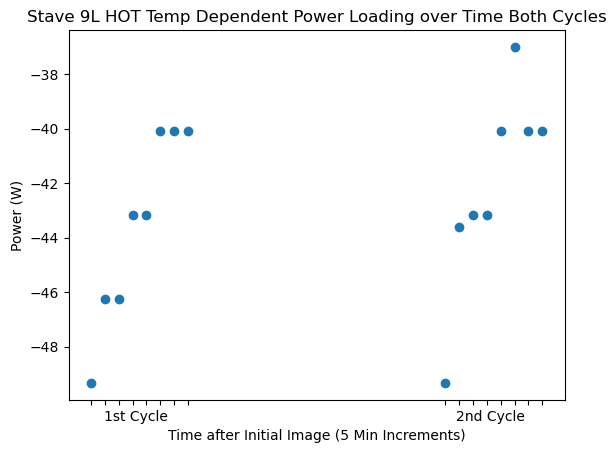

In [26]:
L9power_cold_all = ((1614/60)*1063*L9flow[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],1]*(L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4]-L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3]))/1000
L9power_cold1 = ((1614/60)*1063*L9flow[[0,1,2,3,4,5,6,7],1]*(L9temps[[0,1,2,3,4,5,6,7],4]-L9temps[[0,1,2,3,4,5,6,7],3]))/1000
L9power_cold2 = ((1614/60)*1063*L9flow[[16,17,18,19,20,21,22,23],1]*(L9temps[[16,17,18,19,20,21,22,23],4]-L9temps[[16,17,18,19,20,21,22,23],3]))/1000


L9power_hot_all = ((1448/60)*1213*L9flow[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],1]*(L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3]))/1000
L9power_hot1 = ((1448/60)*1213*L9flow[[8,9,10,11,12,13,14,15],1]*(L9temps[[8,9,10,11,12,13,14,15],4]-L9temps[[8,9,10,11,12,13,14,15],3]))/1000
L9power_hot2 = ((1448/60)*1213*L9flow[[24,25,26,27,28,29,30,31],1]*(L9temps[[24,25,26,27,28,29,30,31],4]-L9temps[[24,25,26,27,28,29,30,31],3]))/1000



plt.plot(L9temps[[0,1,2,3,4,5,6,7],0], L9power_cold1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L9temps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 9L COLD Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(L9temps[[16,17,18,19,20,21,22,23],0], L9power_cold2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L9temps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 9L COLD Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], L9power_cold_all, 'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 9L COLD Temp Dependent Power Loading over Time Both Cycles")
plt.figure()

plt.plot(L9temps[[8,9,10,11,12,13,14,15],0], L9power_hot1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L9temps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 9L HOT Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(L9temps[[24,25,26,27,28,29,30,31],0], L9power_hot2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L9temps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 9L HOT Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], L9power_hot_all, 'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 9L HOT Temp Dependent Power Loading over Time Both Cycles")

Text(0.5, 1.0, 'Stave 9L Power Load vs Impedance 2nd Cycle')

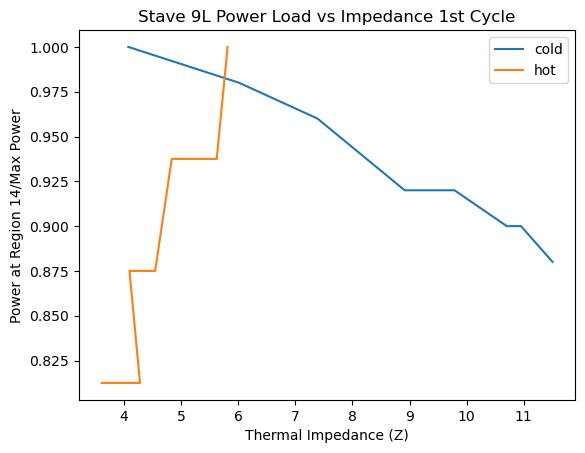

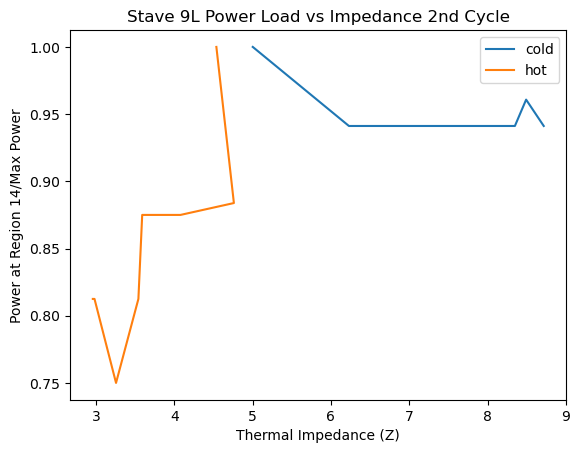

In [27]:
plt.plot(L9_cold_swap_1[14,:,0], L9power_cold1/L9power_cold1.max())
plt.plot(L9_hot_swap_1[14,:,0], abs(L9power_hot1/L9power_hot1.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 9L Power Load vs Impedance 1st Cycle")
plt.figure()

plt.plot(L9_cold_swap_2[14,:,0], L9power_cold2/L9power_cold2.max())
plt.plot(L9_hot_swap_2[14,:,0], abs(L9power_hot2/L9power_hot2.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 9L Power Load vs Impedance 2nd Cycle")


#plt.plot(J11_cold[14,:,0], J11power_cold/J11power_cold.max())

<Figure size 640x480 with 0 Axes>

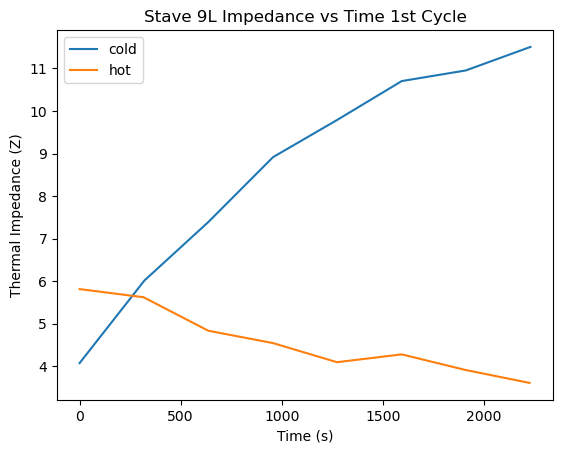

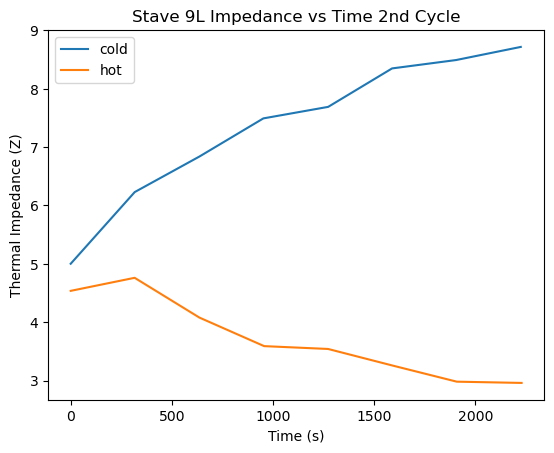

<Figure size 640x480 with 0 Axes>

In [28]:
plt.plot(L9temps[[0,1,2,3,4,5,6,7],0]-L9temps[[0,1,2,3,4,5,6,7],0].min(), L9_cold_swap_1[14,:,0])
plt.plot(L9temps[[8,9,10,11,12,13,14,15],0]-L9temps[[8,9,10,11,12,13,14,15],0].min(), L9_hot_swap_1[14,:,0])
plt.title("Stave 9L Impedance vs Time 1st Cycle")
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.figure()

plt.plot(L9temps[[16,17,18,19,20,21,22,23],0]-L9temps[[16,17,18,19,20,21,22,23],0].min(), L9_cold_swap_2[14,:,0])
plt.plot(L9temps[[24,25,26,27,28,29,30,31],0]-L9temps[[24,25,26,27,28,29,30,31],0].min(), L9_hot_swap_2[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.title("Stave 9L Impedance vs Time 2nd Cycle")
plt.figure()

#plt.plot(L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0]-L9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0].min(), L9_cold_all_swap[14,:,0],'o')
#plt.plot(L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0]-L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0].min(), L9_hot_all_swap[14,:,0],'o')
#plt.title("Stave 9L Impedance vs Time Both Cycles")
#plt.xlabel("Time (s)")
#plt.ylabel("Thermal Impedance (Z)")
#plt.legend(['cold', 'hot'])

## Side J

In [29]:
J91temps = []
J91flow = []
for filename in sorted(glob("../Stave9_NewCamera1_LS_CERN_J_*.npz")):
    
    f = np.load(filename)
    J91flowtime = f["flow_times"][-1]
    J91flowdata = np.median(f["flow_data"][-5:])
    J91flow.append([J91flowtime, J91flowdata])
    J91thermtime = f["thermo_times"][-1]
    J91thermdata = list(f["thermo_data"][-1])
    J91temps.append([J91thermtime]+J91thermdata)
    print(filename)

J91temps = np.array(J91temps)
J91flow = np.array(J91flow)
print(J91temps.shape)
print(J91flow.shape)

../Stave9_NewCamera1_LS_CERN_J_000.npz
../Stave9_NewCamera1_LS_CERN_J_001.npz
../Stave9_NewCamera1_LS_CERN_J_002.npz
../Stave9_NewCamera1_LS_CERN_J_003.npz
../Stave9_NewCamera1_LS_CERN_J_004.npz
../Stave9_NewCamera1_LS_CERN_J_005.npz
../Stave9_NewCamera1_LS_CERN_J_006.npz
../Stave9_NewCamera1_LS_CERN_J_007.npz
(8, 7)
(8, 2)


In [30]:
J92temps = []
J92flow = []
for filename in sorted(glob("../Stave9_NewCamera2_LS_CERN_J_*.npz")):
    
    f = np.load(filename)
    J92flowtime = f["flow_times"][-1]
    J92flowdata = np.median(f["flow_data"][-5:])
    J92flow.append([J92flowtime, J92flowdata])
    J92thermtime = f["thermo_times"][-1]
    J92thermdata = list(f["thermo_data"][-1])
    J92temps.append([J92thermtime]+J92thermdata)
    #print(filename)

J92temps = np.array(J92temps)
J92flow = np.array(J92flow)
#print(J92temps.shape)
#print(J92flow.shape)
J9temps = J92temps
J9flow = J92flow
print(J9temps.shape)

(32, 7)


In [31]:
#J9temps = []
#J9flow = []
#J9temps = np.concatenate((J91temps,J92temps), axis = 0)
#J9flow = np.concatenate((J91flow,J92flow), axis = 0)

J9temps = J92temps
J9flow = J92flow
print(J9temps.shape)

(32, 7)


Text(0.5, 1.0, 'Stave 9J HOT Impedances over Time (Large Region) Both Cycles')

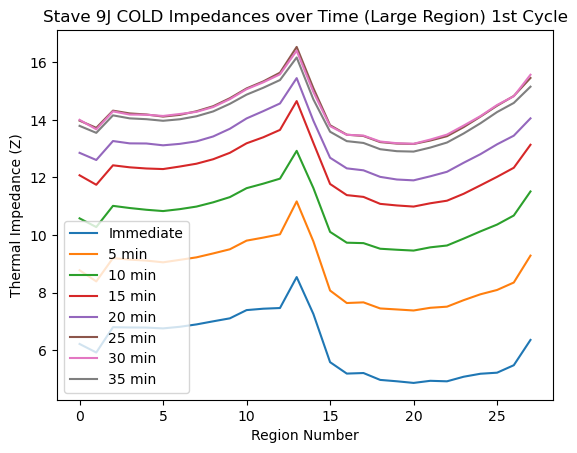

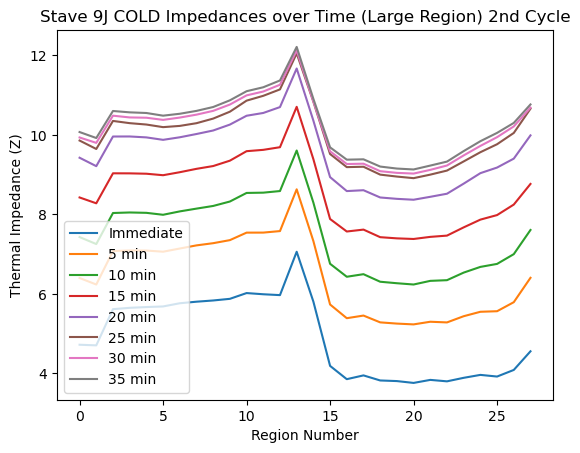

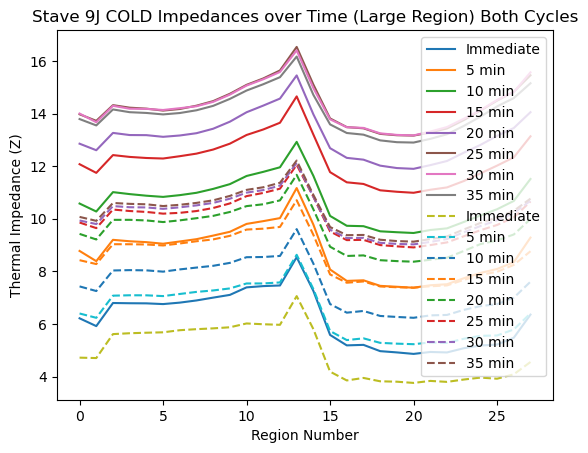

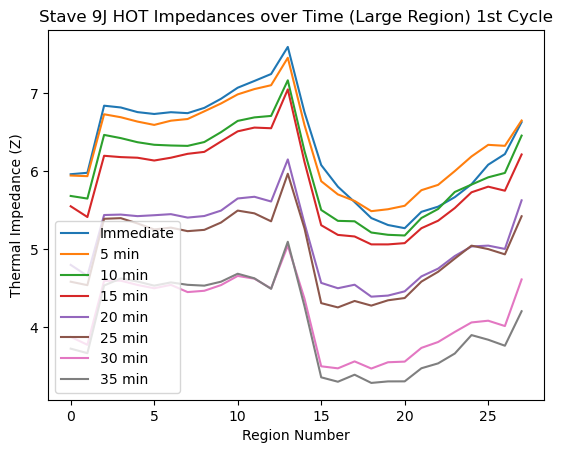

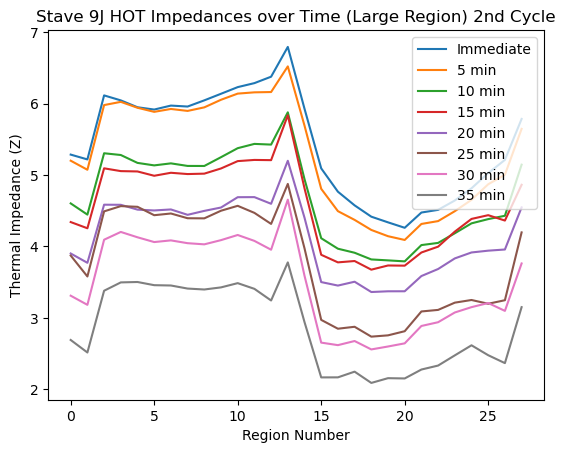

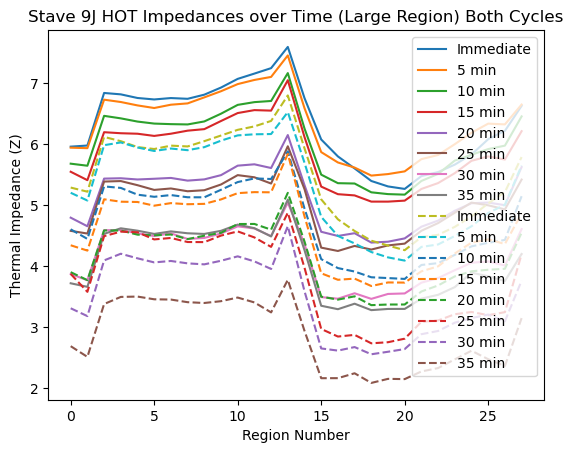

In [32]:
J9_hot1 = [] #large region top
J9_cold1 = [] #large region top
J9_hot2 = [] #large region top
J9_cold2 = []

J9_hot1_goavg = [] #large region top
J9_cold1_goavg = [] #large region top
J9_hot2_goavg = [] #large region top
J9_cold2_goavg = []#large region top


#for filename1 in sorted(glob("output/Stave9J/Stave9_NewCamera1_LS_CERN_J_*_IMPEDANCES.csv")):
 #   index1 = int(filename1.split("_")[-2])

for filename2 in sorted(glob("output/Stave9J/Stave9_NewCamera2_LS_CERN_J_*_IMPEDANCES.csv")):
    index2 = int(filename2.split("_")[-2])

    #ORIGINALLY USED COLUMNS 1 and 2, Apr 1 testing 0,1 for average thingy 
    if (index2 >=8 and index2 <16):
    #if (index2 >=8 and index2 <16) or (index2 >=24 and index2 <32):
        J9_hot1.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index2 >=24 and index2 <32):
        J9_hot2.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    #ONLY USE FOR AVERAGES
    if (index2 >=8 and index2 <16):
    #if (index2 >=8 and index2 <16) or (index2 >=24 and index2 <32):
        J9_hot1_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index2 >=24 and index2 <32):
        J9_hot2_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))
    
    
    
    #if (index1 <8):
        #J9_cold1.append(np.loadtxt(filename1, delimiter=',', 
        #usecols=[1,2], max_rows=28, skiprows=1))
    
    
    if (index2 <8):
    #if (index2 <8) or (index2 >=16 and index2 <24):
        J9_cold1.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))


    if (index2 >=16 and index2 <24):
        J9_cold2.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))


    if (index2 <8):
    #if (index2 <8) or (index2 >=16 and index2 <24):
        J9_cold1_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))


    if (index2 >=16 and index2 <24):
        J9_cold2_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

J9_hot1 = np.stack(J9_hot1, axis=0)
J9_hot1_swap = np.swapaxes(J9_hot1, 0, 1)

J9_hot2 = np.stack(J9_hot2, axis=0)
J9_hot2_swap = np.swapaxes(J9_hot2, 0, 1)

J9_cold1 = np.stack(J9_cold1, axis=0)
J9_cold1_swap = np.swapaxes(J9_cold1, 0, 1)

J9_cold2 = np.stack(J9_cold2, axis=0)
J9_cold2_swap = np.swapaxes(J9_cold2, 0, 1)


J9_hot1_goavg = np.stack(J9_hot1_goavg, axis=0)
J9_hot1_goavg_swap = np.swapaxes(J9_hot1_goavg, 0, 1)

J9_hot2_goavg = np.stack(J9_hot2_goavg, axis=0)
J9_hot2_goavg_swap = np.swapaxes(J9_hot2_goavg, 0, 1)

J9_cold1_goavg = np.stack(J9_cold1_goavg, axis=0)
J9_cold1_goavg_swap = np.swapaxes(J9_cold1_goavg, 0, 1)

J9_cold2_goavg = np.stack(J9_cold2_goavg, axis=0)
J9_cold2_goavg_swap = np.swapaxes(J9_cold2_goavg, 0, 1)


arr_J9_hot1_swap = np.array(J9_hot1_swap)
arr_J9_hot2_swap = np.array(J9_hot2_swap)
arr_J9_cold1_swap = np.array(J9_cold1_swap)
arr_J9_cold2_swap = np.array(J9_cold2_swap)

arr_J9_hot1_goavg = np.array(J9_hot1_goavg)
arr_J9_hot2_goavg = np.array(J9_hot2_goavg)
arr_J9_cold1_goavg = np.array(J9_cold1_goavg)
arr_J9_cold2_goavg = np.array(J9_cold2_goavg)

#J9_hot_avg = (arr_J9_hot1_swap+arr_J9_hot2_swap)/2
J9_hot_avg = (arr_J9_hot1_goavg+arr_J9_hot2_goavg)/2


J9_cold_avg = (arr_J9_cold1_goavg+arr_J9_cold2_goavg)/2




plt.plot(J9_cold1_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9J COLD Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(J9_cold2_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9J COLD Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(J9_cold1_swap[:,:,0])
plt.plot(J9_cold2_swap[:,:,0], linestyle='dashed')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9J COLD Impedances over Time (Large Region) Both Cycles")
plt.figure()

plt.plot(J9_hot1_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9J HOT Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(J9_hot2_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9J HOT Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(J9_hot1_swap[:,:,0])
plt.plot(J9_hot2_swap[:,:,0], linestyle='dashed')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 9J HOT Impedances over Time (Large Region) Both Cycles")

(32, 7)


Text(0.5, 1.0, 'Stave 9J COLD Inlet/Outlet Temp over Time Both Cycles')

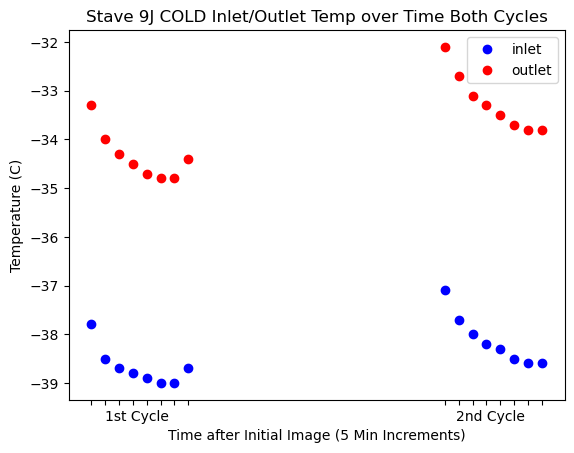

In [33]:
plt.plot(
    
    J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3],'bo',

    J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4], 'ro',
)
print(J9temps.shape)

plt.legend(['inlet', 'outlet'])

xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 9J COLD Inlet/Outlet Temp over Time Both Cycles")



#plt.plot(J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4], "-b",label="outlet")
#plt.plot(J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3],'o', '-r', label ="inlet")
#plt.legend()

Text(0.5, 1.0, 'Stave 9J COLD Inlet/Outlet Temp Difference over Time Both Cycles')

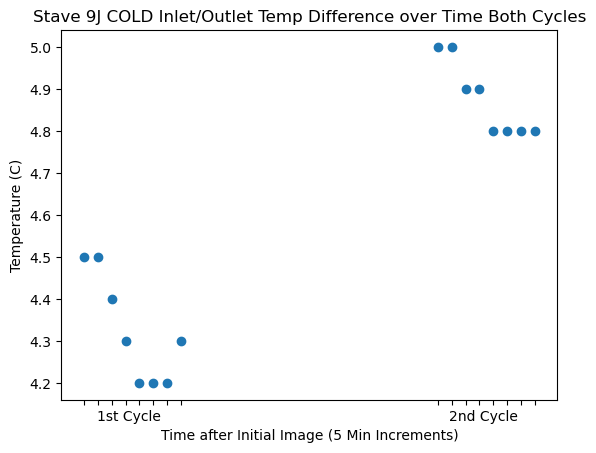

In [34]:
plt.plot(J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4]-J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3],'o')

xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 9J COLD Inlet/Outlet Temp Difference over Time Both Cycles")

Text(0.5, 1.0, 'Stave 9J HOT Inlet/Outlet Temp over Time Both Cycles')

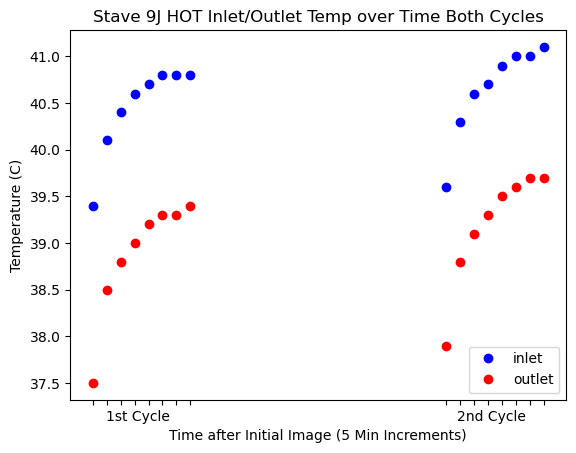

In [35]:
#plt.plot(J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4],'o')
#plt.plot(J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'o')

plt.plot(
    
    J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'bo',
    J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4], 'ro',
)
plt.legend(['inlet', 'outlet'])


xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 9J HOT Inlet/Outlet Temp over Time Both Cycles")

Text(0.5, 1.0, 'Stave 9J HOT Inlet/Outlet Temp Difference over Time Both Cycles')

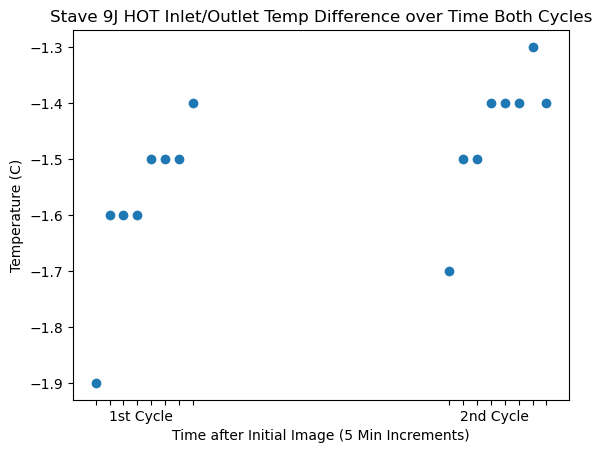

In [36]:
plt.plot(J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'o')

xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 9J HOT Inlet/Outlet Temp Difference over Time Both Cycles")

Text(0.5, 1.0, 'Stave 9J HOT Temp Dependent Power Loading over Time 2nd Cycle')

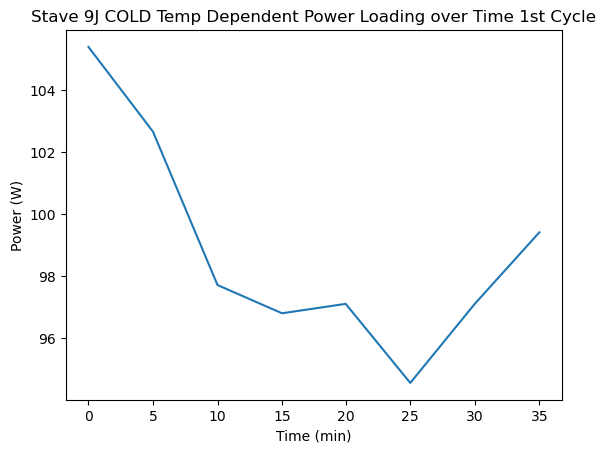

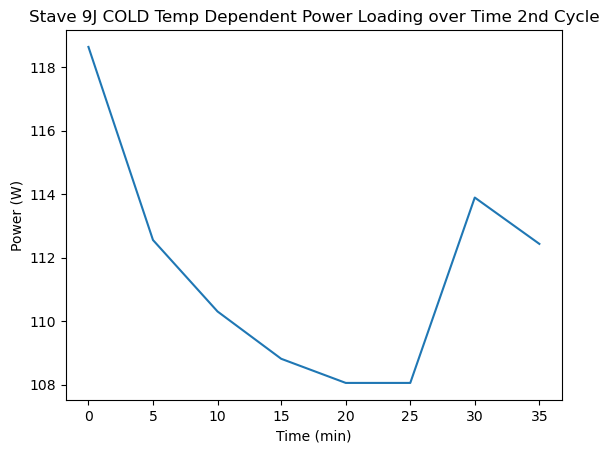

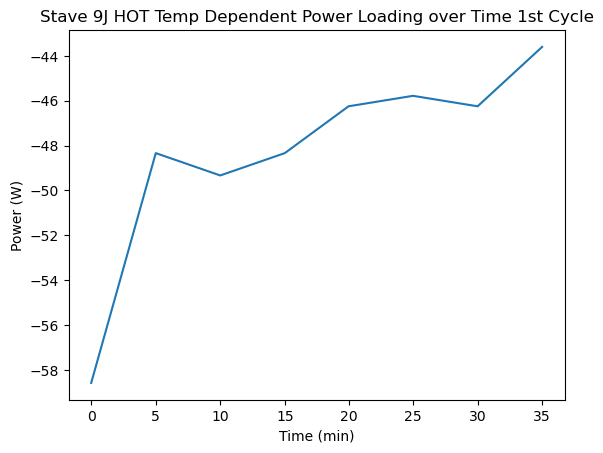

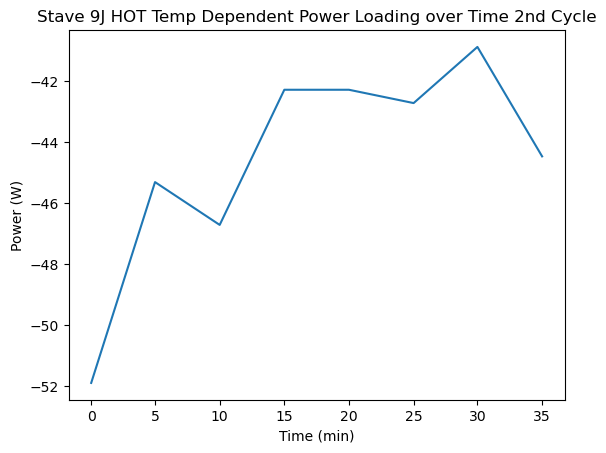

In [37]:
J9power_cold1 = ((1614/60)*1063*J9flow[[0,1,2,3,4,5,6,7],1]*(J9temps[[0,1,2,3,4,5,6,7],4]-J9temps[[0,1,2,3,4,5,6,7],3]))/1000
J9power_cold2 = ((1614/60)*1063*J9flow[[16,17,18,19,20,21,22,23],1]*(J9temps[[16,17,18,19,20,21,22,23],4]-J9temps[[16,17,18,19,20,21,22,23],3]))/1000
#J9power_cold = ((1614/60)*1063*J9flow[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],1]*(J9temps[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-J9temps[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3]))/1000


J9power_hot1 = ((1448/60)*1213*J9flow[[8,9,10,11,12,13,14,15],1]*(J9temps[[8,9,10,11,12,13,14,15],4]-J9temps[[8,9,10,11,12,13,14,15],3]))/1000
J9power_hot2 = ((1448/60)*1213*J9flow[[24,25,26,27,28,29,30,31],1]*(J9temps[[24,25,26,27,28,29,30,31],4]-J9temps[[24,25,26,27,28,29,30,31],3]))/1000
#J9power_hot = ((1448/60)*1213*J9flow[[16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],1]*(J9temps[[16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-J9temps[[16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3]))/1000


plt.plot(J9temps[[0,1,2,3,4,5,6,7],0], J9power_cold1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J9temps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 9J COLD Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(J9temps[[16,17,18,19,20,21,22,23],0], J9power_cold2)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J9temps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 9J COLD Temp Dependent Power Loading over Time 2nd Cycle")
#plt.plot(J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], J9power_cold)
plt.figure()

#plt.plot(J9temps[[16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], J9power_hot')
plt.plot(J9temps[[8,9,10,11,12,13,14,15],0], J9power_hot1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J9temps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 9J HOT Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(J9temps[[24,25,26,27,28,29,30,31],0], J9power_hot2)
#plt.plot(J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], J9power_hot)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J9temps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 9J HOT Temp Dependent Power Loading over Time 2nd Cycle")

Text(0.5, 1.0, 'Stave 9J HOT Temp Dependent Power Loading over Time 2nd Cycle')

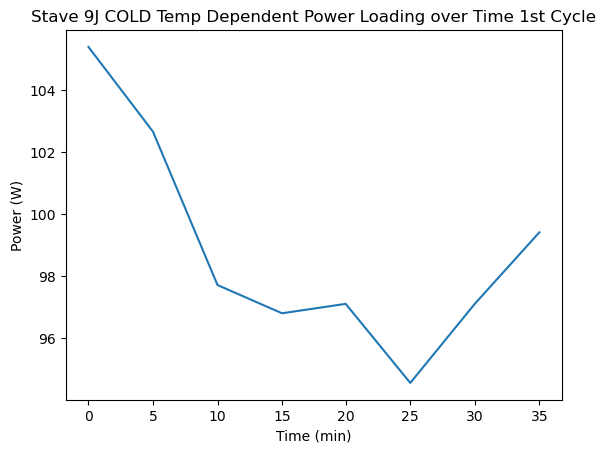

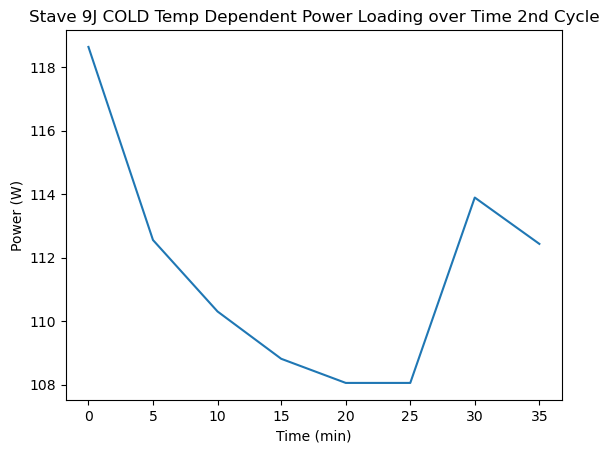

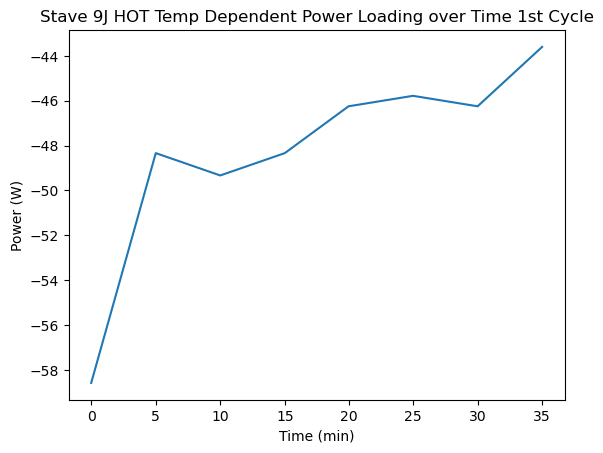

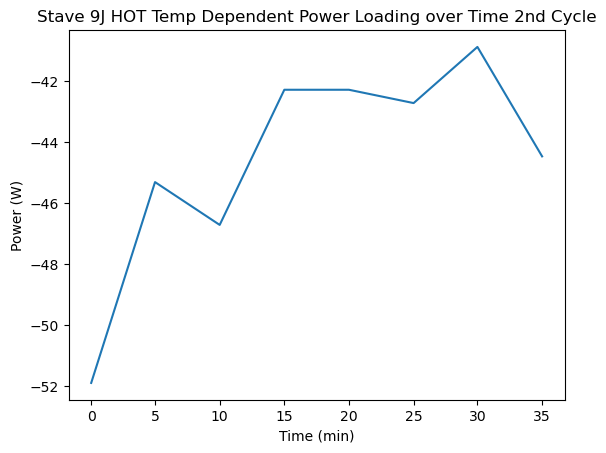

In [38]:
J9power_cold1 = ((1614/60)*1063*J9flow[[0,1,2,3,4,5,6,7],1]*(J9temps[[0,1,2,3,4,5,6,7],4]-J9temps[[0,1,2,3,4,5,6,7],3]))/1000
J9power_cold2 = ((1614/60)*1063*J9flow[[16,17,18,19,20,21,22,23],1]*(J9temps[[16,17,18,19,20,21,22,23],4]-J9temps[[16,17,18,19,20,21,22,23],3]))/1000
#J9power_cold = ((1614/60)*1063*J9flow[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],1]*(J9temps[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-J9temps[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3]))/1000


J9power_hot1 = ((1448/60)*1213*J9flow[[8,9,10,11,12,13,14,15],1]*(J9temps[[8,9,10,11,12,13,14,15],4]-J9temps[[8,9,10,11,12,13,14,15],3]))/1000
J9power_hot2 = ((1448/60)*1213*J9flow[[24,25,26,27,28,29,30,31],1]*(J9temps[[24,25,26,27,28,29,30,31],4]-J9temps[[24,25,26,27,28,29,30,31],3]))/1000
#J9power_hot = ((1448/60)*1213*J9flow[[16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],1]*(J9temps[[16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-J9temps[[16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3]))/1000


plt.plot(J9temps[[0,1,2,3,4,5,6,7],0], J9power_cold1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J9temps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 9J COLD Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(J9temps[[16,17,18,19,20,21,22,23],0], J9power_cold2)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J9temps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 9J COLD Temp Dependent Power Loading over Time 2nd Cycle")
#plt.plot(J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], J9power_cold)
plt.figure()

#plt.plot(J9temps[[16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], J9power_hot')
plt.plot(J9temps[[8,9,10,11,12,13,14,15],0], J9power_hot1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J9temps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 9J HOT Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(J9temps[[24,25,26,27,28,29,30,31],0], J9power_hot2)
#plt.plot(J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], J9power_hot)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J9temps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 9J HOT Temp Dependent Power Loading over Time 2nd Cycle")

Text(0.5, 1.0, 'Stave 9J Power Load vs Impedance 2nd Cycle')

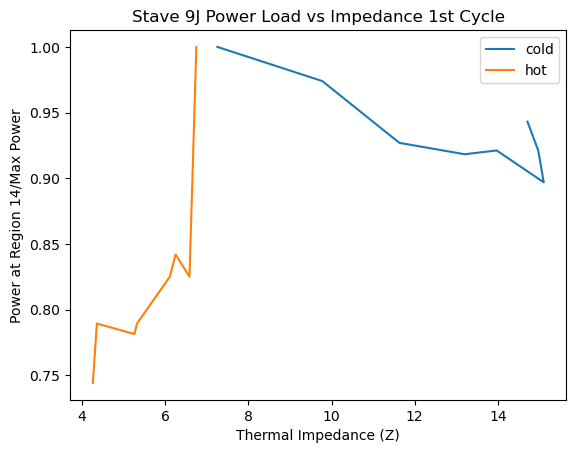

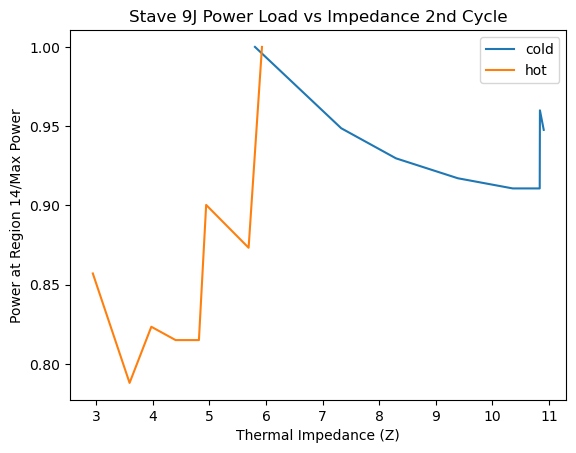

In [39]:
plt.plot(J9_cold1_swap[14,:,0], J9power_cold1/J9power_cold1.max(),)
plt.plot(J9_hot1_swap[14,:,0], abs(J9power_hot1/J9power_hot1.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 9J Power Load vs Impedance 1st Cycle")
plt.figure()

plt.plot(J9_cold2_swap[14,:,0], J9power_cold2/J9power_cold2.max(),)
#plt.plot(J11_cold[14,:,0], J11power_cold/J11power_cold.max())
plt.plot(J9_hot2_swap[14,:,0], abs(J9power_hot2/J9power_hot2.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 9J Power Load vs Impedance 2nd Cycle")

Text(0.5, 1.0, 'Stave 9J Impedance vs Time 2nd Cycle')

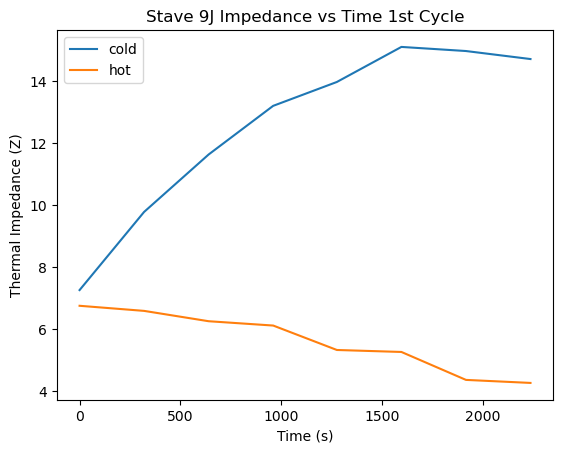

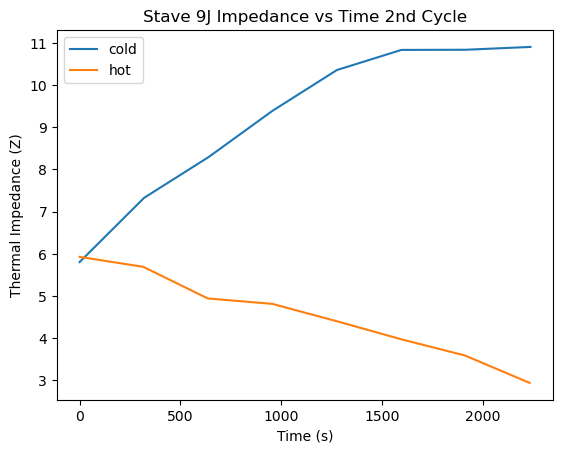

In [40]:
#plt.plot(J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0]-J9temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0].min(), J9_cold_swap[14,:,0],'o')
#plt.plot(J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0]-J9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0].min(), J9_hot_swap[14,:,0],'o')

plt.plot(J9temps[[0,1,2,3,4,5,6,7],0]-J9temps[[0,1,2,3,4,5,6,7],0].min(), J9_cold1_swap[14,:,0])
plt.plot(J9temps[[8,9,10,11,12,13,14,15],0]-J9temps[[8,9,10,11,12,13,14,15],0].min(), J9_hot1_swap[14,:,0])
plt.xlabel('Time (s)')
plt.ylabel('Thermal Impedance (Z)')
plt.legend(['cold', 'hot'])
plt.title("Stave 9J Impedance vs Time 1st Cycle")
plt.figure()

plt.plot(J9temps[[16,17,18,19,20,21,22,23],0]-J9temps[[16,17,18,19,20,21,22,23],0].min(), J9_cold2_swap[14,:,0])
plt.plot(J9temps[[24,25,26,27,28,29,30,31],0]-J9temps[[24,25,26,27,28,29,30,31],0].min(), J9_hot2_swap[14,:,0])
plt.xlabel('Time (s)')
plt.ylabel('Thermal Impedance (Z)')
plt.legend(['cold', 'hot'])
plt.title("Stave 9J Impedance vs Time 2nd Cycle")

# Stave 12

## Non-Insulating

In [41]:
J12_cold_1_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.407598964,3.51408616,4.779614554,4.974052307,4.972938106,5.063363597,5.075791156,4.99284251,4.866634281,4.810823369,4.690014079,4.427687682,4.630238591,5.168070564,4.643386126,3.978366242,3.711446807,3.934207123,4.023883605,3.937052045,3.877535404,3.840734998,3.718037007,3.748234599,3.829309215,3.722430239,3.830165198,5.259290423]] #large region top
J12_cold_1_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.906842515,4.064434483,5.301135469,5.514934651,5.506521506,5.605120516,5.604815667,5.538675951,5.438604786,5.379070377,5.2078093,4.973454054,5.151182839,5.753315546,5.214926994,4.506179931,4.23340369,4.449276996,4.574847225,4.475896493,4.395322155,4.329513285,4.265666569,4.292418104,4.386384603,4.27001895,4.393905638,5.79284982]]
J12_cold_1_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.994398953,5.035304142,6.278138433,6.481206355,6.423919415,6.516856526,6.525354748,6.503559209,6.396917547,6.408967132,6.263906223,6.054966018,6.354649823,6.982728223,6.486469263,5.630080746,5.276237078,5.544792051,5.671621908,5.571669825,5.501605297,5.444171368,5.359472532,5.410779666,5.583096722,5.47580199,5.612832026,7.060645179]]
J12_cold_1_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[6.127227568,5.248680264,6.262242461,6.500614584,6.429390947,6.462763776,6.460104268,6.464669395,6.412340541,6.399741641,6.3629264,6.183756205,6.502510851,7.099121581,6.766450445,6.011395901,5.639499309,5.85047824,5.921750808,5.836746936,5.78899353,5.721231306,5.705866412,5.788905161,5.970085963,5.886224459,6.02123609,7.272607025]]
J12_cold_1_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[7.154425506,6.227968455,7.442972901,7.645809446,7.569869213,7.634298293,7.659485139,7.609182456,7.553467911,7.571849133,7.521414949,7.369754509,7.665182982,8.505076993,7.798144364,6.879923346,6.488009169,6.685773969,6.793418332,6.668904609,6.607867168,6.562349795,6.551420486,6.613530234,6.81456057,6.753997194,6.908479562,8.323439508]]


J12_cold_2_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [5.818597661,5.023766066,6.166255893,6.377345163,6.346373786,6.444169666,6.446359952,6.418171369,6.326533697,6.275024701,6.135695322,5.9488962,6.223037581,6.919330642,6.215121699,5.521205836,5.247435863,5.386420549,5.495299176,5.426566719,5.411367962,5.37384847,5.33098267,5.37093052,5.482221297,5.43132516,5.52813321,6.724408495]]
J12_cold_2_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.681836001,5.894865271,7.027050296,7.153453845,7.17229695,7.244678242,7.295789327,7.256624562,7.185867474,7.172297983,7.020567669,6.85627108,7.193589991,7.870469516,7.102003445,6.414198544,6.116782833,6.271034278,6.346697973,6.26653558,6.246591739,6.231403355,6.174997686,6.235831249,6.38266072,6.359963877,6.479919018,7.717082707]]
J12_cold_2_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.922428088,6.197482941,7.29422045,7.454572137,7.469386678,7.524095871,7.598070729,7.52491082,7.43817473,7.486892633,7.384488072,7.19901787,7.581475577,8.346785591,7.536274811,6.812231237,6.473995366,6.599068191,6.671460805,6.581508883,6.540990314,6.537520198,6.48308978,6.540474864,6.706348939,6.714270922,6.823322895,8.046674589]]
J12_cold_2_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.799252942,7.01250995,8.108289876,8.324864281,8.306127351,8.328868225,8.366489141,8.373261159,8.286340533,8.380566869,8.309452904,8.137757782,8.540679487,9.297246562,8.466479108,7.726767336,7.364063494,7.487519342,7.5545699,7.444237632,7.403595576,7.385986989,7.349129741,7.435877925,7.640634323,7.611735083,7.761329597,8.942033024]]
J12_cold_2_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.50802791,6.843898321,7.920514438,8.043004884,8.029472804,8.066789625,8.094843888,8.091687789,8.059604815,8.115532833,8.053886296,8.000569864,8.396319667,9.004390648,8.23898101,7.592862371,7.236503441,7.335451852,7.367016567,7.262078017,7.228201099,7.208877612,7.217831532,7.303184821,7.497005264,7.522355129,7.618862114,8.713067993]]
J12_cold_2_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.052142124,7.397396815,8.445500764,8.565518078,8.554925728,8.628102674,8.630797641,8.604167335,8.567977701,8.660549139,8.634475022,8.58002332,9.003517343,9.700496287,8.892809744,8.212109096,7.826503707,7.931313361,7.946916934,7.825973883,7.761140011,7.754317109,7.759265012,7.850956731,8.049539878,8.124119424,8.221773097,9.320483719]]
J12_cold_2_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.651821257,7.987455748,9.016547223,9.168045992,9.137202931,9.204610984,9.245430961,9.216660404,9.165948574,9.333025735,9.315684026,9.292703182,9.716889219,10.36988067,9.547870506,8.866045761,8.495830643,8.54333855,8.565189092,8.444476778,8.410673743,8.431184066,8.429368588,8.521836413,8.733789527,8.783597966,8.907368779,9.973632374]]
J12_cold_2_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.976591965,8.327975409,9.314549307,9.452278533,9.441514386,9.504425297,9.502681728,9.513366407,9.498137269,9.610798485,9.641754179,9.612353859,10.02857742,10.74013121,10.13945989,9.422627015,9.006587145,9.054825924,9.093312597,8.982028129,8.940152449,8.936086002,8.920561584,8.964096588,9.165588374,9.253443934,9.347843465,10.39616336]]


J12_cold_3_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.501555094,5.662815548,6.546815668,6.693422509,6.695462577,6.781587594,6.795297907,6.790366548,6.760760454,6.748313372,6.698477174,6.573857415,6.852770888,7.555027692,7.042547042,6.324271895,6.031732731,6.136164574,6.213260321,6.143464108,6.126298172,6.066214709,5.995884178,6.040260429,6.182355393,6.171567804,6.253114824,7.492601121]]
J12_cold_3_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.770468732,5.951922867,7.0479666,7.192983623,7.190766609,7.285429365,7.345127232,7.301688131,7.201364853,7.236324988,7.194330339,7.076951772,7.400726272,8.07624365,7.324349522,6.647316052,6.320699287,6.427924187,6.447584237,6.360559244,6.346565041,6.34293626,6.253568744,6.278256073,6.43212671,6.421383973,6.520565512,7.744595929]]
J12_cold_3_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.707111408,6.041392061,7.101260609,7.219120869,7.239012158,7.303902736,7.33310465,7.302845402,7.231484921,7.262839373,7.221910427,7.092554495,7.423315242,8.071606148,7.385550187,6.748565329,6.417569238,6.519653264,6.565317002,6.45423417,6.425903288,6.428778505,6.356977452,6.418702533,6.589717767,6.584681451,6.647413693,7.768637341]]
J12_cold_3_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.94179419,7.134026257,8.161302061,8.343189234,8.32028903,8.382439651,8.471356953,8.433547788,8.356459951,8.397381016,8.368806991,8.24993934,8.644602371,9.331081226,8.542674268,7.850094729,7.500161049,7.621406868,7.636400607,7.522950297,7.495324553,7.50622449,7.41936488,7.503128855,7.694226132,7.711677633,7.791228444,9.019152821]]
J12_cold_3_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.190858975,7.396275227,8.442542027,8.592935929,8.582275781,8.635541613,8.671547293,8.64702036,8.588773155,8.681817144,8.63099559,8.559762487,8.971952199,9.748079294,8.88817944,8.156983017,7.80483131,7.903606209,7.939511241,7.812752556,7.751165072,7.74084203,7.693980786,7.782451948,7.997703256,8.035455995,8.121692663,9.341534986]]
J12_cold_3_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.331602178,7.477151477,8.383483717,8.557054321,8.503435116,8.546907946,8.58083247,8.554859892,8.546947143,8.646302675,8.659085895,8.605996409,9.04142214,9.791254518,9.204328879,8.439834051,8.050101094,8.139869201,8.170485102,8.062637141,8.036363351,8.05449885,8.03258677,8.169847259,8.415168172,8.457048429,8.534461468,9.70683854]]
J12_cold_3_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.265284739,7.62501879,8.657336628,8.777612623,8.724742658,8.762988594,8.829278711,8.803979558,8.730493075,8.8347775,8.83315604,8.770768678,9.192158793,9.891009466,9.063198569,8.389542494,8.03359438,8.112147474,8.100361193,7.99343872,7.954816501,7.957730681,7.913781014,8.022478573,8.244483528,8.322212035,8.394499678,9.433119272]]
J12_cold_3_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.620173768,7.953553185,8.983924129,9.11464149,9.070863553,9.103659533,9.177518416,9.186814257,9.134285628,9.264159784,9.265570232,9.212286924,9.656903474,10.45072629,9.590223287,8.840222463,8.451110578,8.52710668,8.528346171,8.388873836,8.347877057,8.337157861,8.294540471,8.418971986,8.650571943,8.718544928,8.804227076,9.845970477]]


J12_hot_1_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.448645513,4.341009479,5.403449615,5.598074885,5.599754795,5.710295986,5.843638701,5.978197232,6.112587642,6.283702989,6.503285853,6.44566755,6.506076649,6.543608086,5.654048752,5.295994844,5.243684129,5.387651935,5.254897422,5.088627158,4.949447473,4.898894953,4.969077228,5.134895217,5.208737854,5.215067272,5.309376084,6.067263169]]
J12_hot_1_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.43311009,4.370787962,5.448155351,5.695295984,5.742240491,5.78900108,5.859537572,6.06430492,6.269156109,6.445968441,6.55775757,6.487390811,6.364113957,6.536282104,5.696216492,5.365576999,5.294186426,5.398455008,5.348517998,5.192184657,5.101531196,4.967433189,5.007459511,5.24047309,5.316101966,5.328203161,5.380130399,6.102390106]]
J12_hot_1_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.208082681,4.123798226,5.290199529,5.468453764,5.471769313,5.582809136,5.715209818,5.779558272,5.999486348,6.175849066,6.328183411,6.13389854,6.190444491,6.317654539,5.435227294,5.136629191,5.027854631,5.172157927,4.988418947,4.915288648,4.805315268,4.719363189,4.79078851,4.95809098,4.993479143,4.965541521,4.999601887,5.777675307]]
J12_hot_1_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.988091887,3.987500128,5.132576461,5.324012211,5.374930994,5.433104325,5.524096494,5.703826756,5.916492564,6.10951295,6.026591746,5.737700776,5.922207997,6.116156379,5.33259295,4.976903048,4.994392154,5.174861388,5.062764149,4.844387337,4.712092151,4.535701821,4.621633242,4.854817392,4.89354261,4.791301481,4.839353131,5.602405739]]
J12_hot_1_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.931157156,3.900119495,5.073712745,5.249216906,5.276123563,5.439415,5.519378981,5.599274563,5.851909883,6.058834839,6.06766961,5.900347527,5.898685506,5.993499726,5.158043149,4.844578113,4.782615837,4.981798154,4.89880037,4.745125115,4.624944379,4.446930017,4.54683381,4.742554092,4.702385879,4.634840084,4.630422632,5.362111598]]


J12_hot_2_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.22296554,5.190083227,6.149517726,6.307760771,6.342521311,6.399154558,6.516586703,6.67793389,6.913580757,7.017478761,7.093777392,7.01990944,7.206141664,7.306415829,6.509122386,6.182772875,6.127267293,6.188848309,6.039543165,5.870126758,5.803731852,5.634369483,5.754145435,5.973729557,5.996470995,6.076647687,6.224485277,6.901185326]]
J12_hot_2_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.156715002,5.10996482,6.179657503,6.374711395,6.33719965,6.461564677,6.549764619,6.649938926,6.904767197,7.080896698,7.229288462,7.195564212,7.303444605,7.477833076,6.601281394,6.199512665,6.01543688,6.131865903,6.07874202,5.893670746,5.797064207,5.645481395,5.857233634,6.004581828,6.080461771,6.190990136,6.286712685,6.95251459]]
J12_hot_2_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.639725171,4.623688432,5.670651396,5.874159833,5.931368563,6.030426838,6.125274618,6.278747638,6.50645148,6.60672179,6.758255619,6.766530923,6.702365016,6.780968296,5.992949269,5.708986608,5.590401098,5.642779326,5.604973919,5.438432128,5.307062337,5.192563682,5.374980315,5.480948773,5.471035551,5.469661536,5.524739484,6.214279976]]
J12_hot_2_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.369670372,4.327412044,5.413051483,5.637388949,5.712660307,5.75750459,5.884189754,6.022983973,6.290215159,6.498229616,6.51965517,6.279704147,6.391230434,6.539661849,5.69365788,5.334857125,5.328935104,5.57051592,5.487990385,5.299188695,5.187706067,4.944469988,5.027368863,5.204364952,5.236292007,5.249388446,5.280389971,5.970184578]]
J12_hot_2_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.761834687,4.671485905,5.827187854,6.08508013,6.124173943,6.260692219,6.427455841,6.503910803,6.658270698,6.996402078,7.170464796,6.945826627,7.048032182,7.049654917,6.341989574,5.884452718,5.742762026,5.967808408,5.884467085,5.737095129,5.66047492,5.484747964,5.553148038,5.752521535,5.777509298,5.731991796,5.678314224,6.509896545]]
J12_hot_2_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.418515737,4.331433107,5.447868571,5.711647082,5.728936193,5.841080188,6.105392134,6.166655943,6.31663887,6.507007484,6.653976341,6.525154131,6.529304287,6.643947085,5.762821536,5.353484136,5.261731446,5.445114829,5.583580779,5.376735142,5.234206112,5.062460515,5.150211354,5.299539349,5.411862754,5.297598269,5.251318032,6.014733382]]
J12_hot_2_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.147212702,4.058273456,5.273622883,5.553296475,5.582961053,5.68123409,5.898019877,5.995835317,6.174650821,6.487957994,6.391046595,6.098323734,6.185749724,6.394071691,5.661780807,5.244931405,5.072647241,5.336822932,5.459344851,5.161577883,5.054825936,4.91158047,5.000305455,5.113528836,5.136893526,4.990175302,4.92014826,5.797878691]]
J12_hot_2_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.391209148,3.328215179,4.554159874,4.780049967,4.776887829,4.967515877,5.069052605,5.211020466,5.360021561,5.520739062,5.547766612,5.435652791,5.565659297,5.600586599,4.69116313,4.353399836,4.26983847,4.463248749,4.367806177,4.224792207,4.121627259,3.961078276,4.02985846,4.176162136,4.175011726,4.025910086,3.952925738,4.737031273]]


J12_hot_3_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.603133886,5.501092535,6.404717184,6.555427963,6.59978325,6.696316976,6.793442982,7.036512346,7.199244892,7.333062654,7.560456302,7.664631148,7.756600396,7.841190262,6.902481107,6.557777714,6.486931556,6.401239206,6.239793305,6.108072993,6.037410197,5.905984435,6.041455085,6.263824217,6.289663413,6.395521686,6.62144686,7.327653862]]
J12_hot_3_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.027759808,4.952105772,5.950452924,6.103320088,6.123127115,6.204143373,6.375549387,6.546592595,6.750157942,6.870632764,6.922976077,6.944699677,7.105110359,7.25245506,6.48479527,6.101405725,5.946115169,5.937464286,5.817113906,5.673188456,5.640297654,5.528741447,5.632308639,5.827865622,5.92779153,5.955739537,6.077778545,6.843913793]]
J12_hot_3_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.126303313,4.105479124,5.167896955,5.392334565,5.37666058,5.444233921,5.622820487,5.706933417,5.824939362,5.986994885,6.112944117,6.129962487,6.232291994,6.384599192,5.514003466,5.128475321,5.058076782,5.026698676,4.880842912,4.755992069,4.683086186,4.610283521,4.603470168,4.825575474,4.910085439,4.889400693,4.900281508,5.614196866]]
J12_hot_3_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.189806513,4.142155832,5.206843706,5.398925342,5.426165376,5.559230141,5.68884957,5.837998799,6.076769104,6.238309941,6.351962111,6.331327942,6.349429918,6.494027477,5.894656888,5.432726497,5.385337972,5.37220693,5.281289804,5.144868325,5.121360792,4.880403232,4.99194881,5.223047042,5.279423555,5.20736743,5.242977498,6.015958492]]
J12_hot_3_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.313968696,4.248083329,5.420481669,5.55826622,5.600409178,5.792405162,5.922817627,5.939013502,6.161126357,6.361686598,6.39018398,6.312092454,6.462374051,6.722884301,5.705932597,5.294028919,5.321634187,5.50884772,5.456579258,5.196492238,5.053417575,4.857971039,4.88109524,5.079954583,5.166787638,5.164134315,5.137681028,5.935924444]]
J12_hot_3_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.604109675,3.596941403,4.724767118,4.925046966,4.952639142,5.088977391,5.244062747,5.370795442,5.569944617,5.761240546,5.909029108,5.761487599,5.695980303,5.893454349,5.05290863,4.627881272,4.564427753,4.653465486,4.528477511,4.453592765,4.4065123,4.248805043,4.237130867,4.397241615,4.393805369,4.320364044,4.370362844,5.067503773]]
J12_hot_3_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.860927371,3.804847043,4.978191098,5.273422548,5.21499444,5.346385612,5.575360388,5.686309271,5.890671158,6.146675789,6.181169063,5.979761847,6.142070559,6.167488662,5.234351405,4.86570236,4.706791837,4.900488142,4.917928965,4.731473504,4.653199677,4.413344476,4.48933374,4.611273083,4.694684575,4.566278166,4.527581884,5.368734761]]
J12_hot_3_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.94911932,3.842502376,4.95138263,5.272944778,5.355234578,5.428921108,5.560048764,5.622677182,5.873601763,6.146863553,6.192427606,5.99980056,6.073218611,6.175233472,5.236188177,4.846984925,4.786076824,5.09320352,5.033312886,4.740712472,4.554482991,4.406568185,4.485869987,4.674857583,4.701079635,4.553042897,4.547583376,5.462738944]]

               
               
               
               
L12_cold_1_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [4.565858936,3.565506029,4.233993664,4.399462135,4.3372038,4.287080592,4.415437291,4.476270229,4.637082955,4.854152157,4.791142863,4.625737854,4.932339924,5.605665939,4.522812186,4.034458087,3.857761007,3.997461053,4.093911858,4.056704432,4.053260749,4.113446327,4.172754123,4.33321754,4.40335602,4.382811874,4.565598692,6.331769896]]
L12_cold_1_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [5.149459311,4.109335732,4.762110457,4.948821286,4.863950566,4.820050501,4.961863978,5.045673444,5.226542599,5.448163128,5.349567621,5.187427555,5.567197647,6.352549631,5.320534248,4.673789991,4.428158439,4.538283021,4.655401054,4.623470843,4.607057371,4.680794577,4.726381385,4.902715862,4.997161198,5.003311761,5.202105846,6.980459102]]
L12_cold_1_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.352845457,5.161861785,5.782420205,5.949663458,5.80626768,5.799155305,5.928731161,5.982948686,6.172781172,6.399338653,6.40436464,6.297906151,6.749447533,7.445552883,6.315040772,5.782510504,5.512724904,5.598895921,5.636857634,5.592374379,5.641542603,5.731286897,5.812617378,5.991439745,6.186325755,6.239552744,6.45614185,8.395535051]]
L12_cold_1_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.45602264,5.527964161,6.189676159,6.340271481,6.199748556,6.187935856,6.334626608,6.431265666,6.616494149,6.865097315,6.868341393,6.750580395,7.151486351,7.804696856,6.738649984,6.27885328,5.987158457,6.078754879,6.137420806,6.074032642,6.091800556,6.176431294,6.230422467,6.415438993,6.608090569,6.7004936,6.900496884,8.506764394]]
L12_cold_1_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.69762437,6.740120516,7.381029449,7.50326727,7.37403451,7.393196126,7.512044596,7.574170629,7.780591398,8.070935369,8.114125513,8.084191683,8.568707934,9.17120276,8.046349122,7.56837559,7.210333489,7.23854187,7.268163675,7.194361529,7.214409468,7.306371858,7.395308058,7.593211331,7.831478256,7.942557066,8.134794676,9.715183406]]
L12_cold_1_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.191718977,7.107413583,7.710692925,7.871438211,7.706890726,7.654266846,7.749831162,7.862720258,8.076449292,8.393071882,8.447128489,8.424644037,8.927037976,9.631617521,8.535245139,7.942376547,7.582320516,7.613968627,7.646688607,7.523428169,7.549505336,7.623008601,7.726397124,7.964935641,8.26233032,8.384223214,8.591016749,10.3182888]]
L12_cold_1_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.4955762,7.637299218,8.226836888,8.367737131,8.221625683,8.209820078,8.288383458,8.385557727,8.646096506,8.936333414,8.998055822,9.047406474,9.588171175,10.27218464,9.148108699,8.546861203,8.195412295,8.218867058,8.230900303,8.137242056,8.11399749,8.215110361,8.37071525,8.607138747,8.879131442,9.013579597,9.257784598,10.714817]]
L12_cold_1_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [9.085467637,8.118680961,8.699659045,8.790389984,8.665996336,8.623649905,8.694622897,8.810755354,9.032125923,9.341803953,9.404607356,9.408776237,9.939381485,10.64596303,9.492125721,8.897911291,8.540615429,8.580577157,8.636014098,8.517451467,8.517313151,8.618599681,8.756071677,9.007293619,9.31204882,9.474979682,9.694961204,11.31399728]]


L12_cold_2_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.230472498,5.23184233,5.914310916,5.951807329,5.887987659,5.888910063,5.964899259,6.04476104,6.243758589,6.451142897,6.43784535,6.382761313,6.720181574,7.374048696,6.415735653,5.869615941,5.62499166,5.645368774,5.66352019,5.616775136,5.61094414,5.663505322,5.754058727,5.885493834,5.994891272,6.080743349,6.261057744,7.928683518]]
L12_cold_2_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.380199853,5.463122763,6.042614041,6.129808237,6.022764881,5.982977243,6.063891862,6.127390432,6.277456605,6.451376644,6.531930683,6.432195944,6.758180743,7.374277507,6.638692563,6.11095706,5.879872527,5.871124862,5.866142656,5.817374559,5.795825258,5.851262659,5.905748114,6.065195518,6.196042322,6.277465825,6.498571746,8.101913491]]
L12_cold_2_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.18090098,5.503276775,6.139180025,6.212461141,6.103333039,6.095401353,6.203527659,6.295098413,6.468010988,6.666529868,6.735066705,6.68593652,7.04500618,7.651729532,6.709618761,6.219273275,5.960008141,5.986487417,5.991926235,5.92131495,5.898230138,5.953440882,6.00719091,6.169457108,6.340548976,6.449281032,6.632730393,7.926275525]]
L12_cold_2_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.2879611,6.419108188,7.034648595,7.173042003,7.031393116,6.974800306,7.106119751,7.216889125,7.381288444,7.6115023,7.714392818,7.693793183,8.065350475,8.710124082,7.752622371,7.192113602,6.893326916,6.92416071,6.911434305,6.864039754,6.850949812,6.908031138,6.964906843,7.162709404,7.366289743,7.464997933,7.672092279,9.163356877]]
L12_cold_2_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.667227566,7.651883956,8.216921518,8.323189115,8.22045667,8.207075007,8.252978777,8.354854392,8.568653364,8.867487699,8.886810875,8.899295671,9.386051789,10.08738074,9.09306777,8.42628487,8.093757516,8.117911136,8.11588019,8.024658065,8.03713928,8.117290789,8.238363206,8.451927129,8.67960588,8.831064743,9.065708188,10.71347732]]
L12_cold_2_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.361124868,7.645065192,8.260678849,8.324916577,8.22295939,8.198369357,8.266211648,8.316733349,8.505263741,8.768996755,8.844110581,8.882734493,9.314236728,9.919443318,8.891605213,8.378047417,8.06256587,8.042397644,8.035816639,7.982454644,8.009012047,8.088090105,8.189370089,8.380821069,8.616628337,8.780346495,8.968248972,10.28584588]]
L12_cold_2_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [9.136451014,8.228468807,8.834714404,8.941407134,8.785014839,8.746311241,8.847094738,8.934983724,9.119399796,9.406981232,9.511987781,9.544653471,9.987088285,10.62453923,9.637694355,9.042973279,8.714487039,8.678531206,8.664385183,8.549953047,8.537015208,8.621234026,8.73268583,8.923232524,9.201807907,9.362011308,9.564372302,11.05935768]]
L12_cold_2_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [9.263109813,8.413933641,9.093734818,9.241407881,9.153907571,9.21538846,9.336563305,9.451597111,9.652563213,9.948993773,9.977272374,10.10967183,10.60321812,11.27595353,9.82573652,9.215675251,8.869689051,8.864535926,8.831991918,8.730106138,8.717107986,8.800898626,8.945153955,9.142509703,9.405239009,9.583209692,9.786652158,11.1795851]]


L12_cold_3_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.468040886,5.554174721,6.184349066,6.292616709,6.214445802,6.212946082,6.301582902,6.375260179,6.529565184,6.758752135,6.780315306,6.701885573,7.072874439,7.66334322,6.661644295,6.193597604,5.931885466,5.958134277,5.975035833,5.930187413,5.924798918,5.992811009,6.064001827,6.22836544,6.340942142,6.410876349,6.592173186,8.200859247]]
L12_cold_3_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [5.863617872,5.325338152,5.98962368,6.099378149,6.011891239,5.995842604,6.086503325,6.157739566,6.323593318,6.521935518,6.538848219,6.471820499,6.802359519,7.484262922,6.657636247,5.995618486,5.74569165,5.787731881,5.800357758,5.755370454,5.741617305,5.786781863,5.851088586,6.008731489,6.113823872,6.184247757,6.353484258,7.488631448]]
L12_cold_3_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.611470183,6.900512364,7.603479511,7.772620383,7.705483089,7.851350385,8.038393662,8.160990834,8.363808163,8.628177038,8.599070977,8.630651281,9.113811587,9.893065951,8.210249394,7.565523927,7.229489604,7.287983303,7.291215185,7.219954301,7.200960165,7.256427442,7.350794376,7.494957409,7.69478705,7.793963217,7.981572604,9.231491278]]
L12_cold_3_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.835386517,6.943101784,7.641949103,7.824171904,7.739046956,7.8359942,8.021241868,8.117358311,8.312170841,8.547687518,8.571564456,8.650265799,9.09489665,9.790111192,8.192545121,7.638252426,7.304691041,7.304172063,7.323067288,7.256580544,7.222218132,7.298873631,7.380330001,7.561081458,7.760075784,7.85272825,8.065017431,9.548594405]]
L12_cold_3_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.3126398,7.40358197,8.10318352,8.261335201,8.19351634,8.259414927,8.438212017,8.587011791,8.774908439,9.019281697,9.076128448,9.079397108,9.56853563,10.23782713,8.618587689,8.094189423,7.800129948,7.816489719,7.779642166,7.684105774,7.65654285,7.706231732,7.806537442,7.980555659,8.192046986,8.319388119,8.528986874,10.02204835]]
L12_cold_3_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.142147152,7.412153569,8.154605306,8.231576384,8.156719512,8.245219675,8.41454255,8.522617314,8.708253133,8.948175688,8.978237739,9.008218348,9.453898677,10.06465484,8.613488227,8.069319828,7.792151502,7.764254919,7.718459203,7.614427405,7.595017465,7.653702595,7.729889406,7.876687382,8.08436298,8.228632753,8.370558172,9.615937645]]
L12_cold_3_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.889893414,8.156265399,8.871675292,8.999896252,8.934659471,9.007203848,9.182783782,9.310913186,9.467398683,9.76393435,9.788626374,9.849628036,10.39558997,11.02447126,9.448823256,8.933946172,8.57301761,8.580178688,8.548743921,8.446937724,8.471012466,8.521113191,8.607814366,8.818182842,9.055373147,9.205458673,9.35225858,10.59497081]]
L12_cold_3_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [9.962240604,9.072884971,9.780485604,9.878128841,9.805408295,9.924966046,10.11557259,10.2359926,10.42922182,10.73610461,10.77710619,10.82217906,11.39845554,12.04159795,10.45507993,9.936044861,9.560037626,9.535210287,9.526625365,9.399010114,9.429477806,9.515244242,9.597030065,9.792934637,10.08214945,10.26448301,10.43366595,11.85286509]]



L12_hot_1_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [4.723175896,4.727583176,5.47044076,5.47570978,5.509172666,5.543014918,5.551750376,5.708550576,5.812117848,5.967993581,6.136568064,6.316336431,6.398806187,6.700812834,5.949031844,5.676689911,5.537705378,5.345298946,5.272002645,5.265417367,5.223382883,5.209277492,5.361258493,5.489880236,5.62636135,5.915336022,6.018833673,6.581140475]]
L12_hot_1_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.168481973,4.216656769,4.998617041,4.997841354,4.994712322,4.961054785,4.936319953,5.005123254,5.121468812,5.28330761,5.465999334,5.526092095,5.727000043,6.007468114,5.60191974,5.458377963,5.405155239,5.318540653,5.24750424,5.160931242,5.095259284,5.027802988,5.044725428,5.194652381,5.226212932,5.314716817,5.304417424,5.777139399]]
L12_hot_1_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.918345459,3.962695852,4.798294997,4.833624678,4.836290747,4.775302794,4.839819443,4.908702332,5.052759102,5.216095313,5.332540802,5.34067128,5.602635148,5.949856843,5.516713848,5.357624914,5.283273562,5.242714384,5.231772931,5.108120681,5.004270143,4.99396189,5.02866564,5.152858374,5.124047325,5.156747479,5.159648866,5.663191282]]
L12_hot_1_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.642973582,3.714375847,4.572691954,4.602677176,4.598730816,4.52883595,4.570271606,4.657389668,4.778927011,4.964724373,5.100853849,5.132621312,5.268958669,5.613849725,5.134662394,5.030101508,5.064355005,5.014145679,4.948247734,4.804503086,4.788694824,4.751845866,4.740189564,4.79231481,4.853454466,4.86717083,4.81563769,5.297031109]]
L12_hot_1_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.400985717,3.444779996,4.334626032,4.376897429,4.405150291,4.348911717,4.38727916,4.449751175,4.619679607,4.845226,5.036273594,5.075104881,5.220315678,5.429787,4.790325776,4.750393545,4.659781786,4.70038051,4.734611315,4.579529321,4.498462864,4.493347081,4.475561584,4.521333022,4.551225296,4.523672615,4.486837203,4.979079112]]
L12_hot_1_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.972292231,3.069080104,3.989154904,4.007656242,3.958042846,3.966091582,4.012448744,4.088313495,4.192647289,4.392967091,4.528113744,4.412479195,4.599489109,4.888658093,4.536377369,4.436078818,4.432830581,4.464533911,4.407050411,4.282260707,4.219922346,4.24561613,4.16144916,4.257053344,4.351063546,4.279971385,4.21934293,4.77994474]]
L12_hot_1_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.167253496,2.304761528,3.241108691,3.327976327,3.304741913,3.248575261,3.296315297,3.408592041,3.519199572,3.638828757,3.739389763,3.65599451,3.850872118,4.113982767,3.645596758,3.573841162,3.57423968,3.63206663,3.60204471,3.493159141,3.505160172,3.416974442,3.362411425,3.466370009,3.52180833,3.45026529,3.407618898,3.872266869]]
L12_hot_1_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.697826209,2.754177339,3.735312166,3.786300762,3.748278388,3.68033509,3.727572004,3.852800739,4.008749602,4.219826586,4.231166314,4.083352358,4.337253645,4.649822652,4.184983667,4.025645586,4.061744583,4.094912424,4.131577096,3.993803554,3.927313729,3.914247547,3.92029993,3.993935911,4.057997434,3.968371737,3.887361254,4.466061937]]

L12_hot_2_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.292473139,5.269910429,6.038395608,6.030176981,6.02511601,6.037156571,5.995669183,6.137668556,6.352625276,6.573854905,6.708985511,6.779815001,7.018864469,7.338152316,6.814068642,6.696627022,6.700853703,6.641093164,6.588079253,6.469621084,6.398556592,6.401194282,6.406734748,6.515033735,6.608902829,6.67764529,6.689594707,7.253551832]]
L12_hot_2_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.981770979,4.062800086,4.916787492,4.915922335,4.910588303,4.87035879,4.89497359,5.013169566,5.138537987,5.353778138,5.485175823,5.487549975,5.713816559,6.025501474,5.481714821,5.334957352,5.315579536,5.167728046,5.1180991,5.097834626,5.106866891,5.117488183,5.093898193,5.21421135,5.259053696,5.306206783,5.296698483,5.793500114]]
L12_hot_2_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.03236132,4.092871742,4.956731966,4.942078524,4.964593595,4.946332231,4.940497154,5.056330943,5.213308641,5.421169047,5.552645444,5.525095153,5.79119704,6.108160008,5.430234575,5.296725644,5.281835288,5.256002527,5.2129306,5.181898934,5.083667101,5.026269381,5.047765781,5.155904464,5.222484236,5.234190896,5.143734124,5.691594961]]
L12_hot_2_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.864263858,3.881996658,4.745590531,4.809430378,4.79915653,4.737867191,4.711865382,4.905889879,5.077015759,5.288866231,5.399864885,5.305395308,5.506226954,5.743995388,5.430921797,5.299997421,5.300679615,5.305076111,5.299155564,5.167248122,5.032469752,5.010057496,5.095383701,5.217788061,5.245851335,5.197095536,5.165107006,5.779029602]]
L12_hot_2_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.558797091,3.610695259,4.470817034,4.543685348,4.492665566,4.476878583,4.447312702,4.600633455,4.772870551,4.955221881,5.034430994,4.944913238,5.084768274,5.35266482,5.123890486,4.952298247,5.033109736,5.034975259,5.096390837,4.964634564,4.888645297,4.892846312,4.941314304,5.022730255,5.069616523,4.956488239,4.930482957,5.505723264]]
L12_hot_2_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.059365436,3.138054396,4.058944819,4.08139262,4.08206609,4.074950857,4.03907789,4.193230053,4.324158643,4.514149772,4.583725668,4.419594998,4.610240676,4.845995209,4.54174934,4.386184818,4.3390598,4.422192164,4.516998651,4.397983764,4.194756452,4.144568526,4.245811143,4.262126205,4.299790041,4.237990976,4.146360497,4.65882847]]
L12_hot_2_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.161769162,3.20408764,4.168840222,4.229617149,4.169595521,4.095924514,4.092700211,4.245654389,4.463252083,4.764708368,4.804928329,4.624807797,4.734939888,5.005379477,4.53650075,4.453584025,4.423828819,4.505227237,4.575361772,4.443753221,4.309541037,4.285696307,4.307794384,4.408280235,4.511362245,4.421607748,4.296158439,4.880991524]]
L12_hot_2_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.081245009,3.07081548,4.020733805,4.132638443,4.143708509,4.09568754,4.074690323,4.225938849,4.46137015,4.703009239,4.746881383,4.664535515,4.707023074,4.989951299,4.535716247,4.470883462,4.463819022,4.603292069,4.592578262,4.343523807,4.192678668,4.196760489,4.263985079,4.396432106,4.414440212,4.26975086,4.210093195,4.871139251]]


L12_hot_3_0 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.094092265,4.208358112,5.107371831,5.089696743,5.017100601,4.979224074,4.927562043,5.057320098,5.268918813,5.40912511,5.473924022,5.519037969,5.731207463,5.994175818,5.44538509,5.321563437,5.27401399,5.18690221,5.154540492,5.100865951,4.989634766,4.92221102,4.981272212,5.126573349,5.181028377,5.211681352,5.24525733,5.753333808]]
L12_hot_3_5 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.662897062,4.731957846,5.555227389,5.563859492,5.573817322,5.532394698,5.523902361,5.658083026,5.787182645,5.986809462,6.178677674,6.148296216,6.423462401,6.770531781,6.148921019,6.074596088,5.975442986,5.977947126,5.897615509,5.793748514,5.72932842,5.643355743,5.772375622,5.896815439,5.945739049,5.966480798,5.951327418,6.400383052]]
L12_hot_3_10 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.268644076,4.263153602,5.098960541,5.100921551,5.138844586,5.081885156,5.076825576,5.164523319,5.27634666,5.447819267,5.60060712,5.552713598,5.811364558,6.026308013,5.833919567,5.748995665,5.694204844,5.72665132,5.667024023,5.515650922,5.499261607,5.487760711,5.52676057,5.62475017,5.652946154,5.64303571,5.612154149,6.181823741]]
L12_hot_3_15 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.486120818,4.426657294,5.296057883,5.352294171,5.380138989,5.328314913,5.325608045,5.44486597,5.600873383,5.858527143,5.958663064,5.976403743,6.222458653,6.420162453,5.947225998,5.813098955,5.865283338,5.870782446,5.864891097,5.668733272,5.644157858,5.622872591,5.636661407,5.73265092,5.777460469,5.752769035,5.7556047,6.387275589]]
L12_hot_3_20 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.726270935,3.745163707,4.608841695,4.689757307,4.670102132,4.600166252,4.639464129,4.776319408,4.974709734,5.237347966,5.303072725,5.200062368,5.395752466,5.681098106,5.356655748,5.191569682,5.198259027,5.302142644,5.270155705,5.091389702,5.01977125,4.981101753,4.935361631,5.047729474,5.114439626,5.107726065,5.07800566,5.653150322]]
L12_hot_3_25 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.371306633,3.407872861,4.282512921,4.329286835,4.273155267,4.220378697,4.311948762,4.437554165,4.557878737,4.74047519,4.8495625,4.734307292,4.892813361,5.140246103,4.858076947,4.789369652,4.764918975,4.814877832,4.75960539,4.631916234,4.609978058,4.581963834,4.556355892,4.752542892,4.767387452,4.717428201,4.621320595,5.205459956]]
L12_hot_3_30 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.867883454,2.953471353,3.875000159,3.946914448,3.908666122,3.858043197,3.916689414,4.016747862,4.173293188,4.304383286,4.346141985,4.23242998,4.384169891,4.572944436,4.383236125,4.356632288,4.326363139,4.345012138,4.351575236,4.219169854,4.167930206,4.144542586,4.069113805,4.153022889,4.177767295,4.044605092,4.012743563,4.542124032]]
L12_hot_3_35 = [[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.748681525,2.795264787,3.7419244,3.838916208,3.826469298,3.824500216,3.796468704,3.9055905,4.064725437,4.293058858,4.325183685,4.194041838,4.354026725,4.669858718,4.145386699,4.016141202,4.03854642,4.160065844,4.13550904,3.90482461,3.816943409,3.863610403,3.899135576,3.916459087,4.007777815,3.844616904,3.803235046,4.415954682]]





### Side L 

<Figure size 640x480 with 0 Axes>

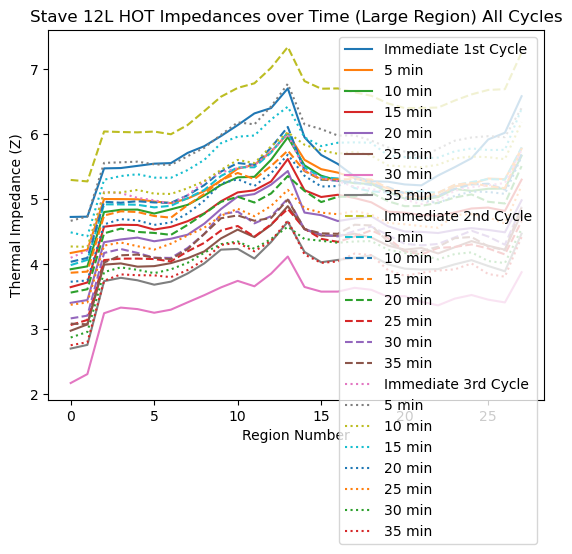

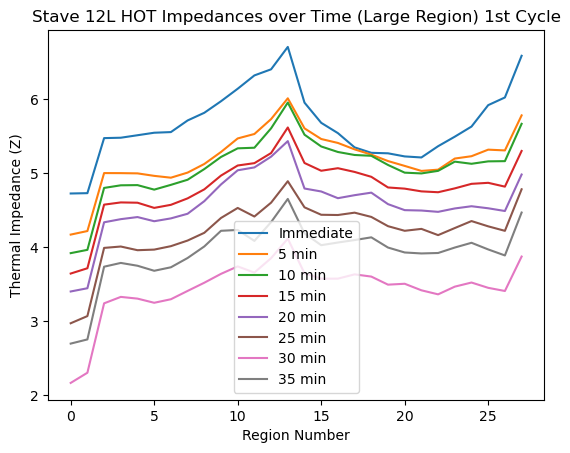

<Figure size 640x480 with 0 Axes>

In [42]:
plt.plot(L12_hot_1_0[0],L12_hot_1_0[1],
        L12_hot_1_5[0],L12_hot_1_5[1],
        L12_hot_1_10[0],L12_hot_1_10[1],
        L12_hot_1_15[0],L12_hot_1_15[1],
        L12_hot_1_20[0],L12_hot_1_20[1],
        L12_hot_1_25[0],L12_hot_1_25[1],
        L12_hot_1_30[0],L12_hot_1_30[1],
        L12_hot_1_35[0],L12_hot_1_35[1]
        
        )

plt.plot(L12_hot_2_0[0],L12_hot_2_0[1],
        L12_hot_2_5[0],L12_hot_2_5[1], 
        L12_hot_2_10[0],L12_hot_2_10[1],
        L12_hot_2_15[0],L12_hot_2_15[1],
        L12_hot_2_20[0],L12_hot_2_20[1],
        L12_hot_2_25[0],L12_hot_2_25[1],
        L12_hot_2_30[0],L12_hot_2_30[1],
        L12_hot_2_35[0],L12_hot_2_35[1],
        linestyle='dashed'
        )

plt.plot(L12_hot_3_0[0],L12_hot_3_0[1],
        L12_hot_3_5[0],L12_hot_3_5[1],
        L12_hot_3_10[0],L12_hot_3_10[1],
        L12_hot_3_15[0],L12_hot_3_15[1],
        L12_hot_3_20[0],L12_hot_3_20[1],
        L12_hot_3_25[0],L12_hot_3_25[1],
        L12_hot_3_30[0],L12_hot_3_30[1],
        L12_hot_3_35[0],L12_hot_3_35[1],
        linestyle='dotted'
        )



plt.legend(['Immediate 1st Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate 2nd Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate 3rd Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L HOT Impedances over Time (Large Region) All Cycles")
plt.figure()


plt.plot(L12_hot_1_0[0],L12_hot_1_0[1],
        L12_hot_1_5[0],L12_hot_1_5[1],
        L12_hot_1_10[0],L12_hot_1_10[1],
        L12_hot_1_15[0],L12_hot_1_15[1],
        L12_hot_1_20[0],L12_hot_1_20[1],
        L12_hot_1_25[0],L12_hot_1_25[1],
        L12_hot_1_30[0],L12_hot_1_30[1],
        L12_hot_1_35[0],L12_hot_1_35[1]
        
        )
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L HOT Impedances over Time (Large Region) 1st Cycle")
plt.figure()


#plt.plot(J9_hot1_swap[:,:,0])
#plt.plot(J9_hot2_swap[:,:,0], linestyle='dashed')
#plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
#plt.xlabel("Region Number")
#plt.ylabel("Thermal Impedance (Z)")
#plt.title("Stave 9J HOT Impedances over Time (Large Region) Both Cycles")

In [43]:
arr_L12_hot_1_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [4.723175896,4.727583176,5.47044076,5.47570978,5.509172666,5.543014918,5.551750376,5.708550576,5.812117848,5.967993581,6.136568064,6.316336431,6.398806187,6.700812834,5.949031844,5.676689911,5.537705378,5.345298946,5.272002645,5.265417367,5.223382883,5.209277492,5.361258493,5.489880236,5.62636135,5.915336022,6.018833673,6.581140475]])
arr_L12_hot_1_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.168481973,4.216656769,4.998617041,4.997841354,4.994712322,4.961054785,4.936319953,5.005123254,5.121468812,5.28330761,5.465999334,5.526092095,5.727000043,6.007468114,5.60191974,5.458377963,5.405155239,5.318540653,5.24750424,5.160931242,5.095259284,5.027802988,5.044725428,5.194652381,5.226212932,5.314716817,5.304417424,5.777139399]])
arr_L12_hot_1_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.918345459,3.962695852,4.798294997,4.833624678,4.836290747,4.775302794,4.839819443,4.908702332,5.052759102,5.216095313,5.332540802,5.34067128,5.602635148,5.949856843,5.516713848,5.357624914,5.283273562,5.242714384,5.231772931,5.108120681,5.004270143,4.99396189,5.02866564,5.152858374,5.124047325,5.156747479,5.159648866,5.663191282]])
arr_L12_hot_1_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.642973582,3.714375847,4.572691954,4.602677176,4.598730816,4.52883595,4.570271606,4.657389668,4.778927011,4.964724373,5.100853849,5.132621312,5.268958669,5.613849725,5.134662394,5.030101508,5.064355005,5.014145679,4.948247734,4.804503086,4.788694824,4.751845866,4.740189564,4.79231481,4.853454466,4.86717083,4.81563769,5.297031109]])
arr_L12_hot_1_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.400985717,3.444779996,4.334626032,4.376897429,4.405150291,4.348911717,4.38727916,4.449751175,4.619679607,4.845226,5.036273594,5.075104881,5.220315678,5.429787,4.790325776,4.750393545,4.659781786,4.70038051,4.734611315,4.579529321,4.498462864,4.493347081,4.475561584,4.521333022,4.551225296,4.523672615,4.486837203,4.979079112]])
arr_L12_hot_1_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.972292231,3.069080104,3.989154904,4.007656242,3.958042846,3.966091582,4.012448744,4.088313495,4.192647289,4.392967091,4.528113744,4.412479195,4.599489109,4.888658093,4.536377369,4.436078818,4.432830581,4.464533911,4.407050411,4.282260707,4.219922346,4.24561613,4.16144916,4.257053344,4.351063546,4.279971385,4.21934293,4.77994474]])
arr_L12_hot_1_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.167253496,2.304761528,3.241108691,3.327976327,3.304741913,3.248575261,3.296315297,3.408592041,3.519199572,3.638828757,3.739389763,3.65599451,3.850872118,4.113982767,3.645596758,3.573841162,3.57423968,3.63206663,3.60204471,3.493159141,3.505160172,3.416974442,3.362411425,3.466370009,3.52180833,3.45026529,3.407618898,3.872266869]])
arr_L12_hot_1_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.697826209,2.754177339,3.735312166,3.786300762,3.748278388,3.68033509,3.727572004,3.852800739,4.008749602,4.219826586,4.231166314,4.083352358,4.337253645,4.649822652,4.184983667,4.025645586,4.061744583,4.094912424,4.131577096,3.993803554,3.927313729,3.914247547,3.92029993,3.993935911,4.057997434,3.968371737,3.887361254,4.466061937]])

arr_L12_hot_2_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.292473139,5.269910429,6.038395608,6.030176981,6.02511601,6.037156571,5.995669183,6.137668556,6.352625276,6.573854905,6.708985511,6.779815001,7.018864469,7.338152316,6.814068642,6.696627022,6.700853703,6.641093164,6.588079253,6.469621084,6.398556592,6.401194282,6.406734748,6.515033735,6.608902829,6.67764529,6.689594707,7.253551832]])
arr_L12_hot_2_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.981770979,4.062800086,4.916787492,4.915922335,4.910588303,4.87035879,4.89497359,5.013169566,5.138537987,5.353778138,5.485175823,5.487549975,5.713816559,6.025501474,5.481714821,5.334957352,5.315579536,5.167728046,5.1180991,5.097834626,5.106866891,5.117488183,5.093898193,5.21421135,5.259053696,5.306206783,5.296698483,5.793500114]])
arr_L12_hot_2_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.03236132,4.092871742,4.956731966,4.942078524,4.964593595,4.946332231,4.940497154,5.056330943,5.213308641,5.421169047,5.552645444,5.525095153,5.79119704,6.108160008,5.430234575,5.296725644,5.281835288,5.256002527,5.2129306,5.181898934,5.083667101,5.026269381,5.047765781,5.155904464,5.222484236,5.234190896,5.143734124,5.691594961]])
arr_L12_hot_2_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.864263858,3.881996658,4.745590531,4.809430378,4.79915653,4.737867191,4.711865382,4.905889879,5.077015759,5.288866231,5.399864885,5.305395308,5.506226954,5.743995388,5.430921797,5.299997421,5.300679615,5.305076111,5.299155564,5.167248122,5.032469752,5.010057496,5.095383701,5.217788061,5.245851335,5.197095536,5.165107006,5.779029602]])
arr_L12_hot_2_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.558797091,3.610695259,4.470817034,4.543685348,4.492665566,4.476878583,4.447312702,4.600633455,4.772870551,4.955221881,5.034430994,4.944913238,5.084768274,5.35266482,5.123890486,4.952298247,5.033109736,5.034975259,5.096390837,4.964634564,4.888645297,4.892846312,4.941314304,5.022730255,5.069616523,4.956488239,4.930482957,5.505723264]])
arr_L12_hot_2_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.059365436,3.138054396,4.058944819,4.08139262,4.08206609,4.074950857,4.03907789,4.193230053,4.324158643,4.514149772,4.583725668,4.419594998,4.610240676,4.845995209,4.54174934,4.386184818,4.3390598,4.422192164,4.516998651,4.397983764,4.194756452,4.144568526,4.245811143,4.262126205,4.299790041,4.237990976,4.146360497,4.65882847]])
arr_L12_hot_2_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.161769162,3.20408764,4.168840222,4.229617149,4.169595521,4.095924514,4.092700211,4.245654389,4.463252083,4.764708368,4.804928329,4.624807797,4.734939888,5.005379477,4.53650075,4.453584025,4.423828819,4.505227237,4.575361772,4.443753221,4.309541037,4.285696307,4.307794384,4.408280235,4.511362245,4.421607748,4.296158439,4.880991524]])
arr_L12_hot_2_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.081245009,3.07081548,4.020733805,4.132638443,4.143708509,4.09568754,4.074690323,4.225938849,4.46137015,4.703009239,4.746881383,4.664535515,4.707023074,4.989951299,4.535716247,4.470883462,4.463819022,4.603292069,4.592578262,4.343523807,4.192678668,4.196760489,4.263985079,4.396432106,4.414440212,4.26975086,4.210093195,4.871139251]])


arr_L12_hot_3_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.094092265,4.208358112,5.107371831,5.089696743,5.017100601,4.979224074,4.927562043,5.057320098,5.268918813,5.40912511,5.473924022,5.519037969,5.731207463,5.994175818,5.44538509,5.321563437,5.27401399,5.18690221,5.154540492,5.100865951,4.989634766,4.92221102,4.981272212,5.126573349,5.181028377,5.211681352,5.24525733,5.753333808]])
arr_L12_hot_3_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.662897062,4.731957846,5.555227389,5.563859492,5.573817322,5.532394698,5.523902361,5.658083026,5.787182645,5.986809462,6.178677674,6.148296216,6.423462401,6.770531781,6.148921019,6.074596088,5.975442986,5.977947126,5.897615509,5.793748514,5.72932842,5.643355743,5.772375622,5.896815439,5.945739049,5.966480798,5.951327418,6.400383052]])
arr_L12_hot_3_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.268644076,4.263153602,5.098960541,5.100921551,5.138844586,5.081885156,5.076825576,5.164523319,5.27634666,5.447819267,5.60060712,5.552713598,5.811364558,6.026308013,5.833919567,5.748995665,5.694204844,5.72665132,5.667024023,5.515650922,5.499261607,5.487760711,5.52676057,5.62475017,5.652946154,5.64303571,5.612154149,6.181823741]])
arr_L12_hot_3_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.486120818,4.426657294,5.296057883,5.352294171,5.380138989,5.328314913,5.325608045,5.44486597,5.600873383,5.858527143,5.958663064,5.976403743,6.222458653,6.420162453,5.947225998,5.813098955,5.865283338,5.870782446,5.864891097,5.668733272,5.644157858,5.622872591,5.636661407,5.73265092,5.777460469,5.752769035,5.7556047,6.387275589]])
arr_L12_hot_3_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.726270935,3.745163707,4.608841695,4.689757307,4.670102132,4.600166252,4.639464129,4.776319408,4.974709734,5.237347966,5.303072725,5.200062368,5.395752466,5.681098106,5.356655748,5.191569682,5.198259027,5.302142644,5.270155705,5.091389702,5.01977125,4.981101753,4.935361631,5.047729474,5.114439626,5.107726065,5.07800566,5.653150322]])
arr_L12_hot_3_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.371306633,3.407872861,4.282512921,4.329286835,4.273155267,4.220378697,4.311948762,4.437554165,4.557878737,4.74047519,4.8495625,4.734307292,4.892813361,5.140246103,4.858076947,4.789369652,4.764918975,4.814877832,4.75960539,4.631916234,4.609978058,4.581963834,4.556355892,4.752542892,4.767387452,4.717428201,4.621320595,5.205459956]])
arr_L12_hot_3_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.867883454,2.953471353,3.875000159,3.946914448,3.908666122,3.858043197,3.916689414,4.016747862,4.173293188,4.304383286,4.346141985,4.23242998,4.384169891,4.572944436,4.383236125,4.356632288,4.326363139,4.345012138,4.351575236,4.219169854,4.167930206,4.144542586,4.069113805,4.153022889,4.177767295,4.044605092,4.012743563,4.542124032]])
arr_L12_hot_3_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[2.748681525,2.795264787,3.7419244,3.838916208,3.826469298,3.824500216,3.796468704,3.9055905,4.064725437,4.293058858,4.325183685,4.194041838,4.354026725,4.669858718,4.145386699,4.016141202,4.03854642,4.160065844,4.13550904,3.90482461,3.816943409,3.863610403,3.899135576,3.916459087,4.007777815,3.844616904,3.803235046,4.415954682]])


L12_hot_avg = (arr_L12_hot_1_0+arr_L12_hot_1_5+arr_L12_hot_1_10+arr_L12_hot_1_15+arr_L12_hot_1_20+arr_L12_hot_1_25+arr_L12_hot_1_30+arr_L12_hot_1_35+arr_L12_hot_2_0+arr_L12_hot_2_5+arr_L12_hot_2_10+arr_L12_hot_2_15+arr_L12_hot_2_20+arr_L12_hot_2_25+arr_L12_hot_2_30+arr_L12_hot_2_35+arr_L12_hot_3_0+arr_L12_hot_3_5+arr_L12_hot_3_10+arr_L12_hot_3_15+arr_L12_hot_3_20+arr_L12_hot_3_25+arr_L12_hot_3_30+arr_L12_hot_3_35)/24
print(L12_hot_avg.shape)


(2, 28)


<Figure size 640x480 with 0 Axes>

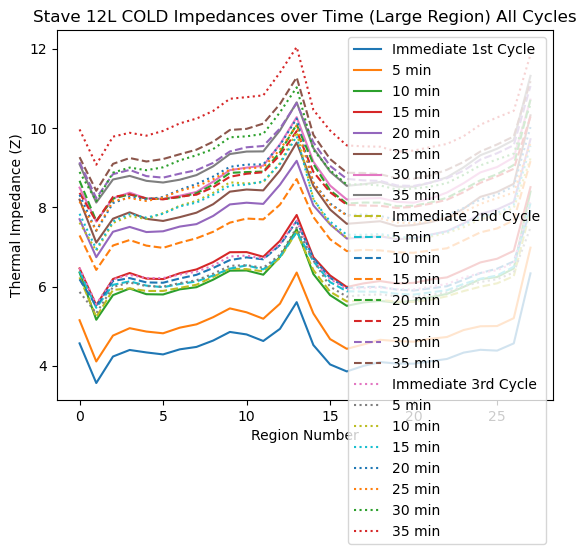

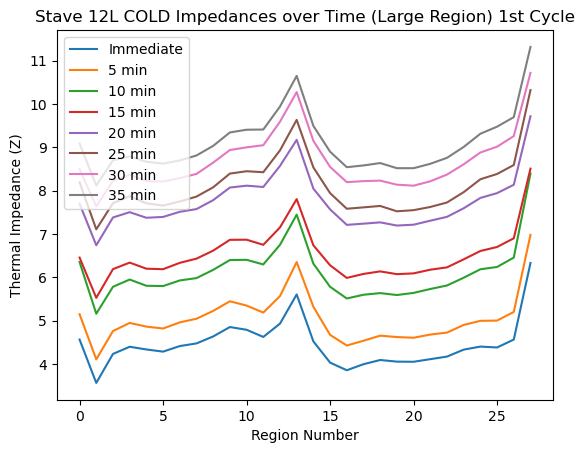

<Figure size 640x480 with 0 Axes>

In [44]:
plt.plot(L12_cold_1_0[0],L12_cold_1_0[1],
        L12_cold_1_5[0],L12_cold_1_5[1],
        L12_cold_1_10[0],L12_cold_1_10[1],
        L12_cold_1_15[0],L12_cold_1_15[1],
        L12_cold_1_20[0],L12_cold_1_20[1],
        L12_cold_1_25[0],L12_cold_1_25[1],
        L12_cold_1_30[0],L12_cold_1_30[1],
        L12_cold_1_35[0],L12_cold_1_35[1]
        
        )

plt.plot(L12_cold_2_0[0],L12_cold_2_0[1],
        L12_cold_2_5[0],L12_cold_2_5[1], 
        L12_cold_2_10[0],L12_cold_2_10[1],
        L12_cold_2_15[0],L12_cold_2_15[1],
        L12_cold_2_20[0],L12_cold_2_20[1],
        L12_cold_2_25[0],L12_cold_2_25[1],
        L12_cold_2_30[0],L12_cold_2_30[1],
        L12_cold_2_35[0],L12_cold_2_35[1],
        linestyle='dashed'
        )

plt.plot(L12_cold_3_0[0],L12_cold_3_0[1],
        L12_cold_3_5[0],L12_cold_3_5[1],
        L12_cold_3_10[0],L12_cold_3_10[1],
        L12_cold_3_15[0],L12_cold_3_15[1],
        L12_cold_3_20[0],L12_cold_3_20[1],
        L12_cold_3_25[0],L12_cold_3_25[1],
        L12_cold_3_30[0],L12_cold_3_30[1],
        L12_cold_3_35[0],L12_cold_3_35[1],
        linestyle='dotted'
        )



plt.legend(['Immediate 1st Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate 2nd Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate 3rd Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L COLD Impedances over Time (Large Region) All Cycles")
plt.figure()



plt.plot(L12_cold_1_0[0],L12_cold_1_0[1],
        L12_cold_1_5[0],L12_cold_1_5[1],
        L12_cold_1_10[0],L12_cold_1_10[1],
        L12_cold_1_15[0],L12_cold_1_15[1],
        L12_cold_1_20[0],L12_cold_1_20[1],
        L12_cold_1_25[0],L12_cold_1_25[1],
        L12_cold_1_30[0],L12_cold_1_30[1],
        L12_cold_1_35[0],L12_cold_1_35[1]
        
        )
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L COLD Impedances over Time (Large Region) 1st Cycle")
plt.figure()

In [45]:
arr_L12_cold_1_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [4.565858936,3.565506029,4.233993664,4.399462135,4.3372038,4.287080592,4.415437291,4.476270229,4.637082955,4.854152157,4.791142863,4.625737854,4.932339924,5.605665939,4.522812186,4.034458087,3.857761007,3.997461053,4.093911858,4.056704432,4.053260749,4.113446327,4.172754123,4.33321754,4.40335602,4.382811874,4.565598692,6.331769896]])
arr_L12_cold_1_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [5.149459311,4.109335732,4.762110457,4.948821286,4.863950566,4.820050501,4.961863978,5.045673444,5.226542599,5.448163128,5.349567621,5.187427555,5.567197647,6.352549631,5.320534248,4.673789991,4.428158439,4.538283021,4.655401054,4.623470843,4.607057371,4.680794577,4.726381385,4.902715862,4.997161198,5.003311761,5.202105846,6.980459102]])
arr_L12_cold_1_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.352845457,5.161861785,5.782420205,5.949663458,5.80626768,5.799155305,5.928731161,5.982948686,6.172781172,6.399338653,6.40436464,6.297906151,6.749447533,7.445552883,6.315040772,5.782510504,5.512724904,5.598895921,5.636857634,5.592374379,5.641542603,5.731286897,5.812617378,5.991439745,6.186325755,6.239552744,6.45614185,8.395535051]])
arr_L12_cold_1_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.45602264,5.527964161,6.189676159,6.340271481,6.199748556,6.187935856,6.334626608,6.431265666,6.616494149,6.865097315,6.868341393,6.750580395,7.151486351,7.804696856,6.738649984,6.27885328,5.987158457,6.078754879,6.137420806,6.074032642,6.091800556,6.176431294,6.230422467,6.415438993,6.608090569,6.7004936,6.900496884,8.506764394]])
arr_L12_cold_1_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.69762437,6.740120516,7.381029449,7.50326727,7.37403451,7.393196126,7.512044596,7.574170629,7.780591398,8.070935369,8.114125513,8.084191683,8.568707934,9.17120276,8.046349122,7.56837559,7.210333489,7.23854187,7.268163675,7.194361529,7.214409468,7.306371858,7.395308058,7.593211331,7.831478256,7.942557066,8.134794676,9.715183406]])
arr_L12_cold_1_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.191718977,7.107413583,7.710692925,7.871438211,7.706890726,7.654266846,7.749831162,7.862720258,8.076449292,8.393071882,8.447128489,8.424644037,8.927037976,9.631617521,8.535245139,7.942376547,7.582320516,7.613968627,7.646688607,7.523428169,7.549505336,7.623008601,7.726397124,7.964935641,8.26233032,8.384223214,8.591016749,10.3182888]])
arr_L12_cold_1_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.4955762,7.637299218,8.226836888,8.367737131,8.221625683,8.209820078,8.288383458,8.385557727,8.646096506,8.936333414,8.998055822,9.047406474,9.588171175,10.27218464,9.148108699,8.546861203,8.195412295,8.218867058,8.230900303,8.137242056,8.11399749,8.215110361,8.37071525,8.607138747,8.879131442,9.013579597,9.257784598,10.714817]])
arr_L12_cold_1_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [9.085467637,8.118680961,8.699659045,8.790389984,8.665996336,8.623649905,8.694622897,8.810755354,9.032125923,9.341803953,9.404607356,9.408776237,9.939381485,10.64596303,9.492125721,8.897911291,8.540615429,8.580577157,8.636014098,8.517451467,8.517313151,8.618599681,8.756071677,9.007293619,9.31204882,9.474979682,9.694961204,11.31399728]])


arr_L12_cold_2_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.230472498,5.23184233,5.914310916,5.951807329,5.887987659,5.888910063,5.964899259,6.04476104,6.243758589,6.451142897,6.43784535,6.382761313,6.720181574,7.374048696,6.415735653,5.869615941,5.62499166,5.645368774,5.66352019,5.616775136,5.61094414,5.663505322,5.754058727,5.885493834,5.994891272,6.080743349,6.261057744,7.928683518]])
arr_L12_cold_2_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.380199853,5.463122763,6.042614041,6.129808237,6.022764881,5.982977243,6.063891862,6.127390432,6.277456605,6.451376644,6.531930683,6.432195944,6.758180743,7.374277507,6.638692563,6.11095706,5.879872527,5.871124862,5.866142656,5.817374559,5.795825258,5.851262659,5.905748114,6.065195518,6.196042322,6.277465825,6.498571746,8.101913491]])
arr_L12_cold_2_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.18090098,5.503276775,6.139180025,6.212461141,6.103333039,6.095401353,6.203527659,6.295098413,6.468010988,6.666529868,6.735066705,6.68593652,7.04500618,7.651729532,6.709618761,6.219273275,5.960008141,5.986487417,5.991926235,5.92131495,5.898230138,5.953440882,6.00719091,6.169457108,6.340548976,6.449281032,6.632730393,7.926275525]])
arr_L12_cold_2_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.2879611,6.419108188,7.034648595,7.173042003,7.031393116,6.974800306,7.106119751,7.216889125,7.381288444,7.6115023,7.714392818,7.693793183,8.065350475,8.710124082,7.752622371,7.192113602,6.893326916,6.92416071,6.911434305,6.864039754,6.850949812,6.908031138,6.964906843,7.162709404,7.366289743,7.464997933,7.672092279,9.163356877]])
arr_L12_cold_2_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.667227566,7.651883956,8.216921518,8.323189115,8.22045667,8.207075007,8.252978777,8.354854392,8.568653364,8.867487699,8.886810875,8.899295671,9.386051789,10.08738074,9.09306777,8.42628487,8.093757516,8.117911136,8.11588019,8.024658065,8.03713928,8.117290789,8.238363206,8.451927129,8.67960588,8.831064743,9.065708188,10.71347732]])
arr_L12_cold_2_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.361124868,7.645065192,8.260678849,8.324916577,8.22295939,8.198369357,8.266211648,8.316733349,8.505263741,8.768996755,8.844110581,8.882734493,9.314236728,9.919443318,8.891605213,8.378047417,8.06256587,8.042397644,8.035816639,7.982454644,8.009012047,8.088090105,8.189370089,8.380821069,8.616628337,8.780346495,8.968248972,10.28584588]])
arr_L12_cold_2_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [9.136451014,8.228468807,8.834714404,8.941407134,8.785014839,8.746311241,8.847094738,8.934983724,9.119399796,9.406981232,9.511987781,9.544653471,9.987088285,10.62453923,9.637694355,9.042973279,8.714487039,8.678531206,8.664385183,8.549953047,8.537015208,8.621234026,8.73268583,8.923232524,9.201807907,9.362011308,9.564372302,11.05935768]])
arr_L12_cold_2_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [9.263109813,8.413933641,9.093734818,9.241407881,9.153907571,9.21538846,9.336563305,9.451597111,9.652563213,9.948993773,9.977272374,10.10967183,10.60321812,11.27595353,9.82573652,9.215675251,8.869689051,8.864535926,8.831991918,8.730106138,8.717107986,8.800898626,8.945153955,9.142509703,9.405239009,9.583209692,9.786652158,11.1795851]])


arr_L12_cold_3_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.468040886,5.554174721,6.184349066,6.292616709,6.214445802,6.212946082,6.301582902,6.375260179,6.529565184,6.758752135,6.780315306,6.701885573,7.072874439,7.66334322,6.661644295,6.193597604,5.931885466,5.958134277,5.975035833,5.930187413,5.924798918,5.992811009,6.064001827,6.22836544,6.340942142,6.410876349,6.592173186,8.200859247]])
arr_L12_cold_3_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [5.863617872,5.325338152,5.98962368,6.099378149,6.011891239,5.995842604,6.086503325,6.157739566,6.323593318,6.521935518,6.538848219,6.471820499,6.802359519,7.484262922,6.657636247,5.995618486,5.74569165,5.787731881,5.800357758,5.755370454,5.741617305,5.786781863,5.851088586,6.008731489,6.113823872,6.184247757,6.353484258,7.488631448]])
arr_L12_cold_3_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.611470183,6.900512364,7.603479511,7.772620383,7.705483089,7.851350385,8.038393662,8.160990834,8.363808163,8.628177038,8.599070977,8.630651281,9.113811587,9.893065951,8.210249394,7.565523927,7.229489604,7.287983303,7.291215185,7.219954301,7.200960165,7.256427442,7.350794376,7.494957409,7.69478705,7.793963217,7.981572604,9.231491278]])
arr_L12_cold_3_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.835386517,6.943101784,7.641949103,7.824171904,7.739046956,7.8359942,8.021241868,8.117358311,8.312170841,8.547687518,8.571564456,8.650265799,9.09489665,9.790111192,8.192545121,7.638252426,7.304691041,7.304172063,7.323067288,7.256580544,7.222218132,7.298873631,7.380330001,7.561081458,7.760075784,7.85272825,8.065017431,9.548594405]])
arr_L12_cold_3_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.3126398,7.40358197,8.10318352,8.261335201,8.19351634,8.259414927,8.438212017,8.587011791,8.774908439,9.019281697,9.076128448,9.079397108,9.56853563,10.23782713,8.618587689,8.094189423,7.800129948,7.816489719,7.779642166,7.684105774,7.65654285,7.706231732,7.806537442,7.980555659,8.192046986,8.319388119,8.528986874,10.02204835]])
arr_L12_cold_3_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.142147152,7.412153569,8.154605306,8.231576384,8.156719512,8.245219675,8.41454255,8.522617314,8.708253133,8.948175688,8.978237739,9.008218348,9.453898677,10.06465484,8.613488227,8.069319828,7.792151502,7.764254919,7.718459203,7.614427405,7.595017465,7.653702595,7.729889406,7.876687382,8.08436298,8.228632753,8.370558172,9.615937645]])
arr_L12_cold_3_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.889893414,8.156265399,8.871675292,8.999896252,8.934659471,9.007203848,9.182783782,9.310913186,9.467398683,9.76393435,9.788626374,9.849628036,10.39558997,11.02447126,9.448823256,8.933946172,8.57301761,8.580178688,8.548743921,8.446937724,8.471012466,8.521113191,8.607814366,8.818182842,9.055373147,9.205458673,9.35225858,10.59497081]])
arr_L12_cold_3_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [9.962240604,9.072884971,9.780485604,9.878128841,9.805408295,9.924966046,10.11557259,10.2359926,10.42922182,10.73610461,10.77710619,10.82217906,11.39845554,12.04159795,10.45507993,9.936044861,9.560037626,9.535210287,9.526625365,9.399010114,9.429477806,9.515244242,9.597030065,9.792934637,10.08214945,10.26448301,10.43366595,11.85286509]])



L12_cold_avg = (arr_L12_cold_1_0+arr_L12_cold_1_5+arr_L12_cold_1_10+arr_L12_cold_1_15+arr_L12_cold_1_20+arr_L12_cold_1_25+arr_L12_cold_1_30+arr_L12_cold_1_35+arr_L12_cold_2_0+arr_L12_cold_2_5+arr_L12_cold_2_10+arr_L12_cold_2_15+arr_L12_cold_2_20+arr_L12_cold_2_25+arr_L12_cold_2_30+arr_L12_cold_2_35+arr_L12_cold_3_0+arr_L12_cold_3_5+arr_L12_cold_3_10+arr_L12_cold_3_15+arr_L12_cold_3_20+arr_L12_cold_3_25+arr_L12_cold_3_30+arr_L12_cold_3_35)/24
print(L12_cold_avg)
print(L12_cold_avg.shape)


[[ 0.          1.          2.          3.          4.          5.
   6.          7.          8.          9.         10.         11.
  12.         13.         14.         15.         16.         17.
  18.         19.         20.         21.         22.         23.
  24.         25.         26.         27.        ]
 [ 7.5244774   6.63720402  7.28552388  7.40953392  7.30686274  7.31738858
   7.4385692   7.53248139  7.72139493  7.97524815  8.00527702  7.98632327
   8.42514608  9.08942768  7.91423722  7.35860708  7.05626157  7.08458427
   7.09790009  7.02217981  7.02028149  7.0916662   7.17981797  7.36492642
   7.56685572  7.676267    7.87208547  9.38294619]]
(2, 28)


### Side J

<Figure size 640x480 with 0 Axes>

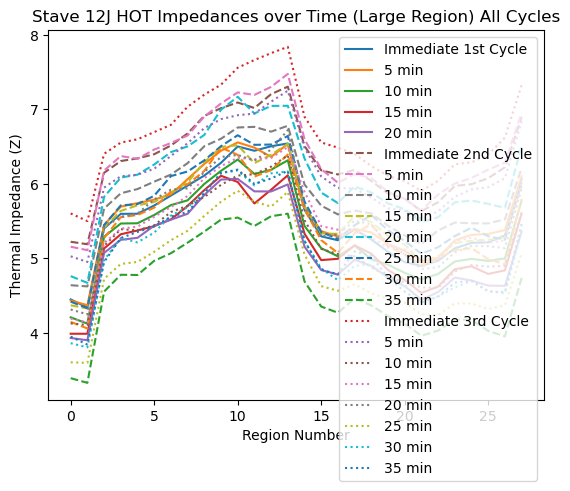

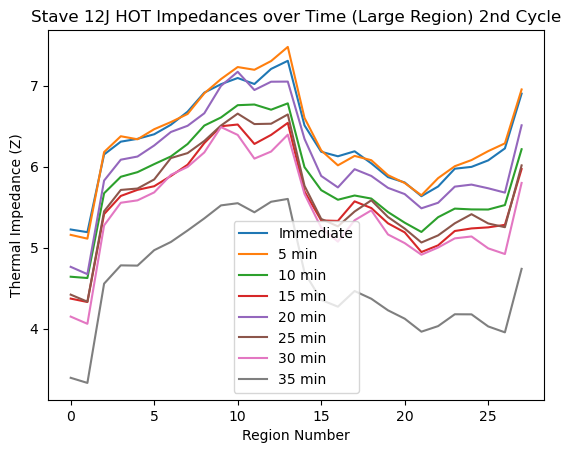

<Figure size 640x480 with 0 Axes>

In [46]:
plt.plot(J12_hot_1_0[0],J12_hot_1_0[1],
        J12_hot_1_5[0],J12_hot_1_5[1],
        J12_hot_1_10[0],J12_hot_1_10[1],
        J12_hot_1_15[0],J12_hot_1_15[1],
        J12_hot_1_20[0],J12_hot_1_20[1])


plt.plot(J12_hot_2_0[0],J12_hot_2_0[1],
        J12_hot_2_5[0],J12_hot_2_5[1],
        J12_hot_2_10[0],J12_hot_2_10[1],
        J12_hot_2_15[0],J12_hot_2_15[1],
        J12_hot_2_20[0],J12_hot_2_20[1],
        J12_hot_2_25[0],J12_hot_2_25[1],
        J12_hot_2_30[0],J12_hot_2_30[1],
        J12_hot_2_35[0],J12_hot_2_35[1], linestyle='dashed'
        )


plt.plot(J12_hot_3_0[0],J12_hot_3_0[1],
        J12_hot_3_5[0],J12_hot_3_5[1],
        J12_hot_3_10[0],J12_hot_3_10[1],
        J12_hot_3_15[0],J12_hot_3_15[1],
        J12_hot_3_20[0],J12_hot_3_20[1],
        J12_hot_3_25[0],J12_hot_3_25[1],
        J12_hot_3_30[0],J12_hot_3_30[1],
        J12_hot_3_35[0],J12_hot_3_35[1],linestyle='dotted'
        )






plt.legend(['Immediate 1st Cycle', '5 min', '10 min', '15 min', '20 min', 'Immediate 2nd Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate 3rd Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J HOT Impedances over Time (Large Region) All Cycles")
plt.figure()


plt.plot(J12_hot_2_0[0],J12_hot_2_0[1],
        J12_hot_2_5[0],J12_hot_2_5[1],
        J12_hot_2_10[0],J12_hot_2_10[1],
        J12_hot_2_15[0],J12_hot_2_15[1],
        J12_hot_2_20[0],J12_hot_2_20[1],
        J12_hot_2_25[0],J12_hot_2_25[1],
        J12_hot_2_30[0],J12_hot_2_30[1],
        J12_hot_2_35[0],J12_hot_2_35[1],
        )



plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J HOT Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

<Figure size 640x480 with 0 Axes>

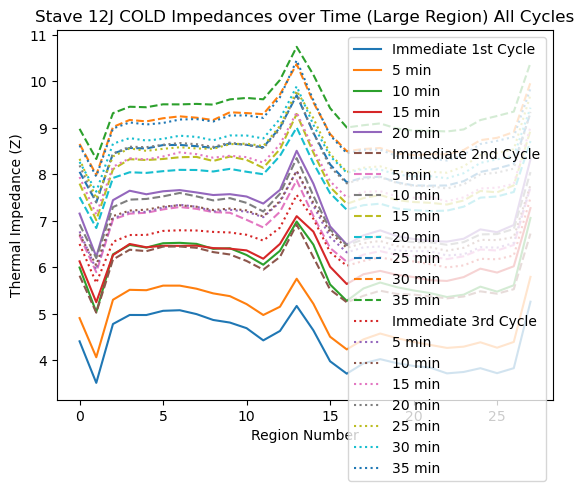

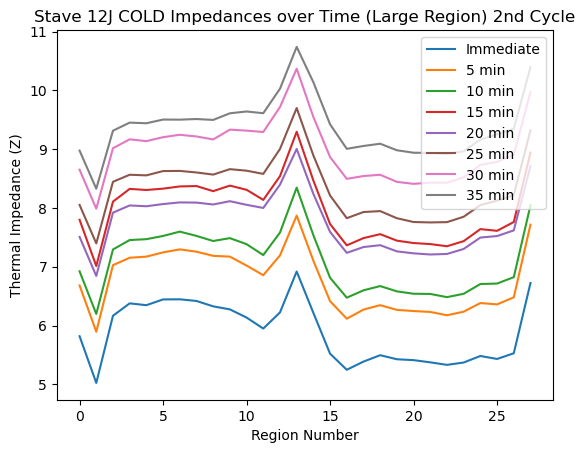

<Figure size 640x480 with 0 Axes>

In [47]:
plt.plot(J12_cold_1_0[0],J12_cold_1_0[1],
        J12_cold_1_5[0],J12_cold_1_5[1],
        J12_cold_1_10[0],J12_cold_1_10[1],
        J12_cold_1_15[0],J12_cold_1_15[1],
        J12_cold_1_20[0],J12_cold_1_20[1])


plt.plot(J12_cold_2_0[0],J12_cold_2_0[1],
        J12_cold_2_5[0],J12_cold_2_5[1],
        J12_cold_2_10[0],J12_cold_2_10[1],
        J12_cold_2_15[0],J12_cold_2_15[1],
        J12_cold_2_20[0],J12_cold_2_20[1],
        J12_cold_2_25[0],J12_cold_2_25[1],
        J12_cold_2_30[0],J12_cold_2_30[1],
        J12_cold_2_35[0],J12_cold_2_35[1],linestyle='dashed'
        )


plt.plot(J12_cold_3_0[0],J12_cold_3_0[1],
        J12_cold_3_5[0],J12_cold_3_5[1],
        J12_cold_3_10[0],J12_cold_3_10[1],
        J12_cold_3_15[0],J12_cold_3_15[1],
        J12_cold_3_20[0],J12_cold_3_20[1],
        J12_cold_3_25[0],J12_cold_3_25[1],
        J12_cold_3_30[0],J12_cold_3_30[1],
        J12_cold_3_35[0],J12_cold_3_35[1],linestyle='dotted'
        )





plt.legend(['Immediate 1st Cycle', '5 min', '10 min', '15 min', '20 min', 'Immediate 2nd Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate 3rd Cycle', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J COLD Impedances over Time (Large Region) All Cycles")
plt.figure()





plt.plot(J12_cold_2_0[0],J12_cold_2_0[1],
        J12_cold_2_5[0],J12_cold_2_5[1],
        J12_cold_2_10[0],J12_cold_2_10[1],
        J12_cold_2_15[0],J12_cold_2_15[1],
        J12_cold_2_20[0],J12_cold_2_20[1],
        J12_cold_2_25[0],J12_cold_2_25[1],
        J12_cold_2_30[0],J12_cold_2_30[1],
        J12_cold_2_35[0],J12_cold_2_35[1],
        )

plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J COLD Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

In [48]:
arr_J12_hot_1_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.448645513,4.341009479,5.403449615,5.598074885,5.599754795,5.710295986,5.843638701,5.978197232,6.112587642,6.283702989,6.503285853,6.44566755,6.506076649,6.543608086,5.654048752,5.295994844,5.243684129,5.387651935,5.254897422,5.088627158,4.949447473,4.898894953,4.969077228,5.134895217,5.208737854,5.215067272,5.309376084,6.067263169]])
arr_J12_hot_1_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.43311009,4.370787962,5.448155351,5.695295984,5.742240491,5.78900108,5.859537572,6.06430492,6.269156109,6.445968441,6.55775757,6.487390811,6.364113957,6.536282104,5.696216492,5.365576999,5.294186426,5.398455008,5.348517998,5.192184657,5.101531196,4.967433189,5.007459511,5.24047309,5.316101966,5.328203161,5.380130399,6.102390106]])
arr_J12_hot_1_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.208082681,4.123798226,5.290199529,5.468453764,5.471769313,5.582809136,5.715209818,5.779558272,5.999486348,6.175849066,6.328183411,6.13389854,6.190444491,6.317654539,5.435227294,5.136629191,5.027854631,5.172157927,4.988418947,4.915288648,4.805315268,4.719363189,4.79078851,4.95809098,4.993479143,4.965541521,4.999601887,5.777675307]])
arr_J12_hot_1_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.988091887,3.987500128,5.132576461,5.324012211,5.374930994,5.433104325,5.524096494,5.703826756,5.916492564,6.10951295,6.026591746,5.737700776,5.922207997,6.116156379,5.33259295,4.976903048,4.994392154,5.174861388,5.062764149,4.844387337,4.712092151,4.535701821,4.621633242,4.854817392,4.89354261,4.791301481,4.839353131,5.602405739]])
arr_J12_hot_1_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.931157156,3.900119495,5.073712745,5.249216906,5.276123563,5.439415,5.519378981,5.599274563,5.851909883,6.058834839,6.06766961,5.900347527,5.898685506,5.993499726,5.158043149,4.844578113,4.782615837,4.981798154,4.89880037,4.745125115,4.624944379,4.446930017,4.54683381,4.742554092,4.702385879,4.634840084,4.630422632,5.362111598]])


arr_J12_hot_2_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.22296554,5.190083227,6.149517726,6.307760771,6.342521311,6.399154558,6.516586703,6.67793389,6.913580757,7.017478761,7.093777392,7.01990944,7.206141664,7.306415829,6.509122386,6.182772875,6.127267293,6.188848309,6.039543165,5.870126758,5.803731852,5.634369483,5.754145435,5.973729557,5.996470995,6.076647687,6.224485277,6.901185326]])
arr_J12_hot_2_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.156715002,5.10996482,6.179657503,6.374711395,6.33719965,6.461564677,6.549764619,6.649938926,6.904767197,7.080896698,7.229288462,7.195564212,7.303444605,7.477833076,6.601281394,6.199512665,6.01543688,6.131865903,6.07874202,5.893670746,5.797064207,5.645481395,5.857233634,6.004581828,6.080461771,6.190990136,6.286712685,6.95251459]])
arr_J12_hot_2_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.639725171,4.623688432,5.670651396,5.874159833,5.931368563,6.030426838,6.125274618,6.278747638,6.50645148,6.60672179,6.758255619,6.766530923,6.702365016,6.780968296,5.992949269,5.708986608,5.590401098,5.642779326,5.604973919,5.438432128,5.307062337,5.192563682,5.374980315,5.480948773,5.471035551,5.469661536,5.524739484,6.214279976]])
arr_J12_hot_2_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.369670372,4.327412044,5.413051483,5.637388949,5.712660307,5.75750459,5.884189754,6.022983973,6.290215159,6.498229616,6.51965517,6.279704147,6.391230434,6.539661849,5.69365788,5.334857125,5.328935104,5.57051592,5.487990385,5.299188695,5.187706067,4.944469988,5.027368863,5.204364952,5.236292007,5.249388446,5.280389971,5.970184578]])
arr_J12_hot_2_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.761834687,4.671485905,5.827187854,6.08508013,6.124173943,6.260692219,6.427455841,6.503910803,6.658270698,6.996402078,7.170464796,6.945826627,7.048032182,7.049654917,6.341989574,5.884452718,5.742762026,5.967808408,5.884467085,5.737095129,5.66047492,5.484747964,5.553148038,5.752521535,5.777509298,5.731991796,5.678314224,6.509896545]])
arr_J12_hot_2_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.418515737,4.331433107,5.447868571,5.711647082,5.728936193,5.841080188,6.105392134,6.166655943,6.31663887,6.507007484,6.653976341,6.525154131,6.529304287,6.643947085,5.762821536,5.353484136,5.261731446,5.445114829,5.583580779,5.376735142,5.234206112,5.062460515,5.150211354,5.299539349,5.411862754,5.297598269,5.251318032,6.014733382]])
arr_J12_hot_2_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.147212702,4.058273456,5.273622883,5.553296475,5.582961053,5.68123409,5.898019877,5.995835317,6.174650821,6.487957994,6.391046595,6.098323734,6.185749724,6.394071691,5.661780807,5.244931405,5.072647241,5.336822932,5.459344851,5.161577883,5.054825936,4.91158047,5.000305455,5.113528836,5.136893526,4.990175302,4.92014826,5.797878691]])
arr_J12_hot_2_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.391209148,3.328215179,4.554159874,4.780049967,4.776887829,4.967515877,5.069052605,5.211020466,5.360021561,5.520739062,5.547766612,5.435652791,5.565659297,5.600586599,4.69116313,4.353399836,4.26983847,4.463248749,4.367806177,4.224792207,4.121627259,3.961078276,4.02985846,4.176162136,4.175011726,4.025910086,3.952925738,4.737031273]])


arr_J12_hot_3_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.603133886,5.501092535,6.404717184,6.555427963,6.59978325,6.696316976,6.793442982,7.036512346,7.199244892,7.333062654,7.560456302,7.664631148,7.756600396,7.841190262,6.902481107,6.557777714,6.486931556,6.401239206,6.239793305,6.108072993,6.037410197,5.905984435,6.041455085,6.263824217,6.289663413,6.395521686,6.62144686,7.327653862]])
arr_J12_hot_3_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.027759808,4.952105772,5.950452924,6.103320088,6.123127115,6.204143373,6.375549387,6.546592595,6.750157942,6.870632764,6.922976077,6.944699677,7.105110359,7.25245506,6.48479527,6.101405725,5.946115169,5.937464286,5.817113906,5.673188456,5.640297654,5.528741447,5.632308639,5.827865622,5.92779153,5.955739537,6.077778545,6.843913793]])
arr_J12_hot_3_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.126303313,4.105479124,5.167896955,5.392334565,5.37666058,5.444233921,5.622820487,5.706933417,5.824939362,5.986994885,6.112944117,6.129962487,6.232291994,6.384599192,5.514003466,5.128475321,5.058076782,5.026698676,4.880842912,4.755992069,4.683086186,4.610283521,4.603470168,4.825575474,4.910085439,4.889400693,4.900281508,5.614196866]])
arr_J12_hot_3_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.189806513,4.142155832,5.206843706,5.398925342,5.426165376,5.559230141,5.68884957,5.837998799,6.076769104,6.238309941,6.351962111,6.331327942,6.349429918,6.494027477,5.894656888,5.432726497,5.385337972,5.37220693,5.281289804,5.144868325,5.121360792,4.880403232,4.99194881,5.223047042,5.279423555,5.20736743,5.242977498,6.015958492]])
arr_J12_hot_3_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.313968696,4.248083329,5.420481669,5.55826622,5.600409178,5.792405162,5.922817627,5.939013502,6.161126357,6.361686598,6.39018398,6.312092454,6.462374051,6.722884301,5.705932597,5.294028919,5.321634187,5.50884772,5.456579258,5.196492238,5.053417575,4.857971039,4.88109524,5.079954583,5.166787638,5.164134315,5.137681028,5.935924444]])
arr_J12_hot_3_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.604109675,3.596941403,4.724767118,4.925046966,4.952639142,5.088977391,5.244062747,5.370795442,5.569944617,5.761240546,5.909029108,5.761487599,5.695980303,5.893454349,5.05290863,4.627881272,4.564427753,4.653465486,4.528477511,4.453592765,4.4065123,4.248805043,4.237130867,4.397241615,4.393805369,4.320364044,4.370362844,5.067503773]])
arr_J12_hot_3_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.860927371,3.804847043,4.978191098,5.273422548,5.21499444,5.346385612,5.575360388,5.686309271,5.890671158,6.146675789,6.181169063,5.979761847,6.142070559,6.167488662,5.234351405,4.86570236,4.706791837,4.900488142,4.917928965,4.731473504,4.653199677,4.413344476,4.48933374,4.611273083,4.694684575,4.566278166,4.527581884,5.368734761]])
arr_J12_hot_3_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[3.94911932,3.842502376,4.95138263,5.272944778,5.355234578,5.428921108,5.560048764,5.622677182,5.873601763,6.146863553,6.192427606,5.99980056,6.073218611,6.175233472,5.236188177,4.846984925,4.786076824,5.09320352,5.033312886,4.740712472,4.554482991,4.406568185,4.485869987,4.674857583,4.701079635,4.553042897,4.547583376,5.462738944]])


J12_hot_avg = (arr_J12_hot_1_0+arr_J12_hot_1_5+arr_J12_hot_1_10+arr_J12_hot_1_15+arr_J12_hot_1_20+arr_J12_hot_2_0+arr_J12_hot_2_5+arr_J12_hot_2_10+arr_J12_hot_2_15+arr_J12_hot_2_20+arr_J12_hot_2_25+arr_J12_hot_2_30+arr_J12_hot_2_35+arr_J12_hot_3_0+arr_J12_hot_3_5+arr_J12_hot_3_10+arr_J12_hot_3_15+arr_J12_hot_3_20+arr_J12_hot_3_25+arr_J12_hot_3_30+arr_J12_hot_3_35)/21
print(J12_hot_avg.shape)


(2, 28)


## Insulating

### Side L

In [49]:
L12instemps = []
L12insflow = []

for filename in sorted(glob("../Stave12_Insulation-NewCam3_LS_CERN_L_*.npz")):
    #print("inside")
    f = np.load(filename)
    #print(f.keys)
    L12insflowtime = f["flow_times"][-1]
    L12insflowdata = np.median(f["flow_data"][-5:])
    L12insflow.append([L12insflowtime, L12insflowdata])
    L12insthermtime = f["thermo_times"][-1]
    L12insthermdata = list(f["thermo_data"][-1])
    L12instemps.append([L12insthermtime]+L12insthermdata)
    #print(filename)

L12instemps = np.array(L12instemps)
print(L12instemps.shape)
L12insflow = np.array(L12insflow)

(48, 7)


here is last run hot 12
here is last run hot 12
here is last run hot 12
here is last run hot 12
here is last run hot 12
here is last run hot 12
here is last run hot 12
here is last run hot 12
now here is last run swap shape
(28, 8, 2)
now here is last run goavgswap shape
(28, 8, 2)


Text(0.5, 1.0, 'Stave 12L HOT Impedances over Time (Large Region) All Cycles Ins')

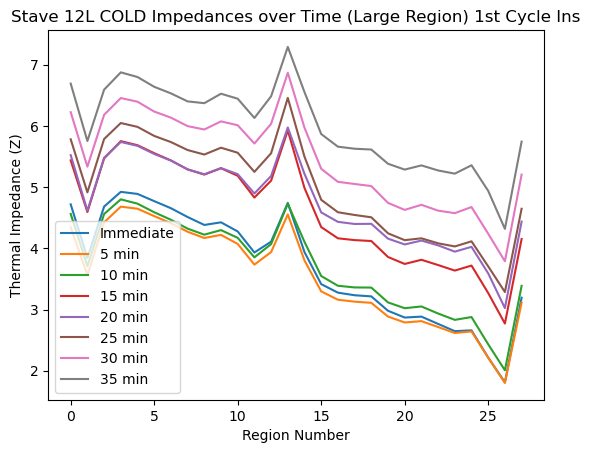

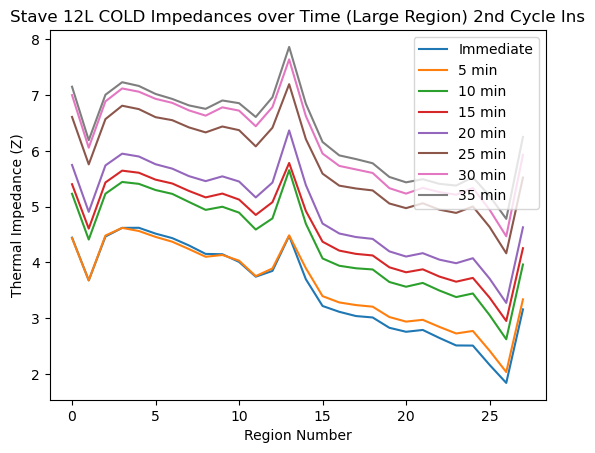

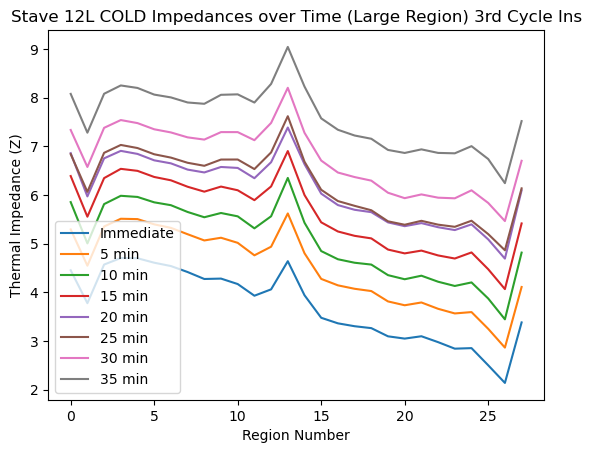

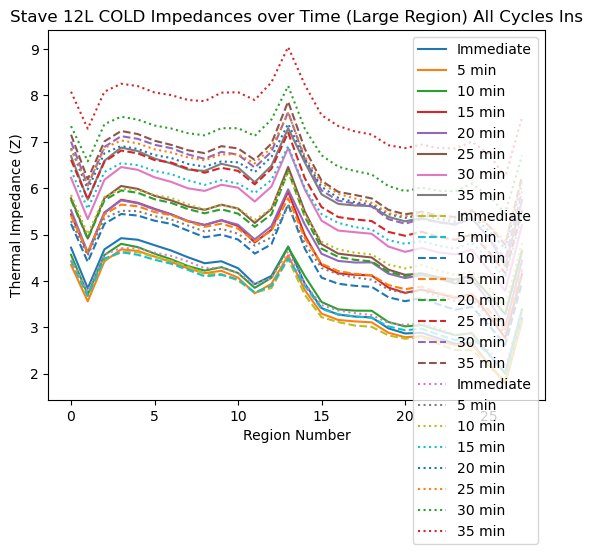

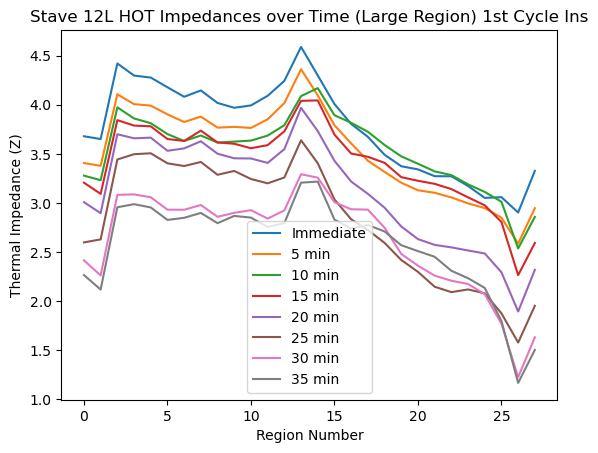

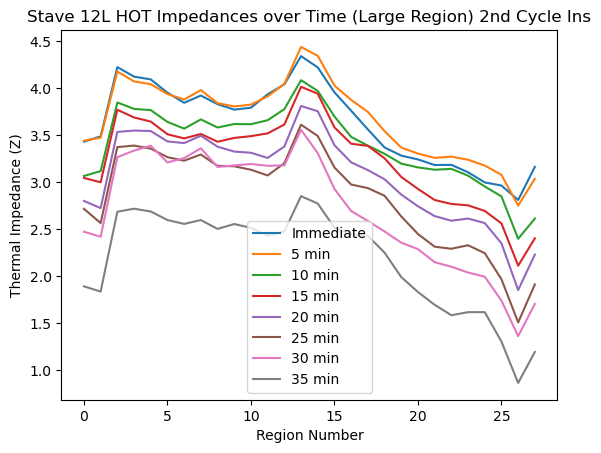

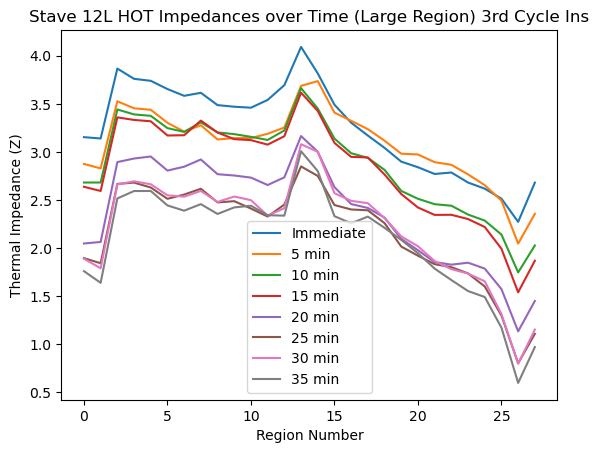

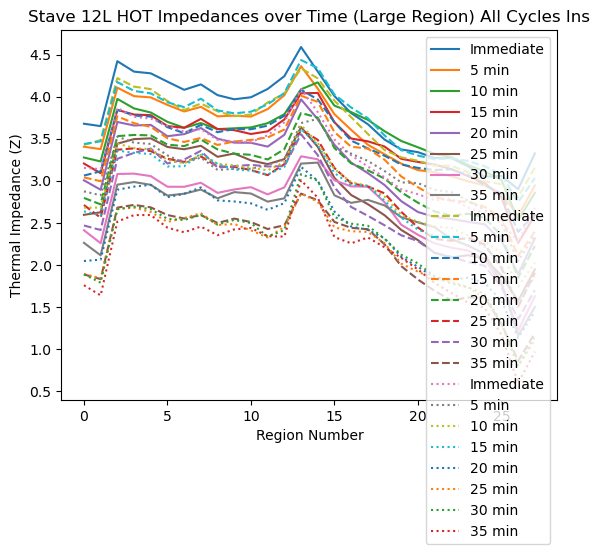

In [50]:
L12ins_hot1 = [] #large region top
L12ins_cold1 = [] #large region top
L12ins_hot2 = [] #large region top
L12ins_cold2 = []
L12ins_hot3 = [] #large region top
L12ins_cold3 = []

L12ins_hot1_goavg = [] #large region top
L12ins_cold1_goavg = [] #large region top
L12ins_hot2_goavg = [] #large region top
L12ins_cold2_goavg = []
L12ins_hot3_goavg = [] #large region top
L12ins_cold3_goavg = []#large region top


#for filename1 in sorted(glob("output/Stave9J/Stave9_NewCamera1_LS_CERN_J_*_IMPEDANCES.csv")):
 #   index1 = int(filename1.split("_")[-2])

for filename2 in sorted(glob("output/Stave12L_ins/Stave12_Insulation-NewCam3_LS_CERN_L_*_IMPEDANCES.csv")):
    index2 = int(filename2.split("_")[-2])

    #ORIGINALLY USED COLUMNS 1 and 2, Apr 1 testing 0,1 for average thingy 
    if (index2 >=8 and index2 <16):
    #if (index2 >=8 and index2 <16) or (index2 >=24 and index2 <32):
        L12ins_hot1.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index2 >=24 and index2 <32):
        L12ins_hot2.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index2 >=40 and index2 <48):
        L12ins_hot3.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    #ONLY USE FOR AVERAGES
    if (index2 >=8 and index2 <16):
    #if (index2 >=8 and index2 <16) or (index2 >=24 and index2 <32):
        L12ins_hot1_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index2 >=24 and index2 <32):
        L12ins_hot2_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index2 >=40 and index2 <48):
        print("here is last run hot 12")
        L12ins_hot3_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))
    
    
    if (index2 <8):
    #if (index2 <8) or (index2 >=16 and index2 <24):
        L12ins_cold1.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))


    if (index2 >=16 and index2 <24):
        L12ins_cold2.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    
    if (index2 >=32 and index2 <40):
        L12ins_cold3.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))


    if (index2 <8):
    #if (index2 <8) or (index2 >=16 and index2 <24):
        L12ins_cold1_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))


    if (index2 >=16 and index2 <24):
        L12ins_cold2_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index2 >=32 and index2 <40):
        L12ins_cold3_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))




L12ins_hot1 = np.stack(L12ins_hot1, axis=0)
L12ins_hot1_swap = np.swapaxes(L12ins_hot1, 0, 1)

L12ins_hot2 = np.stack(L12ins_hot2, axis=0)
L12ins_hot2_swap = np.swapaxes(L12ins_hot2, 0, 1)

L12ins_hot3 = np.stack(L12ins_hot3, axis=0)
L12ins_hot3_swap = np.swapaxes(L12ins_hot3, 0, 1)
print("now here is last run swap shape")
print(L12ins_hot3_swap.shape)


L12ins_cold1 = np.stack(L12ins_cold1, axis=0)
L12ins_cold1_swap = np.swapaxes(L12ins_cold1, 0, 1)

L12ins_cold2 = np.stack(L12ins_cold2, axis=0)
L12ins_cold2_swap = np.swapaxes(L12ins_cold2, 0, 1)

L12ins_cold3 = np.stack(L12ins_cold3, axis=0)
L12ins_cold3_swap = np.swapaxes(L12ins_cold3, 0, 1)


L12ins_hot1_goavg = np.stack(L12ins_hot1_goavg, axis=0)
L12ins_hot1_goavg_swap = np.swapaxes(L12ins_hot1_goavg, 0, 1)

L12ins_hot2_goavg = np.stack(L12ins_hot2_goavg, axis=0)
L12ins_hot2_goavg_swap = np.swapaxes(L12ins_hot2_goavg, 0, 1)

L12ins_hot3_goavg = np.stack(L12ins_hot3_goavg, axis=0)
L12ins_hot3_goavg_swap = np.swapaxes(L12ins_hot3_goavg, 0, 1)
print("now here is last run goavgswap shape")
print(L12ins_hot3_goavg_swap.shape)


L12ins_cold1_goavg = np.stack(L12ins_cold1_goavg, axis=0)
L12ins_cold1_goavg_swap = np.swapaxes(L12ins_cold1_goavg, 0, 1)

L12ins_cold2_goavg = np.stack(L12ins_cold2_goavg, axis=0)
L12ins_cold2_goavg_swap = np.swapaxes(L12ins_cold2_goavg, 0, 1)

L12ins_cold3_goavg = np.stack(L12ins_cold3_goavg, axis=0)
L12ins_cold3_goavg_swap = np.swapaxes(L12ins_cold3_goavg, 0, 1)


arr_L12ins_hot1_swap = np.array(L12ins_hot1_swap)
arr_L12ins_hot2_swap = np.array(L12ins_hot2_swap)
arr_L12ins_hot3_swap = np.array(L12ins_hot3_swap)
arr_L12ins_cold1_swap = np.array(L12ins_cold1_swap)
arr_L12ins_cold2_swap = np.array(L12ins_cold2_swap)
arr_L12ins_cold3_swap = np.array(L12ins_cold3_swap)

arr_L12ins_hot1_goavg = np.array(L12ins_hot1_goavg)
arr_L12ins_hot2_goavg = np.array(L12ins_hot2_goavg)
arr_L12ins_hot3_goavg = np.array(L12ins_hot3_goavg)
arr_L12ins_cold1_goavg = np.array(L12ins_cold1_goavg)
arr_L12ins_cold2_goavg = np.array(L12ins_cold2_goavg)
arr_L12ins_cold3_goavg = np.array(L12ins_cold3_goavg)


#J9_hot_avg = (arr_J9_hot1_swap+arr_J9_hot2_swap)/2
L12ins_hot_avg = (arr_L12ins_hot1_goavg+arr_L12ins_hot2_goavg+arr_L12ins_hot3_goavg)/3


L12ins_cold_avg = (arr_L12ins_cold1_goavg+arr_L12ins_cold2_goavg+arr_L12ins_cold3_goavg)/3




plt.plot(L12ins_cold1_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L COLD Impedances over Time (Large Region) 1st Cycle Ins")
plt.figure()

plt.plot(L12ins_cold2_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L COLD Impedances over Time (Large Region) 2nd Cycle Ins")
plt.figure()

plt.plot(L12ins_cold3_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L COLD Impedances over Time (Large Region) 3rd Cycle Ins")
plt.figure()

plt.plot(L12ins_cold1_swap[:,:,0])
plt.plot(L12ins_cold2_swap[:,:,0], linestyle='dashed')
plt.plot(L12ins_cold3_swap[:,:,0], linestyle='dotted')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L COLD Impedances over Time (Large Region) All Cycles Ins")
plt.figure()

plt.plot(L12ins_hot1_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L HOT Impedances over Time (Large Region) 1st Cycle Ins")
plt.figure()

plt.plot(L12ins_hot2_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L HOT Impedances over Time (Large Region) 2nd Cycle Ins")
plt.figure()

plt.plot(L12ins_hot3_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L HOT Impedances over Time (Large Region) 3rd Cycle Ins")
plt.figure()

plt.plot(L12ins_hot1_swap[:,:,0])
plt.plot(L12ins_hot2_swap[:,:,0], linestyle='dashed')
plt.plot(L12ins_hot3_swap[:,:,0], linestyle='dotted')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L HOT Impedances over Time (Large Region) All Cycles Ins")

(48, 7)


Text(0.5, 1.0, 'Stave 12L COLD Inlet/Outlet Temp over Time All Cycles Ins')

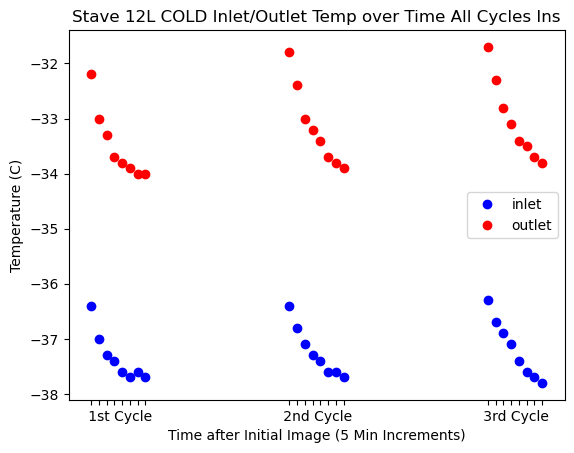

In [51]:
print(L12instemps.shape)

plt.plot(
    
    L12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], L12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3],'bo',

    L12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], L12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4], 'ro',
)
plt.legend(['inlet', 'outlet'])

xticks = ['','', '      1st Cycle','','','', '',' ','','', '      2nd Cycle','','','', '',' ', '','','      3rd Cycle','','','', '',' ']
plt.xticks(L12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12L COLD Inlet/Outlet Temp over Time All Cycles Ins")

Text(0.5, 1.0, 'Stave 12L COLD Inlet/Outlet Temp Difference over Time All Cycles Ins')

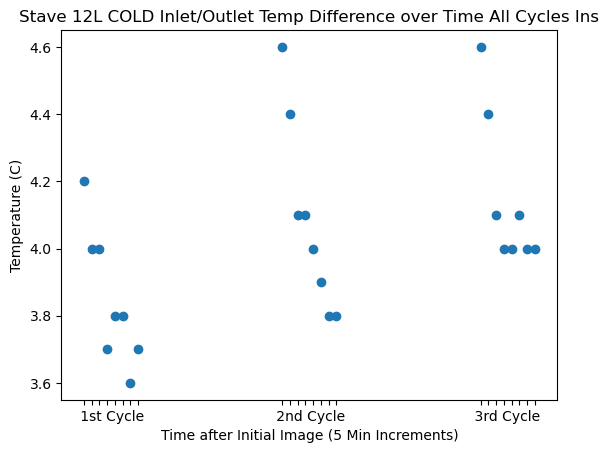

In [52]:
plt.plot(L12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],L12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-L12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3],'o')

xticks = ['','', '      1st Cycle','','','', '',' ','','', '      2nd Cycle','','','', '',' ', '            3rd Cycle','','','', '',' ','','']
plt.xticks(L12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12L COLD Inlet/Outlet Temp Difference over Time All Cycles Ins")

Text(0.5, 1.0, 'Stave 12L HOT Inlet/Outlet Temp over Time All Cycles Ins')

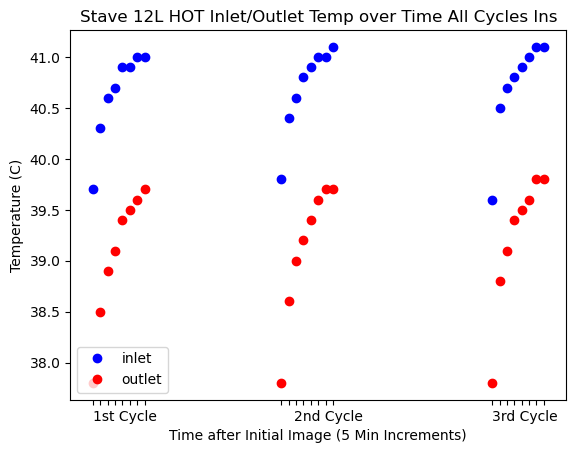

In [53]:
plt.plot(
    
    L12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], L12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3],'bo',
    L12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], L12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4], 'ro',
)
plt.legend(['inlet', 'outlet'])


xticks = ['','', '        1st Cycle','','','', '',' ','','', ' ', ' ','        2nd Cycle','','','', '',' ', '        3rd Cycle','','','', '',' ']
plt.xticks(L12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12L HOT Inlet/Outlet Temp over Time All Cycles Ins")

Text(0.5, 1.0, 'Stave 12L HOT Inlet/Outlet Temp Difference over Time All Cycles Ins')

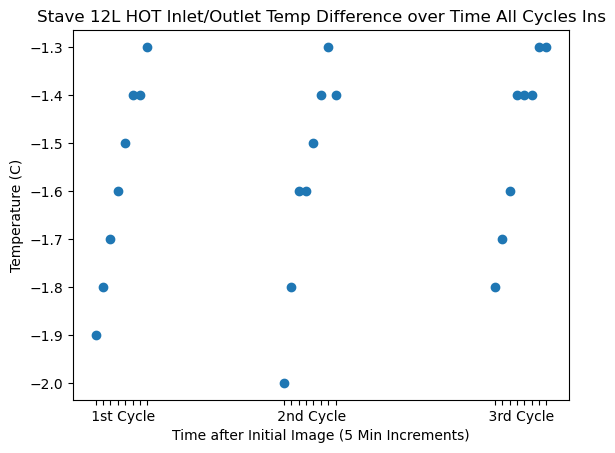

In [54]:
plt.plot(L12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],L12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4]-L12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3],'o')

xticks = ['','', '      1st Cycle','','','', '',' ','','', '      2nd Cycle','','','', '',' ', '            3rd Cycle','','','', '',' ','','']
plt.xticks(L12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12L HOT Inlet/Outlet Temp Difference over Time All Cycles Ins")

Text(0.5, 1.0, 'Stave 12L HOT Temp Dependent Power Loading over Time 3rd Cycle Ins')

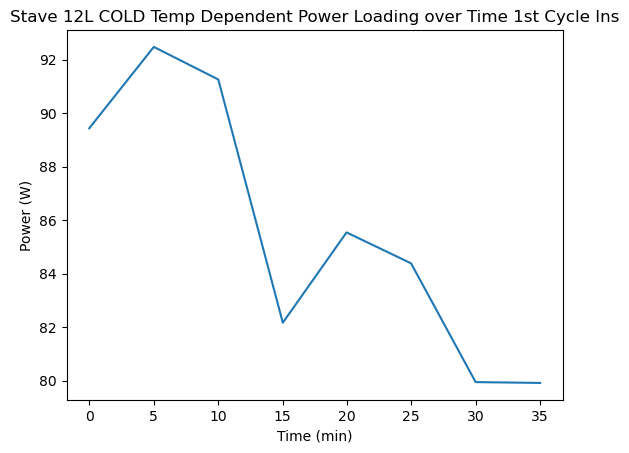

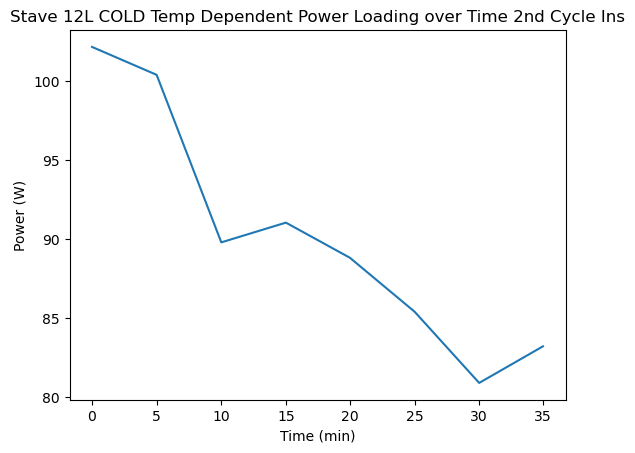

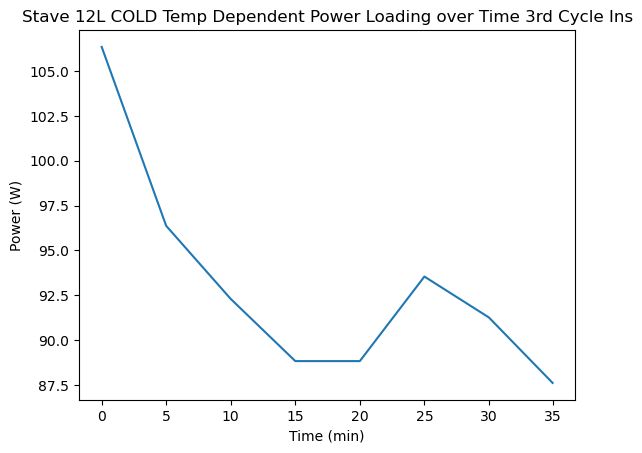

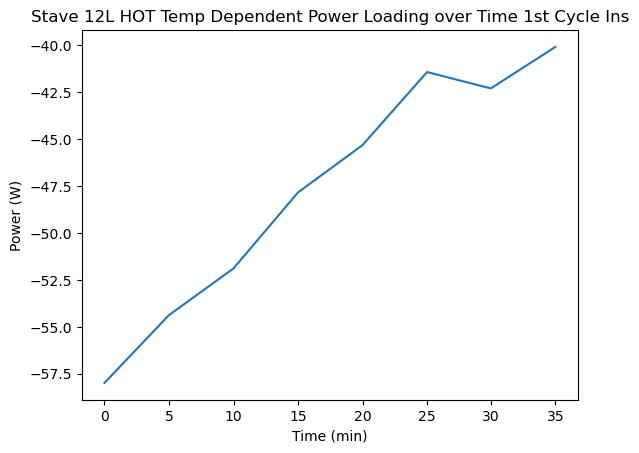

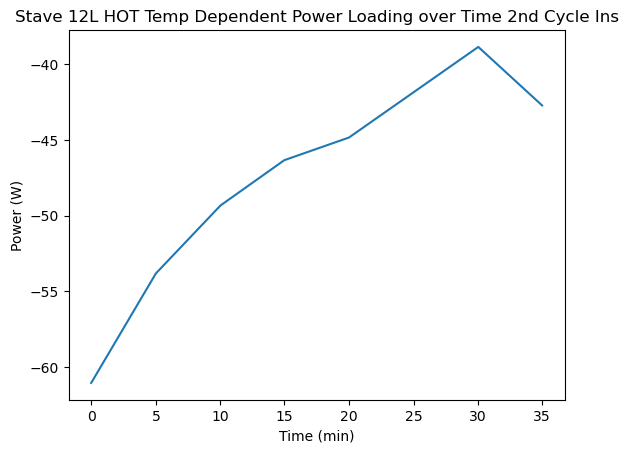

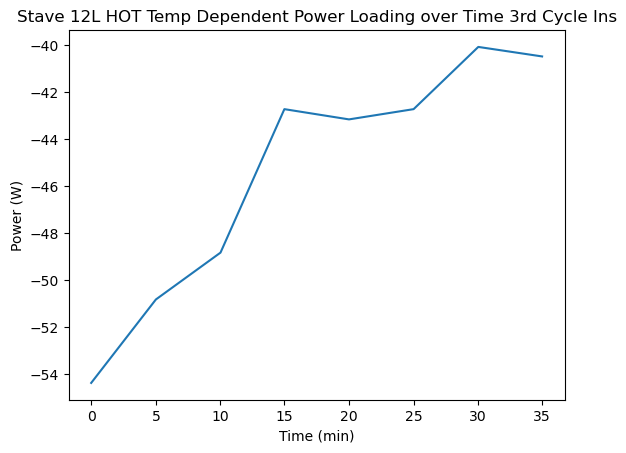

In [55]:
L12inspower_cold1 = ((1614/60)*1063*L12insflow[[0,1,2,3,4,5,6,7],1]*(L12instemps[[0,1,2,3,4,5,6,7],4]-L12instemps[[0,1,2,3,4,5,6,7],3]))/1000
L12inspower_cold2 = ((1614/60)*1063*L12insflow[[16,17,18,19,20,21,22,23],1]*(L12instemps[[16,17,18,19,20,21,22,23],4]-L12instemps[[16,17,18,19,20,21,22,23],3]))/1000
L12inspower_cold3 = ((1614/60)*1063*L12insflow[[32,33,34,35,36,37,38,39],1]*(L12instemps[[32,33,34,35,36,37,38,39],4]-L12instemps[[32,33,34,35,36,37,38,39],3]))/1000


L12inspower_hot1 = ((1448/60)*1213*L12insflow[[8,9,10,11,12,13,14,15],1]*(L12instemps[[8,9,10,11,12,13,14,15],4]-L12instemps[[8,9,10,11,12,13,14,15],3]))/1000
L12inspower_hot2 = ((1448/60)*1213*L12insflow[[24,25,26,27,28,29,30,31],1]*(L12instemps[[24,25,26,27,28,29,30,31],4]-L12instemps[[24,25,26,27,28,29,30,31],3]))/1000
L12inspower_hot3 = ((1448/60)*1213*L12insflow[[40,41,42,43,44,45,46,47],1]*(L12instemps[[40,41,42,43,44,45,46,47],4]-L12instemps[[40,41,42,43,44,45,46,47],3]))/1000



plt.plot(L12instemps[[0,1,2,3,4,5,6,7],0], L12inspower_cold1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L COLD Temp Dependent Power Loading over Time 1st Cycle Ins")
plt.figure()

plt.plot(L12instemps[[16,17,18,19,20,21,22,23],0], L12inspower_cold2)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L COLD Temp Dependent Power Loading over Time 2nd Cycle Ins")
plt.figure()

plt.plot(L12instemps[[32,33,34,35,36,37,38,39],0], L12inspower_cold3)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L COLD Temp Dependent Power Loading over Time 3rd Cycle Ins")
plt.figure()

plt.plot(L12instemps[[8,9,10,11,12,13,14,15],0], L12inspower_hot1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L HOT Temp Dependent Power Loading over Time 1st Cycle Ins")
plt.figure()

plt.plot(L12instemps[[24,25,26,27,28,29,30,31],0], L12inspower_hot2)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L HOT Temp Dependent Power Loading over Time 2nd Cycle Ins")
plt.figure()


plt.plot(L12instemps[[40,41,42,43,44,45,46,47],0], L12inspower_hot3)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L HOT Temp Dependent Power Loading over Time 3rd Cycle Ins")


Text(0.5, 1.0, 'Stave 12L HOT Temp Dependent Power Loading over Time 3rd Cycle Ins')

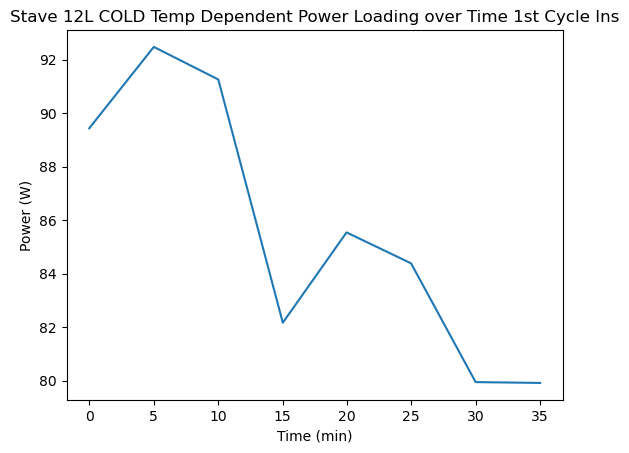

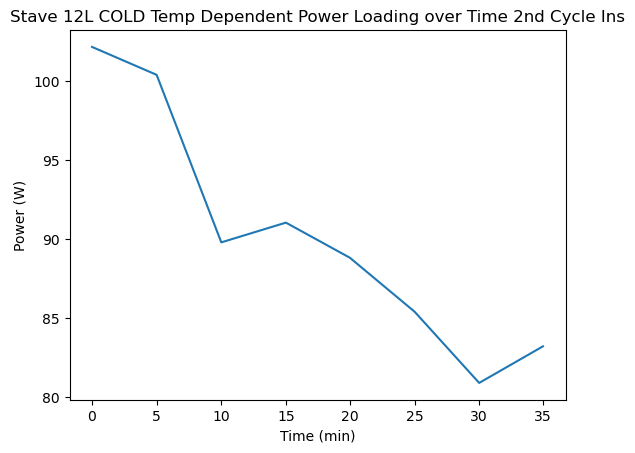

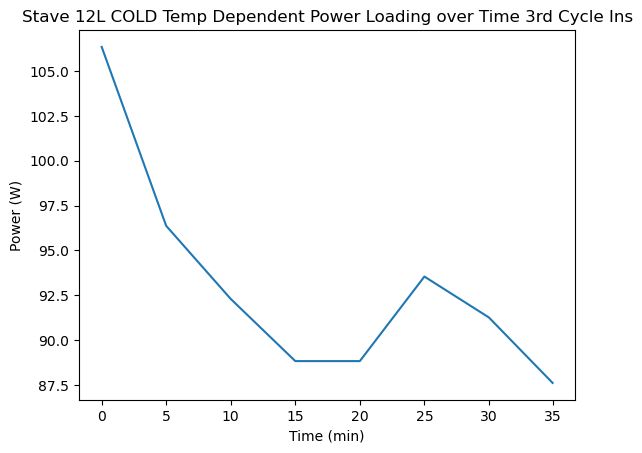

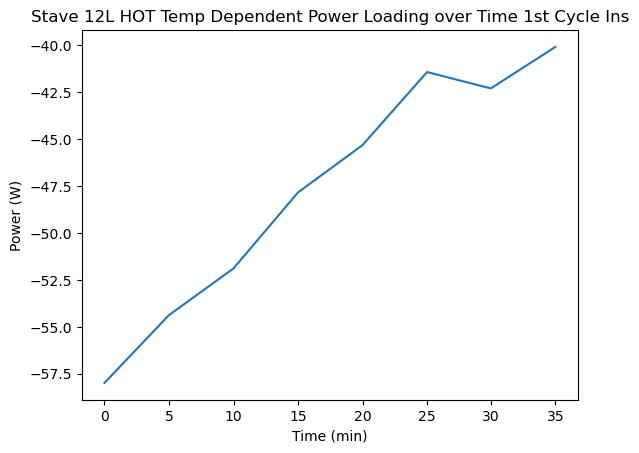

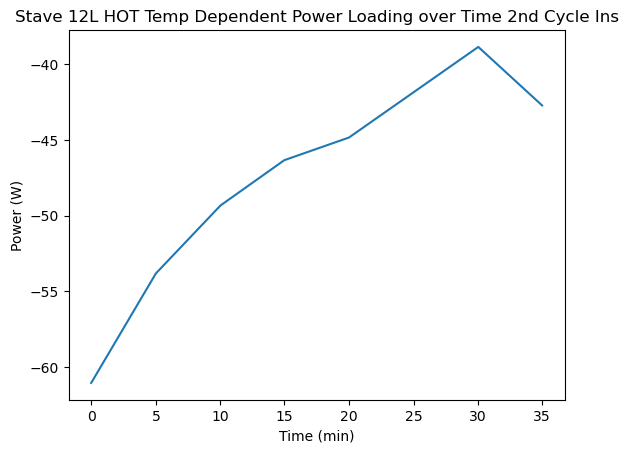

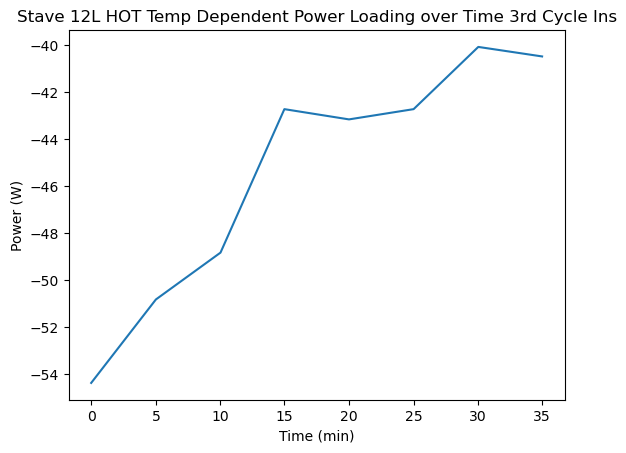

In [56]:
L12inspower_cold1 = ((1614/60)*1063*L12insflow[[0,1,2,3,4,5,6,7],1]*(L12instemps[[0,1,2,3,4,5,6,7],4]-L12instemps[[0,1,2,3,4,5,6,7],3]))/1000
L12inspower_cold2 = ((1614/60)*1063*L12insflow[[16,17,18,19,20,21,22,23],1]*(L12instemps[[16,17,18,19,20,21,22,23],4]-L12instemps[[16,17,18,19,20,21,22,23],3]))/1000
L12inspower_cold3 = ((1614/60)*1063*L12insflow[[32,33,34,35,36,37,38,39],1]*(L12instemps[[32,33,34,35,36,37,38,39],4]-L12instemps[[32,33,34,35,36,37,38,39],3]))/1000


L12inspower_hot1 = ((1448/60)*1213*L12insflow[[8,9,10,11,12,13,14,15],1]*(L12instemps[[8,9,10,11,12,13,14,15],4]-L12instemps[[8,9,10,11,12,13,14,15],3]))/1000
L12inspower_hot2 = ((1448/60)*1213*L12insflow[[24,25,26,27,28,29,30,31],1]*(L12instemps[[24,25,26,27,28,29,30,31],4]-L12instemps[[24,25,26,27,28,29,30,31],3]))/1000
L12inspower_hot3 = ((1448/60)*1213*L12insflow[[40,41,42,43,44,45,46,47],1]*(L12instemps[[40,41,42,43,44,45,46,47],4]-L12instemps[[40,41,42,43,44,45,46,47],3]))/1000



plt.plot(L12instemps[[0,1,2,3,4,5,6,7],0], L12inspower_cold1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L COLD Temp Dependent Power Loading over Time 1st Cycle Ins")
plt.figure()

plt.plot(L12instemps[[16,17,18,19,20,21,22,23],0], L12inspower_cold2)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L COLD Temp Dependent Power Loading over Time 2nd Cycle Ins")
plt.figure()

plt.plot(L12instemps[[32,33,34,35,36,37,38,39],0], L12inspower_cold3)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L COLD Temp Dependent Power Loading over Time 3rd Cycle Ins")
plt.figure()

plt.plot(L12instemps[[8,9,10,11,12,13,14,15],0], L12inspower_hot1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L HOT Temp Dependent Power Loading over Time 1st Cycle Ins")
plt.figure()

plt.plot(L12instemps[[24,25,26,27,28,29,30,31],0], L12inspower_hot2)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L HOT Temp Dependent Power Loading over Time 2nd Cycle Ins")
plt.figure()


plt.plot(L12instemps[[40,41,42,43,44,45,46,47],0], L12inspower_hot3)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(L12instemps[[40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12L HOT Temp Dependent Power Loading over Time 3rd Cycle Ins")


(28, 8, 2)
(28, 8, 2)


Text(0.5, 1.0, 'Stave 12L Power Load vs Impedance 3rd Cycle Ins')

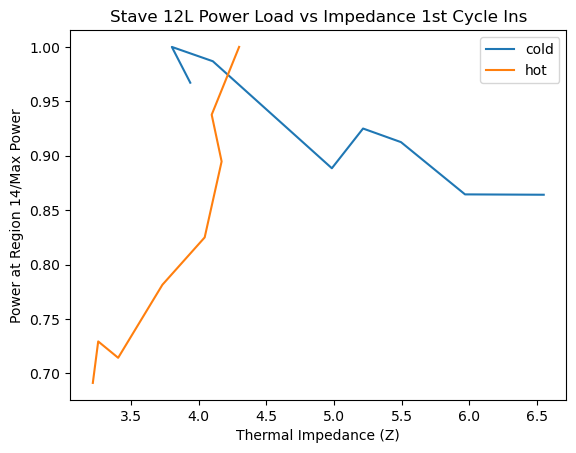

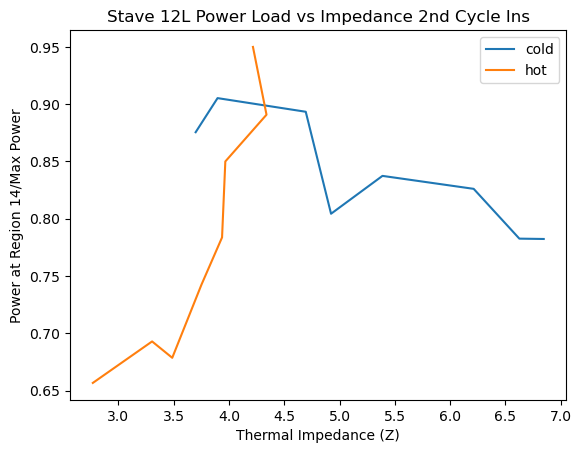

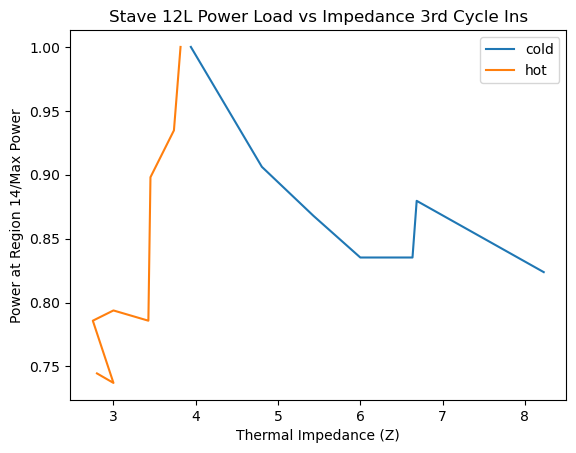

In [57]:
print(L12ins_cold3_swap.shape)
print(L12ins_hot3_swap.shape)

plt.plot(L12ins_cold1_swap[14,:,0], L12inspower_cold1/L12inspower_cold1.max(),)
plt.plot(L12ins_hot1_swap[14,:,0], abs(L12inspower_hot1/L12inspower_hot1.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12L Power Load vs Impedance 1st Cycle Ins")
plt.figure()

plt.plot(L12ins_cold2_swap[14,:,0], L12inspower_cold1/L12inspower_cold2.max(),)
plt.plot(L12ins_hot2_swap[14,:,0], abs(L12inspower_hot1/L12inspower_hot2.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12L Power Load vs Impedance 2nd Cycle Ins")
plt.figure()

plt.plot(L12ins_cold3_swap[14,:,0], L12inspower_cold3/L12inspower_cold3.max(),)
plt.plot(L12ins_hot3_swap[14,:,0], abs(L12inspower_hot3/L12inspower_hot3.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12L Power Load vs Impedance 3rd Cycle Ins")

Text(0.5, 1.0, 'Stave 12L Impedance vs Time 3rd Cycle Ins')

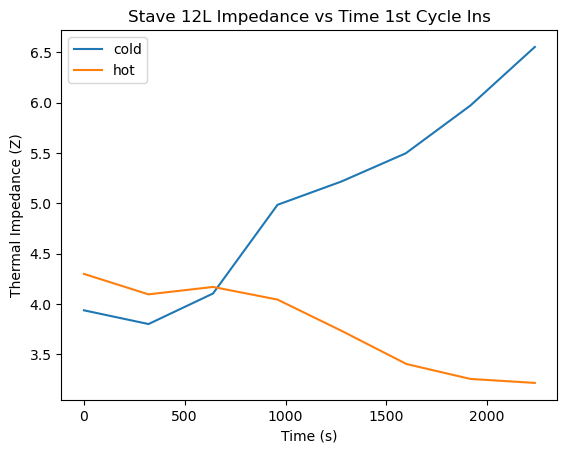

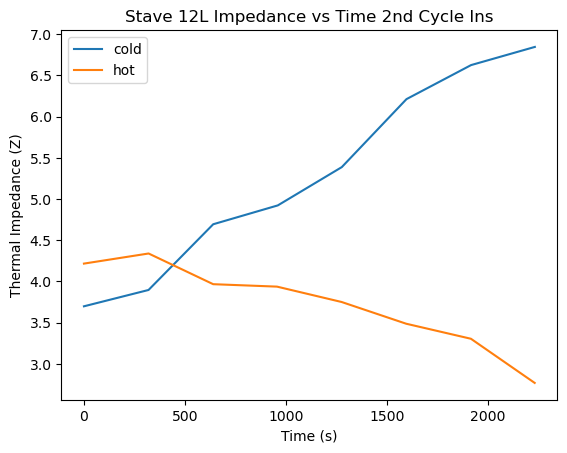

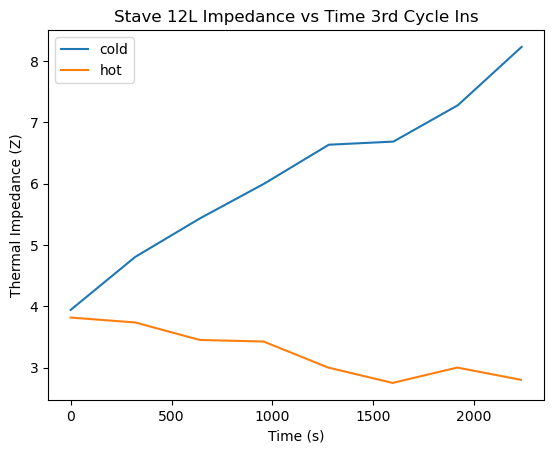

In [58]:
plt.plot(L12instemps[[0,1,2,3,4,5,6,7],0]-L12instemps[[0,1,2,3,4,5,6,7],0].min(), L12ins_cold1_swap[14,:,0])
plt.plot(L12instemps[[8,9,10,11,12,13,14,15],0]-L12instemps[[8,9,10,11,12,13,14,15],0].min(), L12ins_hot1_swap[14,:,0])
plt.xlabel('Time (s)')
plt.ylabel('Thermal Impedance (Z)')
plt.legend(['cold', 'hot'])
plt.title("Stave 12L Impedance vs Time 1st Cycle Ins")
plt.figure()

plt.plot(L12instemps[[16,17,18,19,20,21,22,23],0]-L12instemps[[16,17,18,19,20,21,22,23],0].min(), L12ins_cold2_swap[14,:,0])
plt.plot(L12instemps[[24,25,26,27,28,29,30,31],0]-L12instemps[[24,25,26,27,28,29,30,31],0].min(), L12ins_hot2_swap[14,:,0])
plt.xlabel('Time (s)')
plt.ylabel('Thermal Impedance (Z)')
plt.legend(['cold', 'hot'])
plt.title("Stave 12L Impedance vs Time 2nd Cycle Ins")
plt.figure()

plt.plot(L12instemps[[32,33,34,35,36,37,38,39],0]-L12instemps[[32,33,34,35,36,37,38,39],0].min(), L12ins_cold3_swap[14,:,0])
plt.plot(L12instemps[[40,41,42,43,44,45,46,47],0]-L12instemps[[40,41,42,43,44,45,46,47],0].min(), L12ins_hot3_swap[14,:,0])
plt.xlabel('Time (s)')
plt.ylabel('Thermal Impedance (Z)')
plt.legend(['cold', 'hot'])
plt.title("Stave 12L Impedance vs Time 3rd Cycle Ins")

### Side J

In [59]:
J12instemps = []
J12insflow = []
for filename in sorted(glob("../Stave12_Insulation-NewCam2_LS_CERN_J_*.npz")):
    f = np.load(filename)
    J12insflowtime = f["flow_times"][-1]
    J12insflowdata = np.median(f["flow_data"][-5:])
    J12insflow.append([J12insflowtime, J12insflowdata])
    J12insthermtime = f["thermo_times"][-1]
    J12insthermdata = list(f["thermo_data"][-1])
    J12instemps.append([J12insthermtime]+J12insthermdata)
    #print(filename)

J12instemps = np.array(J12instemps)
J12insflow = np.array(J12insflow)

(8, 28, 2)
(28, 8, 2)


Text(0.5, 1.0, 'Stave 12J HOT Impedances over Time (Large Region) All Cycles Ins')

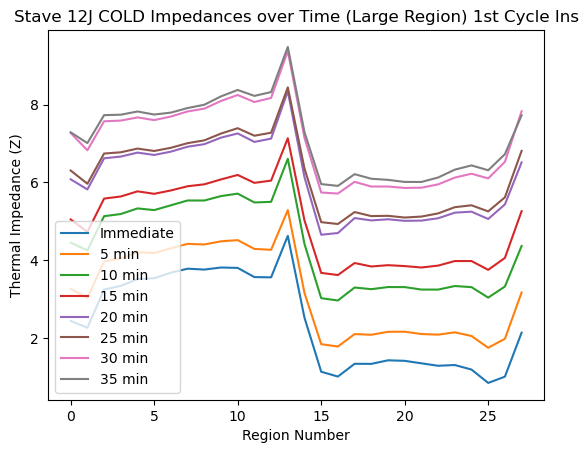

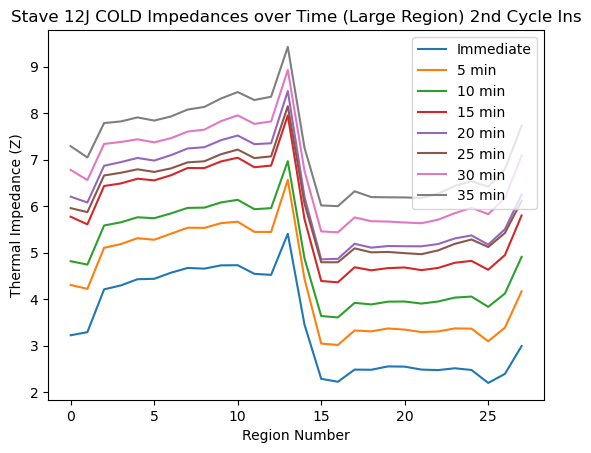

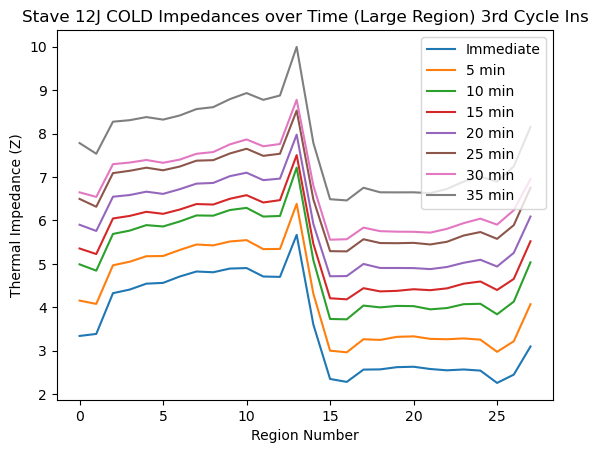

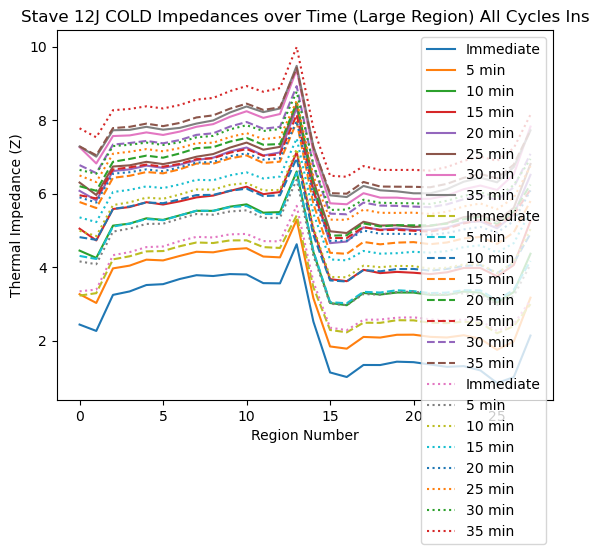

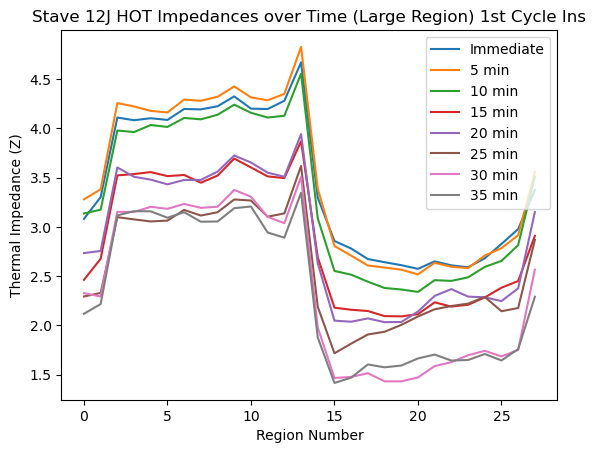

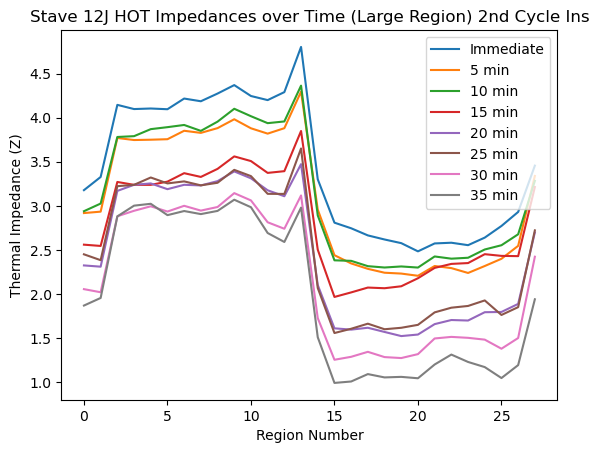

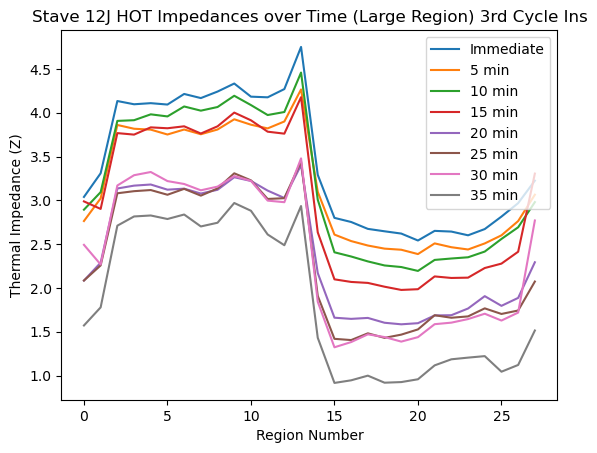

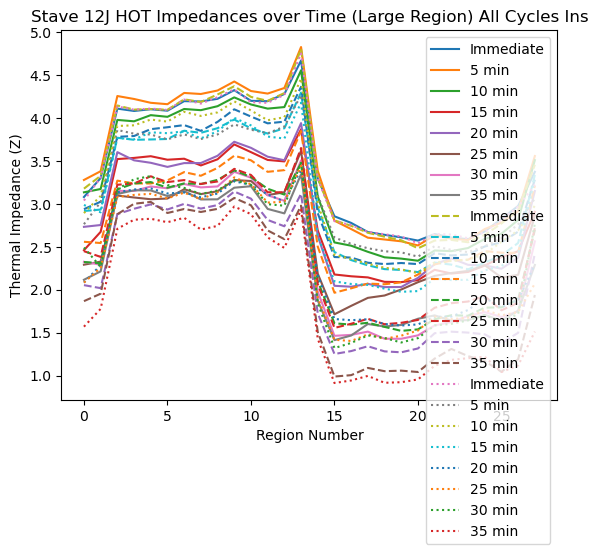

In [60]:
J12ins_hot1 = [] #large region top
J12ins_cold1 = [] #large region top
J12ins_hot2 = [] #large region top
J12ins_cold2 = []
J12ins_hot3 = [] #large region top
J12ins_cold3 = []

J12ins_hot1_goavg = [] #large region top
J12ins_cold1_goavg = [] #large region top
J12ins_hot2_goavg = [] #large region top
J12ins_cold2_goavg = []
J12ins_hot3_goavg = [] #large region top
J12ins_cold3_goavg = []#large region top


for filename2 in sorted(glob("output/Stave12J_ins/Stave12_Insulation-NewCam2_LS_CERN_J_*_IMPEDANCES.csv")):
    index2 = int(filename2.split("_")[-2])

    #ORIGINALLY USED COLUMNS 1 and 2, Apr 1 testing 0,1 for average thingy 
    if (index2 >=8 and index2 <16):
    #if (index2 >=8 and index2 <16) or (index2 >=24 and index2 <32):
        J12ins_hot1.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index2 >=24 and index2 <32):
        J12ins_hot2.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index2 >=40 and index2 <48):
        J12ins_hot3.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    #ONLY USE FOR AVERAGES
    if (index2 >=8 and index2 <16):
    #if (index2 >=8 and index2 <16) or (index2 >=24 and index2 <32):
        J12ins_hot1_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index2 >=24 and index2 <32):
        J12ins_hot2_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index2 >=40 and index2 <48):
        J12ins_hot3_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))
    
    
    if (index2 <8):
    #if (index2 <8) or (index2 >=16 and index2 <24):
        J12ins_cold1.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))


    if (index2 >=16 and index2 <24):
        J12ins_cold2.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    
    if (index2 >=32 and index2 <40):
        J12ins_cold3.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))


    if (index2 <8):
    #if (index2 <8) or (index2 >=16 and index2 <24):
        J12ins_cold1_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))


    if (index2 >=16 and index2 <24):
        J12ins_cold2_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index2 >=32 and index2 <40):
        J12ins_cold3_goavg.append(np.loadtxt(filename2, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))




J12ins_hot1 = np.stack(J12ins_hot1, axis=0)
J12ins_hot1_swap = np.swapaxes(J12ins_hot1, 0, 1)

J12ins_hot2 = np.stack(J12ins_hot2, axis=0)
J12ins_hot2_swap = np.swapaxes(J12ins_hot2, 0, 1)

J12ins_hot3 = np.stack(J12ins_hot3, axis=0)
J12ins_hot3_swap = np.swapaxes(J12ins_hot3, 0, 1)
print(J12ins_hot3.shape)
print(J12ins_hot3_swap.shape)


J12ins_cold1 = np.stack(J12ins_cold1, axis=0)
J12ins_cold1_swap = np.swapaxes(J12ins_cold1, 0, 1)

J12ins_cold2 = np.stack(J12ins_cold2, axis=0)
J12ins_cold2_swap = np.swapaxes(J12ins_cold2, 0, 1)

J12ins_cold3 = np.stack(J12ins_cold3, axis=0)
J12ins_cold3_swap = np.swapaxes(J12ins_cold3, 0, 1)


J12ins_hot1_goavg = np.stack(J12ins_hot1_goavg, axis=0)
J12ins_hot1_goavg_swap = np.swapaxes(J12ins_hot1_goavg, 0, 1)

J12ins_hot2_goavg = np.stack(J12ins_hot2_goavg, axis=0)
J12ins_hot2_goavg_swap = np.swapaxes(J12ins_hot2_goavg, 0, 1)

J12ins_hot3_goavg = np.stack(J12ins_hot3_goavg, axis=0)
J12ins_hot3_goavg_swap = np.swapaxes(J12ins_hot3_goavg, 0, 1)


J12ins_cold1_goavg = np.stack(J12ins_cold1_goavg, axis=0)
J12ins_cold1_goavg_swap = np.swapaxes(J12ins_cold1_goavg, 0, 1)

J12ins_cold2_goavg = np.stack(J12ins_cold2_goavg, axis=0)
J12ins_cold2_goavg_swap = np.swapaxes(J12ins_cold2_goavg, 0, 1)

J12ins_cold3_goavg = np.stack(J12ins_cold3_goavg, axis=0)
J12ins_cold3_goavg_swap = np.swapaxes(J12ins_cold3_goavg, 0, 1)


arr_J12ins_hot1_swap = np.array(J12ins_hot1_swap)
arr_J12ins_hot2_swap = np.array(J12ins_hot2_swap)
arr_J12ins_hot3_swap = np.array(J12ins_hot3_swap)
arr_J12ins_cold1_swap = np.array(J12ins_cold1_swap)
arr_J12ins_cold2_swap = np.array(J12ins_cold2_swap)
arr_J12ins_cold3_swap = np.array(J12ins_cold3_swap)

arr_J12ins_hot1_goavg = np.array(J12ins_hot1_goavg)
arr_J12ins_hot2_goavg = np.array(J12ins_hot2_goavg)
arr_J12ins_hot3_goavg = np.array(J12ins_hot3_goavg)
arr_J12ins_cold1_goavg = np.array(J12ins_cold1_goavg)
arr_J12ins_cold2_goavg = np.array(J12ins_cold2_goavg)
arr_J12ins_cold3_goavg = np.array(J12ins_cold3_goavg)


#J9_hot_avg = (arr_J9_hot1_swap+arr_J9_hot2_swap)/2
J12ins_hot_avg = (arr_J12ins_hot1_goavg+arr_J12ins_hot2_goavg+arr_J12ins_hot3_goavg)/3


J12ins_cold_avg = (arr_J12ins_cold1_goavg+arr_J12ins_cold2_goavg+arr_J12ins_cold3_goavg)/3




plt.plot(J12ins_cold1_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J COLD Impedances over Time (Large Region) 1st Cycle Ins")
plt.figure()

plt.plot(J12ins_cold2_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J COLD Impedances over Time (Large Region) 2nd Cycle Ins")
plt.figure()

plt.plot(J12ins_cold3_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J COLD Impedances over Time (Large Region) 3rd Cycle Ins")
plt.figure()

plt.plot(J12ins_cold1_swap[:,:,0])
plt.plot(J12ins_cold2_swap[:,:,0], linestyle='dashed')
plt.plot(J12ins_cold3_swap[:,:,0], linestyle='dotted')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J COLD Impedances over Time (Large Region) All Cycles Ins")
plt.figure()

plt.plot(J12ins_hot1_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J HOT Impedances over Time (Large Region) 1st Cycle Ins")
plt.figure()

plt.plot(J12ins_hot2_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J HOT Impedances over Time (Large Region) 2nd Cycle Ins")
plt.figure()

plt.plot(J12ins_hot3_swap[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J HOT Impedances over Time (Large Region) 3rd Cycle Ins")
plt.figure()

plt.plot(J12ins_hot1_swap[:,:,0])
plt.plot(J12ins_hot2_swap[:,:,0], linestyle='dashed')
plt.plot(J12ins_hot3_swap[:,:,0], linestyle='dotted')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12J HOT Impedances over Time (Large Region) All Cycles Ins")

Text(0.5, 1.0, 'Stave 12J COLD Inlet/Outlet Temp over Time All Cycles Ins')

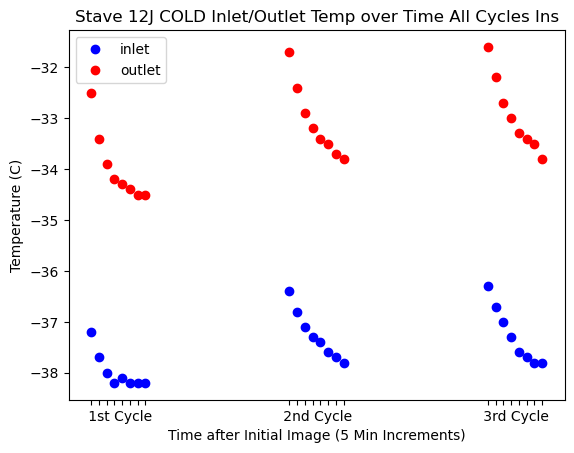

In [61]:

plt.plot(
    
    J12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], J12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3],'bo',

    J12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], J12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4], 'ro',
)
plt.legend(['inlet', 'outlet'])

xticks = ['','', '      1st Cycle','','','', '',' ','','', '      2nd Cycle','','','', '',' ', '','','      3rd Cycle','','','', '',' ']
plt.xticks(J12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12J COLD Inlet/Outlet Temp over Time All Cycles Ins")


Text(0.5, 1.0, 'Stave 12J COLD Inlet/Outlet Temp Difference over Time All Cycles Ins')

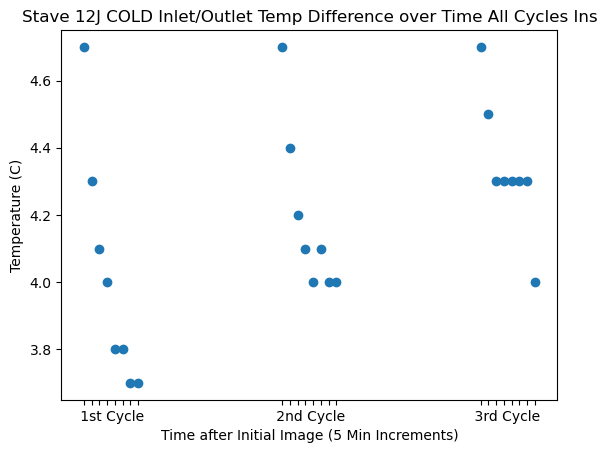

In [62]:
plt.plot(J12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],J12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-J12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3],'o')

xticks = ['','', '      1st Cycle','','','', '',' ','','', '      2nd Cycle','','','', '',' ', '            3rd Cycle','','','', '',' ','','']
plt.xticks(J12instemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12J COLD Inlet/Outlet Temp Difference over Time All Cycles Ins")


Text(0.5, 1.0, 'Stave 12J HOT Inlet/Outlet Temp over Time All Cycles Ins')

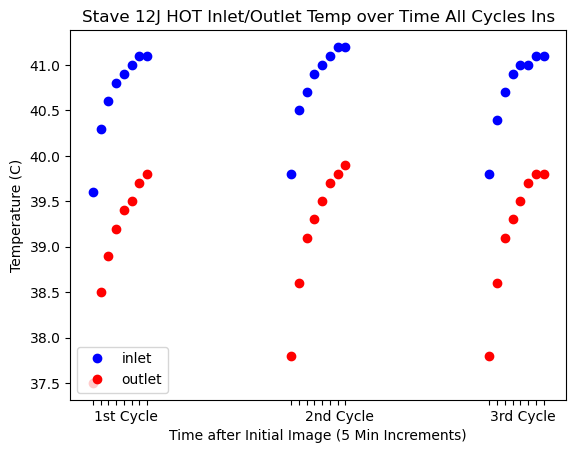

In [63]:
plt.plot(
    
    J12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], J12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3],'bo',
    J12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], J12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4], 'ro',
)
plt.legend(['inlet', 'outlet'])


xticks = ['','', '        1st Cycle','','','', '',' ','','', ' ', ' ','        2nd Cycle','','','', '',' ', '        3rd Cycle','','','', '',' ']
plt.xticks(J12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12J HOT Inlet/Outlet Temp over Time All Cycles Ins")


Text(0.5, 1.0, 'Stave 12J HOT Inlet/Outlet Temp Difference over Time All Cycles Ins')

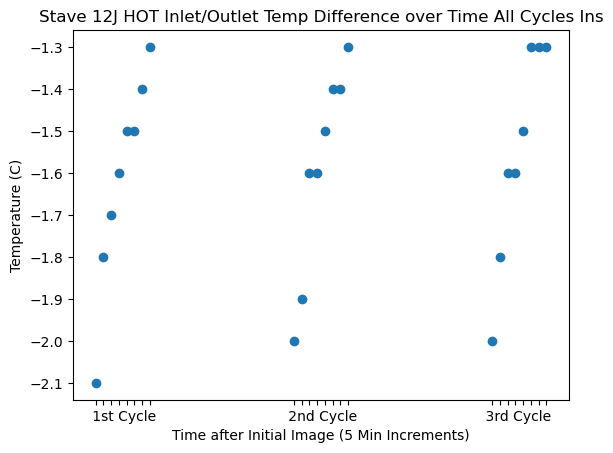

In [64]:
plt.plot(J12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],J12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4]-J12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3],'o')

xticks = ['','', '      1st Cycle','','','', '',' ','','', '      2nd Cycle','','','', '',' ', '            3rd Cycle','','','', '',' ','','']
plt.xticks(J12instemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12J HOT Inlet/Outlet Temp Difference over Time All Cycles Ins")

Text(0.5, 1.0, 'Stave 12J HOT Temp Dependent Power Loading over Time 3rd Cycle Ins')

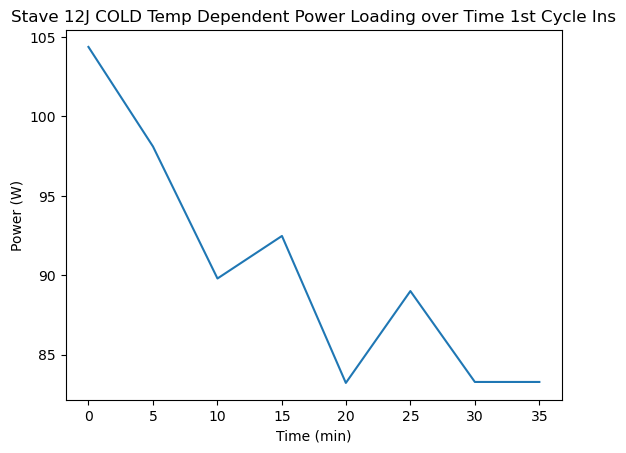

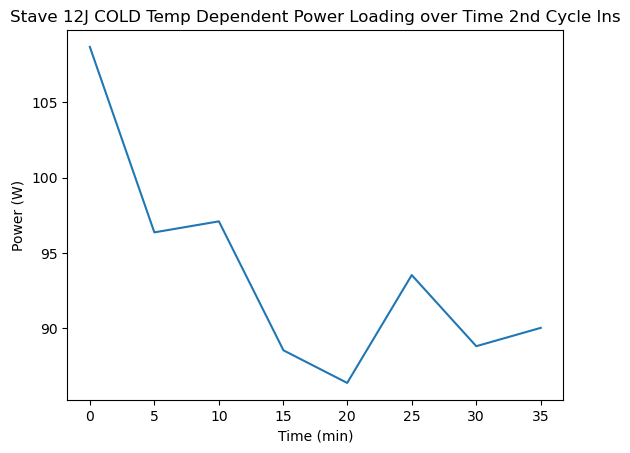

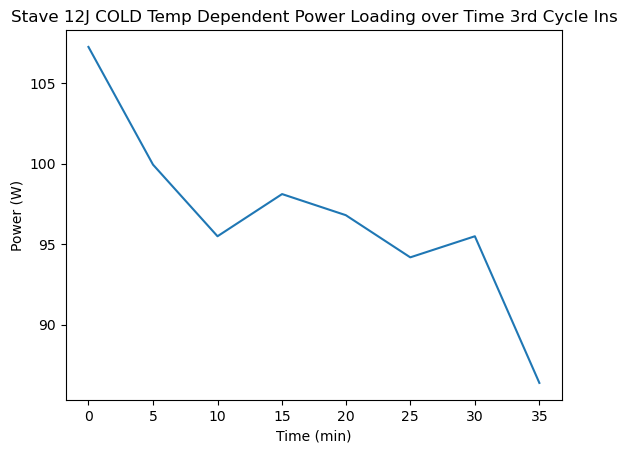

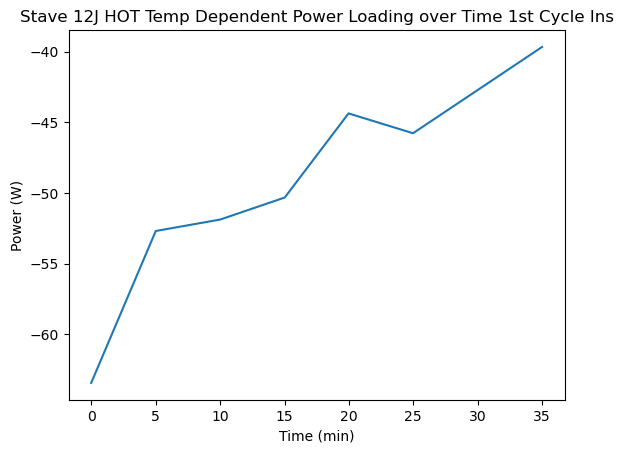

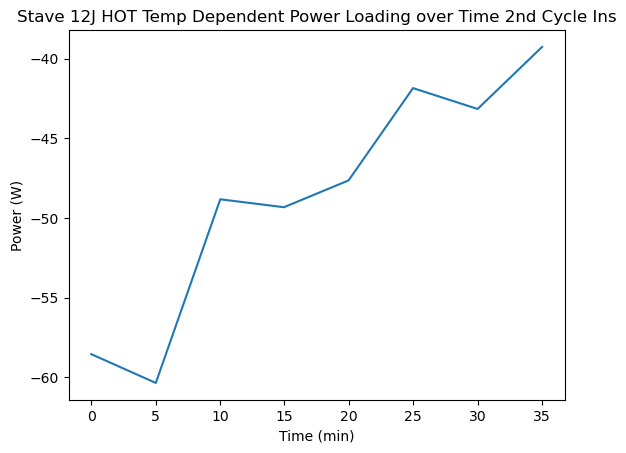

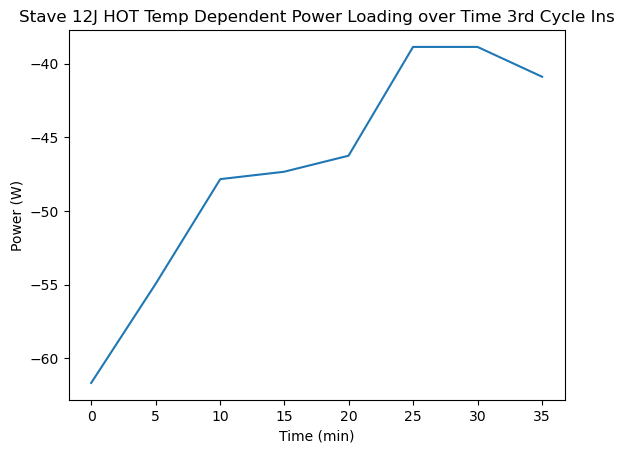

In [65]:
J12inspower_cold1 = ((1614/60)*1063*J12insflow[[0,1,2,3,4,5,6,7],1]*(J12instemps[[0,1,2,3,4,5,6,7],4]-J12instemps[[0,1,2,3,4,5,6,7],3]))/1000
J12inspower_cold2 = ((1614/60)*1063*J12insflow[[16,17,18,19,20,21,22,23],1]*(J12instemps[[16,17,18,19,20,21,22,23],4]-J12instemps[[16,17,18,19,20,21,22,23],3]))/1000
J12inspower_cold3 = ((1614/60)*1063*J12insflow[[32,33,34,35,36,37,38,39],1]*(J12instemps[[32,33,34,35,36,37,38,39],4]-J12instemps[[32,33,34,35,36,37,38,39],3]))/1000


J12inspower_hot1 = ((1448/60)*1213*J12insflow[[8,9,10,11,12,13,14,15],1]*(J12instemps[[8,9,10,11,12,13,14,15],4]-J12instemps[[8,9,10,11,12,13,14,15],3]))/1000
J12inspower_hot2 = ((1448/60)*1213*J12insflow[[24,25,26,27,28,29,30,31],1]*(J12instemps[[24,25,26,27,28,29,30,31],4]-J12instemps[[24,25,26,27,28,29,30,31],3]))/1000
J12inspower_hot3 = ((1448/60)*1213*J12insflow[[40,41,42,43,44,45,46,47],1]*(J12instemps[[40,41,42,43,44,45,46,47],4]-J12instemps[[40,41,42,43,44,45,46,47],3]))/1000



plt.plot(J12instemps[[0,1,2,3,4,5,6,7],0], J12inspower_cold1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J12instemps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12J COLD Temp Dependent Power Loading over Time 1st Cycle Ins")
plt.figure()

plt.plot(J12instemps[[16,17,18,19,20,21,22,23],0], J12inspower_cold2)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J12instemps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12J COLD Temp Dependent Power Loading over Time 2nd Cycle Ins")
plt.figure()

plt.plot(J12instemps[[32,33,34,35,36,37,38,39],0], J12inspower_cold3)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J12instemps[[32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12J COLD Temp Dependent Power Loading over Time 3rd Cycle Ins")
plt.figure()

plt.plot(J12instemps[[8,9,10,11,12,13,14,15],0], J12inspower_hot1)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J12instemps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12J HOT Temp Dependent Power Loading over Time 1st Cycle Ins")
plt.figure()

plt.plot(J12instemps[[24,25,26,27,28,29,30,31],0], J12inspower_hot2)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J12instemps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12J HOT Temp Dependent Power Loading over Time 2nd Cycle Ins")
plt.figure()


plt.plot(J12instemps[[40,41,42,43,44,45,46,47],0], J12inspower_hot3)
xticks = ['0','5', '10','15','20','25', '30','35']
plt.xticks(J12instemps[[40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel('Power (W)')
plt.title("Stave 12J HOT Temp Dependent Power Loading over Time 3rd Cycle Ins")


Text(0.5, 1.0, 'Stave 12J Power Load vs Impedance 3rd Cycle Ins')

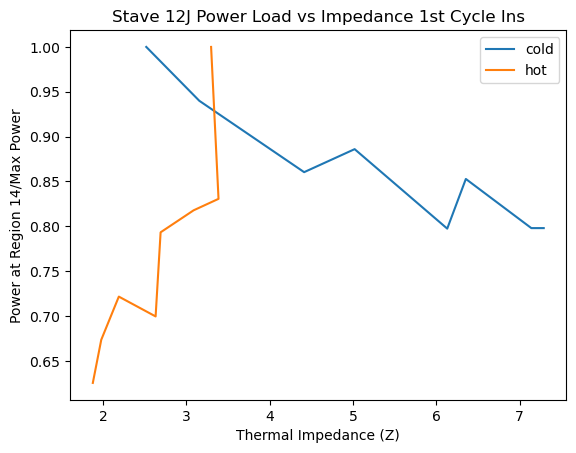

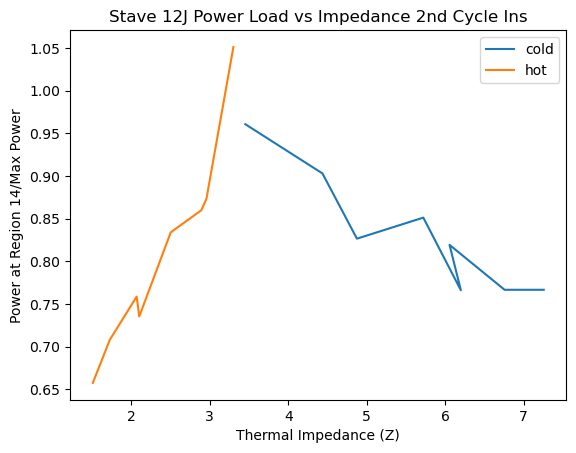

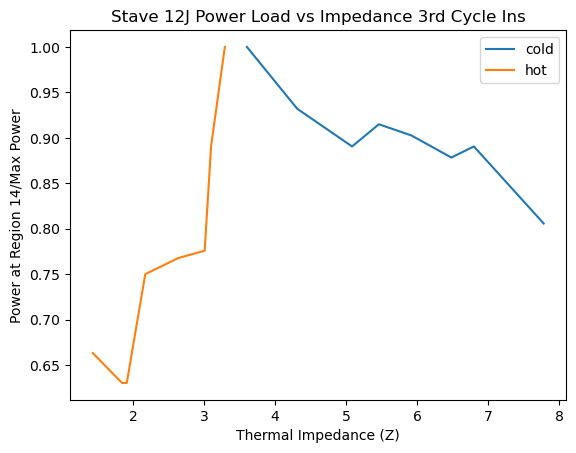

In [66]:
plt.plot(J12ins_cold1_swap[14,:,0], J12inspower_cold1/J12inspower_cold1.max(),)
plt.plot(J12ins_hot1_swap[14,:,0], abs(J12inspower_hot1/J12inspower_hot1.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12J Power Load vs Impedance 1st Cycle Ins")
plt.figure()

plt.plot(J12ins_cold2_swap[14,:,0], J12inspower_cold1/J12inspower_cold2.max(),)
plt.plot(J12ins_hot2_swap[14,:,0], abs(J12inspower_hot1/J12inspower_hot2.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12J Power Load vs Impedance 2nd Cycle Ins")
plt.figure()

plt.plot(J12ins_cold3_swap[14,:,0], J12inspower_cold3/J12inspower_cold3.max(),)
plt.plot(J12ins_hot3_swap[14,:,0], abs(J12inspower_hot3/J12inspower_hot3.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12J Power Load vs Impedance 3rd Cycle Ins")

Text(0.5, 1.0, 'Stave 12J Impedance vs Time 3rd Cycle Ins')

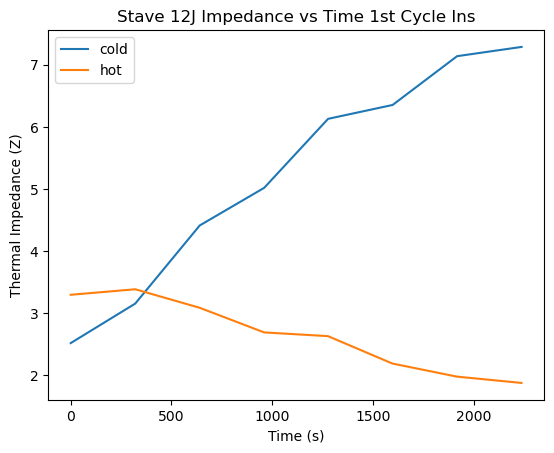

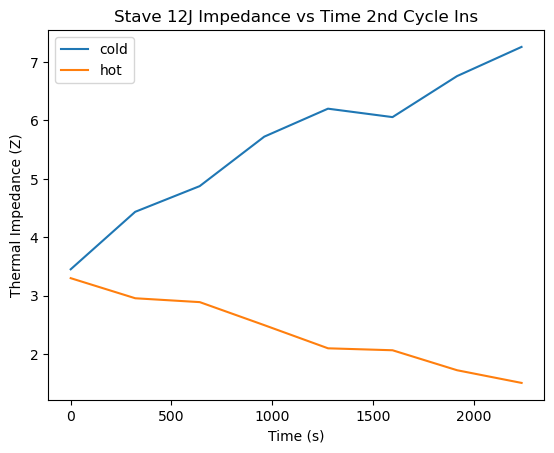

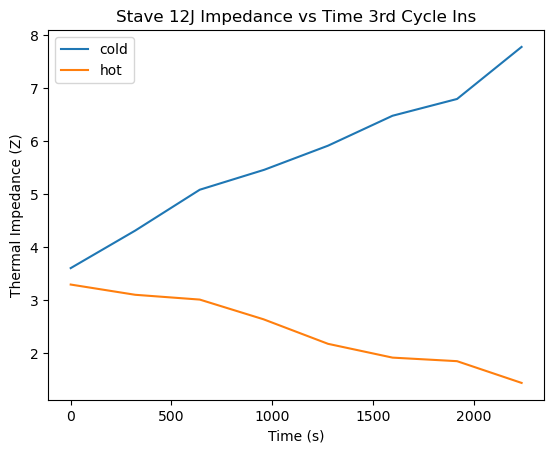

In [67]:
plt.plot(J12instemps[[0,1,2,3,4,5,6,7],0]-J12instemps[[0,1,2,3,4,5,6,7],0].min(), J12ins_cold1_swap[14,:,0])
plt.plot(J12instemps[[8,9,10,11,12,13,14,15],0]-J12instemps[[8,9,10,11,12,13,14,15],0].min(), J12ins_hot1_swap[14,:,0])
plt.xlabel('Time (s)')
plt.ylabel('Thermal Impedance (Z)')
plt.legend(['cold', 'hot'])
plt.title("Stave 12J Impedance vs Time 1st Cycle Ins")
plt.figure()

plt.plot(J12instemps[[16,17,18,19,20,21,22,23],0]-J12instemps[[16,17,18,19,20,21,22,23],0].min(), J12ins_cold2_swap[14,:,0])
plt.plot(J12instemps[[24,25,26,27,28,29,30,31],0]-J12instemps[[24,25,26,27,28,29,30,31],0].min(), J12ins_hot2_swap[14,:,0])
plt.xlabel('Time (s)')
plt.ylabel('Thermal Impedance (Z)')
plt.legend(['cold', 'hot'])
plt.title("Stave 12J Impedance vs Time 2nd Cycle Ins")
plt.figure()

plt.plot(J12instemps[[32,33,34,35,36,37,38,39],0]-J12instemps[[32,33,34,35,36,37,38,39],0].min(), J12ins_cold3_swap[14,:,0])
plt.plot(J12instemps[[40,41,42,43,44,45,46,47],0]-J12instemps[[40,41,42,43,44,45,46,47],0].min(), J12ins_hot3_swap[14,:,0])
plt.xlabel('Time (s)')
plt.ylabel('Thermal Impedance (Z)')
plt.legend(['cold', 'hot'])
plt.title("Stave 12J Impedance vs Time 3rd Cycle Ins")

## Gap Insulation

### Side L

In [68]:
L12gaponetemps = []
L12gaponeflow = []
for filename in sorted(glob("../Stave12_InsulationGap-NewCam_LS_CERN_L_*.npz")):
    f = np.load(filename)
    L12gaponeflowtime = f["flow_times"][-1]
    L12gaponeflowdata = np.median(f["flow_data"][-5:])
    L12gaponeflow.append([L12gaponeflowtime, L12gaponeflowdata])
    L12gaponethermtime = f["thermo_times"][-1]
    L12gaponethermdata = list(f["thermo_data"][-1])
    L12gaponetemps.append([L12gaponethermtime]+L12gaponethermdata)

L12gaponetemps = np.array(L12gaponetemps)
L12gaponeflow = np.array(L12gaponeflow)

L12gaptwotemps = []
L12gaptwoflow = []
for filename in sorted(glob("../Stave12_InsulationGap-NewCam-secondtry_LS_CERN_L_*.npz")):
    f = np.load(filename)
    L12gaptwoflowtime = f["flow_times"][-1]
    L12gaptwoflowdata = np.median(f["flow_data"][-5:])
    L12gaptwoflow.append([L12gaptwoflowtime, L12gaptwoflowdata])
    L12gaptwothermtime = f["thermo_times"][-1]
    L12gaptwothermdata = list(f["thermo_data"][-1])
    L12gaptwotemps.append([L12gaptwothermtime]+L12gaptwothermdata)

L12gaptwotemps = np.array(L12gaptwotemps)
L12gaptwoflow = np.array(L12gaptwoflow)

Text(0.5, 1.0, 'Stave 12L Gap Day One HOT Impedances over Time (Large Region) Both Cycles')

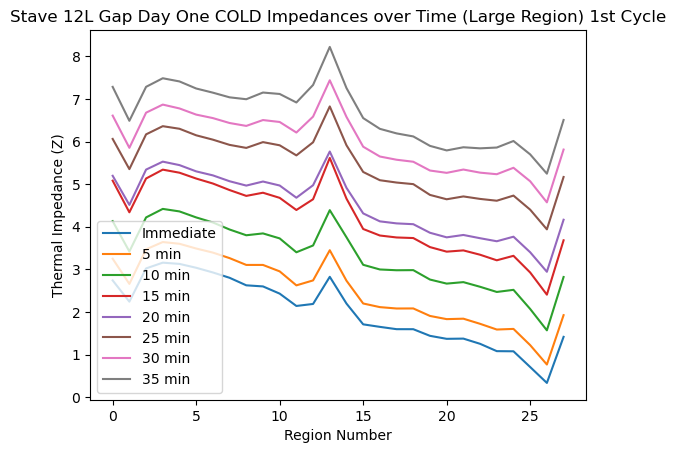

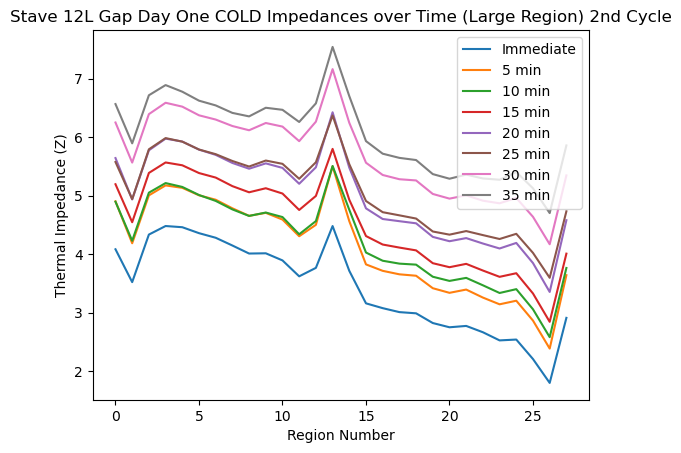

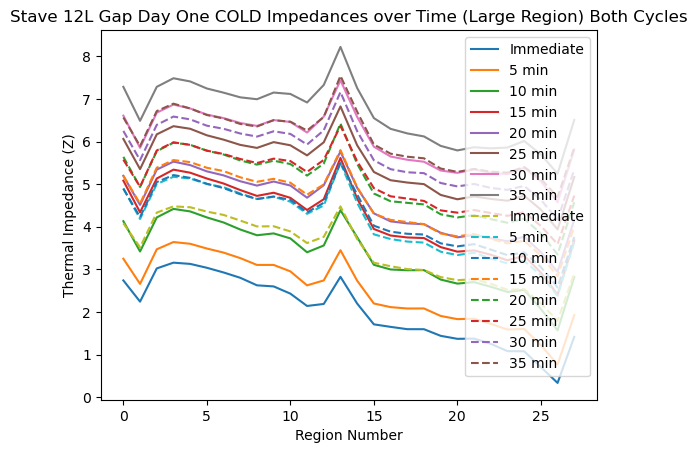

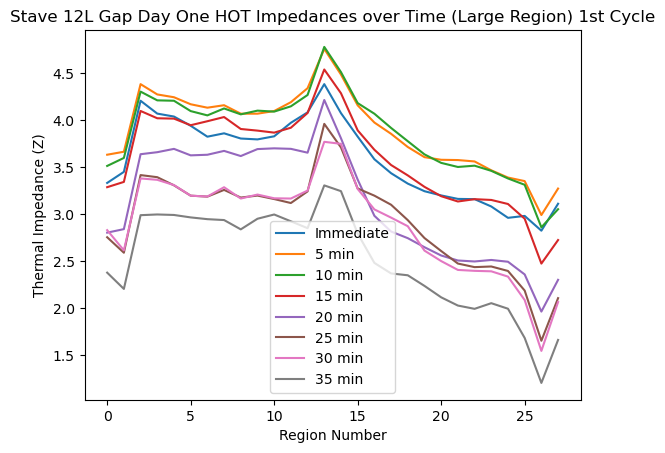

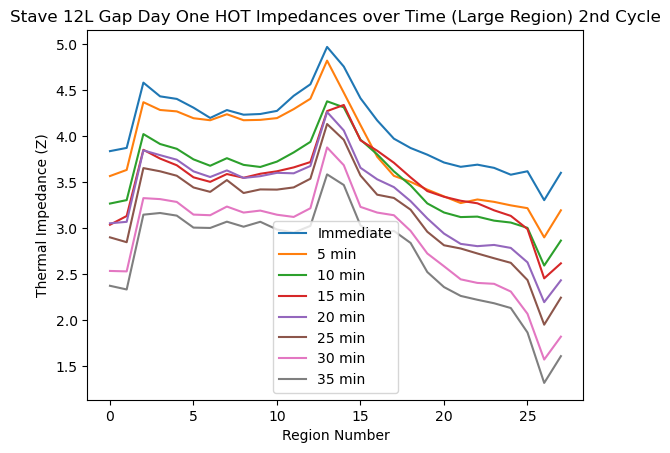

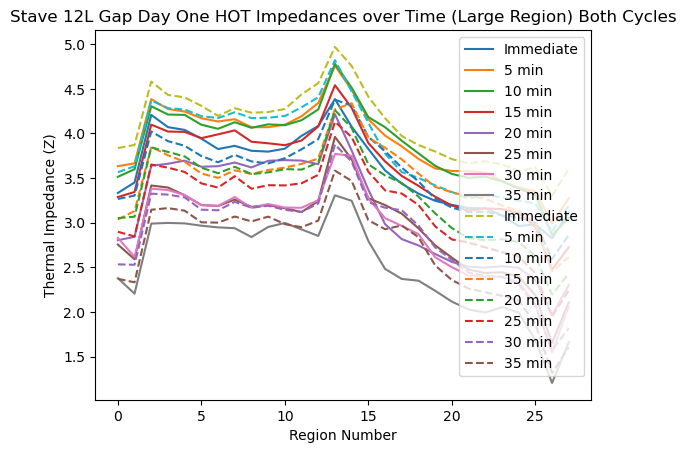

In [69]:
L12gapone_hot_1 = [] #large region top
L12gapone_cold_1 = [] #large region top
L12gapone_hot_2 = [] #large region top
L12gapone_cold_2 = [] #large region top

L12gapone_hot_goavg_1 = [] #large region top
L12gapone_cold_goavg_1 = [] #large region top
L12gapone_hot_goavg_2 = [] #large region top
L12gapone_cold_goavg_2 = [] #large region top


for filename in sorted(glob("output/Stave12L_insgap/Stave12_InsulationGap-NewCam_LS_CERN_L_*_IMPEDANCES.csv")):
    index = int(filename.split("_")[-2])

    if (index >=8 and index <16):
        L12gapone_hot_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
    #if (index >=8 and index <16) or (index >=24 and index <32):
        L12gapone_hot_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=-1 and index <8):
        L12gapone_cold_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
    #if (index >=-1 and index <8) or (index >=16 and index <24):
        L12gapone_cold_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))



    if (index >=8 and index <16):
        L12gapone_hot_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
    #if (index >=8 and index <16) or (index >=24 and index <32):
        L12gapone_hot_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=-1 and index <8):
        L12gapone_cold_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
    #if (index >=-1 and index <8) or (index >=16 and index <24):
        L12gapone_cold_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))


L12gapone_hot_1 = np.stack(L12gapone_hot_1, axis=0)
L12gapone_hot_swap_1 = np.swapaxes(L12gapone_hot_1, 0, 1)
L12gapone_cold_1 = np.stack(L12gapone_cold_1, axis=0)
L12gapone_cold_swap_1 = np.swapaxes(L12gapone_cold_1, 0, 1)
L12gapone_hot_2 = np.stack(L12gapone_hot_2, axis=0)
L12gapone_hot_swap_2 = np.swapaxes(L12gapone_hot_2, 0, 1)
L12gapone_cold_2 = np.stack(L12gapone_cold_2, axis=0)
L12gapone_cold_swap_2 = np.swapaxes(L12gapone_cold_2, 0, 1)
L12gapone_hot_all = np.concatenate((L12gapone_hot_1, L12gapone_hot_2),axis=0)
L12gapone_hot_all_swap = np.concatenate((L12gapone_hot_swap_1, L12gapone_hot_swap_2),axis=0)
L12gapone_cold_all = np.concatenate((L12gapone_cold_1, L12gapone_cold_2),axis=0)
L12gapone_cold_all_swap = np.concatenate((L12gapone_cold_swap_1, L12gapone_cold_swap_2),axis=0)


L12gapone_hot_goavg_1 = np.stack(L12gapone_hot_goavg_1, axis=0)
L12gapone_hot_goavg_swap_1 = np.swapaxes(L12gapone_hot_goavg_1, 0, 1)
L12gapone_cold_goavg_1 = np.stack(L12gapone_cold_goavg_1, axis=0)
L12gapone_cold_goavg_swap_1 = np.swapaxes(L12gapone_cold_goavg_1, 0, 1)
L12gapone_hot_goavg_2 = np.stack(L12gapone_hot_goavg_2, axis=0)
L12gapone_hot_goavg_swap_2 = np.swapaxes(L12gapone_hot_goavg_2, 0, 1)
L12gapone_cold_goavg_2 = np.stack(L12gapone_cold_goavg_2, axis=0)
L12gapone_cold_goavg_swap_2 = np.swapaxes(L12gapone_cold_goavg_2, 0, 1)



arr_L12gapone_hot_goavg_1 = np.array(L12gapone_hot_goavg_1)
arr_L12gapone_hot_goavg_2 = np.array(L12gapone_hot_goavg_2)
arr_L12gapone_cold_goavg_1 = np.array(L12gapone_cold_goavg_1)
arr_L12gapone_cold_goavg_2 = np.array(L12gapone_cold_goavg_2)

L12gapone_hot_avg = (arr_L12gapone_hot_goavg_1+arr_L12gapone_hot_goavg_2)/2


L12gapone_cold_avg = (arr_L12gapone_cold_goavg_1+arr_L12gapone_cold_goavg_2)/2

plt.plot(L12gapone_cold_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day One COLD Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(L12gapone_cold_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day One COLD Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(L12gapone_cold_swap_1[:,:,0])
plt.plot(L12gapone_cold_swap_2[:,:,0], linestyle='dashed')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day One COLD Impedances over Time (Large Region) Both Cycles")
plt.figure()

plt.plot(L12gapone_hot_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day One HOT Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(L12gapone_hot_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day One HOT Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(L12gapone_hot_swap_1[:,:,0])
plt.plot(L12gapone_hot_swap_2[:,:,0], linestyle='dashed')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day One HOT Impedances over Time (Large Region) Both Cycles")

Text(0.5, 1.0, 'Stave 12L Gap Day Two HOT Impedances over Time (Large Region) All Cycles')

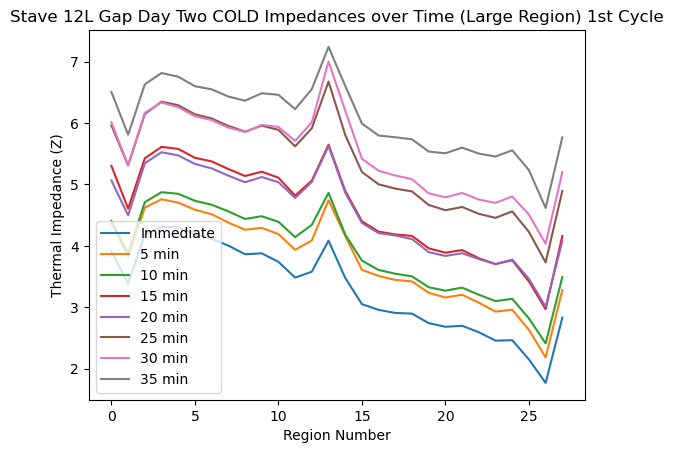

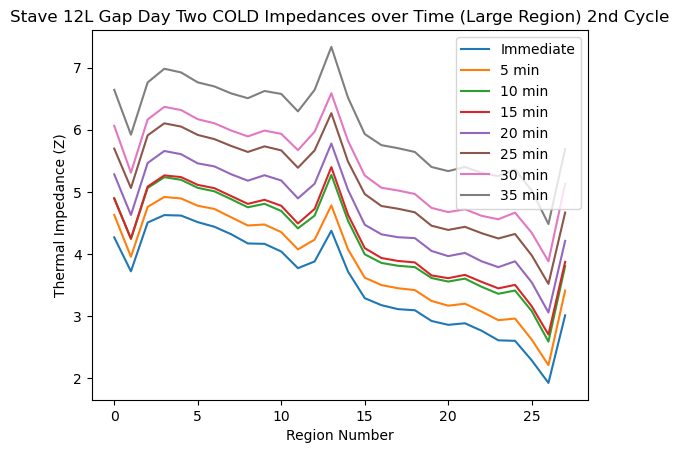

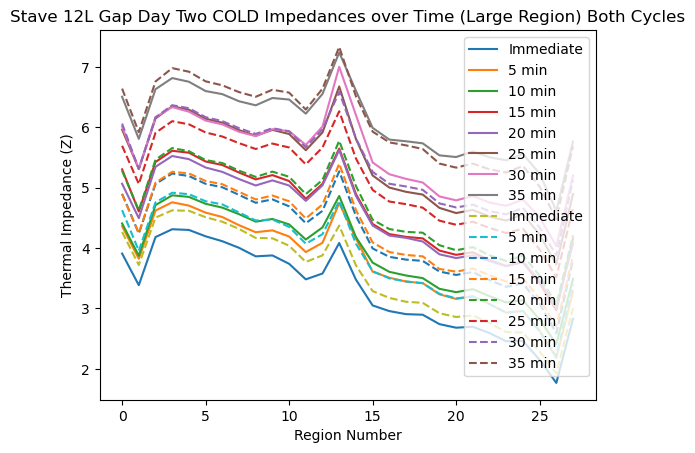

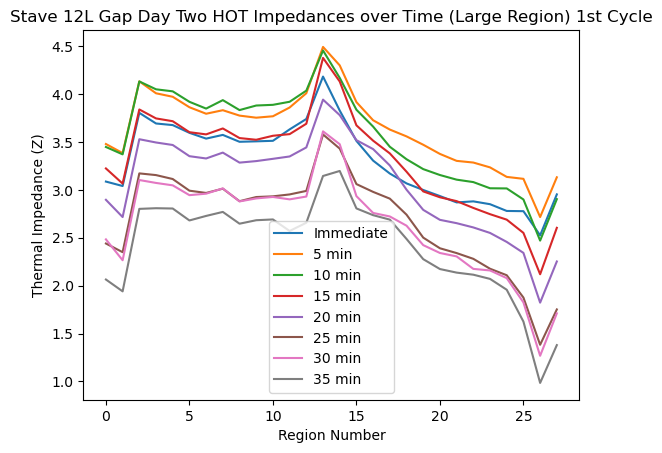

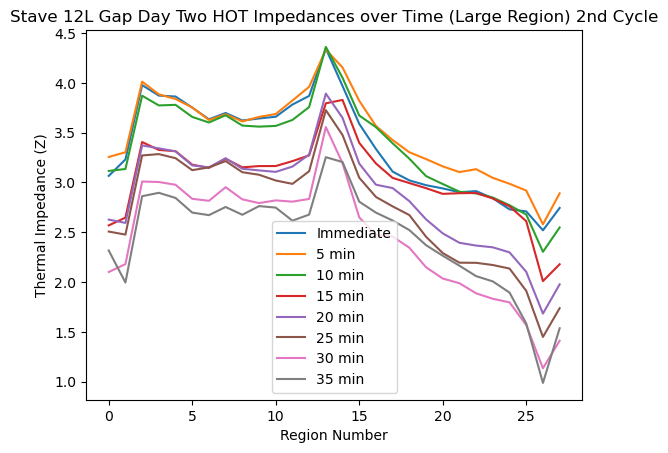

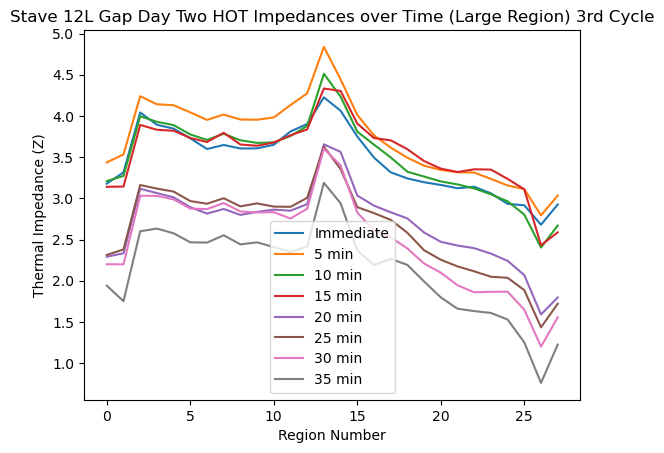

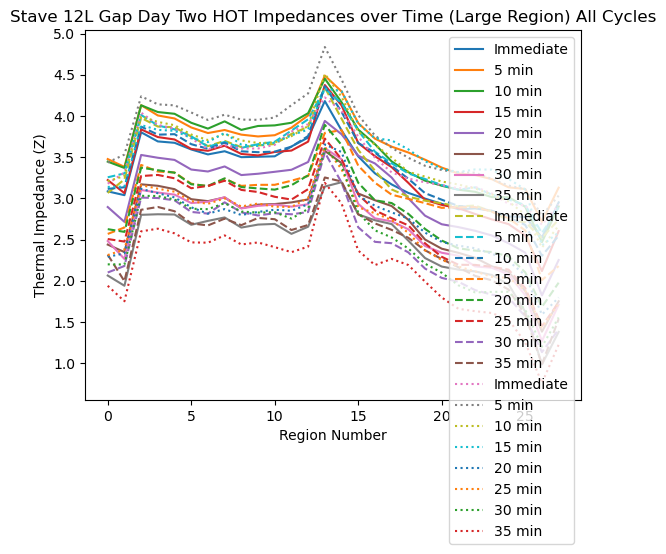

In [70]:
L12gaptwo_hot_1 = [] #large region top
L12gaptwo_cold_1 = [] #large region top
L12gaptwo_hot_2 = [] #large region top
L12gaptwo_cold_2 = [] #large region top
L12gaptwo_hot_3 = [] #large region top


L12gaptwo_hot_goavg_1 = [] #large region top
L12gaptwo_cold_goavg_1 = [] #large region top
L12gaptwo_hot_goavg_2 = [] #large region top
L12gaptwo_cold_goavg_2 = [] #large region top
L12gaptwo_hot_goavg_3 = [] #large region top


##### This run went hot, cold, hot, cold, hot

for filename in sorted(glob("output/Stave12L_insgap/Stave12_InsulationGap-NewCam-secondtry_LS_CERN_L_*_IMPEDANCES.csv")):
    index = int(filename.split("_")[-2])

    if (index >=-1 and index <8):
        L12gaptwo_hot_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
    #(index >=24 and index <32):
        L12gaptwo_hot_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=32 and index <40):
    #if (index >=-1 and index <8) or (index >=16 and index <24):
        L12gaptwo_hot_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=8 and index <16):
        L12gaptwo_cold_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
    #if (index >=-1 and index <8) or (index >=16 and index <24):
        L12gaptwo_cold_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))




    if (index >=-1 and index <8):
        L12gaptwo_hot_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
        L12gaptwo_hot_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=32 and index <40):
    #if (index >=-1 and index <8) or (index >=16 and index <24):
        L12gaptwo_hot_goavg_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=8 and index <16):
        L12gaptwo_cold_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
    #if (index >=-1 and index <8) or (index >=16 and index <24):
        L12gaptwo_cold_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))




L12gaptwo_hot_1 = np.stack(L12gaptwo_hot_1, axis=0)
L12gaptwo_hot_swap_1 = np.swapaxes(L12gaptwo_hot_1, 0, 1)
L12gaptwo_cold_1 = np.stack(L12gaptwo_cold_1, axis=0)
L12gaptwo_cold_swap_1 = np.swapaxes(L12gaptwo_cold_1, 0, 1)
L12gaptwo_hot_2 = np.stack(L12gaptwo_hot_2, axis=0)
L12gaptwo_hot_swap_2 = np.swapaxes(L12gaptwo_hot_2, 0, 1)
L12gaptwo_cold_2 = np.stack(L12gaptwo_cold_2, axis=0)
L12gaptwo_cold_swap_2 = np.swapaxes(L12gaptwo_cold_2, 0, 1)
L12gaptwo_hot_3 = np.stack(L12gaptwo_hot_3, axis=0)
L12gaptwo_hot_swap_3 = np.swapaxes(L12gaptwo_hot_3, 0, 1)
#L12gaptwo_hot_all = np.concatenate((L12gaptwo_hot_1, L12gaptwo_hot_2),axis=0)
#L12gaptwo_hot_all_swap = np.concatenate((L12gaptwo_hot_swap_1, L12gaptwo_hot_swap_2),axis=0)
#L12gaptwo_cold_all = np.concatenate((L12gaptwo_cold_1, L12gaptwo_cold_2),axis=0)
#L12gaptwo_cold_all_swap = np.concatenate((L12gaptwo_cold_swap_1, L12gaptwo_cold_swap_2),axis=0)


L12gaptwo_hot_goavg_1 = np.stack(L12gaptwo_hot_goavg_1, axis=0)
L12gaptwo_hot_goavg_swap_1 = np.swapaxes(L12gaptwo_hot_goavg_1, 0, 1)
L12gaptwo_cold_goavg_1 = np.stack(L12gaptwo_cold_goavg_1, axis=0)
L12gaptwo_cold_goavg_swap_1 = np.swapaxes(L12gaptwo_cold_goavg_1, 0, 1)
L12gaptwo_hot_goavg_2 = np.stack(L12gaptwo_hot_goavg_2, axis=0)
L12gaptwo_hot_goavg_swap_2 = np.swapaxes(L12gaptwo_hot_goavg_2, 0, 1)
L12gaptwo_cold_goavg_2 = np.stack(L12gaptwo_cold_goavg_2, axis=0)
L12gaptwo_cold_goavg_swap_2 = np.swapaxes(L12gaptwo_cold_goavg_2, 0, 1)
L12gaptwo_hot_goavg_3 = np.stack(L12gaptwo_hot_goavg_3, axis=0)
L12gaptwo_hot_goavg_swap_3 = np.swapaxes(L12gaptwo_hot_goavg_3, 0, 1)


#arr_L9_hot_goavg_swap_1 = np.array(L9_hot_goavg_swap_1)
#arr_L9_hot_goavg_swap_2 = np.array(L9_hot_goavg_swap_2)
#arr_L9_cold_goavg_swap_1 = np.array(L9_cold_goavg_swap_1)
#arr_L9_cold_goavg_swap_2 = np.array(L9_cold_goavg_swap_2)

#L9_hot_avg = (arr_L9_hot_goavg_swap_1+arr_L9_hot_goavg_swap_2)/2
#print(L9_hot_avg)


#L9_cold_avg = (arr_L9_cold_goavg_swap_1+arr_L9_cold_goavg_swap_2)/2


arr_L12gaptwo_hot_goavg_1 = np.array(L12gaptwo_hot_goavg_1)
arr_L12gaptwo_hot_goavg_2 = np.array(L12gaptwo_hot_goavg_2)
arr_L12gaptwo_cold_goavg_1 = np.array(L12gaptwo_cold_goavg_1)
arr_L12gaptwo_cold_goavg_2 = np.array(L12gaptwo_cold_goavg_2)
arr_L12gaptwo_hot_goavg_3 = np.array(L12gaptwo_hot_goavg_3)


L12gaptwo_hot_avg = (arr_L12gaptwo_hot_goavg_1+arr_L12gaptwo_hot_goavg_2+arr_L12gaptwo_hot_goavg_3)/3

L12gaptwo_cold_avg = (arr_L12gaptwo_cold_goavg_1+arr_L12gaptwo_cold_goavg_2)/2

plt.plot(L12gaptwo_cold_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day Two COLD Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(L12gaptwo_cold_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day Two COLD Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(L12gaptwo_cold_swap_1[:,:,0])
plt.plot(L12gaptwo_cold_swap_2[:,:,0], linestyle='dashed')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day Two COLD Impedances over Time (Large Region) Both Cycles")
plt.figure()

plt.plot(L12gaptwo_hot_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day Two HOT Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(L12gaptwo_hot_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day Two HOT Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(L12gaptwo_hot_swap_3[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day Two HOT Impedances over Time (Large Region) 3rd Cycle")
plt.figure()

plt.plot(L12gaptwo_hot_swap_1[:,:,0])
plt.plot(L12gaptwo_hot_swap_2[:,:,0], linestyle='dashed')
plt.plot(L12gaptwo_hot_swap_3[:,:,0], linestyle='dotted')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min','Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 12L Gap Day Two HOT Impedances over Time (Large Region) All Cycles")

Text(0.5, 1.0, 'Stave 12L Gap Day One COLD Inlet/Outlet Temp Difference over Time Both Cycles')

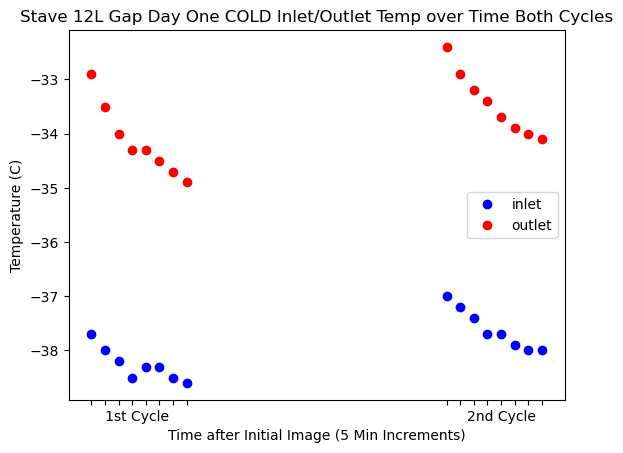

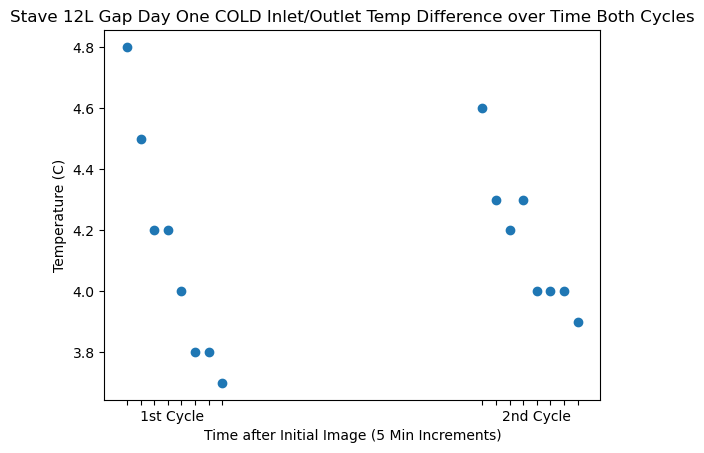

In [71]:
plt.plot(
    
    L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3],'bo',

    L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4], 'ro',
)

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ']
plt.xticks(L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.legend(['inlet', 'outlet'])
plt.title("Stave 12L Gap Day One COLD Inlet/Outlet Temp over Time Both Cycles")
plt.figure()

plt.plot(L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4]-L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3],'o')
xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ']
plt.xticks(L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12L Gap Day One COLD Inlet/Outlet Temp Difference over Time Both Cycles")


Text(0.5, 1.0, 'Stave 12L Gap Day Two HOT Inlet/Outlet Temp Difference over Time All Cycles')

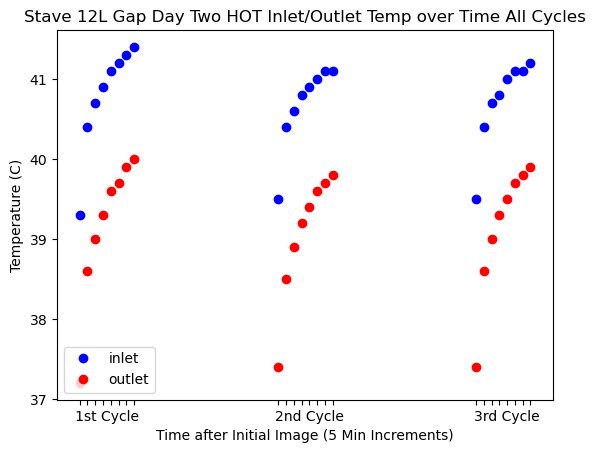

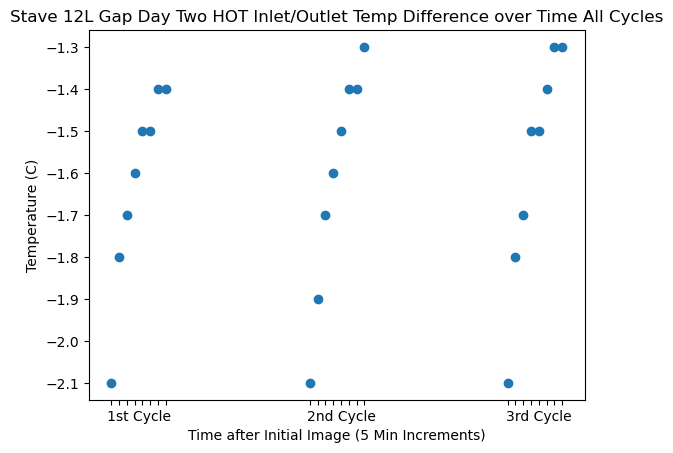

In [72]:
plt.plot(
    
    L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3],'bo',

    L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4], 'ro',
)

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','  ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ',' ',' ',' ', ' ', '3rd Cycle',' ',' ', ' ']
plt.xticks(L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.legend(['inlet', 'outlet'])
plt.title("Stave 12L Gap Day Two HOT Inlet/Outlet Temp over Time All Cycles")
plt.figure()

plt.plot(L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3],'o')
xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','  ','',' ', '', '2nd Cycle',' ',' ', ' ',' ',' ','', '', '3rd Cycle',' ',' ', ' ']
plt.xticks(L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12L Gap Day Two HOT Inlet/Outlet Temp Difference over Time All Cycles")

Text(0.5, 1.0, 'Stave 12L Gap Day One HOT Inlet/Outlet Temp Difference over Time Both Cycles')

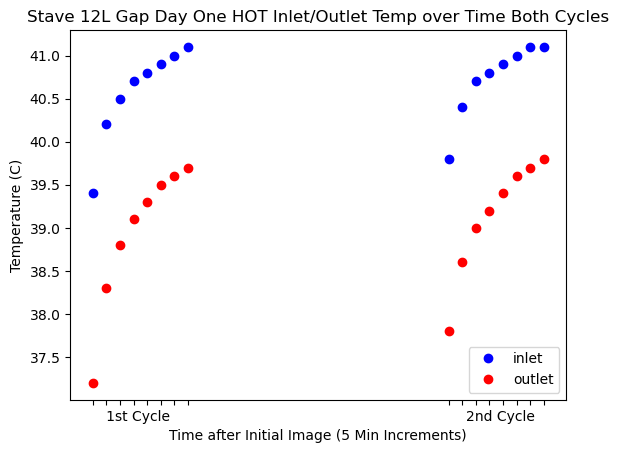

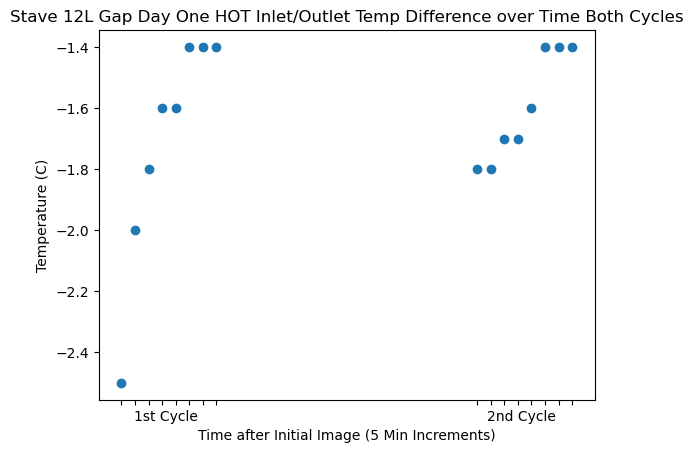

In [73]:
plt.plot(
    
    L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'bo',

    L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4], 'ro',
)
plt.legend(['inlet', 'outlet'])

xticks = ['    ', ' ', ' ', '   1st Cycle ', ' ','  ',' ',' ','   ',' ',' ',' ', '2nd Cycle ', '',' ',' ']
plt.xticks(L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")

plt.title("Stave 12L Gap Day One HOT Inlet/Outlet Temp over Time Both Cycles")
plt.figure()



plt.plot(L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-L9temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12L Gap Day One HOT Inlet/Outlet Temp Difference over Time Both Cycles")

Text(0.5, 1.0, 'Stave 12L Gap Day One HOT Inlet/Outlet Temp Difference over Time Both Cycles')

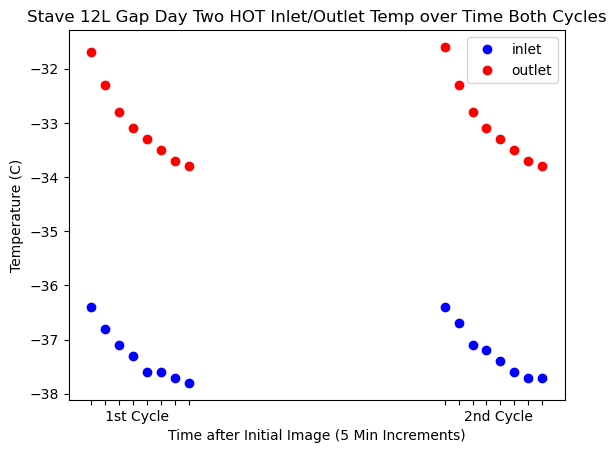

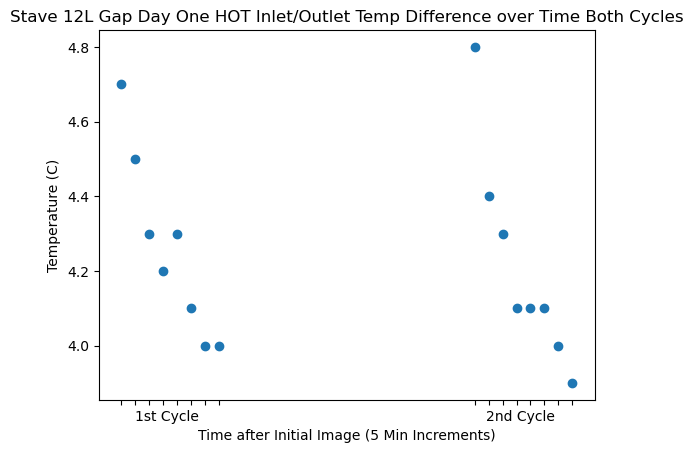

In [74]:
plt.plot(
    
    L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'bo',

    L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4], 'ro',
)
plt.legend(['inlet', 'outlet'])

xticks = ['    ', ' ', ' ', '   1st Cycle ', ' ','  ',' ',' ','   ',' ',' ',' ', '2nd Cycle ', '',' ',' ']
plt.xticks(L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")

plt.title("Stave 12L Gap Day Two HOT Inlet/Outlet Temp over Time Both Cycles")
plt.figure()


plt.plot(L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3],'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 12L Gap Day One HOT Inlet/Outlet Temp Difference over Time Both Cycles")

Text(0.5, 1.0, 'Stave 12L Gap Day One HOT Temp Dependent Power Loading over Time Both Cycles')

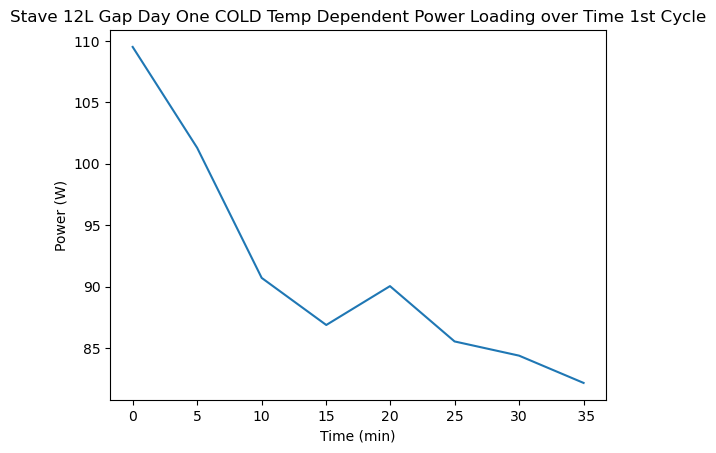

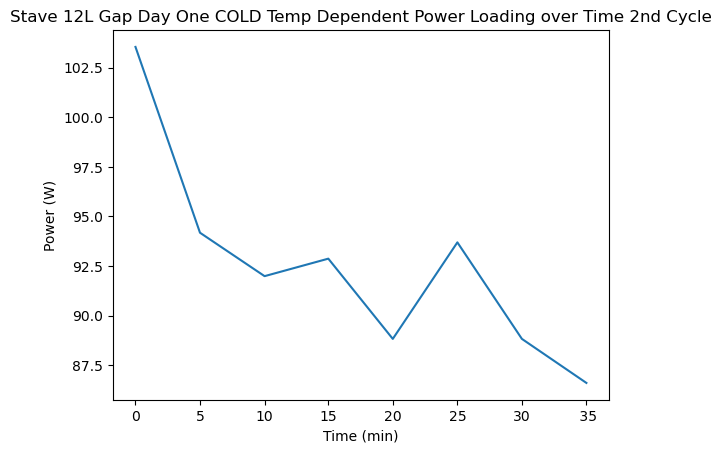

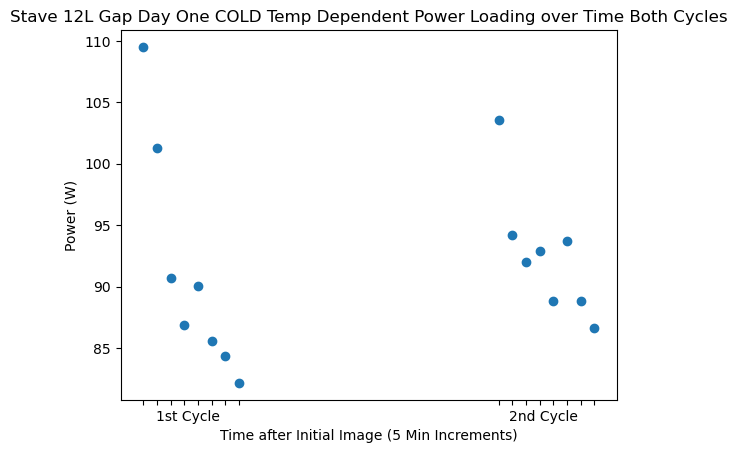

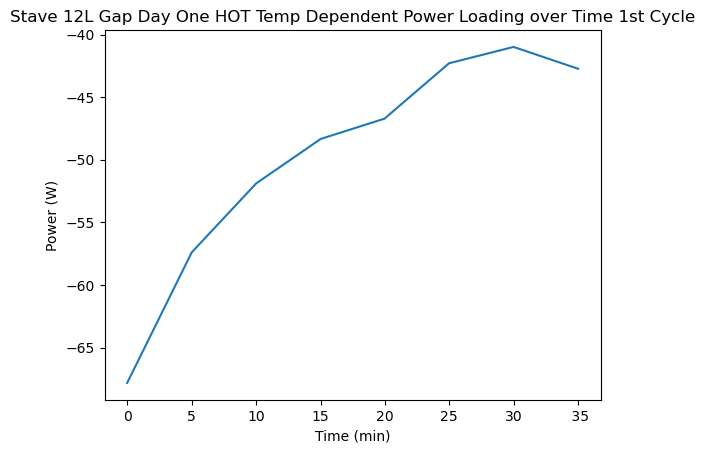

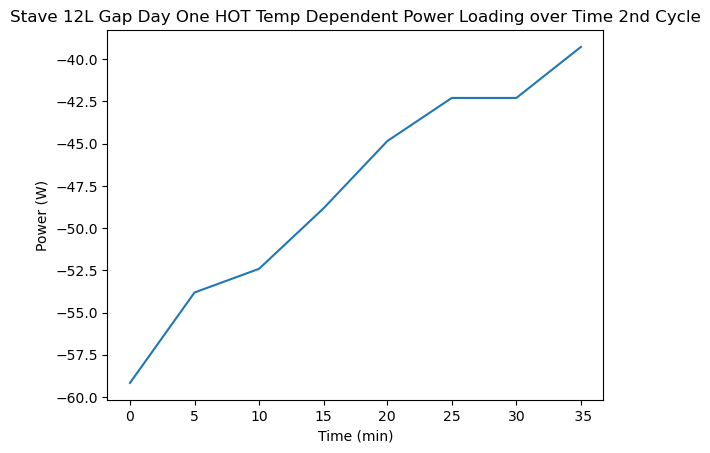

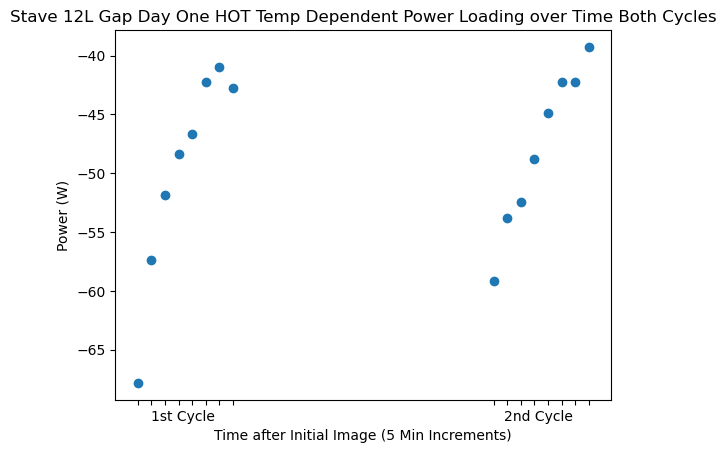

In [75]:
L12gaponepower_cold_all = ((1614/60)*1063*L12gaponeflow[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],1]*(L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4]-L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3]))/1000
L12gaponepower_cold1 = ((1614/60)*1063*L12gaponeflow[[0,1,2,3,4,5,6,7],1]*(L12gaponetemps[[0,1,2,3,4,5,6,7],4]-L12gaponetemps[[0,1,2,3,4,5,6,7],3]))/1000
L12gaponepower_cold2 = ((1614/60)*1063*L12gaponeflow[[16,17,18,19,20,21,22,23],1]*(L12gaponetemps[[16,17,18,19,20,21,22,23],4]-L12gaponetemps[[16,17,18,19,20,21,22,23],3]))/1000


L12gaponepower_hot_all = ((1448/60)*1213*L12gaponeflow[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],1]*(L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3]))/1000
L12gaponepower_hot1 = ((1448/60)*1213*L12gaponeflow[[8,9,10,11,12,13,14,15],1]*(L12gaponetemps[[8,9,10,11,12,13,14,15],4]-L12gaponetemps[[8,9,10,11,12,13,14,15],3]))/1000
L12gaponepower_hot2 = ((1448/60)*1213*L12gaponeflow[[24,25,26,27,28,29,30,31],1]*(L12gaponetemps[[24,25,26,27,28,29,30,31],4]-L12gaponetemps[[24,25,26,27,28,29,30,31],3]))/1000



plt.plot(L12gaponetemps[[0,1,2,3,4,5,6,7],0], L12gaponepower_cold1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L12gaponetemps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day One COLD Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(L12gaponetemps[[16,17,18,19,20,21,22,23],0], L12gaponepower_cold2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L12gaponetemps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day One COLD Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], L12gaponepower_cold_all, 'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(L12gaponetemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day One COLD Temp Dependent Power Loading over Time Both Cycles")
plt.figure()

plt.plot(L12gaponetemps[[8,9,10,11,12,13,14,15],0], L12gaponepower_hot1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L12gaponetemps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day One HOT Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(L12gaponetemps[[24,25,26,27,28,29,30,31],0], L12gaponepower_hot2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L12gaponetemps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day One HOT Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], L12gaponepower_hot_all, 'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(L12gaponetemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day One HOT Temp Dependent Power Loading over Time Both Cycles")

Text(0.5, 1.0, 'Stave 12L Gap Day Two HOT Temp Dependent Power Loading over Time Both Cycles')

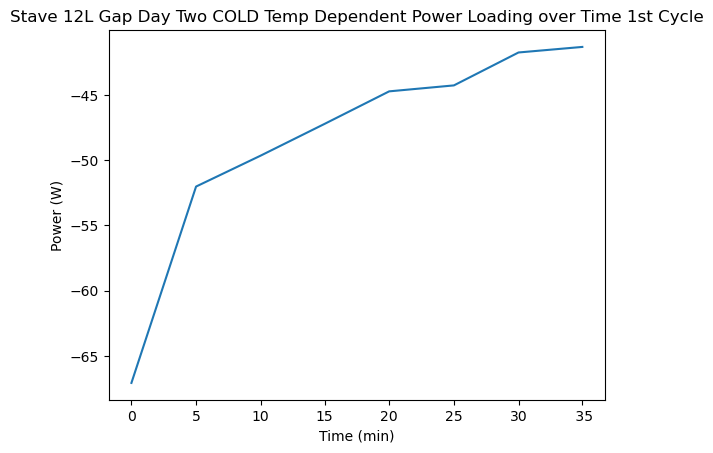

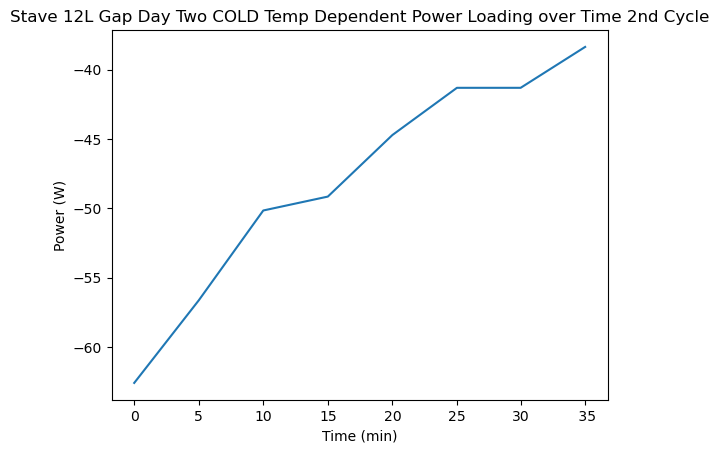

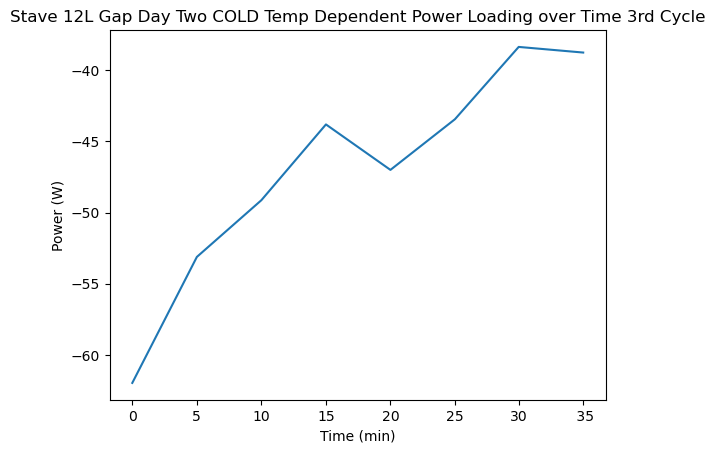

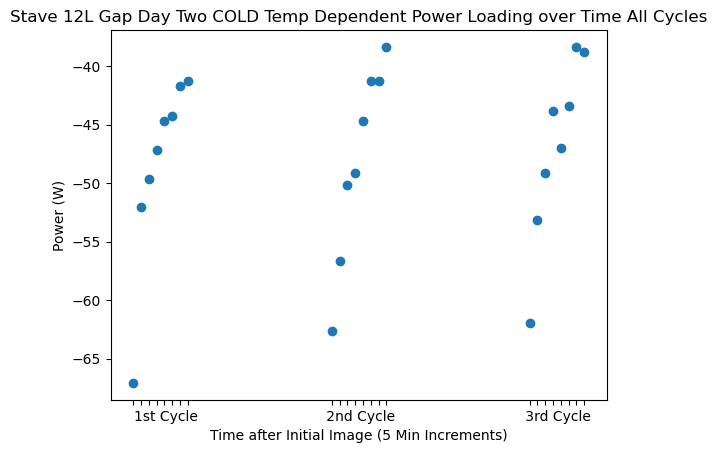

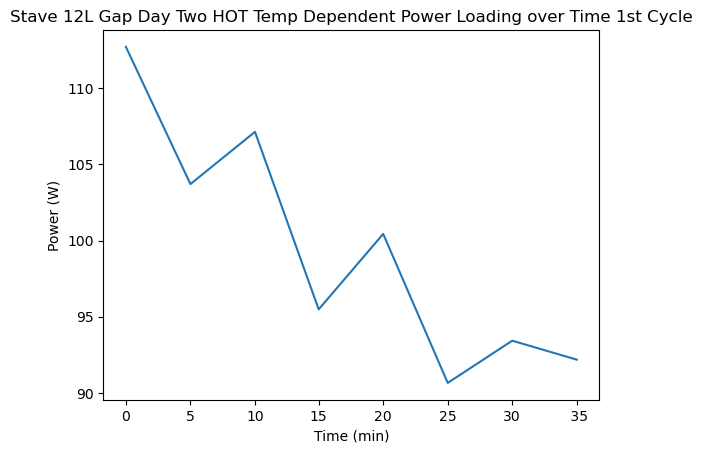

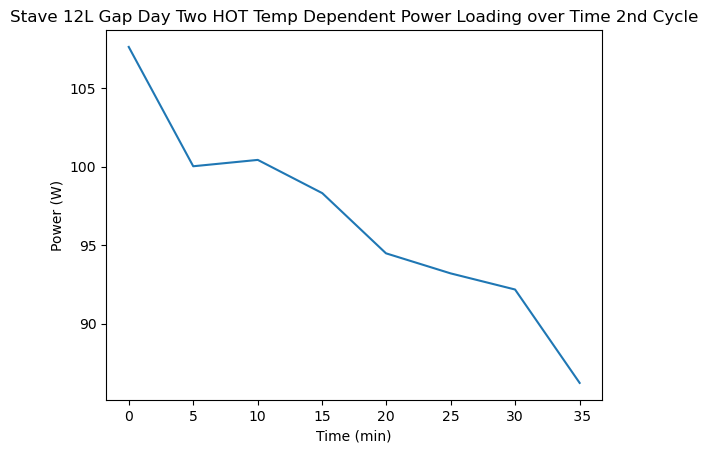

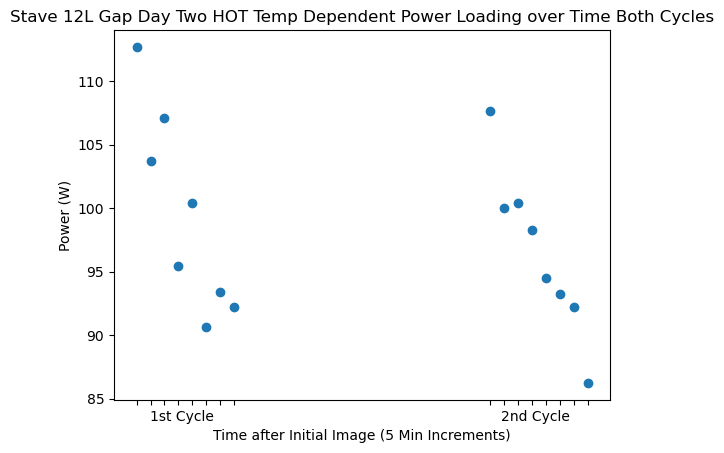

In [76]:
L12gaptwopower_cold_all = ((1614/60)*1063*L12gaptwoflow[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],1]*(L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3]))/1000
L12gaptwopower_cold1 = ((1614/60)*1063*L12gaptwoflow[[0,1,2,3,4,5,6,7],1]*(L12gaptwotemps[[0,1,2,3,4,5,6,7],4]-L12gaptwotemps[[0,1,2,3,4,5,6,7],3]))/1000
L12gaptwopower_cold2 = ((1614/60)*1063*L12gaptwoflow[[16,17,18,19,20,21,22,23],1]*(L12gaptwotemps[[16,17,18,19,20,21,22,23],4]-L12gaptwotemps[[16,17,18,19,20,21,22,23],3]))/1000
L12gaptwopower_cold3 = ((1614/60)*1063*L12gaptwoflow[[32,33,34,35,36,37,38,39],1]*(L12gaptwotemps[[32,33,34,35,36,37,38,39],4]-L12gaptwotemps[[32,33,34,35,36,37,38,39],3]))/1000


L12gaptwopower_hot_all = ((1448/60)*1213*L12gaptwoflow[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],1]*(L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3]))/1000
L12gaptwopower_hot1 = ((1448/60)*1213*L12gaptwoflow[[8,9,10,11,12,13,14,15],1]*(L12gaptwotemps[[8,9,10,11,12,13,14,15],4]-L12gaptwotemps[[8,9,10,11,12,13,14,15],3]))/1000
L12gaptwopower_hot2 = ((1448/60)*1213*L12gaptwoflow[[24,25,26,27,28,29,30,31],1]*(L12gaptwotemps[[24,25,26,27,28,29,30,31],4]-L12gaptwotemps[[24,25,26,27,28,29,30,31],3]))/1000



plt.plot(L12gaptwotemps[[0,1,2,3,4,5,6,7],0], L12gaptwopower_cold1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L12gaptwotemps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day Two COLD Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(L12gaptwotemps[[16,17,18,19,20,21,22,23],0], L12gaptwopower_cold2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L12gaptwotemps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day Two COLD Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(L12gaptwotemps[[32,33,34,35,36,37,38,39],0], L12gaptwopower_cold3)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L12gaptwotemps[[32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day Two COLD Temp Dependent Power Loading over Time 3rd Cycle")
plt.figure()

plt.plot(L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], L12gaptwopower_cold_all, 'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '      2nd Cycle','','','', '',' ','','', '      3rd Cycle','','','', '',' ']
plt.xticks(L12gaptwotemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day Two COLD Temp Dependent Power Loading over Time All Cycles")
plt.figure()

plt.plot(L12gaptwotemps[[8,9,10,11,12,13,14,15],0], L12gaptwopower_hot1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L12gaptwotemps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day Two HOT Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(L12gaptwotemps[[24,25,26,27,28,29,30,31],0], L12gaptwopower_hot2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L12gaptwotemps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day Two HOT Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0], L12gaptwopower_hot_all, 'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(L12gaptwotemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 12L Gap Day Two HOT Temp Dependent Power Loading over Time Both Cycles")

Text(0.5, 1.0, 'Stave 12L Gap Day One Power Load vs Impedance 2nd Cycle')

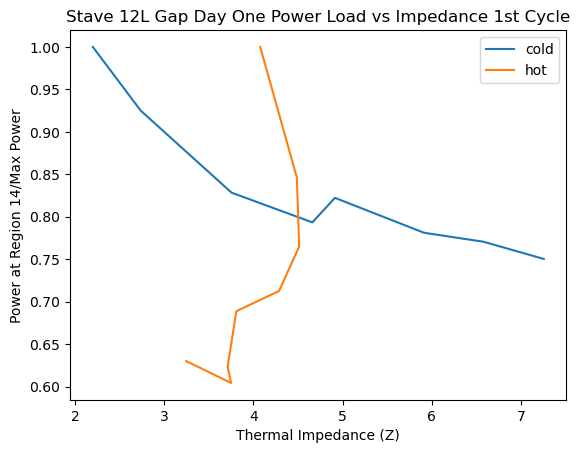

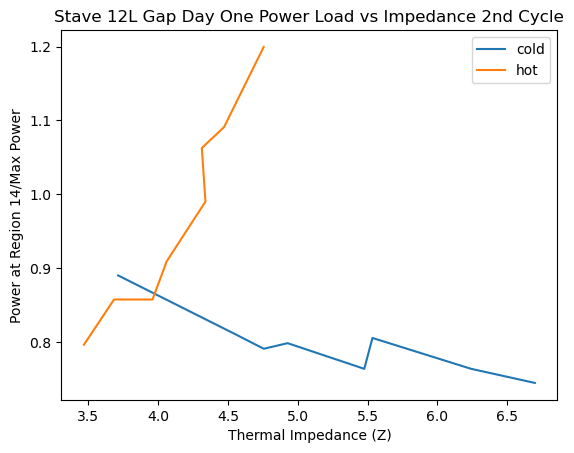

In [77]:
plt.plot(L12gapone_cold_swap_1[14,:,0], L12gaponepower_cold1/L12gaponepower_cold1.max())
plt.plot(L12gapone_hot_swap_1[14,:,0], abs(L12gaponepower_hot1/L12gaponepower_hot1.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12L Gap Day One Power Load vs Impedance 1st Cycle")
plt.figure()

plt.plot(L12gapone_cold_swap_2[14,:,0], L12gaponepower_cold2/L9power_cold2.max())
plt.plot(L12gapone_hot_swap_2[14,:,0], abs(L12gaponepower_hot2/L9power_hot2.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12L Gap Day One Power Load vs Impedance 2nd Cycle")

NameError: name 'L12gaptwo_cold_swap_3' is not defined

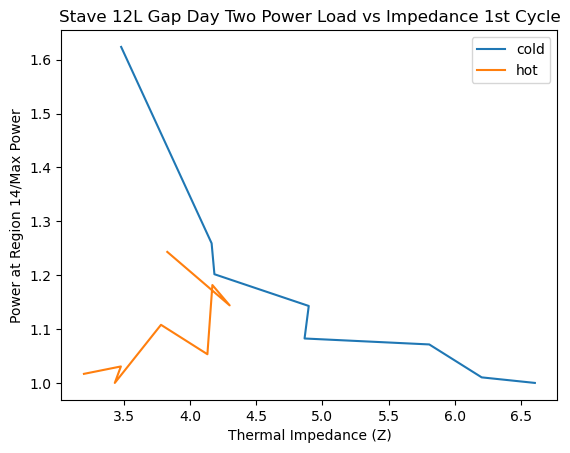

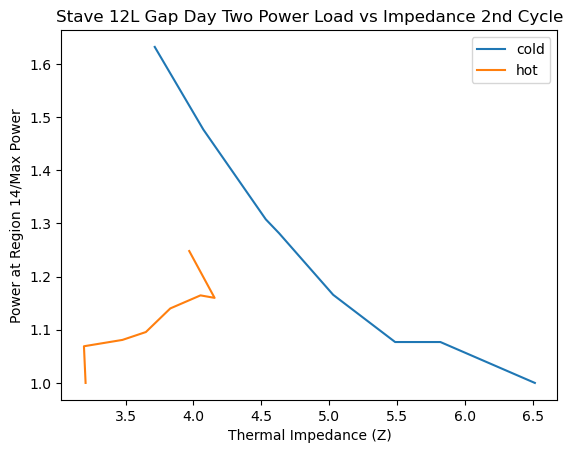

<Figure size 640x480 with 0 Axes>

In [78]:
plt.plot(L12gaptwo_cold_swap_1[14,:,0], L12gaptwopower_cold1/L12gaptwopower_cold1.max())
plt.plot(L12gaptwo_hot_swap_1[14,:,0], abs(L12gaptwopower_hot1/L12gaptwopower_hot1.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12L Gap Day Two Power Load vs Impedance 1st Cycle")
plt.figure()

plt.plot(L12gaptwo_cold_swap_2[14,:,0], L12gaptwopower_cold2/L12gaptwopower_cold2.max())
plt.plot(L12gaptwo_hot_swap_2[14,:,0], abs(L12gaptwopower_hot2/L12gaptwopower_hot2.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12L Gap Day Two Power Load vs Impedance 2nd Cycle")
plt.figure()

plt.plot(L12gaptwo_cold_swap_3[14,:,0], L12gaptwopower_cold3/L12gaptwopower_cold3.max())
plt.legend(['cold'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 12L Gap Day Two Power Load vs Impedance 3rd Cycle")

In [ ]:
plt.plot(L12gaponetemps[[0,1,2,3,4,5,6,7],0]-L12gaponetemps[[0,1,2,3,4,5,6,7],0].min(), L12gapone_cold_swap_1[14,:,0])
plt.plot(L12gaponetemps[[8,9,10,11,12,13,14,15],0]-L12gaponetemps[[8,9,10,11,12,13,14,15],0].min(), L12gapone_hot_swap_1[14,:,0])
plt.title("Stave 12L Gap Day One Impedance vs Time 1st Cycle")
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.figure()

plt.plot(L12gaponetemps[[16,17,18,19,20,21,22,23],0]-L12gaponetemps[[16,17,18,19,20,21,22,23],0].min(), L12gapone_cold_swap_2[14,:,0])
plt.plot(L12gaponetemps[[24,25,26,27,28,29,30,31],0]-L12gaponetemps[[24,25,26,27,28,29,30,31],0].min(), L12gapone_hot_swap_2[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.title("Stave 12L Gap Day One Impedance vs Time 2nd Cycle")
plt.figure()

NameError: name 'L12gaptwo_cold_swap_3' is not defined

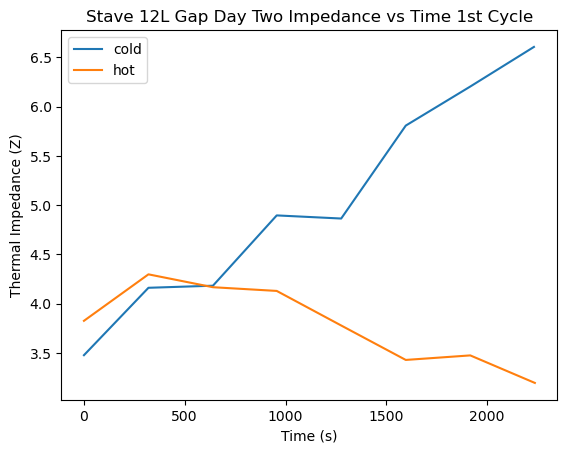

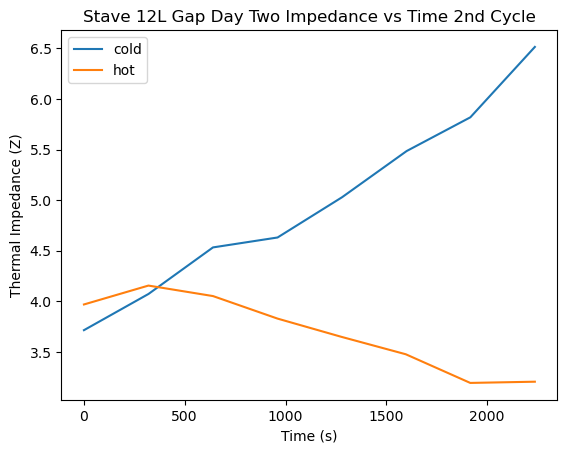

<Figure size 640x480 with 0 Axes>

In [79]:
plt.plot(L12gaptwotemps[[0,1,2,3,4,5,6,7],0]-L12gaptwotemps[[0,1,2,3,4,5,6,7],0].min(), L12gaptwo_cold_swap_1[14,:,0])
plt.plot(L12gaptwotemps[[8,9,10,11,12,13,14,15],0]-L12gaptwotemps[[8,9,10,11,12,13,14,15],0].min(), L12gaptwo_hot_swap_1[14,:,0])
plt.title("Stave 12L Gap Day Two Impedance vs Time 1st Cycle")
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.figure()

plt.plot(L12gaptwotemps[[16,17,18,19,20,21,22,23],0]-L12gaptwotemps[[16,17,18,19,20,21,22,23],0].min(), L12gaptwo_cold_swap_2[14,:,0])
plt.plot(L12gaptwotemps[[24,25,26,27,28,29,30,31],0]-L12gaptwotemps[[24,25,26,27,28,29,30,31],0].min(), L12gaptwo_hot_swap_2[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.title("Stave 12L Gap Day Two Impedance vs Time 2nd Cycle")
plt.figure()

plt.plot(L12gaptwotemps[[32,33,34,35,36,37,38,39],0]-L12gaptwotemps[[32,33,34,35,36,37,38,3],0].min(), L12gaptwo_cold_swap_3[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold'])
plt.title("Stave 12L Gap Day Two Impedance vs Time 3rd Cycle")

# Stave 13

## Gap Insulation

### L Side

In [80]:
L13temps = []
L13flow = []
for filename in sorted(glob("../Stave13_InsulationGap-NewCam-taketwo_LS_CERN_L_*.npz")):
    f = np.load(filename)
    L13flowtime = f["flow_times"][-1]
    L13flowdata = np.median(f["flow_data"][-5:])
    L13flow.append([L13flowtime, L13flowdata])
    L13thermtime = f["thermo_times"][-1]
    L13thermdata = list(f["thermo_data"][-1])
    L13temps.append([L13thermtime]+L13thermdata)

L13temps = np.array(L13temps)
L13flow = np.array(L13flow)

<Figure size 640x480 with 0 Axes>

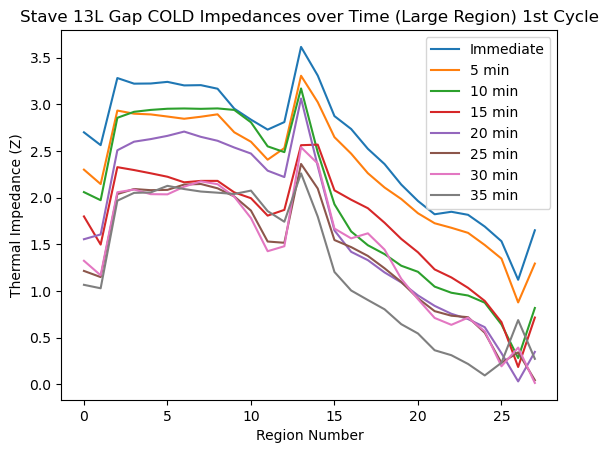

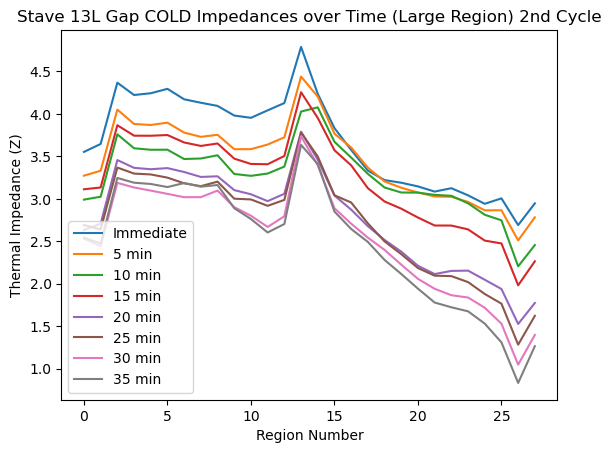

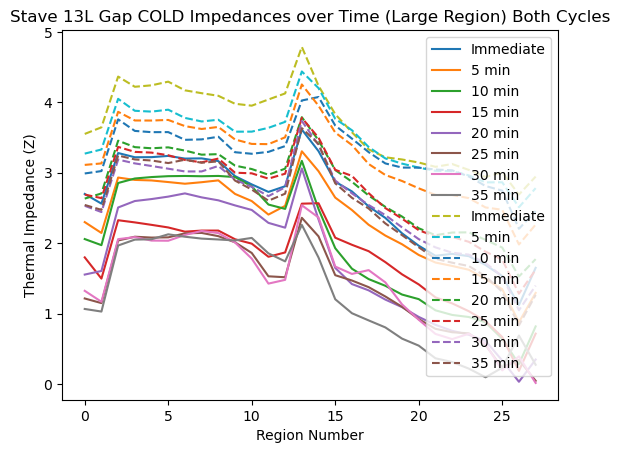

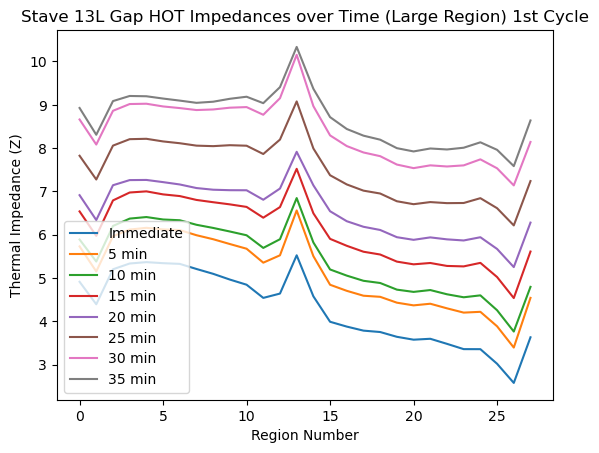

<Figure size 640x480 with 0 Axes>

In [81]:
L13_hot_1 = [] #large region top
L13_cold_1 = [] #large region top
L13_cold_2 = [] #large region top

L13_hot_goavg_1 = [] #large region top
L13_cold_goavg_1 = [] #large region top
L13_cold_goavg_2 = [] #large region top


for filename in sorted(glob("output/Stave13L_insgap/Stave13_InsulationGap-NewCam-taketwo_LS_CERN_L_*_IMPEDANCES.csv")):
    index = int(filename.split("_")[-2])

    if (index >=8 and index <16):
        L13_hot_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))


    if (index >=-1 and index <8):
        L13_cold_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
        L13_cold_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))



    if (index >=8 and index <16):
        L13_hot_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=-1 and index <8):
        L13_cold_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
        L13_cold_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))


L13_hot_1 = np.stack(L13_hot_1, axis=0)
L13_hot_swap_1 = np.swapaxes(L13_hot_1, 0, 1)
L13_cold_1 = np.stack(L13_cold_1, axis=0)
L13_cold_swap_1 = np.swapaxes(L13_cold_1, 0, 1)
L13_cold_2 = np.stack(L13_cold_2, axis=0)
L13_cold_swap_2 = np.swapaxes(L13_cold_2, 0, 1)
L13_cold_all = np.concatenate((L13_cold_1, L13_cold_2),axis=0)
L13_cold_all_swap = np.concatenate((L13_cold_swap_1, L13_cold_swap_2),axis=0)


L13_hot_goavg_1 = np.stack(L13_hot_goavg_1, axis=0)
L13_hot_goavg_swap_1 = np.swapaxes(L13_hot_goavg_1, 0, 1)
L13_cold_goavg_1 = np.stack(L13_cold_goavg_1, axis=0)
L13_cold_goavg_swap_1 = np.swapaxes(L13_cold_goavg_1, 0, 1)
L13_cold_goavg_2 = np.stack(L13_cold_goavg_2, axis=0)
L13_cold_goavg_swap_2 = np.swapaxes(L13_cold_goavg_2, 0, 1)


arr_L13_hot_goavg_1 = np.array(L13_hot_goavg_1)
arr_L13_cold_goavg_1 = np.array(L13_cold_goavg_1)
arr_L13_cold_goavg_2 = np.array(L13_cold_goavg_2)

L13_hot_avg = (arr_L13_hot_goavg_1)/1

L13_cold_avg = (arr_L13_cold_goavg_1+arr_L13_cold_goavg_2)/2

plt.plot(L13_cold_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Gap COLD Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(L13_cold_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Gap COLD Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(L13_cold_swap_1[:,:,0])
plt.plot(L13_cold_swap_2[:,:,0], linestyle='dashed')
#plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Gap COLD Impedances over Time (Large Region) Both Cycles")
plt.figure()

plt.plot(L13_hot_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Gap HOT Impedances over Time (Large Region) 1st Cycle")
plt.figure()


Text(0.5, 1.0, 'Stave 13L Gap COLD Inlet/Outlet Temp Difference over Time Both Cycles')

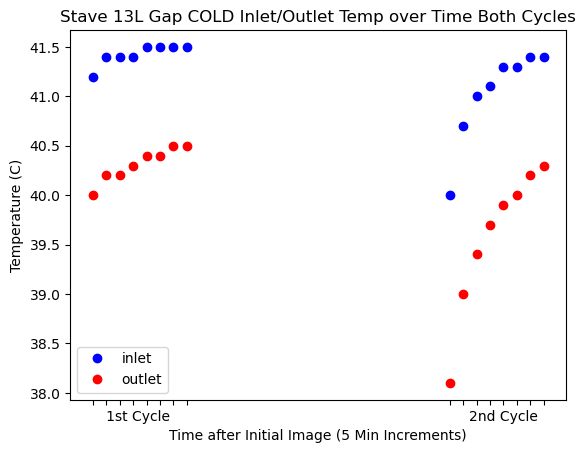

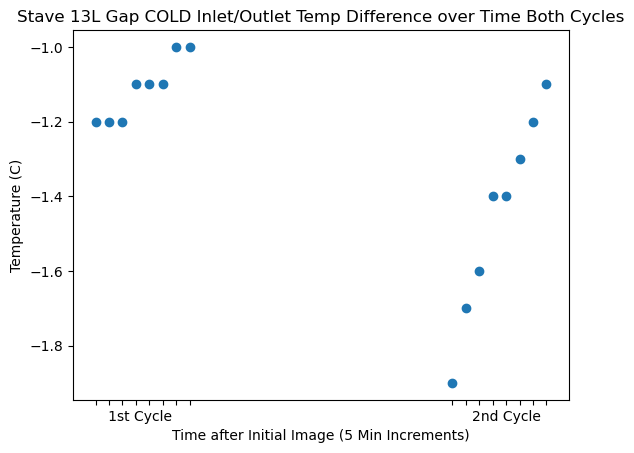

In [82]:

plt.plot(
    L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3],'bo',
    L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4], 'ro',
)

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ']
plt.xticks(L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.legend(['inlet', 'outlet'])
plt.title("Stave 13L Gap COLD Inlet/Outlet Temp over Time Both Cycles")
plt.figure()

plt.plot(L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4]-L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3],'o')
xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ']
plt.xticks(L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 13L Gap COLD Inlet/Outlet Temp Difference over Time Both Cycles")


Text(0.5, 1.0, 'Stave 13L Gap HOT Inlet/Outlet Temp Difference over Time 1st Cycle')

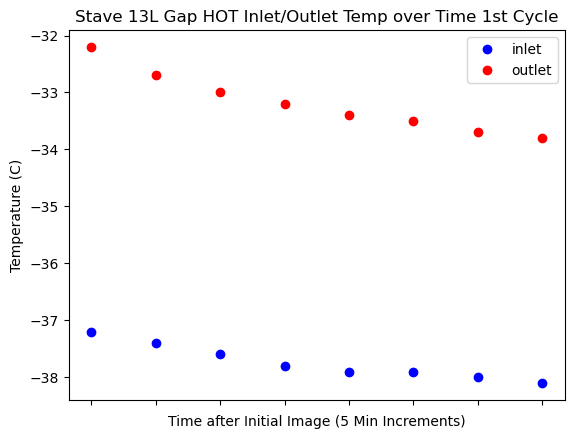

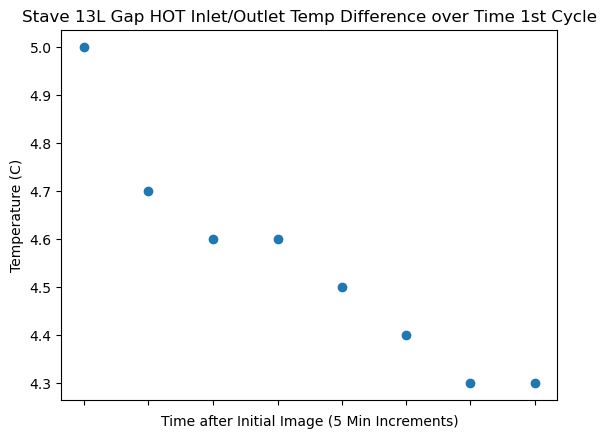

In [83]:

plt.plot(
    L13temps[[8,9,10,11,12,13,14,15],0], L13temps[[8,9,10,11,12,13,14,15],3],'bo',
    L13temps[[8,9,10,11,12,13,14,15],0], L13temps[[8,9,10,11,12,13,14,15],4], 'ro',
)

plt.legend(['inlet', 'outlet'])

xticks = ['','','','','','','','']
plt.xticks(L13temps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")

plt.title("Stave 13L Gap HOT Inlet/Outlet Temp over Time 1st Cycle")
plt.figure()


plt.plot(L13temps[[8,9,10,11,12,13,14,15],0],L13temps[[8,9,10,11,12,13,14,15],4]-L13temps[[8,9,10,11,12,13,14,15],3],'o')
xticks = ['','','','','','','','']
plt.xticks(L13temps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 13L Gap HOT Inlet/Outlet Temp Difference over Time 1st Cycle")

<Figure size 640x480 with 0 Axes>

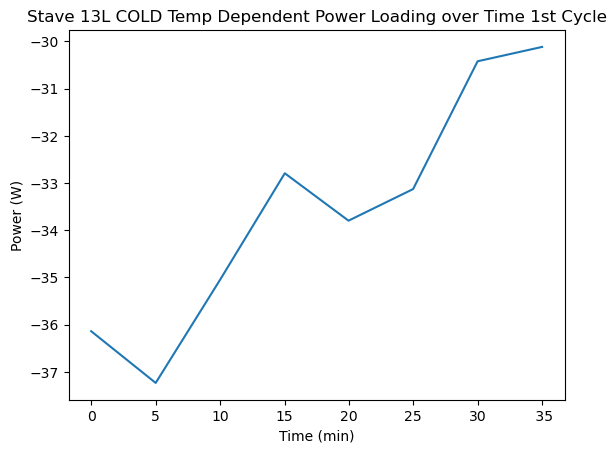

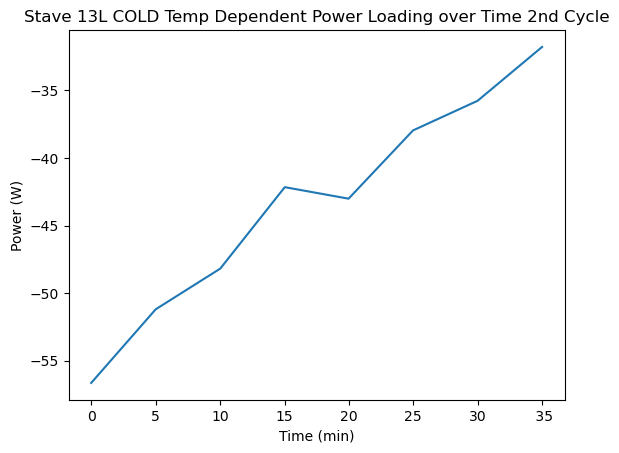

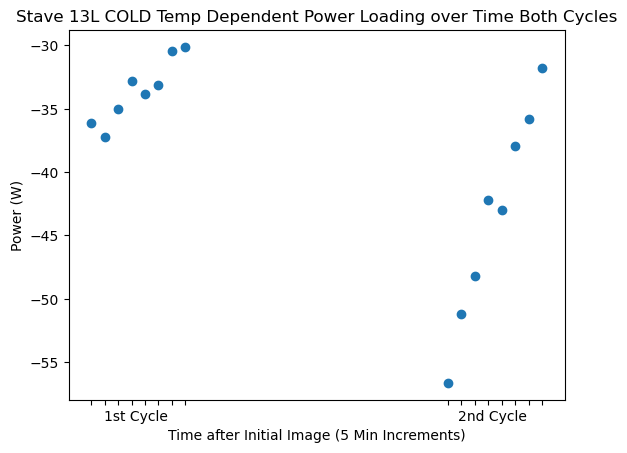

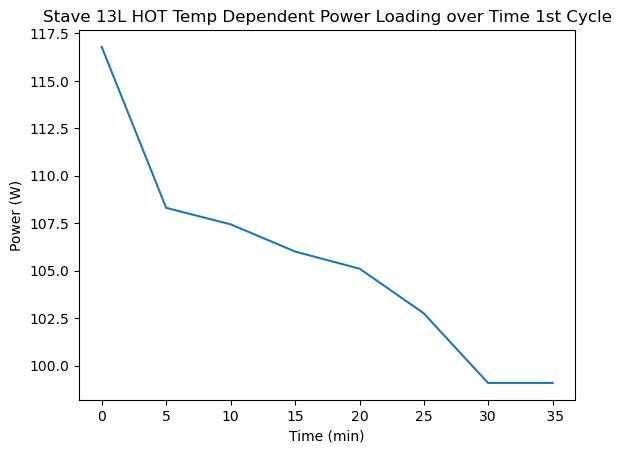

<Figure size 640x480 with 0 Axes>

In [84]:
L13power_cold_all = ((1614/60)*1063*L13flow[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],1]*(L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],4]-L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],3]))/1000
L13power_cold1 = ((1614/60)*1063*L13flow[[0,1,2,3,4,5,6,7],1]*(L13temps[[0,1,2,3,4,5,6,7],4]-L13temps[[0,1,2,3,4,5,6,7],3]))/1000
L13power_cold2 = ((1614/60)*1063*L13flow[[16,17,18,19,20,21,22,23],1]*(L13temps[[16,17,18,19,20,21,22,23],4]-L13temps[[16,17,18,19,20,21,22,23],3]))/1000


#L13power_hot_all = ((1448/60)*1213*L13flow[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],1]*(L13temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],4]-L13temps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31],3]))/1000
L13power_hot1 = ((1448/60)*1213*L13flow[[8,9,10,11,12,13,14,15],1]*(L13temps[[8,9,10,11,12,13,14,15],4]-L13temps[[8,9,10,11,12,13,14,15],3]))/1000



plt.plot(L13temps[[0,1,2,3,4,5,6,7],0], L13power_cold1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L13temps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L COLD Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(L13temps[[16,17,18,19,20,21,22,23],0], L13power_cold2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L13temps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L COLD Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0], L13power_cold_all, 'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ']
plt.xticks(L13temps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 13L COLD Temp Dependent Power Loading over Time Both Cycles")
plt.figure()

plt.plot(L13temps[[8,9,10,11,12,13,14,15],0], L13power_hot1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L13temps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L HOT Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()


Text(0.5, 1.0, 'Stave 13L Gap Impedance vs Time 2nd Cycle')

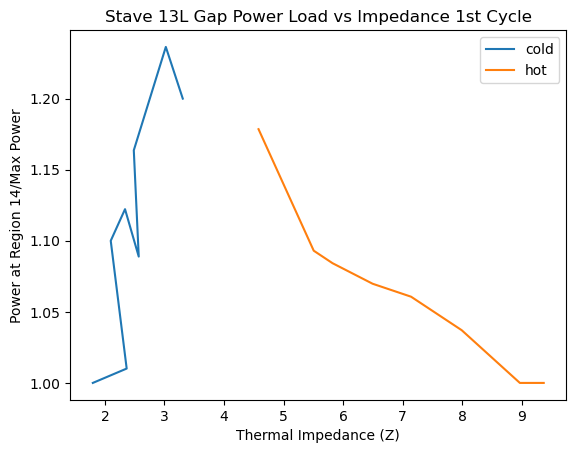

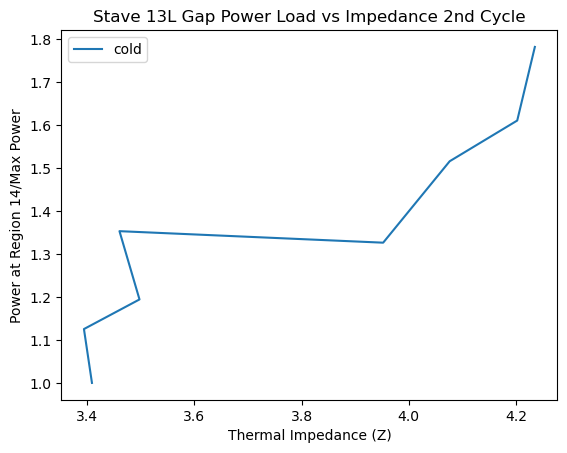

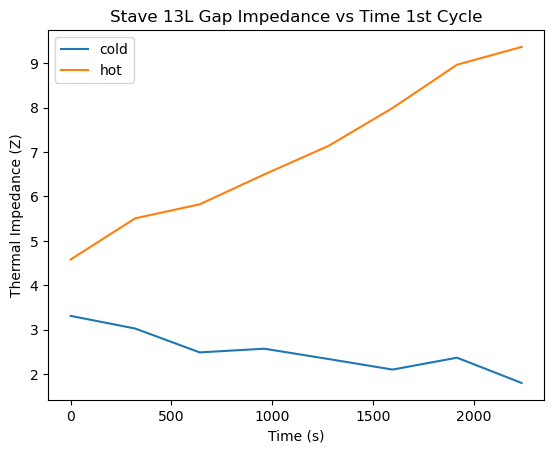

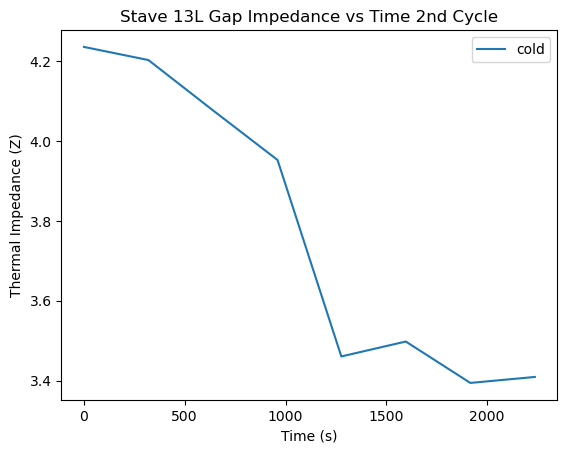

In [85]:
plt.plot(L13_cold_swap_1[14,:,0], L13power_cold1/L13power_cold1.max())
plt.plot(L13_hot_swap_1[14,:,0], abs(L13power_hot1/L13power_hot1.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 13L Gap Power Load vs Impedance 1st Cycle")
plt.figure()

plt.plot(L13_cold_swap_2[14,:,0], L13power_cold2/L13power_cold2.max())
plt.legend(['cold'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 13L Gap Power Load vs Impedance 2nd Cycle")
plt.figure()


plt.plot(L13temps[[0,1,2,3,4,5,6,7],0]-L13temps[[0,1,2,3,4,5,6,7],0].min(), L13_cold_swap_1[14,:,0])
plt.plot(L13temps[[8,9,10,11,12,13,14,15],0]-L13temps[[8,9,10,11,12,13,14,15],0].min(), L13_hot_swap_1[14,:,0])
plt.title("Stave 13L Gap Impedance vs Time 1st Cycle")
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.figure()

plt.plot(L13temps[[16,17,18,19,20,21,22,23],0]-L13temps[[16,17,18,19,20,21,22,23],0].min(), L13_cold_swap_2[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold'])
plt.title("Stave 13L Gap Impedance vs Time 2nd Cycle")


## Raised Gap Insulation

### L Side

In [86]:
L13raisedtemps = []
L13raisedflow = []
for filename in sorted(glob("../Stave13_RaisedCore-NewCam_LS_CERN_L_*.npz")):
    f = np.load(filename)
    L13raisedflowtime = f["flow_times"][-1]
    L13raisedflowdata = np.median(f["flow_data"][-5:])
    L13raisedflow.append([L13flowtime, L13flowdata])
    L13raisedthermtime = f["thermo_times"][-1]
    L13raisedthermdata = list(f["thermo_data"][-1])
    L13raisedtemps.append([L13raisedthermtime]+L13raisedthermdata)

L13raisedtemps = np.array(L13raisedtemps)
L13raisedflow = np.array(L13raisedflow)

<Figure size 640x480 with 0 Axes>

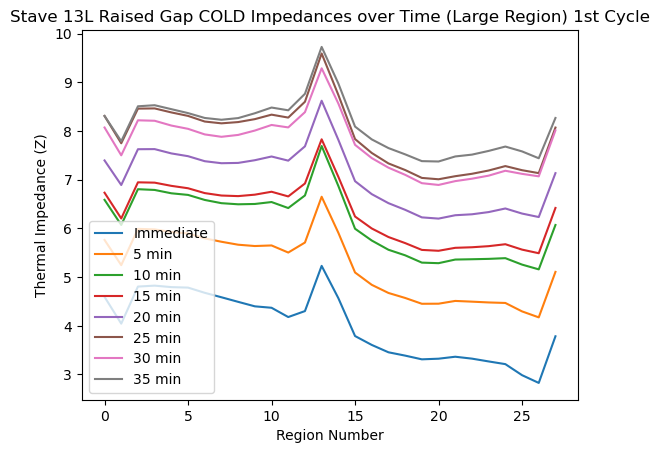

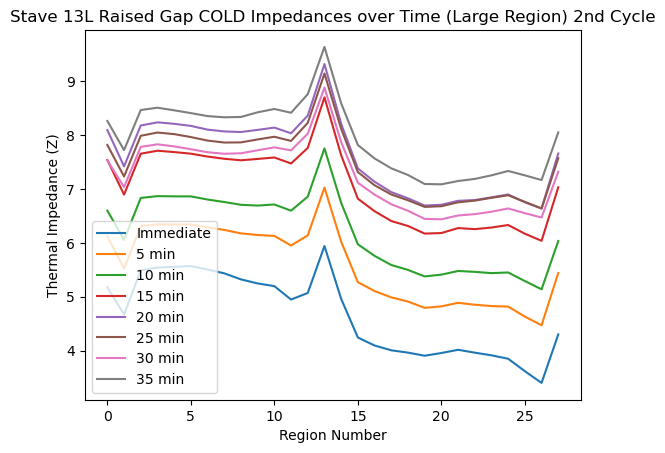

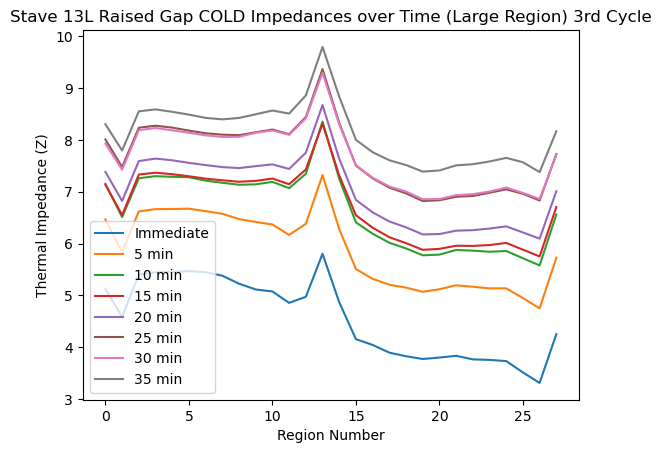

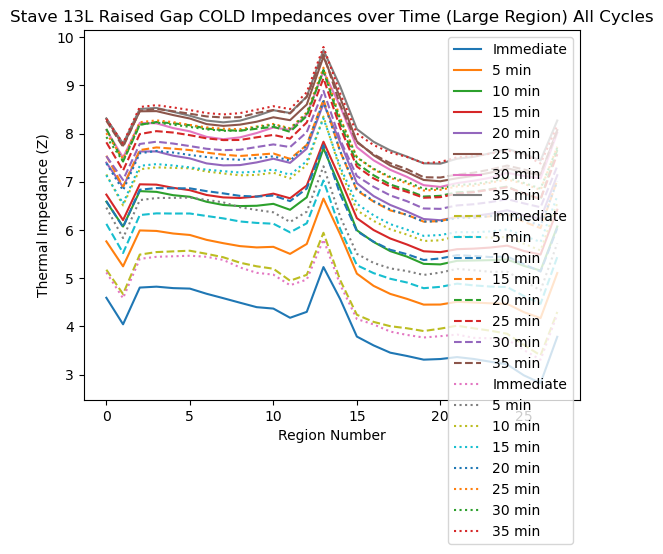

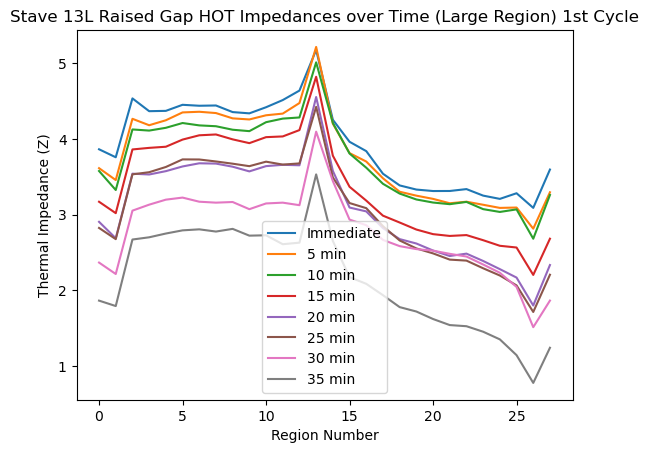

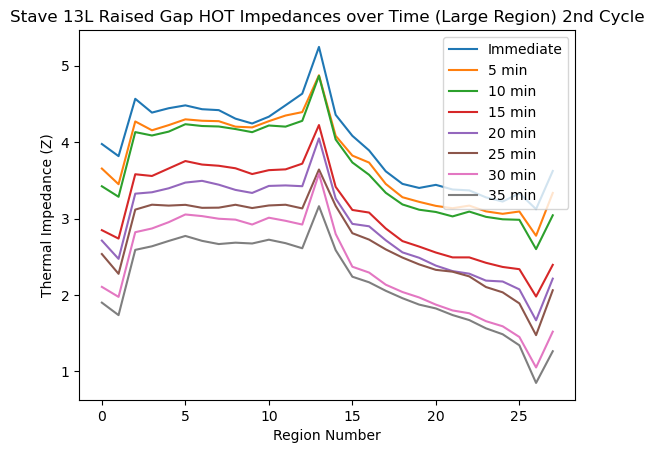

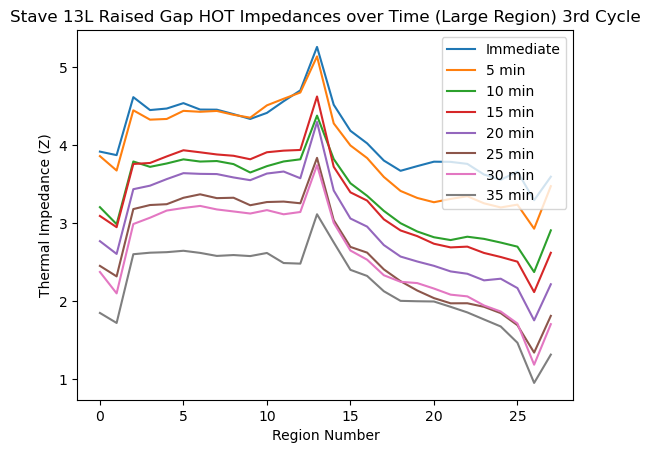

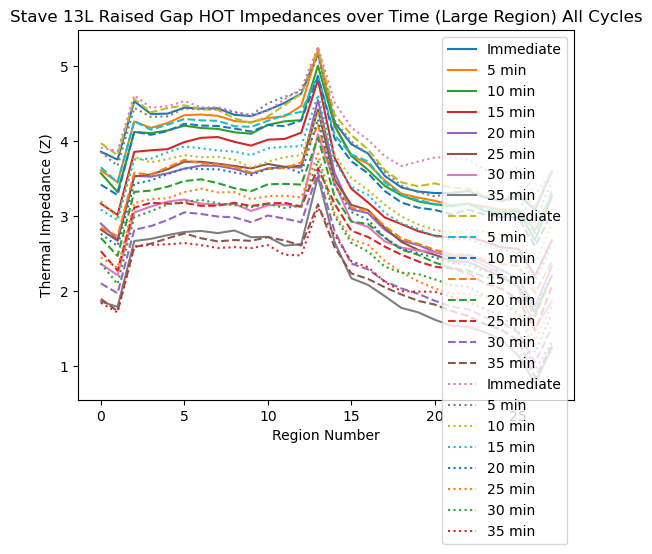

<Figure size 640x480 with 0 Axes>

In [87]:
L13_raisedhot_1 = [] #large region top
L13_raisedhot_2 = [] #large region top
L13_raisedhot_3 = [] #large region top
L13_raisedcold_1 = [] #large region top
L13_raisedcold_2 = [] #large region top
L13_raisedcold_3 = [] #large region top

L13_raisedhot_goavg_1 = [] #large region top
L13_raisedhot_goavg_2 = [] #large region top
L13_raisedhot_goavg_3 = [] #large region top
L13_raisedcold_goavg_1 = [] #large region top
L13_raisedcold_goavg_2 = [] #large region top
L13_raisedcold_goavg_3 = [] #large region top


for filename in sorted(glob("output/Stave13L_raisedgap/Stave13_RaisedCore-NewCam_LS_CERN_L_*_IMPEDANCES.csv")):
    index = int(filename.split("_")[-2])

    if (index >=8 and index <16):
        L13_raisedhot_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
        L13_raisedhot_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=40 and index <48):
        L13_raisedhot_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))


    if (index >=-1 and index <8):
        L13_raisedcold_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
        L13_raisedcold_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))

    if (index >=32 and index <40):
        L13_raisedcold_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[1,2], max_rows=28, skiprows=1))



    if (index >=8 and index <16):
        L13_raisedhot_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=24 and index <32):
        L13_raisedhot_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=40 and index <48):
        L13_raisedhot_goavg_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=-1 and index <8):
        L13_raisedcold_goavg_1.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=16 and index <24):
        L13_raisedcold_goavg_2.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))

    if (index >=32 and index <40):
        L13_raisedcold_goavg_3.append(np.loadtxt(filename, delimiter=',', 
        usecols=[0,1], max_rows=28, skiprows=1))


L13_raisedhot_1 = np.stack(L13_raisedhot_1, axis=0)
L13_raisedhot_swap_1 = np.swapaxes(L13_raisedhot_1, 0, 1)
L13_raisedhot_2 = np.stack(L13_raisedhot_2, axis=0)
L13_raisedhot_swap_2 = np.swapaxes(L13_raisedhot_2, 0, 1)
L13_raisedhot_3 = np.stack(L13_raisedhot_3, axis=0)
L13_raisedhot_swap_3 = np.swapaxes(L13_raisedhot_3, 0, 1)
L13_raisedhot_all = np.concatenate((L13_raisedhot_1, L13_raisedhot_2, L13_raisedhot_3),axis=0)
L13_raisedhot_all_swap = np.concatenate((L13_raisedhot_swap_1, L13_raisedhot_swap_2, L13_raisedhot_swap_3),axis=0)

L13_raisedcold_1 = np.stack(L13_raisedcold_1, axis=0)
L13_raisedcold_swap_1 = np.swapaxes(L13_raisedcold_1, 0, 1)
L13_raisedcold_2 = np.stack(L13_raisedcold_2, axis=0)
L13_raisedcold_swap_2 = np.swapaxes(L13_raisedcold_2, 0, 1)
L13_raisedcold_3 = np.stack(L13_raisedcold_3, axis=0)
L13_raisedcold_swap_3 = np.swapaxes(L13_raisedcold_3, 0, 1)
L13_raisedcold_all = np.concatenate((L13_raisedcold_1, L13_raisedcold_2, L13_raisedcold_3),axis=0)
L13_raisedcold_all_swap = np.concatenate((L13_raisedcold_swap_1, L13_raisedcold_swap_2, L13_raisedcold_swap_3),axis=0)


L13_raisedhot_goavg_1 = np.stack(L13_raisedhot_goavg_1, axis=0)
L13_raisedhot_goavg_swap_1 = np.swapaxes(L13_raisedhot_goavg_1, 0, 1)
L13_raisedhot_goavg_2 = np.stack(L13_raisedhot_goavg_2, axis=0)
L13_raisedhot_goavg_swap_2 = np.swapaxes(L13_raisedhot_goavg_2, 0, 1)
L13_raisedhot_goavg_3 = np.stack(L13_raisedhot_goavg_3, axis=0)
L13_raisedhot_goavg_swap_3 = np.swapaxes(L13_raisedhot_goavg_3, 0, 1)
L13_raisedcold_goavg_1 = np.stack(L13_raisedcold_goavg_1, axis=0)
L13_raisedcold_goavg_swap_1 = np.swapaxes(L13_raisedcold_goavg_1, 0, 1)
L13_raisedcold_goavg_2 = np.stack(L13_raisedcold_goavg_2, axis=0)
L13_raisedcold_goavg_swap_2 = np.swapaxes(L13_raisedcold_goavg_2, 0, 1)
L13_raisedcold_goavg_3 = np.stack(L13_raisedcold_goavg_3, axis=0)
L13_raisedcold_goavg_swap_3 = np.swapaxes(L13_raisedcold_goavg_3, 0, 1)


arr_L13_raisedhot_goavg_1 = np.array(L13_raisedhot_goavg_1)
arr_L13_raisedhot_goavg_2 = np.array(L13_raisedhot_goavg_2)
arr_L13_raisedhot_goavg_3 = np.array(L13_raisedhot_goavg_3)
arr_L13_raisedcold_goavg_1 = np.array(L13_raisedcold_goavg_1)
arr_L13_raisedcold_goavg_2 = np.array(L13_raisedcold_goavg_2)
arr_L13_raisedcold_goavg_3 = np.array(L13_raisedcold_goavg_3)

L13_raisedhot_avg = (arr_L13_raisedhot_goavg_1+arr_L13_raisedhot_goavg_2+arr_L13_raisedhot_goavg_3)/3

L13_raisedcold_avg = (arr_L13_raisedcold_goavg_1+arr_L13_raisedcold_goavg_2+arr_L13_raisedcold_goavg_3)/3

plt.plot(L13_raisedcold_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Raised Gap COLD Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(L13_raisedcold_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Raised Gap COLD Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(L13_raisedcold_swap_3[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Raised Gap COLD Impedances over Time (Large Region) 3rd Cycle")
plt.figure()

plt.plot(L13_raisedcold_swap_1[:,:,0])
plt.plot(L13_raisedcold_swap_2[:,:,0], linestyle='dashed')
plt.plot(L13_raisedcold_swap_3[:,:,0], linestyle='dotted')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Raised Gap COLD Impedances over Time (Large Region) All Cycles")
plt.figure()

plt.plot(L13_raisedhot_swap_1[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Raised Gap HOT Impedances over Time (Large Region) 1st Cycle")
plt.figure()

plt.plot(L13_raisedhot_swap_2[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Raised Gap HOT Impedances over Time (Large Region) 2nd Cycle")
plt.figure()

plt.plot(L13_raisedhot_swap_3[:,:,0])
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Raised Gap HOT Impedances over Time (Large Region) 3rd Cycle")
plt.figure()

plt.plot(L13_raisedhot_swap_1[:,:,0])
plt.plot(L13_raisedhot_swap_2[:,:,0], linestyle='dashed')
plt.plot(L13_raisedhot_swap_3[:,:,0], linestyle='dotted')
plt.legend(['Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min', 'Immediate', '5 min', '10 min', '15 min', '20 min', '25 min', '30 min', '35 min'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("Stave 13L Raised Gap HOT Impedances over Time (Large Region) All Cycles")
plt.figure()


Text(0.5, 1.0, 'Stave 13L Raised Gap COLD Inlet/Outlet Temp Difference over Time All Cycles')

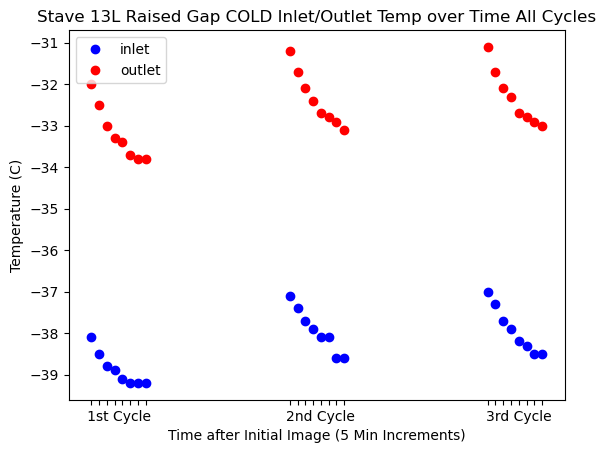

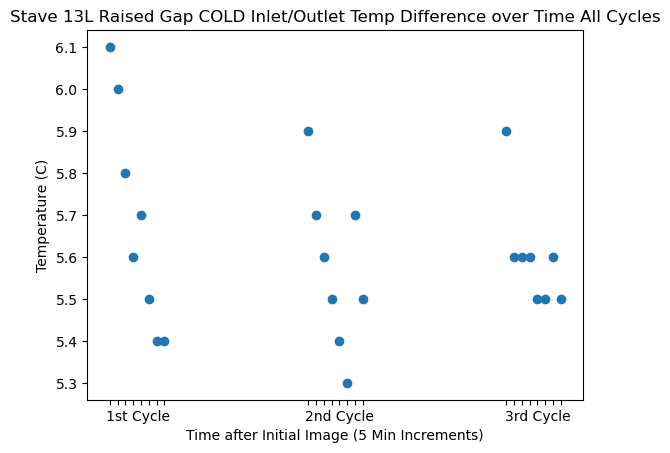

In [88]:
plt.plot(L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3],'bo',
    L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4], 'ro',
)

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ','   ',' ',' ', ' ', '3rd Cycle',' ',' ', ' ']
plt.xticks(L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.legend(['inlet', 'outlet'])
plt.title("Stave 13L Raised Gap COLD Inlet/Outlet Temp over Time All Cycles")
plt.figure()

plt.plot(L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3],'o')
xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ','   ',' ',' ', ' ', '3rd Cycle',' ',' ', ' ']
plt.xticks(L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 13L Raised Gap COLD Inlet/Outlet Temp Difference over Time All Cycles")

Text(0.5, 1.0, 'Stave 13L Raised Gap HOT Inlet/Outlet Temp Difference over Time All Cycles')

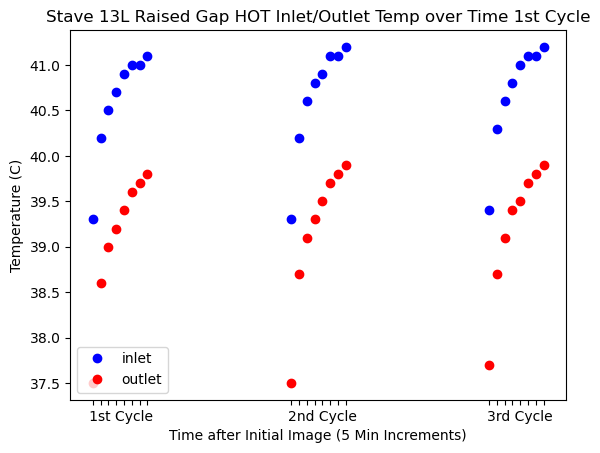

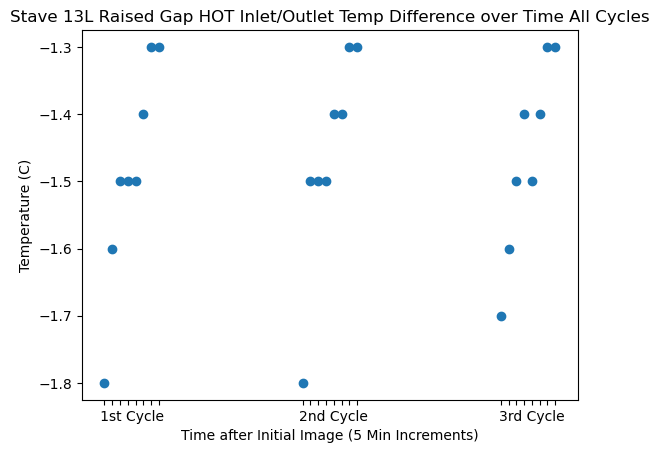

In [89]:
plt.plot(
    L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3],'bo',
    L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4], 'ro',
)

plt.legend(['inlet', 'outlet'])

xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ','   ',' ',' ', ' ', '3rd Cycle',' ',' ', ' ']
plt.xticks(L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")

plt.title("Stave 13L Raised Gap HOT Inlet/Outlet Temp over Time 1st Cycle")
plt.figure()


plt.plot(L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4]-L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3],'o')
xticks = ['', ' ', ' ', '   1st Cycle ', ' ', '  ',' ',' ','   ',' ',' ', ' ', '2nd Cycle',' ',' ', ' ','   ',' ',' ', ' ', '3rd Cycle',' ',' ', ' ']
plt.xticks(L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Temperature (C)")
plt.title("Stave 13L Raised Gap HOT Inlet/Outlet Temp Difference over Time All Cycles")

<Figure size 640x480 with 0 Axes>

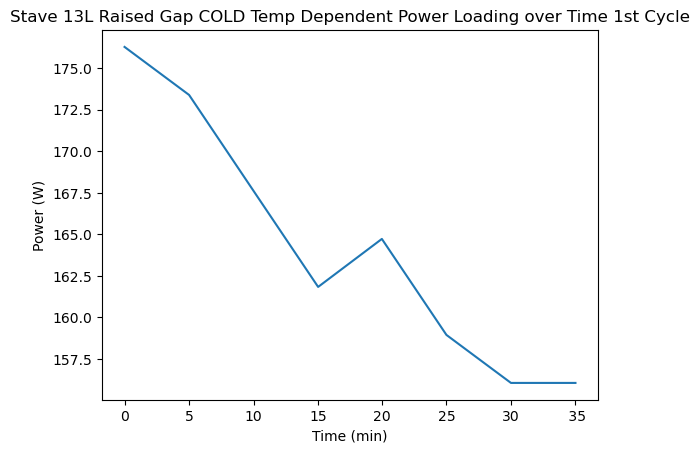

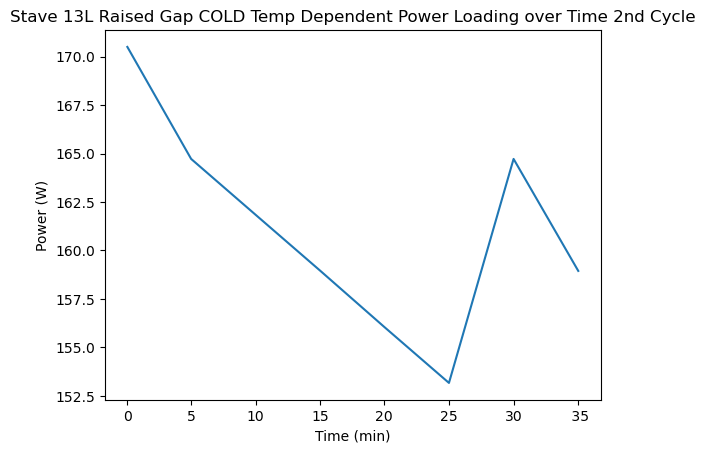

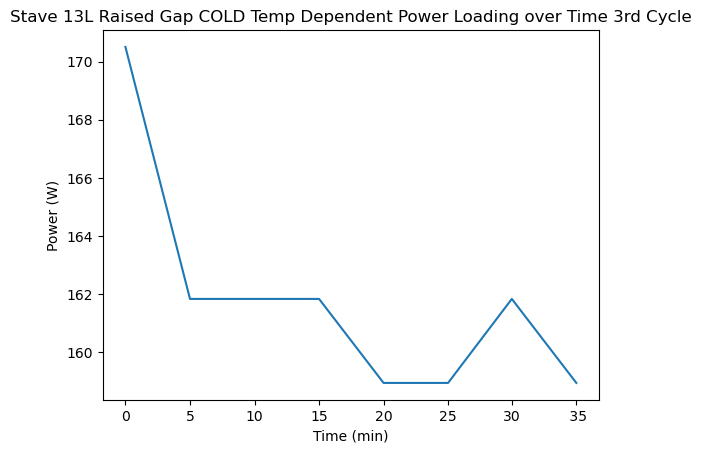

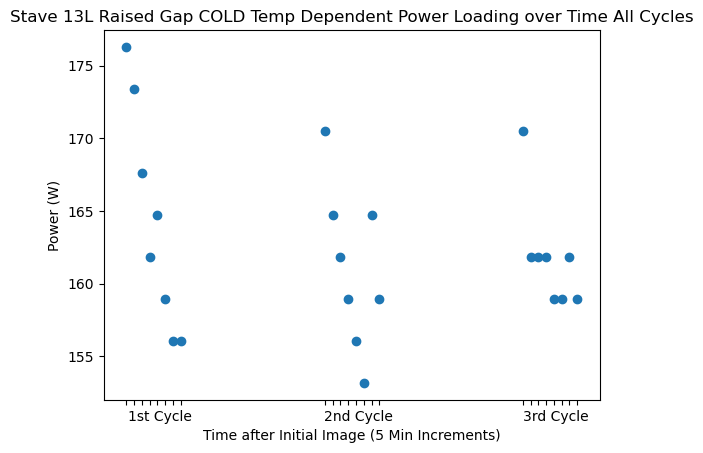

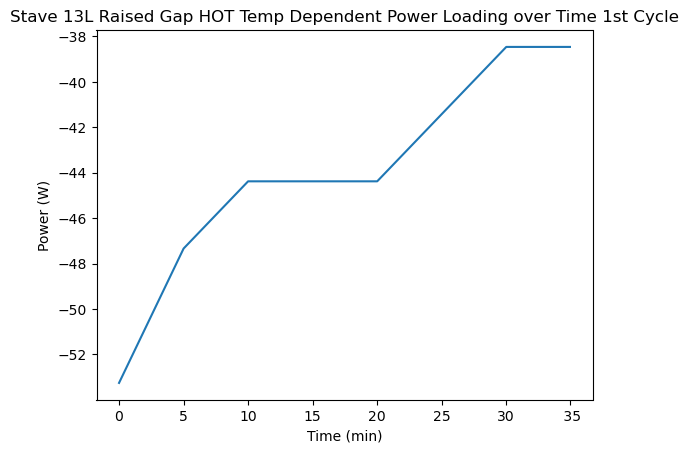

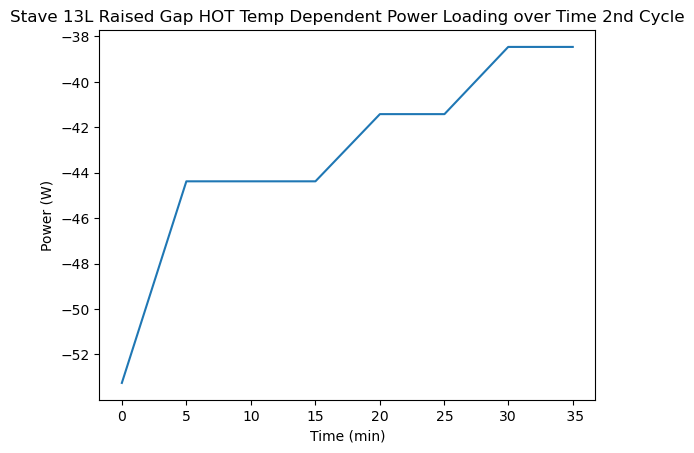

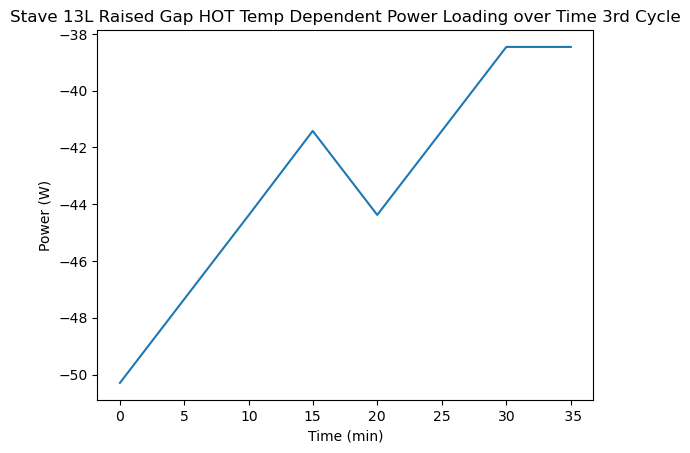

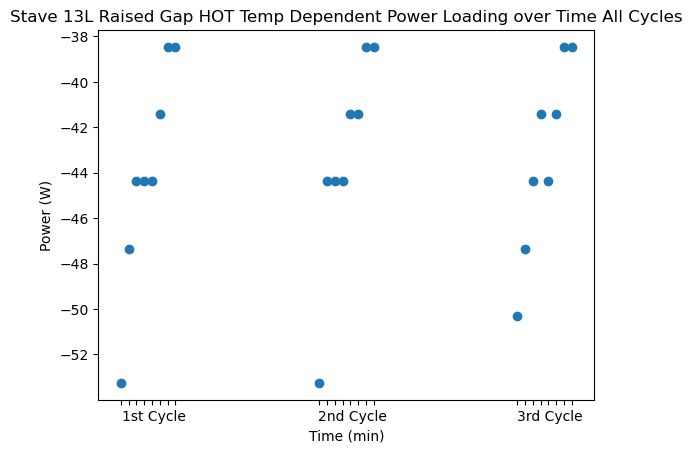

<Figure size 640x480 with 0 Axes>

In [90]:
L13power_raisedcold_all = ((1614/60)*1063*L13raisedflow[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],1]*(L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],4]-L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],3]))/1000
L13power_raisedcold1 = ((1614/60)*1063*L13raisedflow[[0,1,2,3,4,5,6,7],1]*(L13raisedtemps[[0,1,2,3,4,5,6,7],4]-L13raisedtemps[[0,1,2,3,4,5,6,7],3]))/1000
L13power_raisedcold2 = ((1614/60)*1063*L13raisedflow[[16,17,18,19,20,21,22,23],1]*(L13raisedtemps[[16,17,18,19,20,21,22,23],4]-L13raisedtemps[[16,17,18,19,20,21,22,23],3]))/1000
L13power_raisedcold3 = ((1614/60)*1063*L13raisedflow[[32,33,34,35,36,37,38,39],1]*(L13raisedtemps[[32,33,34,35,36,37,38,39],4]-L13raisedtemps[[32,33,34,35,36,37,38,39],3]))/1000


L13power_raisedhot_all = ((1448/60)*1213*L13raisedflow[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],1]*(L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],4]-L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],3]))/1000
L13power_raisedhot1 = ((1448/60)*1213*L13raisedflow[[8,9,10,11,12,13,14,15],1]*(L13raisedtemps[[8,9,10,11,12,13,14,15],4]-L13raisedtemps[[8,9,10,11,12,13,14,15],3]))/1000
L13power_raisedhot2 = ((1448/60)*1213*L13raisedflow[[24,25,26,27,28,29,30,31],1]*(L13raisedtemps[[24,25,26,27,28,29,30,31],4]-L13raisedtemps[[24,25,26,27,28,29,30,31],3]))/1000
L13power_raisedhot3 = ((1448/60)*1213*L13raisedflow[[40,41,42,43,44,45,46,47],1]*(L13raisedtemps[[40,41,42,43,44,45,46,47],4]-L13raisedtemps[[40,41,42,43,44,45,46,47],3]))/1000



plt.plot(L13raisedtemps[[0,1,2,3,4,5,6,7],0], L13power_raisedcold1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L13raisedtemps[[0,1,2,3,4,5,6,7],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L Raised Gap COLD Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(L13raisedtemps[[16,17,18,19,20,21,22,23],0], L13power_raisedcold2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L13raisedtemps[[16,17,18,19,20,21,22,23],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L Raised Gap COLD Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(L13raisedtemps[[32,33,34,35,36,37,38,39],0], L13power_raisedcold3)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L13raisedtemps[[32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L Raised Gap COLD Temp Dependent Power Loading over Time 3rd Cycle")
plt.figure()

plt.plot(L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0], L13power_raisedcold_all, 'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ','','', '        3rd Cycle','','','', '',' ']
plt.xticks(L13raisedtemps[[0,1,2,3,4,5,6,7,16,17,18,19,20,21,22,23,32,33,34,35,36,37,38,39],0],xticks)
plt.xlabel("Time after Initial Image (5 Min Increments)")
plt.ylabel("Power (W)")
plt.title("Stave 13L Raised Gap COLD Temp Dependent Power Loading over Time All Cycles")
plt.figure()

plt.plot(L13raisedtemps[[8,9,10,11,12,13,14,15],0], L13power_raisedhot1)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L13raisedtemps[[8,9,10,11,12,13,14,15],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L Raised Gap HOT Temp Dependent Power Loading over Time 1st Cycle")
plt.figure()

plt.plot(L13raisedtemps[[24,25,26,27,28,29,30,31],0], L13power_raisedhot2)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L13raisedtemps[[24,25,26,27,28,29,30,31],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L Raised Gap HOT Temp Dependent Power Loading over Time 2nd Cycle")
plt.figure()

plt.plot(L13raisedtemps[[40,41,42,43,44,45,46,47],0], L13power_raisedhot3)
xticks = ['0','5', '10','15','20','25', '30',' 35']
plt.xticks(L13raisedtemps[[40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L Raised Gap HOT Temp Dependent Power Loading over Time 3rd Cycle")
plt.figure()

plt.plot(L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0], L13power_raisedhot_all, 'o')
xticks = ['','', '        1st Cycle','','','', '',' ','','', '        2nd Cycle','','','', '',' ','','', '        3rd Cycle','','','', '',' ']
plt.xticks(L13raisedtemps[[8,9,10,11,12,13,14,15,24,25,26,27,28,29,30,31,40,41,42,43,44,45,46,47],0],xticks)
plt.xlabel("Time (min)")
plt.ylabel("Power (W)")
plt.title("Stave 13L Raised Gap HOT Temp Dependent Power Loading over Time All Cycles")
plt.figure()

Text(0.5, 1.0, 'Stave 13L Raised Gap Impedance vs Time 3rd Cycle')

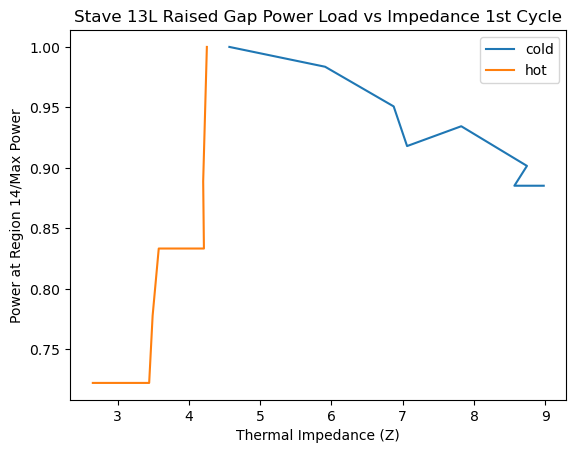

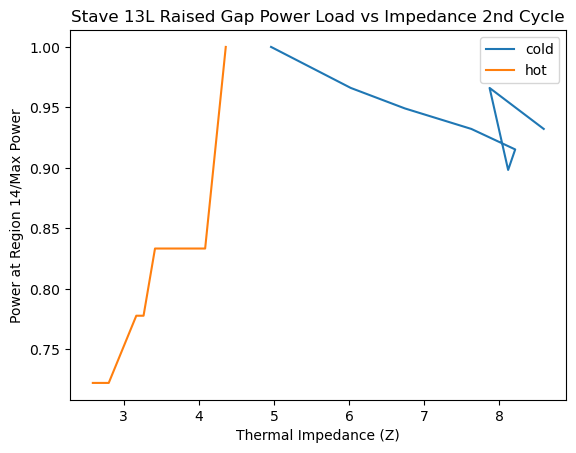

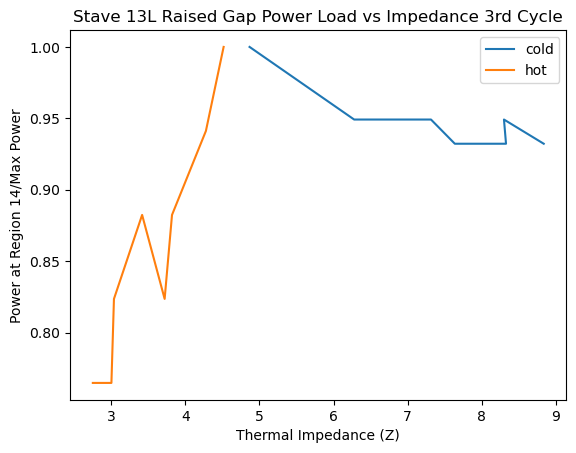

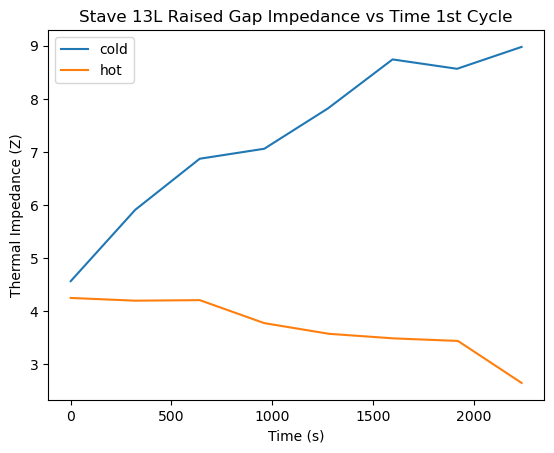

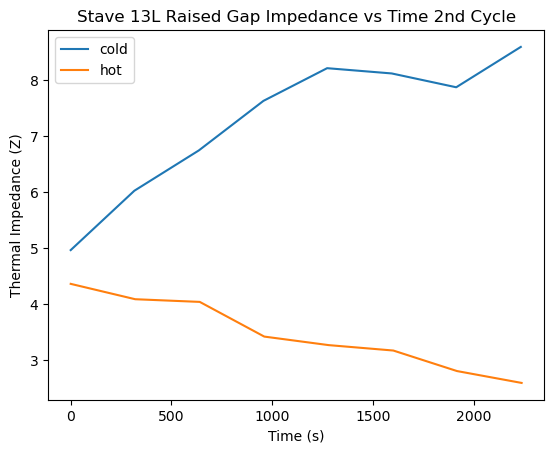

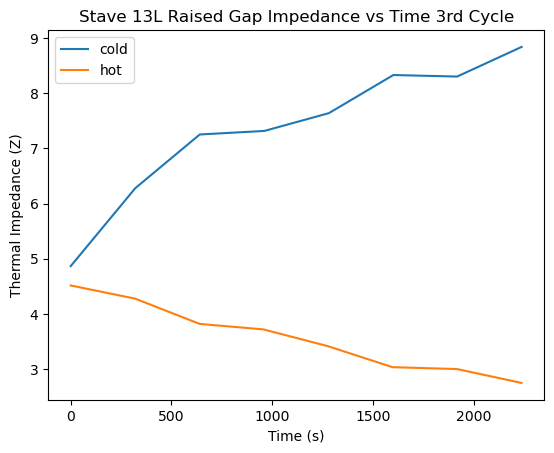

In [91]:
plt.plot(L13_raisedcold_swap_1[14,:,0], L13power_raisedcold1/L13power_raisedcold1.max())
plt.plot(L13_raisedhot_swap_1[14,:,0], abs(L13power_raisedhot1/L13power_raisedhot1.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 13L Raised Gap Power Load vs Impedance 1st Cycle")
plt.figure()


plt.plot(L13_raisedcold_swap_2[14,:,0], L13power_raisedcold2/L13power_raisedcold2.max())
plt.plot(L13_raisedhot_swap_2[14,:,0], abs(L13power_raisedhot2/L13power_raisedhot2.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 13L Raised Gap Power Load vs Impedance 2nd Cycle")
plt.figure()

plt.plot(L13_raisedcold_swap_3[14,:,0], L13power_raisedcold3/L13power_raisedcold3.max())
plt.plot(L13_raisedhot_swap_3[14,:,0], abs(L13power_raisedhot3/L13power_raisedhot3.min()))
plt.legend(['cold', 'hot'])
plt.xlabel("Thermal Impedance (Z)")
plt.ylabel("Power at Region 14/Max Power")
plt.title("Stave 13L Raised Gap Power Load vs Impedance 3rd Cycle")
plt.figure()

plt.plot(L13raisedtemps[[0,1,2,3,4,5,6,7],0]-L13raisedtemps[[0,1,2,3,4,5,6,7],0].min(), L13_raisedcold_swap_1[14,:,0])
plt.plot(L13raisedtemps[[8,9,10,11,12,13,14,15],0]-L13raisedtemps[[8,9,10,11,12,13,14,15],0].min(), L13_raisedhot_swap_1[14,:,0])
plt.title("Stave 13L Raised Gap Impedance vs Time 1st Cycle")
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.figure()

plt.plot(L13raisedtemps[[16,17,18,19,20,21,22,23],0]-L13raisedtemps[[16,17,18,19,20,21,22,23],0].min(), L13_raisedcold_swap_2[14,:,0])
plt.plot(L13raisedtemps[[24,25,26,27,28,29,30,31],0]-L13raisedtemps[[24,25,26,27,28,29,30,31],0].min(), L13_raisedhot_swap_2[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold','hot'])
plt.title("Stave 13L Raised Gap Impedance vs Time 2nd Cycle")
plt.figure()

plt.plot(L13raisedtemps[[32,33,34,35,36,37,38,39],0]-L13raisedtemps[[32,33,34,35,36,37,38,39],0].min(), L13_raisedcold_swap_3[14,:,0])
plt.plot(L13raisedtemps[[40,41,42,43,44,45,46,47],0]-L13raisedtemps[[40,41,42,43,44,45,46,47],0].min(), L13_raisedhot_swap_3[14,:,0])
plt.xlabel("Time (s)")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['cold', 'hot'])
plt.title("Stave 13L Raised Gap Impedance vs Time 3rd Cycle")


# Ratios

In [ ]:
J9_hot_avg_new = (J9_hot_avg[0]+J9_hot_avg[1]+J9_hot_avg[2]+J9_hot_avg[3]+J9_hot_avg[4]+J9_hot_avg[5]+J9_hot_avg[6]+J9_hot_avg[7])/8
J9_hot_avg_real = np.transpose(J9_hot_avg_new)

L9_hot_avg_new = (L9_hot_avg[0]+L9_hot_avg[1]+L9_hot_avg[2]+L9_hot_avg[3]+L9_hot_avg[4]+L9_hot_avg[5]+L9_hot_avg[6]+L9_hot_avg[7])/8
L9_hot_avg_real = np.transpose(L9_hot_avg_new)

L11_hot_avg_new = (L11_hot_avg[0]+L11_hot_avg[1]+L11_hot_avg[2]+L11_hot_avg[3]+L11_hot_avg[4]+L11_hot_avg[5]+L11_hot_avg[6]+L11_hot_avg[7])/8
L11_hot_avg_real = np.transpose(L11_hot_avg_new)

J11_hot_avg_new = (J11_hot_avg[0]+J11_hot_avg[1]+J11_hot_avg[2]+J11_hot_avg[3]+J11_hot_avg[4]+J11_hot_avg[5]+J11_hot_avg[6]+J11_hot_avg[7])/8
J11_hot_avg_real = np.transpose(J11_hot_avg_new)

L12ins_hot_avg_new = (L12ins_hot_avg[0]+L12ins_hot_avg[1]+L12ins_hot_avg[2]+L12ins_hot_avg[3]+L12ins_hot_avg[4]+L12ins_hot_avg[5]+L12ins_hot_avg[6]+L12ins_hot_avg[7])/8
L12ins_hot_avg_real = np.transpose(L12ins_hot_avg_new)

J12ins_hot_avg_new = (J12ins_hot_avg[0]+J12ins_hot_avg[1]+J12ins_hot_avg[2]+J12ins_hot_avg[3]+J12ins_hot_avg[4]+J12ins_hot_avg[5]+J12ins_hot_avg[6]+J12ins_hot_avg[7])/8
J12ins_hot_avg_real = np.transpose(J12ins_hot_avg_new)

L12gapone_hot_avg_new = (L12gapone_hot_avg[0]+L12gapone_hot_avg[1]+L12gapone_hot_avg[2]+L12gapone_hot_avg[3]+L12gapone_hot_avg[4]+L12gapone_hot_avg[5]+L12gapone_hot_avg[6]+L12gapone_hot_avg[7])/8
L12gapone_hot_avg_real = np.transpose(L12gapone_hot_avg_new)

L12gaptwo_hot_avg_new = (L12gaptwo_hot_avg[0]+L12gaptwo_hot_avg[1]+L12gaptwo_hot_avg[2]+L12gaptwo_hot_avg[3]+L12gaptwo_hot_avg[4]+L12gaptwo_hot_avg[5]+L12gaptwo_hot_avg[6]+L12gaptwo_hot_avg[7])/8
L12gaptwo_hot_avg_real = np.transpose(L12gaptwo_hot_avg_new)

L13_hot_avg_new = (L13_hot_avg[0]+L13_hot_avg[1]+L13_hot_avg[2]+L13_hot_avg[3]+L13_hot_avg[4]+L13_hot_avg[5]+L13_hot_avg[6]+L13_hot_avg[7])/8
L13_hot_avg_real = np.transpose(L13_hot_avg_new)


hot_avg = (J9_hot_avg_real+L9_hot_avg_real+J11_hot_avg_real+L11_hot_avg_real+J12_hot_avg+L12_hot_avg+L12ins_hot_avg_real+J12ins_hot_avg_real)/8

hot_avg_no12 = (J9_hot_avg_real+L9_hot_avg_real+J11_hot_avg_real+L11_hot_avg_real+L12ins_hot_avg_real+J12ins_hot_avg_real)/6

hot_avg_gap = (L12gapone_hot_avg_real+L12gaptwo_hot_avg_real+L13_hot_avg_real)/3


plt.plot(hot_avg[0],hot_avg_gap[1])
plt.plot(hot_avg[0],L12gapone_hot_avg_real[1])
plt.plot(hot_avg[0],L12gaptwo_hot_avg_real[1])
plt.plot(hot_avg[0],L13_hot_avg_real[1])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['Average', '12L Day One', '12L Day Two', '13L'])
plt.title("12L Days 1 and 2 and 13L Hot Average with Ins Gap")
plt.figure()


plt.plot(hot_avg[0],hot_avg[1])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("All Staves Hot Average")
plt.figure()


plt.plot(hot_avg_no12[0],hot_avg_no12[1])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("9 and 11 and 12Ins Staves Hot Average")
plt.figure()


print(L12_hot_avg.shape)
print(J12_hot_avg.shape)

In [ ]:
#hot_avg = (J9_hot_avg_real+L9_hot_avg_real+J11_hot_avg_real+L11_hot_avg_real+J12_hot_avg+L12_hot_avg)/6

J9ratio_to_avg_hot = J9_hot_avg_real[1] / hot_avg[1]
L9ratio_to_avg_hot = L9_hot_avg_real[1] / hot_avg[1]
J11ratio_to_avg_hot = J11_hot_avg_real[1] / hot_avg[1]
L11ratio_to_avg_hot = L11_hot_avg_real[1] / hot_avg[1]
J12ratio_to_avg_hot = J12_hot_avg[1] / hot_avg[1]
L12ratio_to_avg_hot = L12_hot_avg[1] / hot_avg[1]
J12insratio_to_avg_hot = J12ins_hot_avg_real[1] / hot_avg[1]
L12insratio_to_avg_hot = L12ins_hot_avg_real[1] / hot_avg[1]
L12gaponeratio_to_avg_hot = L12gapone_hot_avg_real[1] / hot_avg[1]
L12gaptworatio_to_avg_hot = L12gaptwo_hot_avg_real[1] / hot_avg[1]
L13ratio_to_avg_hot = L13_hot_avg_real[1] / hot_avg[1]

ratio_to_avg_hot_avg = hot_avg[1] / hot_avg[1]

J9ratio_to_avg_hot_no12 = J9_hot_avg_real[1] / hot_avg_no12[1]
L9ratio_to_avg_hot_no12 = L9_hot_avg_real[1] / hot_avg_no12[1]
J11ratio_to_avg_hot_no12 = J11_hot_avg_real[1] / hot_avg_no12[1]
L11ratio_to_avg_hot_no12 = L11_hot_avg_real[1] / hot_avg_no12[1]
J12insratio_to_avg_hot_no12 = J12ins_hot_avg_real[1] / hot_avg_no12[1]
L12insratio_to_avg_hot_no12 = L12ins_hot_avg_real[1] / hot_avg_no12[1]

ratio_to_avg_hot_avg_no12 = hot_avg_no12[1] / hot_avg_no12[1]

ratio_to_gap_avg_hot_avg = hot_avg_gap[1] / hot_avg_gap[1]

plt.plot(hot_avg[0],ratio_to_gap_avg_hot_avg)
plt.plot(hot_avg[0],L12gaponeratio_to_avg_hot)
plt.plot(hot_avg[0],L12gaptworatio_to_avg_hot)
plt.plot(hot_avg[0],L13ratio_to_avg_hot)
plt.legend(['Average', '12L Day One', '12L Day Two', '13L'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("12L Days 1 and 2 and 13L Ratio to Average HOT with Gap")
plt.figure()


plt.plot(hot_avg[0],ratio_to_avg_hot_avg)
plt.plot(hot_avg[0],J9ratio_to_avg_hot)
plt.plot(hot_avg[0],L9ratio_to_avg_hot)
plt.plot(hot_avg[0],J11ratio_to_avg_hot)
plt.plot(hot_avg[0],L11ratio_to_avg_hot)
plt.plot(hot_avg[0],J12ratio_to_avg_hot)
plt.plot(hot_avg[0],L12ratio_to_avg_hot)
plt.plot(hot_avg[0],J12insratio_to_avg_hot)
plt.plot(hot_avg[0],L12insratio_to_avg_hot)
plt.legend(['Average', '9J', '9L', '11J', '11L', '12J OldCam', '12L OldCam', '12J Ins', '12L Ins'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("All Staves Ratio to Average HOT")
plt.figure()


plt.plot(hot_avg[0],ratio_to_avg_hot_avg_no12)
plt.plot(hot_avg[0],J9ratio_to_avg_hot_no12)
plt.plot(hot_avg[0],L9ratio_to_avg_hot_no12)
plt.plot(hot_avg[0],J11ratio_to_avg_hot_no12)
plt.plot(hot_avg[0],L11ratio_to_avg_hot_no12)
plt.plot(hot_avg[0],J12insratio_to_avg_hot_no12)
plt.plot(hot_avg[0],L12insratio_to_avg_hot_no12)

plt.legend(['Average', '9J', '9L', '11J', '11L', '12J Ins', '12L Ins'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("All Staves (9, 11, 12 Ins) Ratio to Average HOT (No OldCam 12)")
plt.figure()

In [ ]:
arr_J12_cold_1_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.407598964,3.51408616,4.779614554,4.974052307,4.972938106,5.063363597,5.075791156,4.99284251,4.866634281,4.810823369,4.690014079,4.427687682,4.630238591,5.168070564,4.643386126,3.978366242,3.711446807,3.934207123,4.023883605,3.937052045,3.877535404,3.840734998,3.718037007,3.748234599,3.829309215,3.722430239,3.830165198,5.259290423]]) #large region top
arr_J12_cold_1_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[4.906842515,4.064434483,5.301135469,5.514934651,5.506521506,5.605120516,5.604815667,5.538675951,5.438604786,5.379070377,5.2078093,4.973454054,5.151182839,5.753315546,5.214926994,4.506179931,4.23340369,4.449276996,4.574847225,4.475896493,4.395322155,4.329513285,4.265666569,4.292418104,4.386384603,4.27001895,4.393905638,5.79284982]])
arr_J12_cold_1_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[5.994398953,5.035304142,6.278138433,6.481206355,6.423919415,6.516856526,6.525354748,6.503559209,6.396917547,6.408967132,6.263906223,6.054966018,6.354649823,6.982728223,6.486469263,5.630080746,5.276237078,5.544792051,5.671621908,5.571669825,5.501605297,5.444171368,5.359472532,5.410779666,5.583096722,5.47580199,5.612832026,7.060645179]])
arr_J12_cold_1_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[6.127227568,5.248680264,6.262242461,6.500614584,6.429390947,6.462763776,6.460104268,6.464669395,6.412340541,6.399741641,6.3629264,6.183756205,6.502510851,7.099121581,6.766450445,6.011395901,5.639499309,5.85047824,5.921750808,5.836746936,5.78899353,5.721231306,5.705866412,5.788905161,5.970085963,5.886224459,6.02123609,7.272607025]])
arr_J12_cold_1_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27],[7.154425506,6.227968455,7.442972901,7.645809446,7.569869213,7.634298293,7.659485139,7.609182456,7.553467911,7.571849133,7.521414949,7.369754509,7.665182982,8.505076993,7.798144364,6.879923346,6.488009169,6.685773969,6.793418332,6.668904609,6.607867168,6.562349795,6.551420486,6.613530234,6.81456057,6.753997194,6.908479562,8.323439508]])


arr_J12_cold_2_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [5.818597661,5.023766066,6.166255893,6.377345163,6.346373786,6.444169666,6.446359952,6.418171369,6.326533697,6.275024701,6.135695322,5.9488962,6.223037581,6.919330642,6.215121699,5.521205836,5.247435863,5.386420549,5.495299176,5.426566719,5.411367962,5.37384847,5.33098267,5.37093052,5.482221297,5.43132516,5.52813321,6.724408495]])
arr_J12_cold_2_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.681836001,5.894865271,7.027050296,7.153453845,7.17229695,7.244678242,7.295789327,7.256624562,7.185867474,7.172297983,7.020567669,6.85627108,7.193589991,7.870469516,7.102003445,6.414198544,6.116782833,6.271034278,6.346697973,6.26653558,6.246591739,6.231403355,6.174997686,6.235831249,6.38266072,6.359963877,6.479919018,7.717082707]])
arr_J12_cold_2_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.922428088,6.197482941,7.29422045,7.454572137,7.469386678,7.524095871,7.598070729,7.52491082,7.43817473,7.486892633,7.384488072,7.19901787,7.581475577,8.346785591,7.536274811,6.812231237,6.473995366,6.599068191,6.671460805,6.581508883,6.540990314,6.537520198,6.48308978,6.540474864,6.706348939,6.714270922,6.823322895,8.046674589]])
arr_J12_cold_2_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.799252942,7.01250995,8.108289876,8.324864281,8.306127351,8.328868225,8.366489141,8.373261159,8.286340533,8.380566869,8.309452904,8.137757782,8.540679487,9.297246562,8.466479108,7.726767336,7.364063494,7.487519342,7.5545699,7.444237632,7.403595576,7.385986989,7.349129741,7.435877925,7.640634323,7.611735083,7.761329597,8.942033024]])
arr_J12_cold_2_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.50802791,6.843898321,7.920514438,8.043004884,8.029472804,8.066789625,8.094843888,8.091687789,8.059604815,8.115532833,8.053886296,8.000569864,8.396319667,9.004390648,8.23898101,7.592862371,7.236503441,7.335451852,7.367016567,7.262078017,7.228201099,7.208877612,7.217831532,7.303184821,7.497005264,7.522355129,7.618862114,8.713067993]])
arr_J12_cold_2_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.052142124,7.397396815,8.445500764,8.565518078,8.554925728,8.628102674,8.630797641,8.604167335,8.567977701,8.660549139,8.634475022,8.58002332,9.003517343,9.700496287,8.892809744,8.212109096,7.826503707,7.931313361,7.946916934,7.825973883,7.761140011,7.754317109,7.759265012,7.850956731,8.049539878,8.124119424,8.221773097,9.320483719]])
arr_J12_cold_2_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.651821257,7.987455748,9.016547223,9.168045992,9.137202931,9.204610984,9.245430961,9.216660404,9.165948574,9.333025735,9.315684026,9.292703182,9.716889219,10.36988067,9.547870506,8.866045761,8.495830643,8.54333855,8.565189092,8.444476778,8.410673743,8.431184066,8.429368588,8.521836413,8.733789527,8.783597966,8.907368779,9.973632374]])
arr_J12_cold_2_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.976591965,8.327975409,9.314549307,9.452278533,9.441514386,9.504425297,9.502681728,9.513366407,9.498137269,9.610798485,9.641754179,9.612353859,10.02857742,10.74013121,10.13945989,9.422627015,9.006587145,9.054825924,9.093312597,8.982028129,8.940152449,8.936086002,8.920561584,8.964096588,9.165588374,9.253443934,9.347843465,10.39616336]])


arr_J12_cold_3_0 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.501555094,5.662815548,6.546815668,6.693422509,6.695462577,6.781587594,6.795297907,6.790366548,6.760760454,6.748313372,6.698477174,6.573857415,6.852770888,7.555027692,7.042547042,6.324271895,6.031732731,6.136164574,6.213260321,6.143464108,6.126298172,6.066214709,5.995884178,6.040260429,6.182355393,6.171567804,6.253114824,7.492601121]])
arr_J12_cold_3_5 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.770468732,5.951922867,7.0479666,7.192983623,7.190766609,7.285429365,7.345127232,7.301688131,7.201364853,7.236324988,7.194330339,7.076951772,7.400726272,8.07624365,7.324349522,6.647316052,6.320699287,6.427924187,6.447584237,6.360559244,6.346565041,6.34293626,6.253568744,6.278256073,6.43212671,6.421383973,6.520565512,7.744595929]])
arr_J12_cold_3_10 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [6.707111408,6.041392061,7.101260609,7.219120869,7.239012158,7.303902736,7.33310465,7.302845402,7.231484921,7.262839373,7.221910427,7.092554495,7.423315242,8.071606148,7.385550187,6.748565329,6.417569238,6.519653264,6.565317002,6.45423417,6.425903288,6.428778505,6.356977452,6.418702533,6.589717767,6.584681451,6.647413693,7.768637341]])
arr_J12_cold_3_15 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [7.94179419,7.134026257,8.161302061,8.343189234,8.32028903,8.382439651,8.471356953,8.433547788,8.356459951,8.397381016,8.368806991,8.24993934,8.644602371,9.331081226,8.542674268,7.850094729,7.500161049,7.621406868,7.636400607,7.522950297,7.495324553,7.50622449,7.41936488,7.503128855,7.694226132,7.711677633,7.791228444,9.019152821]])
arr_J12_cold_3_20 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.190858975,7.396275227,8.442542027,8.592935929,8.582275781,8.635541613,8.671547293,8.64702036,8.588773155,8.681817144,8.63099559,8.559762487,8.971952199,9.748079294,8.88817944,8.156983017,7.80483131,7.903606209,7.939511241,7.812752556,7.751165072,7.74084203,7.693980786,7.782451948,7.997703256,8.035455995,8.121692663,9.341534986]])
arr_J12_cold_3_25 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.331602178,7.477151477,8.383483717,8.557054321,8.503435116,8.546907946,8.58083247,8.554859892,8.546947143,8.646302675,8.659085895,8.605996409,9.04142214,9.791254518,9.204328879,8.439834051,8.050101094,8.139869201,8.170485102,8.062637141,8.036363351,8.05449885,8.03258677,8.169847259,8.415168172,8.457048429,8.534461468,9.70683854]])
arr_J12_cold_3_30 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.265284739,7.62501879,8.657336628,8.777612623,8.724742658,8.762988594,8.829278711,8.803979558,8.730493075,8.8347775,8.83315604,8.770768678,9.192158793,9.891009466,9.063198569,8.389542494,8.03359438,8.112147474,8.100361193,7.99343872,7.954816501,7.957730681,7.913781014,8.022478573,8.244483528,8.322212035,8.394499678,9.433119272]])
arr_J12_cold_3_35 = np.array([[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27], [8.620173768,7.953553185,8.983924129,9.11464149,9.070863553,9.103659533,9.177518416,9.186814257,9.134285628,9.264159784,9.265570232,9.212286924,9.656903474,10.45072629,9.590223287,8.840222463,8.451110578,8.52710668,8.528346171,8.388873836,8.347877057,8.337157861,8.294540471,8.418971986,8.650571943,8.718544928,8.804227076,9.845970477]])


J12_cold_avg = (arr_J12_cold_1_0+arr_J12_cold_1_5+arr_J12_cold_1_10+arr_J12_cold_1_15+arr_J12_cold_1_20+arr_J12_cold_2_0+arr_J12_cold_2_5+arr_J12_cold_2_10+arr_J12_cold_2_15+arr_J12_cold_2_20+arr_J12_cold_2_25+arr_J12_cold_2_30+arr_J12_cold_2_35+arr_J12_cold_3_0+arr_J12_cold_3_5+arr_J12_cold_3_10+arr_J12_cold_3_15+arr_J12_cold_3_20+arr_J12_cold_3_25+arr_J12_cold_3_30+arr_J12_cold_3_35)/21
print(J12_cold_avg)




In [ ]:
J9_cold_avg_new = (J9_cold_avg[0]+J9_cold_avg[1]+J9_cold_avg[2]+J9_cold_avg[3]+J9_cold_avg[4]+J9_cold_avg[5]+J9_cold_avg[6]+J9_cold_avg[7])/8
J9_cold_avg_real = np.transpose(J9_cold_avg_new)

L9_cold_avg_new = (L9_cold_avg[0]+L9_cold_avg[1]+L9_cold_avg[2]+L9_cold_avg[3]+L9_cold_avg[4]+L9_cold_avg[5]+L9_cold_avg[6]+L9_cold_avg[7])/8
L9_cold_avg_real = np.transpose(L9_cold_avg_new)

L11_cold_avg_new = (L11_cold_avg[0]+L11_cold_avg[1]+L11_cold_avg[2]+L11_cold_avg[3]+L11_cold_avg[4]+L11_cold_avg[5]+L11_cold_avg[6]+L11_cold_avg[7])/8
L11_cold_avg_real = np.transpose(L11_cold_avg_new)

J11_cold_avg_new = (J11_cold_avg[0]+J11_cold_avg[1]+J11_cold_avg[2]+J11_cold_avg[3]+J11_cold_avg[4]+J11_cold_avg[5]+J11_cold_avg[6]+J11_cold_avg[7])/8
J11_cold_avg_real = np.transpose(J11_cold_avg_new)

L12ins_cold_avg_new = (L12ins_cold_avg[0]+L12ins_cold_avg[1]+L12ins_cold_avg[2]+L12ins_cold_avg[3]+L12ins_cold_avg[4]+L12ins_cold_avg[5]+L12ins_cold_avg[6]+L12ins_cold_avg[7])/8
L12ins_cold_avg_real = np.transpose(L12ins_cold_avg_new)

J12ins_cold_avg_new = (J12ins_cold_avg[0]+J12ins_cold_avg[1]+J12ins_cold_avg[2]+J12ins_cold_avg[3]+J12ins_cold_avg[4]+J12ins_cold_avg[5]+J12ins_cold_avg[6]+J12ins_cold_avg[7])/8
J12ins_cold_avg_real = np.transpose(J12ins_cold_avg_new)

L12gapone_cold_avg_new = (L12gapone_cold_avg[0]+L12gapone_cold_avg[1]+L12gapone_cold_avg[2]+L12gapone_cold_avg[3]+L12gapone_cold_avg[4]+L12gapone_cold_avg[5]+L12gapone_cold_avg[6]+L12gapone_cold_avg[7])/8
L12gapone_cold_avg_real = np.transpose(L12gapone_cold_avg_new)

L12gaptwo_cold_avg_new = (L12gaptwo_cold_avg[0]+L12gaptwo_cold_avg[1]+L12gaptwo_cold_avg[2]+L12gaptwo_cold_avg[3]+L12gaptwo_cold_avg[4]+L12gaptwo_cold_avg[5]+L12gaptwo_cold_avg[6]+L12gaptwo_cold_avg[7])/8
L12gaptwo_cold_avg_real = np.transpose(L12gaptwo_cold_avg_new)

L13_cold_avg_new = (L13_cold_avg[0]+L13_cold_avg[1]+L13_cold_avg[2]+L13_cold_avg[3]+L13_cold_avg[4]+L13_cold_avg[5]+L13_cold_avg[6]+L13_cold_avg[7])/8
L13_cold_avg_real = np.transpose(L13_cold_avg_new)



cold_avg = (J9_cold_avg_real+L9_cold_avg_real+J11_cold_avg_real+L11_cold_avg_real+J12_cold_avg+L12_cold_avg+L12ins_cold_avg_real+J12ins_cold_avg_real+L12gapone_cold_avg_real+L12gaptwo_cold_avg_real+L13_cold_avg_real)/11
cold_avg_no12 = (J9_cold_avg_real+L9_cold_avg_real+J11_cold_avg_real+L11_cold_avg_real+L12ins_cold_avg_real+J12ins_cold_avg_real)/6
cold_avg_gap = (L12gapone_cold_avg_real+L12gaptwo_cold_avg_real+L13_cold_avg_real)/3



plt.plot(cold_avg[0],cold_avg_gap[1])
#plt.plot(J9_cold_avg_real[0]
plt.plot(cold_avg[0],L12gapone_cold_avg_real[1])
plt.plot(cold_avg[0],L12gaptwo_cold_avg_real[1])
plt.plot(cold_avg[0],L13_cold_avg_real[1])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.legend(['Average', '12L Day One', '12L Day Two', '13L'])
plt.title("12L Days 1 and 2 and 13L Cold Average with Ins Gap")
plt.figure()

plt.plot(cold_avg[0],cold_avg[1])
#plt.plot(J9_cold_avg_real[0]
#plt.plot(cold_avg[0],L12gapone_cold_avg_real[1])
#plt.plot(cold_avg[0],L12gaptwo_cold_avg_real[1])
#plt.plot(cold_avg[0],L13_cold_avg_real[1])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
#plt.legend(['Average', '9J', '9L', '11J', '11L', '12J Ins', '12L Ins'])
plt.title("All Staves Cold Average")
plt.figure()

plt.plot(cold_avg_no12[0],cold_avg_no12[1])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("9 and 11 and 12Ins Staves Cold Average")
plt.figure()

In [ ]:
J9ratio_to_avg_cold = J9_cold_avg_real[1] / cold_avg[1]
L9ratio_to_avg_cold = L9_cold_avg_real[1] / cold_avg[1]
J11ratio_to_avg_cold = J11_cold_avg_real[1] / cold_avg[1]
L11ratio_to_avg_cold = L11_cold_avg_real[1] / cold_avg[1]
J12ratio_to_avg_cold = J12_cold_avg[1] / cold_avg[1]
L12ratio_to_avg_cold = L12_cold_avg[1] / cold_avg[1]
J12insratio_to_avg_cold = J12ins_cold_avg_real[1] / cold_avg[1]
L12insratio_to_avg_cold = L12ins_cold_avg_real[1] / cold_avg[1]
L12gaponeratio_to_avg_cold = L12gapone_cold_avg_real[1] / cold_avg[1]
L12gaptworatio_to_avg_cold = L12gaptwo_cold_avg_real[1] / cold_avg[1]
L13ratio_to_avg_cold = L13_cold_avg_real[1] / cold_avg[1]

ratio_to_avg_cold_avg = cold_avg[1] / cold_avg[1]

J9ratio_to_avg_cold_no12 = J9_cold_avg_real[1] / cold_avg_no12[1]
L9ratio_to_avg_cold_no12 = L9_cold_avg_real[1] / cold_avg_no12[1]
J11ratio_to_avg_cold_no12 = J11_cold_avg_real[1] / cold_avg_no12[1]
L11ratio_to_avg_cold_no12 = L11_cold_avg_real[1] / cold_avg_no12[1]
J12ratio_to_avg_cold_no12 = J12_cold_avg[1] / cold_avg_no12[1]
L12ratio_to_avg_cold_no12 = L12_cold_avg[1] / cold_avg_no12[1]
J12insratio_to_avg_cold_no12 = J12ins_cold_avg_real[1] / cold_avg_no12[1]
L12insratio_to_avg_cold_no12 = L12ins_cold_avg_real[1] / cold_avg_no12[1]

ratio_to_avg_cold_avg_no12 = cold_avg_no12[1] / cold_avg_no12[1]

L12gaponeratio_to_avg_cold = L12gapone_cold_avg_real[1] / cold_avg_gap[1]
L12gaptworatio_to_avg_cold = L12gaptwo_cold_avg_real[1] / cold_avg_gap[1]
L13ratio_to_avg_cold = L13_cold_avg_real[1] / cold_avg_gap[1]
ratio_to_gap_avg_cold_avg = cold_avg_gap[1] / cold_avg_gap[1]

plt.plot(cold_avg[0],ratio_to_avg_cold_avg)
plt.plot(cold_avg[0],L12gaponeratio_to_avg_cold)
plt.plot(cold_avg[0],L12gaptworatio_to_avg_cold)
plt.plot(cold_avg[0],L13ratio_to_avg_cold)
plt.legend(['Average', '12L Day One', '12L Day Two', '13L'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("12L Days 1 and 2 and 13L Ratio to Average COLD with Gap")
plt.figure()


plt.plot(cold_avg[0],ratio_to_avg_cold_avg)
plt.plot(cold_avg[0],J9ratio_to_avg_cold)
plt.plot(cold_avg[0],L9ratio_to_avg_cold)
plt.plot(cold_avg[0],J11ratio_to_avg_cold)
plt.plot(cold_avg[0],L11ratio_to_avg_cold)
plt.plot(cold_avg[0],J12ratio_to_avg_cold)
plt.plot(cold_avg[0],L12ratio_to_avg_cold)
plt.plot(cold_avg[0],J12insratio_to_avg_cold)
plt.plot(cold_avg[0],L12insratio_to_avg_cold)
plt.legend(['Average', '9J', '9L', '11J', '11L', '12J OldCam', '12L OldCam', '12J Ins', '12L Ins'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("All Staves Ratio to Average COLD")
plt.figure()


plt.plot(cold_avg[0],ratio_to_avg_cold_avg_no12)
plt.plot(cold_avg[0],J9ratio_to_avg_cold_no12)
plt.plot(cold_avg[0],L9ratio_to_avg_cold_no12)
plt.plot(cold_avg[0],J11ratio_to_avg_cold_no12)
plt.plot(cold_avg[0],L11ratio_to_avg_cold_no12)
plt.plot(cold_avg[0],J12insratio_to_avg_cold_no12)
plt.plot(cold_avg[0],L12insratio_to_avg_cold_no12)
plt.legend(['Average', '9J', '9L', '11J', '11L', '12J Ins', '12L Ins'])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("All Staves (9, 11, 12 Ins) Ratio to Average COLD (No OldCam 12)")
plt.figure()

In [ ]:
cold_avg = (J9_cold_avg_real+L9_cold_avg_real+J11_cold_avg_real+L11_cold_avg_real+J12_cold_avg+L12_cold_avg)/6

print(cold_avg)

plt.plot(cold_avg[0],cold_avg[1])
plt.xlabel("Region Number")
plt.ylabel("Thermal Impedance (Z)")
plt.title("All Staves Cold Average")
plt.figure()

In [ ]:
#plt.plot(flow[:8,0],flow[:8,1])

plt.plot(flow[8:,0],flow[8:,1])

In [ ]:
#1614 g/l * l/m * J/g/K
l/m *
J/g/K

In [ ]:
plt.plot(L1_cold[14,:,0], flow[:8,1])
plt.plot(L1_hot[14,:,0], flow[8:,1])

In [ ]:
plt.plot(temps[:8,0]-temps[:8,0].min(), L1_cold[14,:,0])
plt.plot(temps[8:,0]-temps[8:,0].min(), L1_hot[14,:,0])

In [ ]:
plt.plot(L1_cold[14,:,0],temps[:8,3])
#

In [ ]:
plt.plot(L1_hot[14,:,0],temps[8:,3])